<a href="https://colab.research.google.com/github/nicolas-sacco/Quantitative-ML-Momentum-Model/blob/main/Copy_of_Monte_Carlo_Simulation_TEST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Importing Neccesary Libraries**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_datareader as pdr
from datetime import datetime
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sn
!pip install pandasql
import pandasql as ps
import sqlite3
import pymc as pm
import arviz as az
from scipy import stats
from scipy.stats import skew
from scipy.stats import mode
import warnings
import math


warnings.filterwarnings("ignore", message="Creating legend with loc=\"best\" can be slow with large amounts of data.")

  Preparing metadata (setup.py) ... done
  Created wheel for pandasql: filename=pandasql-0.7.3-py3-none-any.whl size=26771 sha256=d99f9bc818300d0c0dab57836cad1be059695bf4c2f4f20b284eba49a918fff0
  Stored in directory: /root/.cache/pip/wheels/e9/bc/3a/8434bdcccf5779e72894a9b24fecbdcaf97940607eaf4bcdf9
Successfully built pandasql


All the Possible Tickers the user can input; equities(NYSE,NASDAQ,TSX etc.) and Currencies

In [ ]:
all_ticks=['A', 'AACG', 'AAB.TO', 'AAA', 'AEDAUD', 'AA', 'AACI', 'AAUC.TO', 'AAAU', 'AEDCAD', 'AAC.S', 'AACIU', 'AAUC.DB.U.TO', 'AAMC', 'AEDCHF', 'AAC.T', 'AACIW', 'AAV.TO', 'AAPR', 'AEDDKK', 'AACT', 'AADI', 'ABX.TO', 'AAPX', 'AEDEUR', 'AAN', 'AADR', 'AC.TO', 'AAPY', 'AEDGBP', 'AAP', 'AAGR', 'ACAA.TO', 'ABEQ', 'AEDINR', 'AAT', 'AAGRW', 'ACB.TO', 'ACES', 'AEDJPY', 'AB', 'AAL', 'ACB.WS.U.TO', 'ACIO', 'AEDNOK', 'ABBV', 'AAME', 'ACD.TO', 'ACSI', 'AEDNZD', 'ABEV', 'AAOI', 'ACD.DB.TO', 'ACTV', 'AEDPKR', 'ABG', 'AAON', 'ACO.X.TO', 'ACU', 'AEDSAR', 'ABM', 'AAPB', 'ACO.Y.TO', 'ACVF', 'AEDSEK', 'ABR', 'AAPD', 'ACQ.TO', 'ACWV', 'AEDUSD', 'ABR-D', 'AAPL', 'AD.DB.TO', 'ADFI', 'AEDZAR', 'ABR-E', 'AAPU', 'AD.DB.A.TO', 'ADIV', 'ALLGBP', 'ABR-F', 'AAXJ', 'AD.UN.TO', 'ADME', 'ARSAUD', 'ABT', 'ABAT', 'ADCO.TO', 'ADPV', 'ARSBRL', 'AC', 'ABCB', 'ADEN.TO', 'ADR.S', 'ARSCAD', 'ACA', 'ABCL', 'ADN.TO', 'ADRT', 'ARSCHF', 'ACCO', 'ABCS', 'ADW.A.TO', 'ADVE', 'ARSEUR', 'ACEL', 'ABEO', 'ADW.B.TO', 'AE', 'ARSGBP', 'ACH.W', 'ABIO', 'AEG.TO', 'AEF', 'ARSHKD', 'ACHR', 'ABL', 'AEM.TO', 'AEMB', 'ARSJPY', 'ACI', 'ABLLL', 'AEZS.TO', 'AEON', 'ARSMXN', 'ACM', 'ABLLW', 'AFN.TO', 'AESR', 'ARSSGD', 'ACN', 'ABLV', 'AFN.DB.F.TO', 'AETH', 'ARSUSD', 'ACP', 'ABLVW', 'AFN.DB.G.TO', 'AFIF', 'ARSZAR', 'ACP-A', 'ABNB', 'AFN.DB.H.TO', 'AFK', 'AUDAED', 'ACR', 'ABOS', 'AFN.DB.I.TO', 'AFLG', 'AUDARS', 'ACR-C', 'ABSI', 'AFN.DB.J.TO', 'AFMC', 'AUDBRL', 'ACR-D', 'ABTS', 'AG.TO', 'AFSM', 'AUDCAD', 'ACRE', 'ABUS', 'AGF.B.TO', 'AFTY', 'AUDCHF', 'ACV', 'ABVC', 'AGI.TO', 'AGG', 'AUDCNH', 'ADC', 'ABVX', 'AGRI.RT.U.TO', 'AGGH', 'AUDCNY', 'ADC-A', 'ACAB', 'AGRI.WT.U.TO', 'AGGS', 'AUDCZK', 'ADCT', 'ACABU', 'AI.TO', 'AGGY', 'AUDDKK', 'ADM', 'ACABW', 'AI.DB.C.TO', 'AGIH', 'AUDEUR', 'ADNT', 'ACAC', 'AI.DB.D.TO', 'AGOX', 'AUDFJD', 'ADT', 'ACACU', 'AI.DB.E.TO', 'AGQ', 'AUDGBP', 'ADX', 'ACACW', 'AI.DB.F.TO', 'AGQI', 'AUDHKD', 'AEE', 'ACAD', 'AI.DB.G.TO', 'AGRH', 'AUDHUF', 'AEFC', 'ACB', 'AIDX.TO', 'AGZ', 'AUDIDR', 'AEG', 'ACBA', 'AIF.TO', 'AHLT', 'AUDILS', 'AEL-A', 'ACBAW', 'AIGO.TO', 'AHOY', 'AUDINR', 'AEL-B', 'ACCD', 'AII.TO', 'AHYB', 'AUDJPY', 'AEM', 'ACDC', 'AIM.TO', 'AIBD', 'AUDKRW', 'AEO', 'ACET', 'AIM.PR.A.TO', 'AIBU', 'AUDMXN', 'AER', 'ACGL', 'AIM.PR.C.TO', 'AIEQ', 'AUDMYR', 'AES', 'ACGLN', 'AIM.PR.D.TO', 'AIFD', 'AUDNOK', 'AESI', 'ACGLO', 'AKT.A.TO', 'AIM', 'AUDNZD', 'AEV.W', 'ACHC', 'AKT.B.TO', 'AINC', 'AUDPHP', 'AEVA', 'ACHL', 'ALA.TO', 'AIRI', 'AUDPKR', 'AFB', 'ACHV', 'ALA.PR.A.TO', 'AIVI', 'AUDPLN', 'AFG', 'ACIC', 'ALA.PR.B.TO', 'AIVL', 'AUDSEK', 'AFGB', 'ACIU', 'ALA.PR.G.TO', 'AIYY', 'AUDSGD', 'AFGC', 'ACIW', 'ALA.PR.H.TO', 'AJAN', 'AUDTHB', 'AFGD', 'ACLS', 'ALC.TO', 'ALAI', 'AUDTRY', 'AFGE', 'ACLX', 'ALC.DB.A.TO', 'ALTL', 'AUDTWD', 'AFL', 'ACMR', 'ALS.TO', 'ALUM', 'AUDUSD', 'AFT', 'ACNB', 'ALYA.TO', 'AMAX', 'AUDZAR', 'AG', 'ACNT', 'AMAX.TO', 'AMB.V', 'AWGUSD', 'AGCO', 'ACON', 'AMC.TO', 'AMBI', 'BDTGBP', 'AGD', 'ACONW', 'AMM.TO', 'AMBO', 'BDTJPY', 'AGI', 'ACRS', 'AND.TO', 'AMDY', 'BGNCNY', 'AGL', 'ACRV', 'AOI.TO', 'AMJ', 'BGNDKK', 'AGM', 'ACST', 'AOT.TO', 'AMJB', 'BGNUSD', 'AGM-C', 'ACT', 'AP.UN.TO', 'AMLP', 'BHDEUR', 'AGM-D', 'ACTG', 'APLI.TO', 'AMNA', 'BHDPKR', 'AGM-E', 'ACVA', 'APR.UN.TO', 'AMND', 'BHDUSD', 'AGM-F', 'ACWI', 'APS.TO', 'AMOM', 'BNDGBP', 'AGM-G', 'ACWX', 'AQN.TO', 'AMPD', 'BRLARS', 'AGM.A', 'ACXP', 'AQN.PR.A.TO', 'AMS', 'BRLAUD', 'AGO', 'ADAG', 'AQN.PR.D.TO', 'AMTR', 'BRLCAD', 'AGR', 'ADAP', 'AR.TO', 'AMUB', 'BRLCHF', 'AGRO', 'ADBE', 'AR.DB.U.TO', 'AMZA', 'BRLEUR', 'AGS', 'ADD', 'ARA.TO', 'AMZP', 'BRLHKD', 'AGX', 'ADEA', 'ARB.TO', 'AMZY', 'BRLJPY', 'AHH', 'ADI', 'ARE.TO', 'ANEW', 'BRLKRW', 'AHH-A', 'ADIL', 'ARG.TO', 'AOA', 'BRLMXN', 'AHL-C', 'ADMA', 'ARIS.TO', 'AOHY', 'BRLSEK', 'AHL-D', 'ADN', 'ARIS.WT.A.TO', 'AOK', 'BRLSGD', 'AHL-E', 'ADNWW', 'ARKG.TO', 'AOM', 'BRLUSD', 'AHR', 'ADP', 'ARKK.TO', 'AOR', 'BRLZAR', 'AHT', 'ADPT', 'ARKW.TO', 'AP.W', 'BWPCHF', 'AHT-D', 'ADSE', 'ARR.TO', 'APCB', 'BWPGBP', 'AHT-F', 'ADSEW', 'ARTI.TO', 'APIE', 'BWPUSD', 'AHT-G', 'ADSK', 'ARX.TO', 'APLY', 'BWPZAR', 'AHT-H', 'ADTH', 'ASCU.TO', 'APMU', 'CADAED', 'AHT-I', 'ADTHW', 'ASM.TO', 'APRD', 'CADARS', 'AI', 'ADTN', 'ASND.TO', 'APRH', 'CADAUD', 'AIF', 'ADTX', 'ASTL.TO', 'APRJ', 'CADBRL', 'AIFD', 'ADUS', 'ASTL.WT.TO', 'APRP', 'CADCHF', 'AIG', 'ADV', 'ATCU.TO', 'APRQ', 'CADCNH', 'AIN', 'ADVM', 'ATD.TO', 'APRT', 'CADCNY', 'AIO', 'ADVWW', 'ATH.TO', 'APRW', 'CADDKK', 'AIR', 'ADXN', 'ATRL.TO', 'APRZ', 'CADEUR', 'AIRC', 'AEAE', 'ATS.TO', 'APT', 'CADGBP', 'AIT', 'AEAEW', 'ATSX.TO', 'APUE', 'CADHKD', 'AIU', 'AEHL', 'ATZ.TO', 'ARB', 'CADIDR', 'AIV', 'AEHR', 'AUGB.F.TO', 'ARCM', 'CADILS', 'AIZ', 'AEI', 'AUMN.TO', 'AREN', 'CADINR', 'AIZN', 'AEIS', 'AVCN.TO', 'ARGT', 'CADJPY', 'AJG', 'AEMD', 'AVL.TO', 'ARKA', 'CADKRW', 'AJX', 'AENT', 'AVNT.TO', 'ARKB', 'CADKWD', 'AKA', 'AENTW', 'AW.UN.TO', 'ARKC', 'CADMXN', 'AKO.A', 'AEP', 'AX.PR.E.TO', 'ARKD', 'CADMYR', 'AKO.B', 'AERT', 'AX.PR.I.TO', 'ARKF', 'CADNOK', 'AKR', 'AERTW', 'AX.UN.TO', 'ARKG', 'CADNZD', 'AL', 'AEYE', 'AXIS.TO', 'ARKK', 'CADPKR', 'AL-A', 'AEZS', 'AYA.TO', 'ARKQ', 'CADPLN', 'ALB', 'AFAR', 'BABY.TO', 'ARKW', 'CADRUB', 'ALB-A', 'AFARW', 'BABY.WT.A.TO', 'ARKX', 'CADSEK', 'ALC', 'AFBI', 'BAM.TO', 'ARKY', 'CADSGD', 'ALE', 'AFCG', 'BANK.TO', 'ARKZ', 'CADTHB', 'ALEX', 'AFJK', 'BASE.TO', 'ARLU', 'CADTRY', 'ALG', 'AFJKU', 'BASE.B.TO', 'ARMN', 'CADTWD', 'ALIT', 'AFMD', 'BB.TO', 'ARMP', 'CADUSD', 'ALK', 'AFRI', 'BBD.A.TO', 'ARP', 'CADZAR', 'ALL', 'AFRIW', 'BBD.B.TO', 'ASEA', 'CDFUSD', 'ALL-B', 'AFRM', 'BBD.PR.B.TO', 'ASHR', 'CHFAED', 'ALL-H', 'AFYA', 'BBD.PR.C.TO', 'ASHS', 'CHFARS', 'ALL-I', 'AGAE', 'BBD.PR.D.TO', 'ASIA', 'CHFAUD', 'ALL-J', 'AGBA', 'BBU.UN.TO', 'ASM', 'CHFBRL', 'ALLE', 'AGBAW', 'BBUC.TO', 'ASMF', 'CHFBWP', 'ALLG', 'AGEN', 'BCE.TO', 'ASXC', 'CHFCAD', 'ALLY', 'AGFY', 'BCE.PR.A.TO', 'ATCH', 'CHFCNY', 'ALSN', 'AGIO', 'BCE.PR.B.TO', 'ATE.U', 'CHFCZK', 'ALT-A', 'AGMH', 'BCE.PR.C.TO', 'ATE.W', 'CHFDKK', 'ALTG', 'AGMI', 'BCE.PR.D.TO', 'ATEK', 'CHFEUR', 'ALTM', 'AGNC', 'BCE.PR.E.TO', 'ATFV', 'CHFGBP', 'ALU.W', 'AGNCL', 'BCE.PR.F.TO', 'ATMP', 'CHFHKD', 'ALUR', 'AGNCM', 'BCE.PR.G.TO', 'ATNM', 'CHFHUF', 'ALV', 'AGNCN', 'BCE.PR.H.TO', 'AUGP', 'CHFIDR', 'ALX', 'AGNCO', 'BCE.PR.I.TO', 'AUGT', 'CHFILS', 'AM', 'AGNCP', 'BCE.PR.J.TO', 'AUGW', 'CHFINR', 'AMB.T', 'AGNG', 'BCE.PR.K.TO', 'AUGZ', 'CHFJPY', 'AMBC', 'AGRI', 'BCE.PR.L.TO', 'AUL-D', 'CHFKRW', 'AMBP', 'AGRIW', 'BCE.PR.M.TO', 'AULT', 'CHFMXN', 'AMC', 'AGYS', 'BCE.PR.N.TO', 'AUMN', 'CHFMYR', 'AMCR', 'AGZD', 'BCE.PR.Q.TO', 'AUSF', 'CHFNOK', 'AME', 'AHCO', 'BCE.PR.R.TO', 'AUST', 'CHFNZD', 'AMG', 'AHG', 'BCE.PR.S.TO', 'AVDE', 'CHFPKR', 'AMH', 'AIA', 'BCE.PR.T.TO', 'AVDS', 'CHFPLN', 'AMH-G', 'AIH', 'BCE.PR.Y.TO', 'AVDV', 'CHFRON', 'AMH-H', 'AIHS', 'BCE.PR.Z.TO', 'AVEE', 'CHFRUB', 'AMK', 'AILE', 'BCT.TO', 'AVEM', 'CHFSEK', 'AMN', 'AILEW', 'BDGI.TO', 'AVES', 'CHFSGD', 'AMP', 'AIMAU', 'BDI.TO', 'AVGE', 'CHFSZL', 'AMP.V', 'AIMAW', 'BDIV.TO', 'AVGV', 'CHFTHB', 'AMPS', 'AIMBU', 'BDT.TO', 'AVIE', 'CHFTRY', 'AMPX', 'AIMD', 'BEI.UN.TO', 'AVIG', 'CHFTWD', 'AMPY', 'AIMDW', 'BEK.B.TO', 'AVIV', 'CHFUSD', 'AMR', 'AIP', 'BEP.PR.G.TO', 'AVLC', 'CHFZAR', 'AMRC', 'AIPI', 'BEP.PR.M.TO', 'AVLV', 'CLPEUR', 'AMT', 'AIQ', 'BEP.PR.R.TO', 'AVMA', 'CLPGBP', 'AMTB', 'AIRE', 'BEP.UN.TO', 'AVMC', 'CNHHKD', 'AMTD', 'AIRG', 'BEPC.TO', 'AVMU', 'CNHIDR', 'AMWL', 'AIRJ', 'BEPR.TO', 'AVMV', 'CNHJPY', 'AMX', 'AIRJW', 'BEPR.U.TO', 'AVNM', 'CNHKRW', 'AN', 'AIRL', 'BESG.TO', 'AVNV', 'CNHPHP', 'ANET', 'AIRR', 'BFIN.TO', 'AVRE', 'CNHTHB', 'ANF', 'AIRS', 'BGC.TO', 'AVSC', 'CNYAUD', 'ANG-A', 'AIRT', 'BGI.UN.TO', 'AVSD', 'CNYBGN', 'ANG-B', 'AIRTP', 'BGU.TO', 'AVSE', 'CNYCAD', 'ANRO', 'AISP', 'BGU.U.TO', 'AVSF', 'CNYCHF', 'ANVS', 'AISPW', 'BHC.TO', 'AVSU', 'CNYDKK', 'AOD', 'AITR', 'BIK.PR.A.TO', 'AVUS', 'CNYEUR', 'AOMR', 'AITRR', 'BIP.PR.A.TO', 'AVUV', 'CNYGBP', 'AON', 'AITRU', 'BIP.PR.B.TO', 'AWAY', 'CNYHKD', 'AORT', 'AIXI', 'BIP.PR.E.TO', 'AWEG', 'CNYJPY', 'AOS', 'AKAM', 'BIP.PR.F.TO', 'AWX', 'CNYKRW', 'AP', 'AKAN', 'BIP.UN.TO', 'AXIL', 'CNYMYR', 'APAM', 'AKBA', 'BIPC.TO', 'AZTD', 'CNYNZD', 'APC.W', 'AKLI', 'BIR.TO', 'AZTR', 'CNYUSD', 'APCA', 'AKRO', 'BITF.TO', 'BAB', 'CNYZAR', 'APD', 'AKTS', 'BITI.TO', 'BACA', 'COPDKK', 'APG', 'AKTX', 'BITI.U.TO', 'BALI', 'CRCGBP', 'APH', 'AKYA', 'BK.TO', 'BALT', 'CYPZAR', 'APLE', 'ALAB', 'BK.PR.A.TO', 'BAMA', 'CZKCHF', 'APO', 'ALAR', 'BKCC.TO', 'BAMB', 'CZKDKK', 'APO-A', 'ALBT', 'BKCL.TO', 'BAMD', 'CZKEUR', 'APOS', 'ALCE', 'BKI.TO', 'BAMG', 'CZKJPY', 'APTV', 'ALCO', 'BLB.UN.TO', 'BAMO', 'CZKMXN', 'AQN', 'ALCY', 'BLCK.TO', 'BAMU', 'CZKNOK', 'AQNB', 'ALCYW', 'BLCO.TO', 'BAMV', 'CZKPLN', 'AQNU', 'ALDX', 'BLDP.TO', 'BAMY', 'CZKSEK', 'AR', 'ALEC', 'BLN.TO', 'BAPR', 'CZKUSD', 'ARC', 'ALGM', 'BLOV.TO', 'BAR', 'DJFGBP', 'ARCH', 'ALGN', 'BLX.TO', 'BATL', 'DKKAED', 'ARCO', 'ALGS', 'BMAX.TO', 'BATT', 'DKKAUD', 'ARDC', 'ALGT', 'BMO.TO', 'BAUG', 'DKKBGN', 'ARE', 'ALHC', 'BMO.PR.E.TO', 'BBAG', 'DKKBRL', 'ARES', 'ALIM', 'BMO.PR.F.TO', 'BBAX', 'DKKCAD', 'ARG-A', 'ALKS', 'BMO.PR.S.TO', 'BBBI', 'DKKCHF', 'ARGD', 'ALKT', 'BMO.PR.T.TO', 'BBBL', 'DKKCNY', 'ARI', 'ALLK', 'BMO.PR.W.TO', 'BBBS', 'DKKCOP', 'ARIS', 'ALLO', 'BMO.PR.Y.TO', 'BBC', 'DKKCZK', 'ARL', 'ALLR', 'BN.TO', 'BBCA', 'DKKEUR', 'ARLO', 'ALLT', 'BN.PF.A.TO', 'BBCB', 'DKKGBP', 'ARMK', 'ALNT', 'BN.PF.B.TO', 'BBEM', 'DKKHKD', 'AROC', 'ALNY', 'BN.PF.C.TO', 'BBEU', 'DKKHUF', 'ARR', 'ALOT', 'BN.PF.D.TO', 'BBHY', 'DKKINR', 'ARR-C', 'ALPN', 'BN.PF.E.TO', 'BBIB', 'DKKISK', 'ARW', 'ALPP', 'BN.PF.F.TO', 'BBIN', 'DKKJPY', 'AS', 'ALRM', 'BN.PF.G.TO', 'BBIP', 'DKKMXN', 'ASA', 'ALRN', 'BN.PF.H.TO', 'BBJP', 'DKKMYR', 'ASAI', 'ALRS', 'BN.PF.I.TO', 'BBLB', 'DKKNOK', 'ASAN', 'ALSA', 'BN.PF.J.TO', 'BBLU', 'DKKNZD', 'ASB', 'ALSAR', 'BN.PF.K.TO', 'BBMC', 'DKKPHP', 'ASB-E', 'ALSAW', 'BN.PF.L.TO', 'BBP', 'DKKPKR', 'ASB-F', 'ALT', 'BN.PR.B.TO', 'BBRE', 'DKKPLN', 'ASBA', 'ALTI', 'BN.PR.C.TO', 'BBSA', 'DKKSEK', 'ASC', 'ALTO', 'BN.PR.K.TO', 'BBSB', 'DKKSGD', 'ASG', 'ALTR', 'BN.PR.M.TO', 'BBSC', 'DKKTHB', 'ASGI', 'ALTY', 'BN.PR.N.TO', 'BBUS', 'DKKTRY', 'ASGN', 'ALVO', 'BN.PR.R.TO', 'BCD', 'DKKTWD', 'ASH', 'ALVOW', 'BN.PR.T.TO', 'BCDF', 'DKKUAH', 'ASIX', 'ALVR', 'BN.PR.X.TO', 'BCHP', 'DKKUSD', 'ASPN', 'ALXO', 'BN.PR.Z.TO', 'BCI', 'DKKZAR', 'ASR', 'ALZN', 'BNC.TO', 'BCIL', 'DZDEUR', 'ASX', 'AMAL', 'BND.TO', 'BCIM', 'DZDUSD', 'ATC-D', 'AMAT', 'BNE.TO', 'BCUS', 'EGPEUR', 'ATC-H', 'AMBA', 'BNG.TO', 'BCV', 'EGPJPY', 'ATEN', 'AMCX', 'BNK.TO', 'BCV-A', 'EGPPKR', 'ATGE', 'AMD', 'BNK.PR.A.TO', 'BDCX', 'EGPUSD', 'ATH-A', 'AMDL', 'BNKL.TO', 'BDCZ', 'ETBGBP', 'ATH-B', 'AMDS', 'BNRE.TO', 'BDEC', 'EURAED', 'ATH-C', 'AMED', 'BNRE.A.TO', 'BDL', 'EURARS', 'ATH-D', 'AMGN', 'BNS.TO', 'BDRY', 'EURAUD', 'ATH-E', 'AMID', 'BOND.TO', 'BDVG', 'EURBGN', 'ATHM', 'AMIX', 'BOND.B.TO', 'BECO', 'EURBHD', 'ATHS', 'AMKR', 'BOND.U.TO', 'BEDZ', 'EURBRL', 'ATI', 'AMLI', 'BOS.TO', 'BEEP', 'EURCAD', 'ATIP', 'AMLX', 'BPF.UN.TO', 'BEMB', 'EURCHF', 'ATKR', 'AMPG', 'BPO.PR.A.TO', 'BERZ', 'EURCNH', 'ATMU', 'AMPGW', 'BPO.PR.C.TO', 'BETE', 'EURCNY', 'ATO', 'AMPH', 'BPO.PR.E.TO', 'BETH', 'EURCZK', 'ATR', 'AMPL', 'BPO.PR.G.TO', 'BETZ', 'EURDKK', 'ATS', 'AMRK', 'BPO.PR.I.TO', 'BFEB', 'EURDZD', 'ATUS', 'AMRN', 'BPO.PR.N.TO', 'BFIX', 'EUREGP', 'AU', 'AMRX', 'BPO.PR.P.TO', 'BFOR', 'EURFJD', 'AUB', 'AMSC', 'BPO.PR.R.TO', 'BGI', 'EURGBP', 'AUB-A', 'AMSF', 'BPO.PR.T.TO', 'BGIG', 'EURGMD', 'AUNA', 'AMST', 'BPO.PR.W.TO', 'BGLD', 'EURHKD', 'AVA', 'AMSWA', 'BPO.PR.X.TO', 'BHB', 'EURHUF', 'AVAL', 'AMTX', 'BPO.PR.Y.TO', 'BHM', 'EURIDR', 'AVB', 'AMWD', 'BPRF.TO', 'BHYB', 'EURILS', 'AVD', 'AMZD', 'BPRF.U.TO', 'BIBL', 'EURINR', 'AVK', 'AMZN', 'BPS.PR.A.TO', 'BIL', 'EURJOD', 'AVNS', 'AMZU', 'BPS.PR.B.TO', 'BILD', 'EURJPY', 'AVNT', 'AMZZ', 'BPS.PR.C.TO', 'BILS', 'EURKRW', 'AVTR', 'ANAB', 'BPS.PR.U.TO', 'BILZ', 'EURKWD', 'AVY', 'ANDE', 'BPYP.PR.A.TO', 'BINC', 'EURLBP', 'AWF', 'ANEB', 'BR.TO', 'BINV', 'EURMKD', 'AWI', 'ANGH', 'BRAG.TO', 'BIT.U', 'EURMUR', 'AWK', 'ANGHW', 'BRE.TO', 'BIT.W', 'EURMVR', 'AWP', 'ANGI', 'BREA.TO', 'BITB', 'EURMXN', 'AWR', 'ANGL', 'BRF.PR.A.TO', 'BITC', 'EURNOK', 'AX', 'ANGO', 'BRF.PR.B.TO', 'BITE', 'EURNZD', 'AXL', 'ANIK', 'BRF.PR.C.TO', 'BITI', 'EUROMR', 'AXP', 'ANIP', 'BRF.PR.E.TO', 'BITO', 'EURPHP', 'AXR', 'ANIX', 'BRF.PR.F.TO', 'BITQ', 'EURPKR', 'AXS', 'ANL', 'BRMI.TO', 'BITU', 'EURPLN', 'AXS-E', 'ANNX', 'BRY.TO', 'BITX', 'EURRON', 'AXTA', 'ANSC', 'BSKT.TO', 'BIV', 'EURRSD', 'AYI', 'ANSCU', 'BSX.TO', 'BIZD', 'EURRUB', 'AZEK', 'ANSCW', 'BTB.DB.G.TO', 'BJAN', 'EURSAR', 'AZO', 'ANSS', 'BTB.DB.H.TO', 'BJUL', 'EURSEK', 'AZUL', 'ANTE', 'BTB.UN.TO', 'BJUN', 'EURSGD', 'AZZ', 'ANTX', 'BTCC.TO', 'BKAG', 'EURTHB', 'B', 'ANY', 'BTCC.B.TO', 'BKCI', 'EURTRY', 'BA', 'AOGO', 'BTCC.J.TO', 'BKEM', 'EURTWD', 'BABA', 'AOGOW', 'BTCC.U.TO', 'BKF', 'EURUSD', 'BAC', 'AONC', 'BTCQ.TO', 'BKGI', 'EURYER', 'BAC-B', 'AONCW', 'BTCQ.U.TO', 'BKHY', 'EURZAR', 'BAC-E', 'AOSL', 'BTCX.B.TO', 'BKIE', 'FJDGBP', 'BAC-K', 'AOTG', 'BTCX.U.TO', 'BKLC', 'FJDUSD', 'BAC-L', 'AOUT', 'BTCY.TO', 'BKLN', 'GBPAED', 'BAC-M', 'APA', 'BTCY.B.TO', 'BKMC', 'GBPALL', 'BAC-N', 'APCX', 'BTCY.U.TO', 'BKSE', 'GBPARS', 'BAC-O', 'APCXW', 'BTE.TO', 'BKTI', 'GBPAUD', 'BAC-P', 'APDN', 'BTO.TO', 'BKUI', 'GBPBDT', 'BAC-Q', 'APEI', 'BU.TO', 'BLCV', 'GBPBGN', 'BAC-S', 'APGE', 'BUI.TO', 'BLDG', 'GBPBHD', 'BAH', 'API', 'BXF.TO', 'BLES', 'GBPBIF', 'BAK', 'APLD', 'BYD.TO', 'BLKC', 'GBPBMD', 'BALL', 'APLM', 'BYL.TO', 'BLOK', 'GBPBND', 'BALY', 'APLMW', 'BYL.DB.TO', 'BLU.U', 'GBPBRL', 'BAM', 'APLS', 'CACB.TO', 'BLU.W', 'GBPBWP', 'BAN-F', 'APLT', 'CAE.TO', 'BLUA', 'GBPCAD', 'BANC', 'APM', 'CAFR.TO', 'BLV', 'GBPCHF', 'BAP', 'APOG', 'CAGG.TO', 'BMAR', 'GBPCLP', 'BAR.W', 'APP', 'CAGS.TO', 'BMAY', 'GBPCNH', 'BARK', 'APPF', 'CALL.TO', 'BMED', 'GBPCNY', 'BAX', 'APPN', 'CALL.B.TO', 'BMT.W', 'GBPCOP', 'BB', 'APPS', 'CALL.U.TO', 'BMTX', 'GBPCRC', 'BBA.W', 'APRE', 'CANL.TO', 'BMVP', 'GBPCZK', 'BBAI', 'APTO', 'CAR.UN.TO', 'BNDC', 'GBPDJF', 'BBAR', 'APVO', 'CARB.TO', 'BNDD', 'GBPDKK', 'BBD', 'APWC', 'CARS.TO', 'BNDI', 'GBPDZD', 'BBDC', 'APXI', 'CARS.B.TO', 'BNE', 'GBPEGP', 'BBDO', 'APXIU', 'CARS.U.TO', 'BNGE', 'GBPETB', 'BBN', 'APXIW', 'CAS.TO', 'BNKD', 'GBPEUR', 'BBU', 'APYX', 'CASH.TO', 'BNKU', 'GBPFJD', 'BBUC', 'AQB', 'CBAL.TO', 'BNO', 'GBPGTQ', 'BBVA', 'AQMS', 'CBCX.TO', 'BNOV', 'GBPHKD', 'BBW', 'AQST', 'CBH.TO', 'BOAT', 'GBPHNL', 'BBWI', 'AQU', 'CBIL.TO', 'BOCT', 'GBPHTG', 'BBY', 'AQUNR', 'CBIN.TO', 'BOIL', 'GBPHUF', 'BC', 'AQWA', 'CBND.TO', 'BOUT', 'GBPIDR', 'BC-A', 'ARAY', 'CBNK.TO', 'BOXX', 'GBPILS', 'BC-B', 'ARBB', 'CBO.TO', 'BPAY', 'GBPINR', 'BC-C', 'ARBE', 'CBUG.TO', 'BQ', 'GBPIQD', 'BCAT', 'ARBEW', 'CCA.TO', 'BRAZ', 'GBPISK', 'BCC', 'ARBK', 'CCBI.TO', 'BRBS', 'GBPJMD', 'BCE', 'ARBKL', 'CCEI.TO', 'BRF', 'GBPJOD', 'BCH', 'ARCB', 'CCL.A.TO', 'BRLN', 'GBPJPY', 'BCO', 'ARCC', 'CCL.B.TO', 'BRN', 'GBPKES', 'BCS', 'ARCT', 'CCM.TO', 'BRZU', 'GBPKRW', 'BCSF', 'ARDX', 'CCNS.TO', 'BSEP', 'GBPKWD', 'BCX', 'AREB', 'CCNV.TO', 'BSMC', 'GBPKZT', 'BDC', 'AREBW', 'CCO.TO', 'BSR', 'GBPLBP', 'BDJ', 'AREC', 'CCOM.TO', 'BSTP', 'GBPLKR', 'BDN', 'ARGX', 'CCRE.TO', 'BSV', 'GBPMAD', 'BDX', 'ARHS', 'CCS.PR.C.TO', 'BTAL', 'GBPMUR', 'BE', 'ARKO', 'CDEF.TO', 'BTCO', 'GBPMVR', 'BEDU', 'ARKOW', 'CDIV.TO', 'BTCW', 'GBPMWK', 'BEKE', 'ARKR', 'CDLB.TO', 'BTEK', 'GBPMXN', 'BEN', 'ARLP', 'CDLB.U.TO', 'BTG', 'GBPMYR', 'BEP', 'ARM', 'CDNA.TO', 'BTHM', 'GBPNGN', 'BEP-A', 'AROW', 'CDR.TO', 'BTOP', 'GBPNIO', 'BEPC', 'ARQ', 'CDZ.TO', 'BTR', 'GBPNOK', 'BEPH', 'ARQQ', 'CEE.TO', 'BTRN', 'GBPNZD', 'BEPI', 'ARQQW', 'CEF.TO', 'BTTR', 'GBPOMR', 'BEPJ', 'ARQT', 'CEF.U.TO', 'BUCK', 'GBPPEN', 'BERY', 'ARRY', 'CEMI.TO', 'BUFB', 'GBPPGK', 'BEST', 'ARTL', 'CEQT.TO', 'BUFD', 'GBPPHP', 'BF.A', 'ARTLW', 'CET.TO', 'BUFF', 'GBPPKR', 'BF.B', 'ARTNA', 'CEU.TO', 'BUFG', 'GBPPLN', 'BFA.U', 'ARTW', 'CEW.TO', 'BUFQ', 'GBPQAR', 'BFA.W', 'ARVN', 'CF.TO', 'BUFR', 'GBPRON', 'BFAC', 'ARVR', 'CF.PR.A.TO', 'BUFS', 'GBPRSD', 'BFAM', 'ARWR', 'CF.PR.C.TO', 'BUFT', 'GBPRUB', 'BFH', 'ARYD', 'CFF.TO', 'BUFZ', 'GBPSAR', 'BFK', 'ASCB', 'CFLX.TO', 'BUL', 'GBPSCR', 'BFL.W', 'ASCBR', 'CFP.TO', 'BULZ', 'GBPSEK', 'BFLY', 'ASCBW', 'CFRT.TO', 'BURU', 'GBPSGD', 'BFS', 'ASET', 'CFW.TO', 'BUSA', 'GBPSZL', 'BFS-D', 'ASLE', 'CFX.TO', 'BUYW', 'GBPTHB', 'BFS-E', 'ASLN', 'CG.TO', 'BUYZ', 'GBPTND', 'BFZ', 'ASMB', 'CGAA.TO', 'BUZZ', 'GBPTRY', 'BG', 'ASML', 'CGBI.TO', 'BWEB', 'GBPTTD', 'BGB', 'ASND', 'CGDV.TO', 'BWET', 'GBPTWD', 'BGH', 'ASNS', 'CGDV.B.TO', 'BWTG', 'GBPUAH', 'BGR', 'ASO', 'CGG.TO', 'BWX', 'GBPUGX', 'BGS', 'ASPI', 'CGHY.TO', 'BWZ', 'GBPUSD', 'BGSF', 'ASPS', 'CGHY.U.TO', 'BYLD', 'GBPVND', 'BGT', 'ASRT', 'CGI.TO', 'BYRE', 'GBPXAF', 'BGX', 'ASRV', 'CGIN.TO', 'BZQ', 'GBPXCD', 'BGY', 'ASST', 'CGIN.U.TO', 'CAAA', 'GBPXPF', 'BH', 'ASTC', 'CGL.TO', 'CALF', 'GBPZAR', 'BH.A', 'ASTE', 'CGL.C.TO', 'CAML', 'GHSUSD', 'BHC', 'ASTH', 'CGLO.TO', 'CAMX', 'GTQGBP', 'BHE', 'ASTI', 'CGO.TO', 'CANE', 'HKDARS', 'BHIL', 'ASTL', 'CGR.TO', 'CANF', 'HKDAUD', 'BHK', 'ASTLW', 'CGRA.TO', 'CAOS', 'HKDBRL', 'BHLB', 'ASTR', 'CGRE.TO', 'CAPE', 'HKDCAD', 'BHP', 'ASTS', 'CGRN.TO', 'CARD', 'HKDCHF', 'BHR', 'ASTSW', 'CGRO.TO', 'CARK', 'HKDCNY', 'BHR-B', 'ASUR', 'CGX.TO', 'CARU', 'HKDDKK', 'BHR-D', 'ASYS', 'CGX.DB.B.TO', 'CARY', 'HKDEUR', 'BHV', 'ATAI', 'CGXF.TO', 'CATX', 'HKDGBP', 'BHVN', 'ATAT', 'CGXF.U.TO', 'CBLS', 'HKDIDR', 'BIG', 'ATCOL', 'CGY.TO', 'CBOE', 'HKDINR', 'BIGZ', 'ATEC', 'CHE.DB.E.TO', 'CBON', 'HKDJPY', 'BILL', 'ATER', 'CHE.DB.F.TO', 'CBSE', 'HKDKRW', 'BIO', 'ATEX', 'CHE.DB.G.TO', 'CCEF', 'HKDMXN', 'BIO.B', 'ATGL', 'CHE.DB.H.TO', 'CCEL', 'HKDMYR', 'BIP', 'ATHA', 'CHE.UN.TO', 'CCMG', 'HKDNZD', 'BIP-A', 'ATHE', 'CHNA.B.TO', 'CCOR', 'HKDPKR', 'BIP-B', 'ATIF', 'CHP.UN.TO', 'CCRV', 'HKDPLN', 'BIPC', 'ATLC', 'CHPS.TO', 'CDEI', 'HKDSEK', 'BIPH', 'ATLCL', 'CHPS.U.TO', 'CDX', 'HKDSGD', 'BIPI', 'ATLCP', 'CHR.TO', 'CEF', 'HKDTHB', 'BIPJ', 'ATLCZ', 'CHR.DB.A.TO', 'CEFD', 'HKDTWD', 'BIRK', 'ATLO', 'CHR.DB.B.TO', 'CEFS', 'HKDUSD', 'BIT', 'ATLX', 'CHR.DB.C.TO', 'CEI', 'HKDZAR', 'BJ', 'ATMC', 'CHW.TO', 'CEMB', 'HNLGBP', 'BK', 'ATMCR', 'CIA.TO', 'CET', 'HTGGBP', 'BKD', 'ATMCU', 'CIAI.TO', 'CETF', 'HUFCHF', 'BKDT', 'ATMCW', 'CIBR.TO', 'CEV', 'HUFDKK', 'BKE', 'ATMV', 'CIC.TO', 'CEW', 'HUFEUR', 'BKH', 'ATMVR', 'CIEH.TO', 'CFCV', 'HUFPLN', 'BKK.W', 'ATMVU', 'CIEI.TO', 'CGBL', 'HUFUSD', 'BKKT', 'ATNF', 'CIEM.TO', 'CGCB', 'IDRAUD', 'BKN', 'ATNFW', 'CIEM.U.TO', 'CGCP', 'IDRCAD', 'BKS.W', 'ATNI', 'CIF.TO', 'CGDG', 'IDRCHF', 'BKSY', 'ATOM', 'CIGI.TO', 'CGDV', 'IDRCNY', 'BKT', 'ATOS', 'CINF.TO', 'CGGO', 'IDREUR', 'BKU', 'ATPC', 'CINT.TO', 'CGGR', 'IDRGBP', 'BLCO', 'ATRA', 'CINV.TO', 'CGIE', 'IDRHKD', 'BLD', 'ATRC', 'CIQ.UN.TO', 'CGMS', 'IDRINR', 'BLDR', 'ATRI', 'CIU.PR.A.TO', 'CGMU', 'IDRJPY', 'BLE', 'ATRO', 'CIU.PR.C.TO', 'CGRO', 'IDRKRW', 'BLK', 'ATSG', 'CIX.TO', 'CGSD', 'IDRMYR', 'BLND', 'ATXG', 'CJ.TO', 'CGSM', 'IDRNZD', 'BLW', 'ATXI', 'CJR.B.TO', 'CGUS', 'IDRSGD', 'BLX', 'ATXS', 'CJT.TO', 'CGW', 'IDRTHB', 'BMA', 'ATYR', 'CJT.DB.E.TO', 'CGXU', 'IDRTWD', 'BME', 'AUBN', 'CJT.DB.F.TO', 'CHAA', 'IDRUSD', 'BMEZ', 'AUDC', 'CKI.TO', 'CHAI', 'IDRZAR', 'BMI', 'AUGX', 'CLF.TO', 'CHAT', 'ILSAUD', 'BML-G', 'AUID', 'CLG.TO', 'CHAU', 'ILSCAD', 'BML-H', 'AUMI', 'CLML.TO', 'CHGX', 'ILSCHF', 'BML-J', 'AUPH', 'CLML.U.TO', 'CHIQ', 'ILSJOD', 'BML-L', 'AUR', 'CLS.TO', 'CHRO', 'ILSJPY', 'BMN', 'AURA', 'CM.TO', 'CIK', 'ILSPLN', 'BMO', 'AUROW', 'CM.PR.O.TO', 'CIX', 'ILSSEK', 'BMY', 'AUTL', 'CM.PR.P.TO', 'CKX', 'ILSUSD', 'BN', 'AUUD', 'CM.PR.Q.TO', 'CLD.W', 'INRAUD', 'BNED', 'AUUDW', 'CM.PR.S.TO', 'CLDI', 'INRCAD', 'BNH', 'AUVI', 'CM.PR.Y.TO', 'CLDL', 'INRCHF', 'BNJ', 'AUVIP', 'CMAG.TO', 'CLIA', 'INRCNY', 'BNL', 'AVAH', 'CMAG.U.TO', 'CLIP', 'INREUR', 'BNR.A', 'AVAV', 'CMAR.TO', 'CLIX', 'INRGBP', 'BNRE', 'AVBP', 'CMAR.U.TO', 'CLM', 'INRHKD', 'BNS', 'AVDL', 'CMCX.B.TO', 'CLNR', 'INRJPY', 'BNY', 'AVDX', 'CMCX.U.TO', 'CLOI', 'INRKRW', 'BOC', 'AVGO', 'CMDO.TO', 'CLOX', 'INRMYR', 'BODI', 'AVGR', 'CMDO.U.TO', 'CLOZ', 'INRNZD', 'BOE', 'AVIR', 'CMEY.TO', 'CLSE', 'INRPKR', 'BOH', 'AVNW', 'CMEY.U.TO', 'CMBS', 'INRSEK', 'BOH-A', 'AVO', 'CMG.TO', 'CMCI', 'INRTHB', 'BOND', 'AVPT', 'CMGG.TO', 'CMCL', 'INRTWD', 'BOOT', 'AVPTW', 'CMGG.U.TO', 'CMDT', 'INRUSD', 'BORR', 'AVRO', 'CMNY.TO', 'CMDY', 'INRZAR', 'BOW', 'AVT', 'CMOM.TO', 'CMF', 'IQDGBP', 'BOWL', 'AVTE', 'CMOM.B.TO', 'CMT', 'ISKCHF', 'BOX', 'AVTX', 'CMR.TO', 'CNBS', 'ISKDKK', 'BP', 'AVXC', 'CNAO.TO', 'CND.S', 'ISKGBP', 'BPT', 'AVXL', 'CNAO.U.TO', 'CND.T', 'JMDGBP', 'BR', 'AWH', 'CNCC.TO', 'CNDA', 'JODAED', 'BRBR', 'AWIN', 'CNCL.TO', 'CNEQ', 'JODEUR', 'BRC', 'AWINW', 'CNDX.TO', 'CNRG', 'JODILS', 'BRCC', 'AWRE', 'CNE.TO', 'CNXT', 'JODUSD', 'BRDG', 'AXDX', 'CNL.TO', 'CNYA', 'JPYAED', 'BRFS', 'AXGN', 'CNQ.TO', 'COAL', 'JPYARS', 'BRK.A', 'AXNX', 'CNR.TO', 'COE', 'JPYAUD', 'BRK.B', 'AXON', 'CNT.TO', 'COHN', 'JPYBRL', 'BRO', 'AXSM', 'COG.TO', 'COM', 'JPYCAD', 'BROS', 'AXTI', 'COMM.TO', 'COMB', 'JPYCHF', 'BRSP', 'AY', 'COP.U.TO', 'CONY', 'JPYCLP', 'BRT', 'AYRO', 'COP.UN.TO', 'COPX', 'JPYCNY', 'BRW', 'AYTU', 'COPP.TO', 'CORN', 'JPYCZK', 'BRX', 'AZ', 'COW.TO', 'CORP', 'JPYDKK', 'BSAC', 'AZN', 'CP.TO', 'COWZ', 'JPYEUR', 'BSBR', 'AZPN', 'CPD.TO', 'CPAI', 'JPYGBP', 'BSIG', 'AZTA', 'CPG.TO', 'CPER', 'JPYHKD', 'BSL', 'BABX', 'CPH.TO', 'CPHI', 'JPYIDR', 'BSM', 'BACK', 'CPLF.TO', 'CPII', 'JPYILS', 'BST', 'BAER', 'CPLS.TO', 'CPNJ', 'JPYINR', 'BSTZ', 'BAERW', 'CPX.TO', 'CPSM', 'JPYKRW', 'BSX', 'BAFN', 'CPX.PR.A.TO', 'CQQQ', 'JPYMXN', 'BTA', 'BAND', 'CPX.PR.C.TO', 'CRAK', 'JPYMYR', 'BTCM', 'BANF', 'CPX.PR.E.TO', 'CRBN', 'JPYNOK', 'BTE', 'BANFP', 'CPX.PR.K.TO', 'CRDT', 'JPYNZD', 'BTI', 'BANL', 'CR.TO', 'CRED', 'JPYPKR', 'BTO', 'BANR', 'CRDL.TO', 'CRF', 'JPYPLN', 'BTT', 'BANX', 'CRED.TO', 'CRIT', 'JPYRUB', 'BTU', 'BAOS', 'CRED.U.TO', 'CRPT', 'JPYSEK', 'BTZ', 'BASE', 'CRON.TO', 'CRSH', 'JPYTHB', 'BUD', 'BATRA', 'CROP.TO', 'CRTC', 'JPYTWD', 'BUI', 'BATRK', 'CROP.U.TO', 'CRUZ', 'JPYZAR', 'BUR', 'BAYA', 'CRP.TO', 'CSD', 'KESUSD', 'BURL', 'BAYAU', 'CRR.UN.TO', 'CSHI', 'KESZAR', 'BUXX', 'BBCP', 'CRRX.TO', 'CSM', 'KMFUSD', 'BV', 'BBGI', 'CRT.UN.TO', 'CSMD', 'KRWAUD', 'BVN', 'BBH', 'CRWN.TO', 'CTA', 'KRWBRL', 'BW', 'BBIO', 'CRWN.NT.TO', 'CTEX', 'KRWCAD', 'BW-A', 'BBLG', 'CS.TO', 'CTGO', 'KRWCHF', 'BWA', 'BBLGW', 'CSAV.TO', 'CTM', 'KRWCNY', 'BWG', 'BBSI', 'CSBI.TO', 'CURE', 'KRWEUR', 'BWLP', 'BCAB', 'CSE.PR.A.TO', 'CUT', 'KRWGBP', 'BWNB', 'BCAL', 'CSH.UN.TO', 'CVAR', 'KRWHKD', 'BWSN', 'BCAN', 'CSU.TO', 'CVIE', 'KRWIDR', 'BWXT', 'BCBP', 'CSU.DB.TO', 'CVLC', 'KRWINR', 'BX', 'BCDA', 'CSW.A.TO', 'CVM', 'KRWJPY', 'BXC', 'BCDAW', 'CSW.B.TO', 'CVMC', 'KRWMYR', 'BXMT', 'BCG', 'CTC.TO', 'CVR', 'KRWNZD', 'BXMX', 'BCGWW', 'CTC-A.TO', 'CVRD', 'KRWRUB', 'BXP', 'BCLI', 'CTF.UN.TO', 'CVRT', 'KRWSEK', 'BXSL', 'BCML', 'CTS.TO', 'CVSB', 'KRWSGD', 'BY', 'BCOV', 'CTX.TO', 'CVSE', 'KRWTHB', 'BYD', 'BCOW', 'CU.TO', 'CVU', 'KRWTWD', 'BYM', 'BCPC', 'CU.PR.C.TO', 'CVY', 'KRWZAR', 'BYON', 'BCRX', 'CU.PR.D.TO', 'CWB', 'KWDAED', 'BZH', 'BCSA', 'CU.PR.E.TO', 'CWEB', 'KWDGBP', 'C', 'BCSAU', 'CU.PR.F.TO', 'CWI', 'KWDPKR', 'C-N', 'BCSAW', 'CU.PR.G.TO', 'CWS', 'KWDUSD', 'CAAP', 'BCTX', 'CU.PR.H.TO', 'CYBN', 'KZTGBP', 'CABO', 'BCTXW', 'CU.PR.I.TO', 'CZA', 'LBPUSD', 'CACI', 'BCYC', 'CU.PR.J.TO', 'DAPR', 'LKRUSD', 'CAD-A', 'BDGS', 'CUD.TO', 'DARP', 'LRDUSD', 'CADE', 'BDRX', 'CUDV.TO', 'DAT', 'MADGBP', 'CAE', 'BDSX', 'CUEH.TO', 'DAUG', 'MADUSD', 'CAF', 'BDTX', 'CUEI.TO', 'DBA', 'MDLEUR', 'CAG', 'BEAM', 'CUP.U.TO', 'DBAW', 'MDLUSD', 'CAH', 'BEAT', 'CURA.TO', 'DBB', 'MKDUSD', 'CAL', 'BEATW', 'CUTL.B.TO', 'DBC', 'MUREUR', 'CALX', 'BECN', 'CVD.TO', 'DBE', 'MURGBP', 'CANG', 'BEEM', 'CVE.TO', 'DBEF', 'MURUSD', 'CAPL', 'BEEZ', 'CVE.PR.A.TO', 'DBEH', 'MURZAR', 'CARR', 'BELFA', 'CVE.PR.B.TO', 'DBEM', 'MVRUSD', 'CARS', 'BELFB', 'CVE.PR.C.TO', 'DBEU', 'MWKGBP', 'CAT', 'BENF', 'CVE.PR.E.TO', 'DBEZ', 'MXNARS', 'CATO', 'BENFW', 'CVE.PR.G.TO', 'DBJP', 'MXNAUD', 'CAVA', 'BETR', 'CVE.WT.TO', 'DBMF', 'MXNBRL', 'CB', 'BETRW', 'CVG.TO', 'DBND', 'MXNCAD', 'CBH', 'BFC', 'CVLU.TO', 'DBO', 'MXNCHF', 'CBL', 'BFI', 'CVLU.B.TO', 'DBP', 'MXNCZK', 'CBRE', 'BFIIW', 'CVO.TO', 'DC', 'MXNDKK', 'CBT', 'BFIN', 'CWB.TO', 'DC.W', 'MXNEUR', 'CBU', 'BFRG', 'CWB.PR.B.TO', 'DCMT', 'MXNGBP', 'CBZ', 'BFRGW', 'CWB.PR.D.TO', 'DCOR', 'MXNHKD', 'CC', 'BFRI', 'CWEB.TO', 'DCRE', 'MXNJPY', 'CCI', 'BFRIW', 'CWL.TO', 'DDC', 'MXNSGD', 'CCIA', 'BFST', 'CWW.TO', 'DDEC', 'MXNUSD', 'CCIF', 'BGC', 'CXB.TO', 'DDLS', 'MXNZAR', 'CCJ', 'BGFV', 'CXF.TO', 'DDM', 'MYRAUD', 'CCK', 'BGLC', 'CXI.TO', 'DDWM', 'MYRCAD', 'CCL', 'BGNE', 'CYB.TO', 'DECP', 'MYRCHF', 'CCM', 'BGRN', 'CYBR.TO', 'DECT', 'MYRCNH', 'CCO', 'BGRO', 'CYBR.B.TO', 'DECW', 'MYRCNY', 'CCRD', 'BGXX', 'CYBR.U.TO', 'DECZ', 'MYRDKK', 'CCS', 'BHAC', 'CYH.TO', 'DEED', 'MYREUR', 'CCU', 'BHACW', 'D.UN.TO', 'DEEF', 'MYRGBP', 'CCZ', 'BHAT', 'DANC.TO', 'DEEP', 'MYRHKD', 'CDE', 'BHF', 'DANC.U.TO', 'DEFI', 'MYRIDR', 'CDLR', 'BHFAL', 'DATA.TO', 'DEHP', 'MYRINR', 'CDP', 'BHFAM', 'DATA.B.TO', 'DEM', 'MYRJPY', 'CDR-B', 'BHFAN', 'DAY.TO', 'DES', 'MYRKRW', 'CDR-C', 'BHFAO', 'DBM.TO', 'DESK', 'MYRNZD', 'CDRE', 'BHFAP', 'DBO.TO', 'DEUS', 'MYRPKR', 'CE', 'BHRB', 'DC.A.TO', 'DEW', 'MYRSGD', 'CEE', 'BIAF', 'DC.PR.B.TO', 'DFAC', 'MYRTHB', 'CEIX', 'BIAFW', 'DC.PR.D.TO', 'DFAE', 'MYRTWD', 'CEL.P', 'BIB', 'DCBC.TO', 'DFAI', 'MYRUSD', 'CEM', 'BIDU', 'DCBO.TO', 'DFAR', 'MYRZAR', 'CEPU', 'BIGC', 'DCC.TO', 'DFAS', 'NGNGBP', 'CF', 'BIIB', 'DCG.TO', 'DFAT', 'NGNJPY', 'CFG', 'BILI', 'DCM.TO', 'DFAU', 'NIOGBP', 'CFG-D', 'BIMI', 'DCP.TO', 'DFAW', 'NOKCAD', 'CFG-E', 'BIOL', 'DCS.TO', 'DFAX', 'NOKCHF', 'CFG-H', 'BIOR', 'DCU.TO', 'DFCA', 'NOKCNH', 'CFR', 'BIOX', 'DF.TO', 'DFCF', 'NOKDKK', 'CFR-B', 'BIRD', 'DF.PR.A.TO', 'DFE', 'NOKEUR', 'CGA', 'BIS', 'DFN.TO', 'DFEB', 'NOKGBP', 'CGAU', 'BITF', 'DFN.PR.A.TO', 'DFEM', 'NOKINR', 'CGV', 'BITS', 'DFY.TO', 'DFEN', 'NOKJPY', 'CHCT', 'BIVI', 'DGR.TO', 'DFEV', 'NOKPLN', 'CHD', 'BJDX', 'DGR.B.TO', 'DFGR', 'NOKSEK', 'CHE', 'BJK', 'DGRC.TO', 'DFHY', 'NOKUSD', 'CHGG', 'BJRI', 'DGS.TO', 'DFIC', 'NOKZAR', 'CHH', 'BKCH', 'DGS.PR.A.TO', 'DFIP', 'NZDAED', 'CHM-A', 'BKHA', 'DHT.U.TO', 'DFIS', 'NZDAUD', 'CHM-B', 'BKHAR', 'DHT.UN.TO', 'DFIV', 'NZDCAD', 'CHMI', 'BKHAU', 'DIAM.TO', 'DFJ', 'NZDCHF', 'CHN', 'BKIV', 'DII.A.TO', 'DFLV', 'NZDCNH', 'CHPT', 'BKNG', 'DII.B.TO', 'DFND', 'NZDCNY', 'CHT', 'BKR', 'DIR.UN.TO', 'DFNL', 'NZDCZK', 'CHWY', 'BKWO', 'DISC.TO', 'DFNM', 'NZDDKK', 'CI', 'BKYI', 'DIV.TO', 'DFNV', 'NZDEUR', 'CIA', 'BL', 'DIV.DB.A.TO', 'DFRA', 'NZDGBP', 'CIB', 'BLAC', 'DIVS.TO', 'DFSB', 'NZDHKD', 'CIEN', 'BLACR', 'DLCG.TO', 'DFSD', 'NZDHUF', 'CIF', 'BLACU', 'DLR.TO', 'DFSE', 'NZDIDR', 'CIG', 'BLACW', 'DLR.U.TO', 'DFSI', 'NZDINR', 'CIG.C', 'BLBD', 'DMEC.TO', 'DFSU', 'NZDJPY', 'CII', 'BLBX', 'DMEI.TO', 'DFSV', 'NZDKRW', 'CIM', 'BLCN', 'DMEU.TO', 'DFUS', 'NZDMXN', 'CIM-A', 'BLCR', 'DML.TO', 'DFUV', 'NZDMYR', 'CIM-B', 'BLDE', 'DN.TO', 'DFVE', 'NZDNOK', 'CIM-C', 'BLDEW', 'DND.TO', 'DFVX', 'NZDPKR', 'CIM-D', 'BLDP', 'DNG.TO', 'DGIN', 'NZDPLN', 'CIMN', 'BLEU', 'DNTL.TO', 'DGP', 'NZDSEK', 'CINT', 'BLEUR', 'DOL.TO', 'DGRO', 'NZDSGD', 'CIO', 'BLEUW', 'DOO.TO', 'DGS', 'NZDTHB', 'CIO-A', 'BLFS', 'DPM.TO', 'DGT', 'NZDTRY', 'CION', 'BLFY', 'DR.TO', 'DGZ', 'NZDTWD', 'CIVI', 'BLIN', 'DRCU.TO', 'DHS', 'NZDUSD', 'CL', 'BLKB', 'DRFC.TO', 'DHY', 'NZDZAR', 'CLB', 'BLLD', 'DRFD.TO', 'DIA', 'OMRAED', 'CLB.U', 'BLMN', 'DRFE.TO', 'DIAL', 'OMRGBP', 'CLB.W', 'BLNK', 'DRFG.TO', 'DIEM', 'OMRPKR', 'CLBR', 'BLRX', 'DRFU.TO', 'DIG', 'OMRUSD', 'CLCO', 'BLTE', 'DRM.TO', 'DIHP', 'OMRZAR', 'CLD-A', 'BLUE', 'DRMC.TO', 'DIM', 'PENGBP', 'CLDT', 'BLZE', 'DRMD.TO', 'DINT', 'PGKGBP', 'CLF', 'BMBL', 'DRME.TO', 'DISO', 'PHPDKK', 'CLH', 'BMEA', 'DRMU.TO', 'DISV', 'PHPGBP', 'CLPR', 'BMR', 'DRR.U.TO', 'DIT', 'PHPJPY', 'CLS', 'BMRA', 'DRR.UN.TO', 'DIV', 'PHPUSD', 'CLV-A', 'BMRC', 'DRT.TO', 'DIVB', 'PKRGBP', 'CLVT', 'BMRN', 'DRT.DB.TO', 'DIVG', 'PKRJPY', 'CLW', 'BNAI', 'DRT.DB.A.TO', 'DIVI', 'PKRZAR', 'CLX', 'BNAIW', 'DRX.TO', 'DIVL', 'PLNCHF', 'CM', 'BND', 'DS.TO', 'DIVO', 'PLNCZK', 'CMA', 'BNDW', 'DSAE.TO', 'DIVP', 'PLNDKK', 'CMC', 'BNDX', 'DSG.TO', 'DIVS', 'PLNEUR', 'CMCM', 'BNGO', 'DSV.TO', 'DIVY', 'PLNGBP', 'CMG', 'BNIX', 'DTOL.TO', 'DIVZ', 'PLNHUF', 'CMI', 'BNIXR', 'DXB.TO', 'DJAN', 'PLNILS', 'CMP', 'BNIXW', 'DXBC.TO', 'DJCB', 'PLNJPY', 'CMR-B', 'BNOX', 'DXBU.TO', 'DJD', 'PLNNOK', 'CMR-C', 'BNR', 'DXC.TO', 'DJIA', 'PLNSEK', 'CMR-D', 'BNRG', 'DXDB.TO', 'DJP', 'PLNUSD', 'CMR-E', 'BNTC', 'DXEM.TO', 'DJUL', 'QARAED', 'CMRE', 'BNTX', 'DXET.TO', 'DJUN', 'QARGBP', 'CMS', 'BNZI', 'DXF.TO', 'DLA', 'QARPKR', 'CMS-B', 'BNZIW', 'DXG.TO', 'DLN', 'QARUSD', 'CMS-C', 'BOCN', 'DXGE.TO', 'DLS', 'QARZAR', 'CMSA', 'BOCNW', 'DXIF.TO', 'DMAR', 'RONCHF', 'CMSC', 'BOF', 'DXN.TO', 'DMAY', 'RONGBP', 'CMSD', 'BOKF', 'DXO.TO', 'DMBS', 'RONUSD', 'CMTG', 'BOLD', 'DXP.TO', 'DMCY', 'RSDUSD', 'CMU', 'BOLT', 'DXQ.TO', 'DMDV', 'RUBCHF', 'CNA', 'BON', 'DXR.TO', 'DMF', 'RUBGBP', 'CNC', 'BOOM', 'DXT.TO', 'DMY.U', 'RUBJPY', 'CND.S', 'BOSC', 'DXU.TO', 'DMY.W', 'RUBKRW', 'CND.T', 'BOTJ', 'DXUS.TO', 'DMYY', 'RUBPLN', 'CNDA', 'BOTT', 'DXV.TO', 'DNL', 'RUBUSD', 'CNF', 'BOTZ', 'DXW.TO', 'DNN', 'SAREUR', 'CNH', 'BOWN', 'DXZ.TO', 'DNOV', 'SARPKR', 'CNHI', 'BOWNR', 'DYA.TO', 'DOCT', 'SARUSD', 'CNI', 'BOWNU', 'E.TO', 'DOG', 'SCRGBP', 'CNK', 'BOXL', 'EAGR.TO', 'DOGG', 'SCRUSD', 'CNM', 'BPMC', 'EARN.TO', 'DOL', 'SEKAUD', 'CNMD', 'BPOP', 'EBIT.TO', 'DON', 'SEKCAD', 'CNNE', 'BPOPM', 'EBIT.U.TO', 'DPSI', 'SEKCHF', 'CNO', 'BPRN', 'EBNK.TO', 'DPST', 'SEKCNH', 'CNO-A', 'BPTH', 'EBNK.B.TO', 'DRIP', 'SEKCZK', 'CNP', 'BPYPM', 'EBNK.U.TO', 'DRN', 'SEKDKK', 'CNQ', 'BPYPN', 'ECN.TO', 'DRSK', 'SEKEUR', 'CNS', 'BPYPO', 'ECN.DB.TO', 'DRUP', 'SEKGBP', 'CNX', 'BPYPP', 'ECN.DB.A.TO', 'DRV', 'SEKILS', 'COD-A', 'BRAC', 'ECN.DB.B.TO', 'DSCF', 'SEKINR', 'COD-B', 'BRACR', 'ECN.PR.C.TO', 'DSEP', 'SEKJPY', 'COD-C', 'BRAG', 'ECO.TO', 'DSI', 'SEKNOK', 'CODI', 'BREA', 'ECOR.TO', 'DSS', 'SEKPLN', 'COF', 'BREZ', 'EDGE.TO', 'DSTL', 'SEKUSD', 'COF-I', 'BREZR', 'EDGF.TO', 'DTD', 'SEKZAR', 'COF-J', 'BREZW', 'EDR.TO', 'DTEC', 'SGDAED', 'COF-K', 'BRFH', 'EDT.TO', 'DTH', 'SGDARS', 'COF-L', 'BRID', 'EDV.TO', 'DTRE', 'SGDAUD', 'COF-N', 'BRKH', 'EFN.TO', 'DUBS', 'SGDBRL', 'COHR', 'BRKHU', 'EFN.DB.B.TO', 'DUG', 'SGDCAD', 'COLD', 'BRKHW', 'EFN.PR.C.TO', 'DUHP', 'SGDCHF', 'COMP', 'BRKL', 'EFN.PR.E.TO', 'DULL', 'SGDCNY', 'COOK', 'BRKR', 'EFR.TO', 'DURA', 'SGDDKK', 'COP', 'BRLS', 'EFX.TO', 'DUSA', 'SGDEUR', 'COR', 'BRLSW', 'EGIF.TO', 'DUSB', 'SGDGBP', 'COTY', 'BRLT', 'EGLX.TO', 'DUSL', 'SGDHKD', 'COUR', 'BRNS', 'EHE.TO', 'DUST', 'SGDIDR', 'CP', 'BRNY', 'EIF.TO', 'DVDN', 'SGDINR', 'CPA', 'BROG', 'EIF.DB.J.TO', 'DVND', 'SGDJPY', 'CPAC', 'BROGW', 'EIF.DB.K.TO', 'DVYA', 'SGDKRW', 'CPAY', 'BRP', 'EIF.DB.L.TO', 'DVYE', 'SGDMXN', 'CPB', 'BRRR', 'EIF.DB.M.TO', 'DWAT', 'SGDMYR', 'CPF', 'BRSH', 'EIT.PR.A.TO', 'DWCR', 'SGDNZD', 'CPG', 'BRSHW', 'EIT.PR.B.TO', 'DWLD', 'SGDPKR', 'CPK', 'BRTR', 'EIT.UN.TO', 'DWM', 'SGDPLN', 'CPNG', 'BRTX', 'ELD.TO', 'DWMF', 'SGDSEK', 'CPRI', 'BRY', 'ELEF.TO', 'DWX', 'SGDTHB', 'CPS', 'BRZE', 'ELF.TO', 'DXD', 'SGDTWD', 'CPT', 'BSBK', 'ELF.PR.F.TO', 'DXF', 'SGDUSD', 'CQP', 'BSCO', 'ELF.PR.G.TO', 'DXJ', 'SGDZAR', 'CR', 'BSCP', 'ELF.PR.H.TO', 'DYLD', 'SHPUSD', 'CRBG', 'BSCQ', 'ELO.TO', 'DYLG', 'SZLCHF', 'CRC', 'BSCR', 'ELR.TO', 'DYNF', 'SZLGBP', 'CRD.A', 'BSCS', 'ELVA.TO', 'DZZ', 'SZLUSD', 'CRD.B', 'BSCT', 'EMA.TO', 'EAD', 'THBAUD', 'CRGY', 'BSCU', 'EMA.PR.A.TO', 'EAFG', 'THBCAD', 'CRH', 'BSCV', 'EMA.PR.B.TO', 'EAGG', 'THBCHF', 'CRI', 'BSCW', 'EMA.PR.C.TO', 'EAGL', 'THBCNY', 'CRK', 'BSCX', 'EMA.PR.E.TO', 'EALT', 'THBEUR', 'CRL', 'BSET', 'EMA.PR.F.TO', 'EAOA', 'THBGBP', 'CRM', 'BSFC', 'EMA.PR.H.TO', 'EAOK', 'THBHKD', 'CRS', 'BSGM', 'EMA.PR.J.TO', 'EAOM', 'THBIDR', 'CRT', 'BSJO', 'EMA.PR.L.TO', 'EAOR', 'THBINR', 'CSAN', 'BSJP', 'EMAX.TO', 'EAPR', 'THBJPY', 'CSL', 'BSJQ', 'EMP.A.TO', 'EASG', 'THBKRW', 'CSR', 'BSJR', 'EMV.B.TO', 'EATV', 'THBMYR', 'CSR-C', 'BSJS', 'ENB.TO', 'EATZ', 'THBNZD', 'CSTM', 'BSJT', 'ENB.PF.A.TO', 'EBLU', 'THBPKR', 'CSV', 'BSJU', 'ENB.PF.C.TO', 'EBND', 'THBSGD', 'CTA-A', 'BSJV', 'ENB.PF.E.TO', 'ECF', 'THBTWD', 'CTA-B', 'BSMO', 'ENB.PF.G.TO', 'ECF-A', 'THBUSD', 'CTBB', 'BSMP', 'ENB.PF.K.TO', 'ECH', 'THBZAR', 'CTDD', 'BSMQ', 'ENB.PF.U.TO', 'ECLN', 'TNDGBP', 'CTLT', 'BSMR', 'ENB.PF.V.TO', 'ECML', 'TNDUSD', 'CTO', 'BSMS', 'ENB.PR.A.TO', 'ECNS', 'TRYCHF', 'CTO-A', 'BSMT', 'ENB.PR.B.TO', 'ECON', 'TRYDKK', 'CTOS', 'BSMU', 'ENB.PR.D.TO', 'EDC', 'TRYJPY', 'CTR', 'BSMV', 'ENB.PR.F.TO', 'EDEN', 'TRYPLN', 'CTRA', 'BSMW', 'ENB.PR.G.TO', 'EDIV', 'TRYUSD', 'CTRE', 'BSRR', 'ENB.PR.H.TO', 'EDOG', 'TRYZAR', 'CTRI', 'BSSX', 'ENB.PR.I.TO', 'EDOW', 'TTDGBP', 'CTS', 'BSVN', 'ENB.PR.J.TO', 'EDV', 'TWDAUD', 'CTV', 'BSVO', 'ENB.PR.N.TO', 'EDZ', 'TWDCAD', 'CTV.W', 'BSY', 'ENB.PR.P.TO', 'EELV', 'TWDCHF', 'CTVA', 'BTAI', 'ENB.PR.T.TO', 'EEM', 'TWDCNY', 'CUB-E', 'BTBD', 'ENB.PR.V.TO', 'EEMD', 'TWDDKK', 'CUB-F', 'BTBDW', 'ENB.PR.Y.TO', 'EEMO', 'TWDGBP', 'CUBB', 'BTBT', 'ENCC.TO', 'EEMS', 'TWDHKD', 'CUBE', 'BTCS', 'ENCL.TO', 'EEMV', 'TWDIDR', 'CUBI', 'BTCT', 'ENGH.TO', 'EEMX', 'TWDINR', 'CUK', 'BTCTW', 'ENI.UN.TO', 'EES', 'TWDJPY', 'CULP', 'BTCY', 'ENS.TO', 'EET', 'TWDKRW', 'CURV', 'BTDR', 'ENS.PR.A.TO', 'EETH', 'TWDMYR', 'CUZ', 'BTEC', 'EPRX.TO', 'EEV', 'TWDNZD', 'CVE', 'BTF', 'EPRX.WT.TO', 'EFA', 'TWDPKR', 'CVE.W', 'BTFX', 'EPRX.WT.A.TO', 'EFAD', 'TWDSEK', 'CVEO', 'BTM', 'EQB.TO', 'EFAV', 'TWDSGD', 'CVI', 'BTMD', 'EQB.PR.C.TO', 'EFAX', 'TWDTHB', 'CVNA', 'BTMWW', 'EQCC.TO', 'EFG', 'TWDUSD', 'CVS', 'BTOC', 'EQCL.TO', 'EFIV', 'TWDZAR', 'CVX', 'BTOG', 'EQL.TO', 'EFIX', 'TZSZAR', 'CW', 'BTSG', 'EQL.F.TO', 'EFNL', 'UAHDKK', 'CWAN', 'BTSGU', 'EQL.U.TO', 'EFO', 'UAHUSD', 'CWE.A', 'BUFC', 'EQX.TO', 'EFSH', 'USDAED', 'CWEN', 'BUG', 'EQY.TO', 'EFU', 'USDAFN', 'CWH', 'BUJA', 'ERD.TO', 'EFUT', 'USDALL', 'CWK', 'BUJAR', 'ERE.UN.TO', 'EFV', 'USDAMD', 'CWT', 'BUJAW', 'ERF.TO', 'EFZ', 'USDARS', 'CX', 'BULD', 'ERO.TO', 'EGUS', 'USDAUD', 'CXE', 'BUSE', 'ESG.TO', 'EIDO', 'USDAWG', 'CXH', 'BVFL', 'ESG.F.TO', 'EIM', 'USDBDT', 'CXM', 'BVS', 'ESGA.TO', 'EINC', 'USDBGN', 'CXT', 'BWAQ', 'ESGB.TO', 'EIPI', 'USDBHD', 'CXW', 'BWAQR', 'ESGC.TO', 'EIPX', 'USDBIF', 'CYD', 'BWAQU', 'ESGE.TO', 'EIRL', 'USDBND', 'CYH', 'BWAQW', 'ESGF.TO', 'EIS', 'USDBOB', 'CZOO', 'BWAY', 'ESGG.TO', 'EJAN', 'USDBRL', 'D', 'BWB', 'ESGH.TO', 'EJUL', 'USDBWP', 'DAC', 'BWBBP', 'ESGH.F.TO', 'ELA', 'USDBZD', 'DAL', 'BWEN', 'ESGY.TO', 'ELD', 'USDCAD', 'DAN', 'BWFG', 'ESGY.F.TO', 'ELLO', 'USDCDF', 'DAO', 'BWIN', 'ESI.TO', 'ELMD', 'USDCHF', 'DAR', 'BWMN', 'ESM.TO', 'ELQD', 'USDCLP', 'DAVA', 'BWMX', 'ESP.TO', 'EMBD', 'USDCNH', 'DAY', 'BYFC', 'ESP.PR.A.TO', 'EMC', 'USDCNY', 'DB', 'BYND', 'ESPX.TO', 'EMCC', 'USDCOP', 'DBD', 'BYNO', 'ESPX.B.TO', 'EMCR', 'USDCRC', 'DBI', 'BYNOU', 'ESPX.U.TO', 'EMDM', 'USDCUP', 'DBL', 'BYNOW', 'ET.TO', 'EMDV', 'USDCVE', 'DBR-H', 'BYRN', 'ETC.TO', 'EMFM', 'USDCZK', 'DBR-I', 'BYSI', 'ETC.U.TO', 'EMFQ', 'USDDJF', 'DBR-J', 'BYU', 'ETG.TO', 'EMGF', 'USDDKK', 'DBRG', 'BZ', 'ETHH.TO', 'EMHC', 'USDDOP', 'DCF', 'BZFD', 'ETHH.B.TO', 'EMHY', 'USDDZD', 'DCI', 'BZFDW', 'ETHH.U.TO', 'EMLC', 'USDEGP', 'DCO', 'BZUN', 'ETHI.TO', 'EMLP', 'USDETB', 'DD', 'CA', 'ETHQ.TO', 'EMM', 'USDEUR', 'DDD', 'CAAS', 'ETHQ.U.TO', 'EMMF', 'USDFJD', 'DDL', 'CABA', 'ETHR.TO', 'EMNT', 'USDGBP', 'DDS', 'CAC', 'ETHR.U.TO', 'EMQQ', 'USDGEL', 'DDT', 'CACC', 'ETHX.B.TO', 'EMSF', 'USDGHS', 'DE', 'CACG', 'ETHX.U.TO', 'EMSG', 'USDGMD', 'DEA', 'CACO', 'ETHY.TO', 'EMTL', 'USDGNF', 'DEC', 'CADL', 'ETHY.B.TO', 'EMTY', 'USDGTQ', 'DECK', 'CAFG', 'ETHY.U.TO', 'EMX', 'USDHKD', 'DEI', 'CAKE', 'ETP.TO', 'ENFR', 'USDHNL', 'DELL', 'CALB', 'ETSX.TO', 'ENOR', 'USDHTG', 'DEO', 'CALC', 'EVO.TO', 'ENSV', 'USDHUF', 'DESP', 'CALM', 'EVT.TO', 'ENX', 'USDIDR', 'DFH', 'CALT', 'EXE.TO', 'EOCT', 'USDILS', 'DFIN', 'CALY', 'EXE.DB.C.TO', 'EP', 'USDINR', 'DFP', 'CAMP', 'EXN.TO', 'EPHE', 'USDIQD', 'DFS', 'CAMT', 'EXRO.TO', 'EPI', 'USDIRR', 'DG', 'CAN', 'EXRO.WT.TO', 'EPM', 'USDISK', 'DGX', 'CANC', 'FANS.TO', 'EPOL', 'USDJOD', 'DHF', 'CANQ', 'FAP.TO', 'EPP', 'USDJPY', 'DHI', 'CAPR', 'FAR.TO', 'EPRF', 'USDKES', 'DHR', 'CAPT', 'FBGO.TO', 'EPS', 'USDKHR', 'DHT', 'CAPTW', 'FBT.TO', 'EPU', 'USDKMF', 'DHX', 'CAR', 'FBTC.TO', 'EPV', 'USDKRW', 'DIAX', 'CARA', 'FBTC.U.TO', 'EQAL', 'USDKWD', 'DIN', 'CARE', 'FC.TO', 'EQIN', 'USDKZT', 'DINO', 'CARG', 'FC.DB.H.TO', 'EQL', 'USDLAK', 'DIP', 'CARM', 'FC.DB.I.TO', 'EQLS', 'USDLBP', 'DIS', 'CART', 'FC.DB.J.TO', 'EQTY', 'USDLKR', 'DK', 'CARV', 'FC.DB.K.TO', 'EQUL', 'USDLRD', 'DKL', 'CARZ', 'FC.DB.L.TO', 'EQWL', 'USDLSL', 'DKS', 'CASH', 'FCCD.TO', 'EQX', 'USDLYD', 'DLB', 'CASI', 'FCCQ.TO', 'ERC', 'USDMAD', 'DLN-A', 'CASS', 'FCCV.TO', 'ERH', 'USDMDL', 'DLN-B', 'CASY', 'FCD.UN.TO', 'ERTH', 'USDMKD', 'DLNG', 'CATC', 'FCEM.TO', 'ERX', 'USDMMK', 'DLR', 'CATH', 'FCGI.TO', 'ERY', 'USDMOP', 'DLR-J', 'CATY', 'FCID.TO', 'ESBA', 'USDMUR', 'DLR-K', 'CAUD', 'FCII.TO', 'ESG', 'USDMVR', 'DLR-L', 'CBAN', 'FCIQ.TO', 'ESGA', 'USDMWK', 'DLX', 'CBAT', 'FCIQ.U.TO', 'ESGB', 'USDMXN', 'DLY', 'CBFV', 'FCIV.TO', 'ESGG', 'USDMYR', 'DM', 'CBNK', 'FCMI.TO', 'ESGN', 'USDNAD', 'DMA', 'CBRG', 'FCQH.TO', 'ESGS', 'USDNGN', 'DMB', 'CBRL', 'FCR.UN.TO', 'ESGV', 'USDNIO', 'DMO', 'CBSH', 'FCRH.TO', 'ESGY', 'USDNOK', 'DNA', 'CBUS', 'FCRR.TO', 'ESIX', 'USDNPR', 'DNA.W', 'CCAP', 'FCSI.TO', 'ESML', 'USDNZD', 'DNB', 'CCB', 'FCU.TO', 'ESP', 'USDOMR', 'DNMR', 'CCBG', 'FCUD.TO', 'ESUS', 'USDPAB', 'DNOW', 'CCCC', 'FCUD.U.TO', 'ETHO', 'USDPEN', 'DNP', 'CCCS', 'FCUH.TO', 'ETHU', 'USDPGK', 'DO', 'CCD', 'FCUQ.TO', 'EUDG', 'USDPHP', 'DOC', 'CCEP', 'FCUQ.U.TO', 'EUDV', 'USDPKR', 'DOCN', 'CCG', 'FCUV.TO', 'EUM', 'USDPLN', 'DOCS', 'CCGWW', 'FCUV.U.TO', 'EUO', 'USDPYG', 'DOLE', 'CCIXU', 'FCVH.TO', 'EURL', 'USDQAR', 'DOMA', 'CCLD', 'FDL.TO', 'EUSA', 'USDRON', 'DOOR', 'CCLDO', 'FDN.TO', 'EUSB', 'USDRSD', 'DOUG', 'CCLDP', 'FDN.F.TO', 'EUSC', 'USDRUB', 'DOV', 'CCNE', 'FDY.TO', 'EV', 'USDRWF', 'DOW', 'CCNEP', 'FEBB.F.TO', 'EVAV', 'USDSAR', 'DPG', 'CCOI', 'FEC.TO', 'EVBN', 'USDSCR', 'DPZ', 'CCRN', 'FETH.TO', 'EVE', 'USDSEK', 'DQ', 'CCSB', 'FETH.U.TO', 'EVE.U', 'USDSGD', 'DRD', 'CCSI', 'FF.TO', 'EVE.W', 'USDSOS', 'DRH', 'CCSO', 'FFH.TO', 'EVHY', 'USDSVC', 'DRH-A', 'CCTG', 'FFH.PR.C.TO', 'EVI', 'USDSZL', 'DRI', 'CCTS', 'FFH.PR.D.TO', 'EVIM', 'USDTHB', 'DRLL', 'CCTSU', 'FFH.PR.E.TO', 'EVLN', 'USDTND', 'DRQ', 'CCTSW', 'FFH.PR.F.TO', 'EVM', 'USDTRY', 'DSL', 'CDAQ', 'FFH.PR.G.TO', 'EVNT', 'USDTWD', 'DSM', 'CDAQU', 'FFH.PR.H.TO', 'EVSB', 'USDTZS', 'DSMC', 'CDAQW', 'FFH.PR.I.TO', 'EVSM', 'USDUAH', 'DSTX', 'CDC', 'FFH.PR.J.TO', 'EVUS', 'USDUYU', 'DSU', 'CDIO', 'FFH.PR.K.TO', 'EVV', 'USDUZS', 'DSX', 'CDIOW', 'FFH.PR.M.TO', 'EVX', 'USDVND', 'DSX-B', 'CDL', 'FFH.U.TO', 'EWA', 'USDXAF', 'DSX.W', 'CDLX', 'FFN.TO', 'EWC', 'USDXOF', 'DT', 'CDMO', 'FFN.PR.A.TO', 'EWD', 'USDXPF', 'DTB', 'CDNA', 'FGAA.WT.U.TO', 'EWG', 'USDYER', 'DTC', 'CDNS', 'FGB.TO', 'EWH', 'USDZAR', 'DTE', 'CDRO', 'FGEB.TO', 'EWI', 'UYUEUR', 'DTF', 'CDROW', 'FGEP.TO', 'EWJ', 'UYUUSD', 'DTG', 'CDT', 'FGGE.TO', 'EWK', 'VNDJPY', 'DTM', 'CDTG', 'FGO.TO', 'EWL', 'VNDXAF', 'DTW', 'CDTTW', 'FGO.U.TO', 'EWM', 'XAGARS', 'DUK', 'CDTX', 'FGOV.TO', 'EWN', 'XAGAUD', 'DUK-A', 'CDW', 'FGRW.TO', 'EWO', 'XAGBRL', 'DUKB', 'CDXC', 'FHG.TO', 'EWP', 'XAGCAD', 'DV', 'CDXS', 'FHG.F.TO', 'EWQ', 'XAGCNY', 'DVA', 'CDZI', 'FHH.TO', 'EWS', 'XAGEUR', 'DVN', 'CDZIP', 'FHH.F.TO', 'EWT', 'XAGGBP', 'DX', 'CEAD', 'FHI.TO', 'EWU', 'XAGHKD', 'DX-C', 'CEADW', 'FHI.B.TO', 'EWUS', 'XAGINR', 'DXC', 'CECO', 'FHIS.TO', 'EWV', 'XAGJPY', 'DXYZ', 'CEFA', 'FHQ.TO', 'EWW', 'XAGKRW', 'DY', 'CEG', 'FHQ.F.TO', 'EWX', 'XAGMXN', 'E', 'CELC', 'FIE.TO', 'EWY', 'XAGRUB', 'EAF', 'CELH', 'FIG.TO', 'EWZ', 'XAGSAR', 'EAI', 'CELU', 'FIG.U.TO', 'EXI', 'XAGTRY', 'EARN', 'CELUW', 'FIH.U.TO', 'EYLD', 'XAGUSD', 'EAT', 'CELZ', 'FIL.TO', 'EZA', 'XAGZAR', 'EB', 'CENN', 'FINC.TO', 'EZBC', 'XAUARS', 'EBF', 'CENT', 'FINE.TO', 'EZJ', 'XAUAUD', 'EBR', 'CENTA', 'FINO.TO', 'EZM', 'XAUBRL', 'EBR.B', 'CENX', 'FINT.TO', 'EZU', 'XAUCAD', 'EBS', 'CERE', 'FLCI.TO', 'FAIL', 'XAUCNY', 'EC', 'CERO', 'FLCP.TO', 'FAN', 'XAUEUR', 'ECAT', 'CEROW', 'FLDM.TO', 'FAPR', 'XAUGBP', 'ECC', 'CERS', 'FLGA.TO', 'FAS', 'XAUHKD', 'ECC-D', 'CERT', 'FLGD.TO', 'FAUG', 'XAUINR', 'ECCC', 'CETU', 'FLI.TO', 'FAX', 'XAUJPY', 'ECCF', 'CETUR', 'FLNT.TO', 'FAZ', 'XAUMXN', 'ECCV', 'CETUW', 'FLOW.TO', 'FBCG', 'XAURUB', 'ECCW', 'CETX', 'FLSD.TO', 'FBCV', 'XAUSAR', 'ECCX', 'CETY', 'FLUS.TO', 'FBGX', 'XAUTHB', 'ECL', 'CEVA', 'FLX.TO', 'FBND', 'XAUTRY', 'ECO', 'CFA', 'FLX.U.TO', 'FBT', 'XAUUSD', 'ECVT', 'CFB', 'FM.TO', 'FBTC', 'XAUZAR', 'ED', 'CFBK', 'FMAX.TO', 'FBUF', 'XCDGBP', 'EDD', 'CFFI', 'FN.TO', 'FBY', 'XPFGBP', 'EDF', 'CFFN', 'FN.PR.A.TO', 'FCFY', 'YERUSD', 'EDN', 'CFFS', 'FN.PR.B.TO', 'FCG', 'ZARAED', 'EDR', 'CFFSW', 'FNV.TO', 'FCLD', 'ZARARS', 'EDU', 'CFLT', 'FOM.TO', 'FCO', 'ZARAUD', 'EE', 'CFO', 'FOOD.TO', 'FCOM', 'ZARBRL', 'EEA', 'CFSB', 'FOOD.DB.TO', 'FCOR', 'ZARBWP', 'EEX', 'CG', 'FOOD.DB.A.TO', 'FCPI', 'ZARCAD', 'EFC', 'CGABL', 'FORA.TO', 'FCSH', 'ZARCHF', 'EFC-A', 'CGBD', 'FOUR.TO', 'FCTR', 'ZARCNY', 'EFC-B', 'CGBDL', 'FPR.TO', 'FCUS', 'ZARCYP', 'EFC-C', 'CGC', 'FR.TO', 'FDAT', 'ZARDKK', 'EFC-D', 'CGEM', 'FRU.TO', 'FDCE', 'ZAREUR', 'EFC-E', 'CGEN', 'FRX.TO', 'FDD', 'ZARGBP', 'EFR', 'CGNT', 'FSB.TO', 'FDEC', 'ZARHKD', 'EFT', 'CGNX', 'FSB.U.TO', 'FDEM', 'ZARIDR', 'EFX', 'CGO', 'FSF.TO', 'FDEV', 'ZARINR', 'EFXT', 'CGON', 'FSL.TO', 'FDG', 'ZARJPY', 'EG', 'CGTX', 'FST.TO', 'FDGR', 'ZARKES', 'EGF', 'CHCI', 'FSV.TO', 'FDHT', 'ZARKRW', 'EGO', 'CHCO', 'FSY.TO', 'FDHY', 'ZARMUR', 'EGP', 'CHDN', 'FSZ.TO', 'FDIS', 'ZARMXN', 'EGY', 'CHEF', 'FSZ.DB.B.TO', 'FDL', 'ZARMYR', 'EHAB', 'CHEK', 'FT.TO', 'FDLO', 'ZARNOK', 'EHC', 'CHI', 'FTG.TO', 'FDLS', 'ZARNZD', 'EHI', 'CHK', 'FTHI.TO', 'FDM', 'ZAROMR', 'EIC', 'CHKEL', 'FTN.TO', 'FDMO', 'ZARPHP', 'EICA', 'CHKEZ', 'FTN.PR.A.TO', 'FDN', 'ZARPKR', 'EICB', 'CHKP', 'FTS.TO', 'FDND', 'ZARPLN', 'EICC', 'CHMG', 'FTS.PR.F.TO', 'FDRR', 'ZARSEK', 'EIG', 'CHNR', 'FTS.PR.G.TO', 'FDRV', 'ZARSGD', 'EIX', 'CHPS', 'FTS.PR.H.TO', 'FDTB', 'ZARTHB', 'EL', 'CHR', 'FTS.PR.I.TO', 'FDV', 'ZARTRY', 'ELAN', 'CHRD', 'FTS.PR.J.TO', 'FDVL', 'ZARTWD', 'ELC', 'CHRS', 'FTS.PR.K.TO', 'FDVV', 'ZARUSD', 'ELF', 'CHRW', 'FTS.PR.M.TO', 'FDWM',    'ELME', 'CHSCL', 'FTT.TO', 'FEBP',    'ELP', 'CHSCM', 'FTU.TO', 'FEBT',    'ELPC', 'CHSCN', 'FTU.PR.B.TO', 'FEBW',    'ELS', 'CHSCO', 'FUD.TO', 'FEBZ',    'ELV', 'CHSCP', 'FURY.TO', 'FEDL',    'EMD', 'CHSN', 'FVI.TO', 'FEDM',    'EME', 'CHTR', 'FVI.DB.U.TO', 'FEIG',    'EMF', 'CHUY', 'FVL.TO', 'FELC',    'EMN', 'CHW', 'FWCP.TO', 'FELG',    'EMO', 'CHX', 'FXM.TO', 'FELV',    'EMP', 'CHY', 'G.TO', 'FENI',    'EMR', 'CIBR', 'GATO.TO', 'FENY',    'ENB', 'CID', 'GAU.TO', 'FESM',    'ENFN', 'CIFR', 'GBAL.TO', 'FEUS',    'ENIC', 'CIFRW', 'GBT.TO', 'FEZ',    'ENJ', 'CIGI', 'GCBD.TO', 'FFEB',    'ENLC', 'CIL', 'GCFE.TO', 'FFIU',    'ENO', 'CINF', 'GCG.TO', 'FFLC',    'ENOV', 'CING', 'GCG.A.TO', 'FFLG',    'ENR', 'CINGW', 'GCL.TO', 'FFLS',    'ENS', 'CISO', 'GCNS.TO', 'FFLV',    'ENV', 'CISS', 'GCSC.TO', 'FFND',    'ENVA', 'CITE', 'GCTB.TO', 'FFOG',    'ENZ', 'CITEW', 'GDC.TO', 'FFSM',    'EOD', 'CIVB', 'GDEP.TO', 'FFTY',    'EOG', 'CIZ', 'GDEP.B.TO', 'FGD',    'EOI', 'CJET', 'GDI.TO', 'FGDL',    'EOS', 'CJJD', 'GDL.TO', 'FHEQ',    'EOT', 'CKPT', 'GDPY.TO', 'FHLC',    'EP-C', 'CLAR', 'GDPY.B.TO', 'FHYS',    'EPAC', 'CLBK', 'GDV.TO', 'FIAX',    'EPAM', 'CLBT', 'GDV.PR.A.TO', 'FIBR',    'EPC', 'CLBTW', 'GEC.TO', 'FIDI',    'EPD', 'CLDX', 'GEI.TO', 'FIDU',    'EPR', 'CLEU', 'GENM.TO', 'FIG',    'EPR-C', 'CLFD', 'GEO.TO', 'FIGB',    'EPR-E', 'CLGN', 'GEQT.TO', 'FIIG',    'EPR-G', 'CLIR', 'GFL.TO', 'FILL',    'EPRT', 'CLLS', 'GFP.TO', 'FISK',    'EQBK', 'CLMB', 'GFR.TO', 'FISR',    'EQC', 'CLMT', 'GGD.TO', 'FITE',    'EQC-D', 'CLNE', 'GGRO.TO', 'FIVA',    'EQH', 'CLNN', 'GH.TO', 'FIVG',    'EQH-A', 'CLNNW', 'GIB.A.TO', 'FIW',    'EQH-C', 'CLOA', 'GIES.TO', 'FJAN',    'EQNR', 'CLOD', 'GIGC.TO', 'FJUL',    'EQR', 'CLOE', 'GIL.TO', 'FJUN',    'EQS', 'CLOER', 'GIQG.TO', 'FLAO',    'EQT', 'CLOEU', 'GIQG.B.TO', 'FLAU',    'ERF', 'CLOU', 'GIQU.TO', 'FLAX',    'ERJ', 'CLOV', 'GIQU.B.TO', 'FLBL',    'ERO', 'CLPS', 'GIVX.TO', 'FLBR',    'ES', 'CLPT', 'GLCC.TO', 'FLCA',    'ESAB', 'CLRB', 'GLO.TO', 'FLCB',    'ESE', 'CLRC', 'GLXY.TO', 'FLCH',    'ESI', 'CLRCR', 'GMIN.TO', 'FLCO',    'ESNT', 'CLRCW', 'GMTN.TO', 'FLDR',    'ESRT', 'CLRO', 'GMX.TO', 'FLDZ',    'ESS', 'CLSD', 'GOLD.TO', 'FLEE',    'ESTC', 'CLSK', 'GOOS.TO', 'FLEU',    'ET', 'CLSM', 'GPMD.TO', 'FLGB',    'ET-E', 'CLST', 'GRA.TO', 'FLGR',    'ET-I', 'CLVR', 'GRC.TO', 'FLGV',    'ETB', 'CLVRW', 'GRCC.TO', 'FLHK',    'ETD', 'CLWT', 'GRID.TO', 'FLHY',    'ETG', 'CMAX', 'GRN.TO', 'FLIA',    'ETI.P', 'CMAXW', 'GRNI.TO', 'FLIN',    'ETJ', 'CMBM', 'GRO.TO', 'FLJH',    'ETN', 'CMCA', 'GRT.UN.TO', 'FLJJ',    'ETO', 'CMCAW', 'GSY.TO', 'FLJP',    'ETR', 'CMCO', 'GTE.TO', 'FLKR',    'ETRN', 'CMCSA', 'GTWO.TO', 'FLLA',    'ETV', 'CMCT', 'GUD.TO', 'FLLV',    'ETW', 'CME', 'GURU.TO', 'FLMB',    'ETW.W', 'CMLS', 'GUTB.U.TO', 'FLMI',    'ETWO', 'CMMB', 'GVC.TO', 'FLMX',    'ETX', 'CMND', 'GWO.TO', 'FLOT',    'ETY', 'CMPO', 'GWO.PR.G.TO', 'FLOW',    'EURN', 'CMPOW', 'GWO.PR.H.TO', 'FLQL',    'EVA', 'CMPR', 'GWO.PR.I.TO', 'FLQM',    'EVC', 'CMPS', 'GWO.PR.L.TO', 'FLQS',    'EVE.T', 'CMPX', 'GWO.PR.M.TO', 'FLRG',    'EVEX', 'CMRX', 'GWO.PR.N.TO', 'FLRN',    'EVF', 'CMTL', 'GWO.PR.P.TO', 'FLRT',    'EVG', 'CNCR', 'GWO.PR.Q.TO', 'FLSA',    'EVH', 'CNDT', 'GWO.PR.R.TO', 'FLSP',    'EVN', 'CNET', 'GWO.PR.S.TO', 'FLSW',    'EVR', 'CNEY', 'GWO.PR.T.TO', 'FLTB',    'EVRI', 'CNFR', 'GWO.PR.Y.TO', 'FLTR',    'EVT', 'CNFRZ', 'GXE.TO', 'FLTW',    'EVT.W', 'CNGL', 'H.TO', 'FLUD',    'EVTC', 'CNGLW', 'HAB.TO', 'FLV',    'EVTL', 'CNOB', 'HAC.TO', 'FLY.W',    'EVTR', 'CNOBP', 'HAD.TO', 'FLYD',    'EW', 'CNSL', 'HAF.TO', 'FLYU',    'EXG', 'CNSP', 'HAI.TO', 'FLYX',    'EXK', 'CNTA', 'HAL.TO', 'FM',    'EXP', 'CNTB', 'HAZ.TO', 'FMAG',    'EXPD', 'CNTG', 'HBA.TO', 'FMAR',    'EXR', 'CNTX', 'HBAL.TO', 'FMAT',    'EXTO', 'CNTY', 'HBB.TO', 'FMAY',    'F', 'CNVS', 'HBD.TO', 'FMCX',    'F-B', 'CNXC', 'HBF.TO', 'FMDE',    'F-C', 'CNXN', 'HBF.B.TO', 'FMF',    'F-D', 'COCH', 'HBF.U.TO', 'FMNY',    'FAF', 'COCHW', 'HBFE.TO', 'FMQQ',    'FAM', 'COCO', 'HBGD.TO', 'FNCL',    'FATH', 'COCP', 'HBGD.U.TO', 'FNDA',    'FBIN', 'CODA', 'HBIE.TO', 'FNDB',    'FBK', 'CODX', 'HBIG.TO', 'FNDC',    'FBMS', 'COEP', 'HBKD.TO', 'FNDE',    'FBP', 'COEPW', 'HBKU.TO', 'FNDF',    'FBR-E', 'COFS', 'HBLK.TO', 'FNDX',    'FBRT', 'COGT', 'HBM.TO', 'FNGD',    'FC', 'COHU', 'HBND.TO', 'FNGG',    'FCF', 'COIN', 'HBNK.TO', 'FNGO',    'FCN', 'COKE', 'HBP.TO', 'FNGS',    'FCPT', 'COLB', 'HBU.TO', 'FNGU',    'FCRX', 'COLL', 'HBUG.TO', 'FNOV',    'FCT', 'COLM', 'HCA.TO', 'FOCT',    'FCX', 'COMM', 'HCAL.TO', 'FORH',    'FDP', 'COMT', 'HCLN.TO', 'FOVL',    'FDS', 'CONL', 'HCON.TO', 'FOXO',    'FDX', 'CONN', 'HCRE.TO', 'FPAG',    'FE', 'COO', 'HDGE.TO', 'FPE',    'FEDU', 'COOL', 'HDGE.U.TO', 'FPEI',    'FENG', 'COOLU', 'HDIF.TO', 'FPFD',    'FERG', 'COOLW', 'HDIV.TO', 'FPRO',    'FET', 'COOP', 'HEB.TO', 'FPX',    'FF', 'COOT', 'HED.TO', 'FQAL',    'FFA', 'COOTW', 'HEQL.TO', 'FRD',    'FFC', 'COPJ', 'HEQT.TO', 'FRDM',    'FFWM', 'COPP', 'HERO.TO', 'FREL',    'FG', 'CORT', 'HEU.TO', 'FRI',    'FGB', 'CORZ', 'HEWB.TO', 'FRNW',    'FGN', 'CORZW', 'HFD.TO', 'FRTY',    'FHI', 'CORZZ', 'HFG.TO', 'FSBD',    'FHN', 'COSM', 'HFIN.TO', 'FSEC',    'FHN-B', 'COST', 'HFPC.U.TO', 'FSEP',    'FHN-C', 'COWG', 'HFR.TO', 'FSI',    'FHN-E', 'COWS', 'HFU.TO', 'FSIG',    'FHN-F', 'COYA', 'HGD.TO', 'FSLD',    'FI', 'CPBI', 'HGGG.TO', 'FSMB',    'FICO', 'CPHC', 'HGR.TO', 'FSMD',    'FIGS', 'CPIX', 'HGRW.TO', 'FSP',    'FIHL', 'CPLP', 'HGU.TO', 'FSST',    'FINS', 'CPLS', 'HGY.TO', 'FSTA',    'FINV', 'CPOP', 'HHL.TO', 'FSYD',    'FIS', 'CPRT', 'HHL.B.TO', 'FTBD',    'FIX', 'CPRX', 'HHL.U.TO', 'FTCB',    'FL', 'CPSH', 'HHLE.TO', 'FTEC',    'FLC', 'CPSS', 'HIG.TO', 'FTF',    'FLNG', 'CPTN', 'HIND.TO', 'FTHF',    'FLO', 'CPTNW', 'HISU.U.TO', 'FTIF',    'FLR', 'CPZ', 'HIU.TO', 'FTLS',    'FLS', 'CRAI', 'HIX.TO', 'FTRB',    'FLUT', 'CRBP', 'HLF.TO', 'FTSD',    'FMC', 'CRBU', 'HLFE.TO', 'FUMB',    'FMN', 'CRCT', 'HLIF.TO', 'FUNL',    'FMS', 'CRDF', 'HLIT.TO', 'FURY',    'FMX', 'CRDL', 'HLPR.TO', 'FUSI',    'FMY', 'CRDO', 'HLS.TO', 'FUTY',    'FN', 'CREG', 'HMAX.TO', 'FVAL',    'FNA', 'CRESW', 'HMM.A.TO', 'FVD',    'FNB', 'CRESY', 'HMMJ.TO', 'FWD',    'FND', 'CREV', 'HMMJ.U.TO', 'FXA',    'FNF', 'CREVW', 'HMP.TO', 'FXB',    'FNV', 'CREX', 'HND.TO', 'FXC',    'FOA', 'CRGO', 'HNU.TO', 'FXD',    'FOA.W', 'CRGOW', 'HOD.TO', 'FXE',    'FOF', 'CRGX', 'HOM.DB.U.TO', 'FXED',    'FOR', 'CRIS', 'HOM.U.TO', 'FXF',    'FOUR', 'CRKN', 'HOM.UN.TO', 'FXG',    'FPF', 'CRMD', 'HOT.DB.V.TO', 'FXH',    'FPH', 'CRML', 'HOT.U.TO', 'FXI',    'FPI', 'CRMLW', 'HOT.UN.TO', 'FXL',    'FR', 'CRMT', 'HOU.TO', 'FXN',    'FRA', 'CRNC', 'HPF.TO', 'FXO',    'FRE.W', 'CRNT', 'HPF.U.TO', 'FXP',    'FREY', 'CRNX', 'HPR.TO', 'FXR',    'FRGE', 'CRON', 'HPS.A.TO', 'FXU',    'FRO', 'CROX', 'HPYM.TO', 'FXY',    'FRT', 'CRSP', 'HPYM.U.TO', 'FXZ',    'FRT-C', 'CRSR', 'HPYT.TO', 'FYEE',    'FSCO', 'CRTO', 'HPYT.U.TO', 'FYLD',    'FSD', 'CRUS', 'HQD.TO', 'FYLG',    'FSK', 'CRVL', 'HQD.U.TO', 'GAA',    'FSLY', 'CRVO', 'HQU.TO', 'GABF',    'FSM', 'CRVS', 'HR.UN.TO', 'GAL',    'FSS', 'CRWD', 'HRAA.TO', 'GAMR',    'FT', 'CRWS', 'HRED.TO', 'GAPR',    'FTHY', 'CSA', 'HREU.TO', 'GARP',    'FTI', 'CSB', 'HRIF.TO', 'GAST',    'FTK', 'CSBR', 'HRX.TO', 'GAU',    'FTS', 'CSCO', 'HSAV.TO', 'GAUG',    'FTV', 'CSF', 'HSD.TO', 'GBF',    'FTWO', 'CSGP', 'HSH.TO', 'GBIL',    'FUBO', 'CSGS', 'HSU.TO', 'GBLD',    'FUL', 'CSIQ', 'HSUV.U.TO', 'GBR',    'FUN', 'CSLM', 'HTA.TO', 'GBTC',    'FVRR', 'CSLMR', 'HTA.B.TO', 'GBUY',    'G', 'CSLMW', 'HTA.U.TO', 'GCAD',    'GAB', 'CSLR', 'HTAE.TO', 'GCC',    'GAB-G', 'CSLRW', 'HTB.TO', 'GCLN',    'GAB-H', 'CSPI', 'HTB.U.TO', 'GCOR',    'GAB-K', 'CSQ', 'HTL.TO', 'GCOW',    'GAM', 'CSSE', 'HUBL.TO', 'GDE',    'GAM-B', 'CSSEL', 'HUBL.U.TO', 'GDEC',    'GATO', 'CSSEN', 'HUC.TO', 'GDEF',    'GATX', 'CSSEP', 'HUG.TO', 'GDMA',    'GB', 'CSTE', 'HULC.TO', 'GDMN',    'GB.W', 'CSTL', 'HULC.U.TO', 'GDOC',    'GBAB', 'CSWC', 'HUM.TO', 'GDVD',    'GBCI', 'CSWCZ', 'HUN.TO', 'GDX',    'GBLI', 'CSWI', 'HURA.TO', 'GDXD',    'GBTG', 'CSX', 'HUT.TO', 'GDXJ',    'GBX', 'CTAS', 'HUTE.TO', 'GDXU',    'GCI', 'CTBI', 'HUTL.TO', 'GDXY',    'GCO', 'CTCX', 'HUTS.TO', 'GEM',    'GCT.W', 'CTCXW', 'HUV.TO', 'GEMD',    'GCTS', 'CTEC', 'HUZ.TO', 'GENC',    'GCV', 'CTHR', 'HWO.TO', 'GENM',    'GD', 'CTKB', 'HWX.TO', 'GENT',    'GDDY', 'CTLP', 'HXCN.TO', 'GERM',    'GDIV', 'CTMX', 'HXD.TO', 'GFEB',    'GDL', 'CTNM', 'HXDM.TO', 'GFOF',    'GDL-C', 'CTNT', 'HXDM.U.TO', 'GGM',    'GDO', 'CTRM', 'HXE.TO', 'GGME',    'GDOT', 'CTRN', 'HXEM.TO', 'GGN',    'GDV', 'CTSH', 'HXF.TO', 'GGN-B',    'GDV-H', 'CTSO', 'HXH.TO', 'GGRW',    'GDV-K', 'CTXR', 'HXQ.TO', 'GGUS',    'GE', 'CUBA', 'HXQ.U.TO', 'GHEE',    'GEF', 'CUE', 'HXS.TO', 'GHMS',    'GEF.B', 'CULL', 'HXS.U.TO', 'GHTA',    'GEL', 'CURI', 'HXT.TO', 'GHYB',    'GENI', 'CURIW', 'HXT.U.TO', 'GHYG',    'GEO', 'CUTR', 'HXU.TO', 'GIGB',    'GES', 'CVAC', 'HXX.TO', 'GII',    'GETR', 'CVBF', 'HYBR.TO', 'GINN',    'GETY', 'CVCO', 'HYLD.TO', 'GJAN',    'GEV', 'CVGI', 'HYLD.U.TO', 'GJUL',    'GF', 'CVGW', 'HZD.TO', 'GJUN',    'GFF', 'CVII', 'HZM.TO', 'GK',    'GFI', 'CVIIU', 'HZU.TO', 'GLD',    'GFL', 'CVIIW', 'IAF.PR.B.TO', 'GLDG',    'GFR', 'CVKD', 'IAG.TO', 'GLDM',    'GGB', 'CVLG', 'IAU.TO', 'GLIN',    'GGG', 'CVLT', 'IAU.WT.TO', 'GLL',    'GGT', 'CVLY', 'IBG.DB.E.TO', 'GLO',    'GGT-E', 'CVRX', 'ICAE.TO', 'GLOF',    'GGT-G', 'CVV', 'ICE.TO', 'GLOV',    'GGZ', 'CWBC', 'ICPB.TO', 'GLQ',    'GHC', 'CWCO', 'ICTE.TO', 'GLRY',    'GHG', 'CWD', 'IDG.TO', 'GLTR',    'GHI', 'CWST', 'IDIV.B.TO', 'GLU',    'GHLD', 'CXAI', 'IE.TO', 'GLU-A',    'GHM', 'CXAIW', 'IFA.TO', 'GLU-B',    'GHY', 'CXDO', 'IFC.TO', 'GLV',    'GIB', 'CXSE', 'IFC.PR.A.TO', 'GMAR',    'GIC', 'CYBR', 'IFC.PR.C.TO', 'GMAY',    'GIL', 'CYCC', 'IFC.PR.E.TO', 'GMET',    'GIS', 'CYCCP', 'IFC.PR.F.TO', 'GMF',    'GJH', 'CYCN', 'IFC.PR.G.TO', 'GMOM',    'GJO', 'CYN', 'IFC.PR.I.TO', 'GMUN',    'GJP', 'CYRX', 'IFC.PR.K.TO', 'GNOV',    'GJR', 'CYTH', 'IFP.TO', 'GNR',    'GJS', 'CYTHW', 'IFRF.TO', 'GNS',    'GJT', 'CYTK', 'IGAF.TO', 'GOAU',    'GKOS', 'CYTO', 'IGB.TO', 'GOCT',    'GL', 'CZAR', 'IGBT.UN.TO', 'GOEX',    'GL-D', 'CZFS', 'IGCF.TO', 'GOLY',    'GLO-A', 'CZNC', 'IGEO.TO', 'GOOP',    'GLO-B', 'CZR', 'IGET.TO', 'GOOX',    'GLO-C', 'CZWI', 'IGM.TO', 'GOOY',    'GLO-G', 'DADA', 'IGX.TO', 'GORO',    'GLOB', 'DAIO', 'IIAE.F.TO', 'GOVT',    'GLP', 'DAKT', 'IICE.TO', 'GOVZ',    'GLP-B', 'DALI', 'IICE.F.TO', 'GPOW',    'GLT', 'DALN', 'III.TO', 'GQI',    'GLW', 'DAPP', 'IIMF.TO', 'GQRE',    'GM', 'DARE', 'IIMF.F.TO', 'GREI',    'GME', 'DASH', 'IIP.UN.TO', 'GREK',    'GMED', 'DATS', 'ILGB.TO', 'GRF',    'GMR-A', 'DATSW', 'ILLM.TO', 'GRFX',    'GMRE', 'DAVE', 'IMG.TO', 'GRN',    'GMS', 'DAVEW', 'IMO.TO', 'GRNB',    'GNE', 'DAWN', 'IMP.TO', 'GROY',    'GNK', 'DAX', 'INAI.TO', 'GRPM',    'GNL', 'DBGI', 'INAI.F.TO', 'GRPZ',    'GNL-A', 'DBGIW', 'INC.UN.TO', 'GRW',    'GNL-B', 'DBVT', 'INCM.TO', 'GSAT',    'GNL-D', 'DBX', 'INCM.U.TO', 'GSC',    'GNL-E', 'DCBO', 'INE.TO', 'GSEE',    'GNRC', 'DCGO', 'INE.DB.B.TO', 'GSEP',    'GNT', 'DCOM', 'INE.DB.C.TO', 'GSEU',    'GNT-A', 'DCOMP', 'INE.PR.A.TO', 'GSEW',    'GNTY', 'DCPH', 'INE.PR.C.TO', 'GSFP',    'GNW', 'DCTH', 'INO.UN.TO', 'GSG',    'GOF', 'DDI', 'INOC.TO', 'GSID',    'GOLD', 'DDIV', 'IPCO.TO', 'GSIE',    'GOLF', 'DDOG', 'IPO.TO', 'GSIG',    'GOOS', 'DECA', 'IQD.TO', 'GSJY',    'GOTU', 'DECAU', 'IQD.B.TO', 'GSLC',    'GPC', 'DECAW', 'IS.TO', 'GSPY',    'GPI', 'DEMZ', 'IS.PR.A.TO', 'GSSC',    'GPJA', 'DENN', 'ISCB.TO', 'GSST',    'GPK', 'DERM', 'ISIF.TO', 'GSUS',    'GPM-A', 'DFGP', 'ISTE.TO', 'GSY',    'GPMT', 'DFGX', 'ISV.TO', 'GTE',    'GPN', 'DFLI', 'ITE.TO', 'GTEK',    'GPOR', 'DFLIW', 'ITH.TO', 'GTIP',    'GPRK', 'DGCB', 'IUAE.TO', 'GTO',    'GPS', 'DGHI', 'IUAE.F.TO', 'GUNR',    'GRB-A', 'DGICA', 'IUFR.U.TO', 'GURU',    'GRBK', 'DGICB', 'IUMF.TO', 'GUSA',    'GRC', 'DGII', 'IUMF.F.TO', 'GUSH',    'GRMN', 'DGLY', 'IVN.TO', 'GVAL',    'GRN.T', 'DGRE', 'IVQ.TO', 'GVI',    'GRND', 'DGRS', 'IVQ.DB.U.TO', 'GVIP',    'GRNT', 'DGRW', 'IVQ.DB.V.TO', 'GVLU',    'GROV', 'DH', 'IVQ.U.TO', 'GVUS',    'GRP.U', 'DHAC', 'IWBE.TO', 'GWX',    'GRW', 'DHACU', 'IXTE.TO', 'GXC',    'GRX', 'DHACW', 'JAG.TO', 'GXG',    'GS', 'DHAI', 'JAPN.TO', 'GXUS',    'GS-A', 'DHAIW', 'JAPN.B.TO', 'HACK',    'GS-C', 'DHC', 'JFS.UN.TO', 'HAIL',    'GS-D', 'DHCNI', 'JOY.TO', 'HAP',    'GS-K', 'DHCNL', 'JWEL.TO', 'HAPI',    'GSBD', 'DHIL', 'K.TO', 'HAPR',    'GSK', 'DIBS', 'KBL.TO', 'HAPS',    'GSL', 'DIOD', 'KEC.TO', 'HAPY',    'GSL-B', 'DIST', 'KEG.UN.TO', 'HARD',    'GTES', 'DISTR', 'KEI.TO', 'HART',    'GTL-B', 'DISTW', 'KEL.TO', 'HAUS',    'GTLS', 'DIVD', 'KEY.TO', 'HAUZ',    'GTN', 'DJCO', 'KILO.TO', 'HAWX',    'GTN.A', 'DJT', 'KILO.B.TO', 'HCMT',    'GTY', 'DJTWW', 'KILO.U.TO', 'HCOM',    'GUG', 'DKNG', 'KITS.TO', 'HCRB',    'GUT', 'DLHC', 'KLS.TO', 'HDAW',    'GUT-C', 'DLO', 'KMP.UN.TO', 'HDEF',    'GVA', 'DLPN', 'KNGC.TO', 'HDG',    'GWH', 'DLTH', 'KNGU.TO', 'HDGE',    'GWH.W', 'DLTR', 'KNT.TO', 'HDLB',    'GWRE', 'DMAC', 'KPT.TO', 'HDMV',    'GWW', 'DMAT', 'KRN.TO', 'HDRO',    'GXO', 'DMLP', 'KRR.TO', 'HDUS',    'GYLD', 'DMRC', 'KSI.TO', 'HDV',    'H', 'DMTK', 'KXS.TO', 'HEAT',    'HAE', 'DMXF', 'L.TO', 'HEDJ',    'HAFN', 'DNLI', 'L.PR.B.TO', 'HEEM',    'HAL', 'DNTH', 'LAAC.TO', 'HEFA',    'HASI', 'DNUT', 'LABS.TO', 'HEGD',    'HAYW', 'DOCU', 'LAC.TO', 'HELO',    'HBB', 'DOGZ', 'LAM.TO', 'HELX',    'HBI', 'DOMH', 'LAS.A.TO', 'HEQT',    'HBM', 'DOMO', 'LB.TO', 'HEWJ',    'HCA', 'DOOO', 'LB.PR.H.TO', 'HEZU',    'HCC', 'DORM', 'LBS.TO', 'HF',    'HCI', 'DOX', 'LBS.PR.A.TO', 'HFGO',    'HCXY', 'DOYU', 'LCFS.TO', 'HFND',    'HD', 'DPCS', 'LCS.TO', 'HFXI',    'HDB', 'DPCSW', 'LCS.PR.A.TO', 'HIBL',    'HE', 'DPRO', 'LEAD.TO', 'HIBS',    'HEI', 'DRCT', 'LEAD.B.TO', 'HIDV',    'HEI.A', 'DRIO', 'LEAD.U.TO', 'HIGH',    'HEQ', 'DRIV', 'LEV.TO', 'HIPS',    'HES', 'DRMA', 'LEV.WT.TO', 'HIYS',    'HESM', 'DRMAW', 'LEV.WT.A.TO', 'HJAN',    'HFR-A', 'DRRX', 'LFE.TO', 'HJEN',    'HFRO', 'DRS', 'LFE.PR.B.TO', 'HKND',    'HG', 'DRTS', 'LGD.TO', 'HLGE',    'HGER', 'DRTSW', 'LGO.TO', 'HMOP',    'HGLB', 'DRUG', 'LIF.TO', 'HNR.W',    'HGT.W', 'DRVN', 'LIFE.TO', 'HNRA',    'HGTY', 'DSGN', 'LIFE.B.TO', 'HNW',    'HGV', 'DSGR', 'LIFE.U.TO', 'HOCT',    'HHH', 'DSGX', 'LIRC.TO', 'HODL',    'HI', 'DSP', 'LMAX.TO', 'HOMZ',    'HIE', 'DSWL', 'LN.TO', 'HSCZ',    'HIG', 'DSY', 'LNF.TO', 'HSMV',    'HIG-G', 'DSYWW', 'LNR.TO', 'HSRT',    'HII', 'DTCK', 'LPAY.TO', 'HSUN',    'HIMS', 'DTCR', 'LPAY.U.TO', 'HTAB',    'HIO', 'DTI', 'LPEN.TO', 'HTEC',    'HIP.W', 'DTIL', 'LSPD.TO', 'HTRB',    'HIPO', 'DTSS', 'LSPK.TO', 'HTUS',    'HIW', 'DTST', 'LUC.TO', 'HUSA',    'HIX', 'DTSTW', 'LUG.TO', 'HUSV',    'HKD', 'DUET', 'LUN.TO', 'HWM.P',    'HL', 'DUETW', 'LYFR.TO', 'HYBB',    'HL-B', 'DUO', 'MAG.TO', 'HYBL',    'HLF', 'DUOL', 'MAL.TO', 'HYD',    'HLI', 'DUOT', 'MARI.TO', 'HYDB',    'HLIO', 'DVAL', 'MATR.TO', 'HYDW',    'HLL.W', 'DVAX', 'MAYB.F.TO', 'HYEM',    'HLLY', 'DVLU', 'MBAL.TO', 'HYFI',    'HLN', 'DVOL', 'MBX.TO', 'HYG',    'HLT', 'DVY', 'MCAD.TO', 'HYGH',    'HLX', 'DWAS', 'MCB.TO', 'HYGI',    'HMC', 'DWAW', 'MCLC.TO', 'HYGV',    'HMN', 'DWSH', 'MCLV.TO', 'HYGW',    'HMY', 'DWSN', 'MCON.TO', 'HYHG',    'HNI', 'DWUS', 'MCSB.TO', 'HYIN',    'HOG', 'DXCM', 'MCSM.TO', 'HYKE',    'HOMB', 'DXJS', 'MDA.TO', 'HYLB',    'HOUS', 'DXLG', 'MDF.TO', 'HYLG',    'HOV', 'DXPE', 'MDI.TO', 'HYMB',    'HP', 'DXR', 'MDIV.TO', 'HYMU',    'HPE', 'DXYN', 'MDNA.TO', 'HYRM',    'HPF', 'DYAI', 'MDP.TO', 'HYS',    'HPI', 'DYCQ', 'MDS.UN.TO', 'HYSA',    'HPP', 'DYCQR', 'MDVD.TO', 'HYTR',    'HPP-C', 'DYCQU', 'MEE.TO', 'HYUP',    'HPQ', 'DYFI', 'MEG.TO', 'HYXU',    'HPS', 'DYN', 'MEME.B.TO', 'IAF',    'HQH', 'DYNI', 'MEQ.TO', 'IAGG',    'HQL', 'DYNT', 'MEQT.TO', 'IAI',    'HR', 'DYTA', 'MEU.TO', 'IAK',    'HRB', 'DZSI', 'MFC.TO', 'IAPR',    'HRI', 'EA', 'MFC.PR.B.TO', 'IAT',    'HRL', 'EAST', 'MFC.PR.C.TO', 'IAU',    'HRT', 'EBAY', 'MFC.PR.F.TO', 'IAUF',    'HRTG', 'EBC', 'MFC.PR.I.TO', 'IAUM',    'HSBC', 'EBIZ', 'MFC.PR.J.TO', 'IAUX',    'HSHP', 'EBMT', 'MFC.PR.K.TO', 'IBD',    'HSY', 'EBON', 'MFC.PR.L.TO', 'IBDP',    'HTD', 'EBTC', 'MFC.PR.M.TO', 'IBDQ',    'HTFB', 'ECBK', 'MFC.PR.N.TO', 'IBDR',    'HTFC', 'ECDA', 'MFC.PR.P.TO', 'IBDS',    'HTGC', 'ECDAW', 'MFC.PR.Q.TO', 'IBDT',    'HTH', 'ECOR', 'MFI.TO', 'IBDU',    'HUBB', 'ECOW', 'MFT.TO', 'IBDV',    'HUBS', 'ECPG', 'MG.TO', 'IBDW',    'HUM', 'ECX', 'MGA.TO', 'IBDX',    'HUN', 'ECXWW', 'MGAB.TO', 'IBDY',    'HUYA', 'EDAP', 'MGB.TO', 'IBDZ',    'HVT', 'EDBL', 'MGDV.TO', 'IBHD',    'HVT.A', 'EDBLW', 'MGRW.TO', 'IBHE',    'HWM', 'EDIT', 'MHC.U.TO', 'IBHF',    'HXL', 'EDOC', 'MHC.UN.TO', 'IBHG',    'HY', 'EDRY', 'MHCD.TO', 'IBHH',    'HYA.U', 'EDSA', 'MI.UN.TO', 'IBHI',    'HYA.W', 'EDTK', 'MIC.PR.A.TO', 'IBHJ',    'HYAC', 'EDUC', 'MID.UN.TO', 'IBHK',    'HYB', 'EEFT', 'MIN.TO', 'IBIA',    'HYI', 'EEIQ', 'MINF.TO', 'IBIB',    'HYLN', 'EEMA', 'MINN.TO', 'IBIC',    'HYT', 'EFAS', 'MINT.TO', 'IBID',    'HZO', 'EFOI', 'MINT.B.TO', 'IBIE',    'IAE', 'EFRA', 'MIVG.TO', 'IBIF',    'IAG', 'EFSC', 'MKB.TO', 'IBIG',    'IBM', 'EFSCP', 'MKC.TO', 'IBIH',    'IBN', 'EFTR', 'MKP.TO', 'IBII',    'IBP', 'EFTRW', 'MKZ.UN.TO', 'IBIJ',    'IBTA', 'EGAN', 'MMP.UN.TO', 'IBIK',    'ICD', 'EGBN', 'MND.TO', 'IBIO',    'ICE', 'EGHT', 'MNO.TO', 'IBLC',    'ICL', 'EGIO', 'MNS.TO', 'IBMM',    'ICR-A', 'EGRX', 'MNT.TO', 'IBMN',    'IDA', 'EH', 'MNT.U.TO', 'IBMO',    'IDE', 'EHLS', 'MNU.U.TO', 'IBMP',    'IDT', 'EHTH', 'MNY.TO', 'IBMQ',    'IEX', 'EJH', 'MOGO.TO', 'IBMR',    'IFF', 'EKG', 'MPAY.TO', 'IBMS',    'IFI.U', 'EKSO', 'MPAY.U.TO', 'IBND',    'IFIN', 'ELAB', 'MPC.TO', 'IBRN',    'IFN', 'ELBM', 'MPC.C.TO', 'IBUY',    'IFN.P', 'ELDN', 'MPCT.DB.A.TO', 'ICAP',    'IFS', 'ELEV', 'MPCT.UN.TO', 'ICF',    'IGA', 'ELSE', 'MPVD.TO', 'ICLO',    'IGD', 'ELTK', 'MPY.TO', 'ICOW',    'IGI', 'ELTX', 'MR.DB.B.TO', 'ICSH',    'IGR', 'ELUT', 'MR.UN.TO', 'ICVT',    'IGT', 'ELVA', 'MRC.TO', 'IDAT',    'IH', 'ELVN', 'MRD.TO', 'IDEC',    'IHD', 'ELWS', 'MRE.TO', 'IDEV',    'IHG', 'ELYM', 'MREL.TO', 'IDGT',    'IHS', 'EM', 'MRG.DB.B.TO', 'IDHQ',    'IHTA', 'EMB', 'MRG.UN.TO', 'IDLV',    'IIF', 'EMBC', 'MRT.DB.A.TO', 'IDMO',    'IIIN', 'EMCB', 'MRT.UN.TO', 'IDNA',    'IIM', 'EMCG', 'MRU.TO', 'IDOG',    'IIP-A', 'EMCGR', 'MSA.TO', 'IDR',    'IIPR', 'EMCGW', 'MSCL.TO', 'IDRV',    'IMAX', 'EMIF', 'MSV.TO', 'IDU',    'INFA', 'EMKR', 'MTAV.TO', 'IDUB',    'INFY', 'EML', 'MTL.TO', 'IDV',    'ING', 'EMLD', 'MTL.DB.TO', 'IDVO',    'INGR', 'EMLDU', 'MTY.TO', 'IDX',    'INN', 'EMLDW', 'MUB.TO', 'IE',    'INN-E', 'EMXC', 'MULC.TO', 'IEDI',    'INN-F', 'EMXF', 'MULC.B.TO', 'IEFA',    'INSI', 'ENG', 'MUMC.TO', 'IEMG',    'INSP', 'ENGN', 'MUMC.B.TO', 'IEO',    'INST', 'ENGNW', 'MUS.TO', 'IETC',    'INSW', 'ENLT', 'MUSA.TO', 'IEUR',    'INVH', 'ENLV', 'MUSC.TO', 'IEV',    'ION.W', 'ENPH', 'MUSD.U.TO', 'IEZ',    'IONQ', 'ENSC', 'MUX.TO', 'IFEB',    'IOT', 'ENSG', 'MWD.TO', 'IFED',    'IP', 'ENTA', 'MWLV.TO', 'IFRA',    'IPB', 'ENTG', 'MX.TO', 'IG',    'IPG', 'ENTO', 'MXG.TO', 'IGBH',    'IPI', 'ENTR', 'MXU.TO', 'IGC',    'IQI', 'ENTX', 'NA.TO', 'IGE',    'IQV', 'ENVB', 'NA.PR.C.TO', 'IGEB',    'IR', 'ENVX', 'NA.PR.E.TO', 'IGHG',    'IRM', 'ENZL', 'NA.PR.G.TO', 'IGLB',    'IRS', 'EOLS', 'NA.PR.S.TO', 'IGLD',    'IRS.W', 'EOSE', 'NA.PR.W.TO', 'IGM',    'IRT', 'EOSEW', 'NALT.TO', 'IGPT',    'ISD', 'EPIX', 'NANO.TO', 'IGRO',    'IT', 'EPOW', 'NCF.TO', 'IGTR',    'ITGR', 'EPRX', 'NCP.TO', 'IGV',    'ITT', 'EPSN', 'NCU.TO', 'IHAK',    'ITUB', 'EQ', 'NCU.WT.C.TO', 'IHDG',    'ITW', 'EQIX', 'NDM.TO', 'IHE',    'IVR', 'EQRR', 'NEO.TO', 'IHF',    'IVR-B', 'ERAS', 'NEXT.TO', 'IHI',    'IVR-C', 'ERET', 'NFAM.TO', 'IHT',    'IVT', 'ERIC', 'NFI.TO', 'IHY',    'IVZ', 'ERIE', 'NFI.DB.TO', 'IIGD',    'IX', 'ERII', 'NG.TO', 'IJAN',    'J', 'ERNA', 'NGD.TO', 'IJH',    'JBGS', 'ERNZ', 'NGEX.TO', 'IJJ',    'JBI', 'ESCA', 'NGPE.TO', 'IJK',    'JBK', 'ESEA', 'NGT.TO', 'IJR',    'JBL', 'ESGD', 'NHYB.TO', 'IJS',    'JBND', 'ESGE', 'NINT.TO', 'IJUL',    'JBT', 'ESGL', 'NOA.TO', 'IJUN',    'JCE', 'ESGLW', 'NOA.DB.A.TO', 'ILCB',    'JCI', 'ESGR', 'NOA.DB.B.TO', 'ILCG',    'JEF', 'ESGRO', 'NOVB.F.TO', 'ILCV',    'JELD', 'ESGRP', 'NOVC.TO', 'ILDR',    'JEQ', 'ESGU', 'NPI.TO', 'ILF',    'JFR', 'ESHA', 'NPI.PR.A.TO', 'ILTB',    'JGH', 'ESHAR', 'NPI.PR.B.TO', 'IMAR',    'JHG', 'ESLA', 'NPK.TO', 'IMAY',    'JHI', 'ESLAW', 'NPRF.TO', 'IMCB',    'JHS', 'ESLT', 'NPS.TO', 'IMCG',    'JHX', 'ESMV', 'NPS.PR.A.TO', 'IMFL',    'JILL', 'ESOA', 'NREA.TO', 'IMO',    'JKS', 'ESPO', 'NRR.UN.TO', 'IMSI',    'JLL', 'ESPR', 'NSCB.TO', 'IMTB',    'JLS', 'ESQ', 'NSCC.TO', 'IMTM',    'JMIA', 'ESSA', 'NSCE.TO', 'INAV',    'JMM', 'ESTA', 'NSGE.TO', 'INC',    'JNJ', 'ETEC', 'NSSB.TO', 'INCE',    'JNPR', 'ETNB', 'NTR.TO', 'INCM',    'JOB.W', 'ETON', 'NUAG.TO', 'INCO',    'JOBY', 'ETSY', 'NUBF.TO', 'INDA',    'JOE', 'EU', 'NUMI.TO', 'INDE',    'JOF', 'EUDA', 'NUSA.TO', 'INDF',    'JPC', 'EUDAW', 'NVA.TO', 'INDL',    'JPI', 'EUFN', 'NVEI.TO', 'INDO',    'JPM', 'EVAX', 'NVO.TO', 'INDS',    'JPM-C', 'EVBG', 'NWC.TO', 'INEQ',    'JPM-D', 'EVCM', 'NWH.DB.G.TO', 'INFL',    'JPM-J', 'EVER', 'NWH.DB.H.TO', 'INFU',    'JPM-K', 'EVGN', 'NWH.DB.I.TO', 'INKM',    'JPM-L', 'EVGO', 'NWH.UN.TO', 'INLX',    'JPM-M', 'EVGOW', 'NXE.TO', 'INMU',    'JQC', 'EVGR', 'NXF.TO', 'INNO',    'JRI', 'EVGRW', 'NXF.B.TO', 'INOV',    'JRS', 'EVLV', 'NXF.U.TO', 'INQQ',    'JWN', 'EVLVW', 'NXR.UN.TO', 'INTF',    'JXN', 'EVMT', 'NXTG.TO', 'INTL',    'JXN-A', 'EVO', 'OBE.TO', 'INTT',    'K', 'EVOK', 'OGC.TO', 'INUV',    'KAI', 'EVRG', 'OGD.TO', 'IOCT',    'KAR', 'EVTV', 'OGI.TO', 'ION',    'KB', 'EWBC', 'OLA.TO', 'IOO',    'KBDC', 'EWCZ', 'OLY.TO', 'IOPP',    'KBH', 'EWJV', 'ONC.TO', 'IOR',    'KBR', 'EWTX', 'ONEB.TO', 'IPAC',    'KCG.U', 'EWZS', 'ONEC.TO', 'IPAY',    'KCG.W', 'EXAI', 'ONEQ.TO', 'IPDP',    'KCGI', 'EXAS', 'ONEX.TO', 'IPO',    'KD', 'EXC', 'OPT.TO', 'IPOS',    'KEN', 'EXEL', 'OR.TO', 'IPPP',    'KEP', 'EXFY', 'ORA.TO', 'IQDE',    'KEX', 'EXLS', 'ORE.TO', 'IQDF',    'KEY', 'EXPE', 'ORV.TO', 'IQDG',    'KEY-I', 'EXPI', 'OSK.TO', 'IQDY',    'KEY-J', 'EXPO', 'OTEX.TO', 'IQHI',    'KEY-K', 'EXTR', 'OVV.TO', 'IQIN',    'KEY-L', 'EYE', 'PAAS.TO', 'IQLT',    'KEYS', 'EYEG', 'PABF.TO', 'IQM',    'KF', 'EYEN', 'PACF.TO', 'IQRA',    'KFRC', 'EYPT', 'PAGF.TO', 'IQSI',    'KFS', 'EZFL', 'PAY.TO', 'IQSM',    'KFY', 'EZGO', 'PAYF.TO', 'IQSU',    'KGC', 'EZPW', 'PAYS.TO', 'IRBO',    'KGS', 'FA', 'PBD.TO', 'IRET',    'KIM', 'FAAR', 'PBH.TO', 'IRTR',    'KIM-L', 'FAAS', 'PBH.DB.G.TO', 'IRVH',    'KIM-M', 'FAASW', 'PBH.DB.H.TO', 'ISCB',    'KIM-N', 'FAB', 'PBH.DB.I.TO', 'ISCF',    'KIND', 'FAD', 'PBI.TO', 'ISCG',    'KIO', 'FALN', 'PBI.B.TO', 'ISCV',    'KKR', 'FAMI', 'PBL.TO', 'ISDB',    'KKRS', 'FANG', 'PBY.UN.TO', 'ISDR',    'KLG', 'FANH', 'PCON.TO', 'ISEP',    'KMB', 'FARM', 'PCOR.TO', 'ISMD',    'KMI', 'FARO', 'PD.TO', 'ISPY',    'KMPB', 'FAST', 'PDC.TO', 'ISRA',    'KMPR', 'FAT', 'PDF.TO', 'ISVL',    'KMT', 'FATBB', 'PDIV.TO', 'ISWN',    'KMX', 'FATBP', 'PDV.TO', 'ISZE',    'KN', 'FATBW', 'PDV.PR.A.TO', 'ITA',    'KNF', 'FATE', 'PEA.TO', 'ITAN',    'KNOP', 'FBIO', 'PET.TO', 'ITB',    'KNSL', 'FBIOP', 'PEY.TO', 'ITDA',    'KNTK', 'FBIZ', 'PFAA.TO', 'ITDB',    'KNX', 'FBL', 'PFAE.TO', 'ITDC',    'KO', 'FBLG', 'PFCB.TO', 'ITDD',    'KODK', 'FBMS', 'PFH.F.TO', 'ITDE',    'KOF', 'FBNC', 'PFIA.TO', 'ITDF',    'KOP', 'FBOT', 'PFL.TO', 'ITDG',    'KORE', 'FBRX', 'PFLS.TO', 'ITDH',    'KOS', 'FBYD', 'PFMN.TO', 'ITDI',    'KR', 'FBYDW', 'PFMS.TO', 'ITEQ',    'KRC', 'FBZ', 'PFSS.TO', 'ITM',    'KRE-A', 'FCA', 'PGI.UN.TO', 'ITOT',    'KREF', 'FCAL', 'PHE.TO', 'ITP',    'KRG', 'FCAP', 'PHE.B.TO', 'ITRG',    'KRO', 'FCBC', 'PHR.TO', 'IVE',    'KRP', 'FCCO', 'PHX.TO', 'IVES',    'KSM', 'FCEF', 'PHYS.TO', 'IVLU',    'KSS', 'FCEL', 'PHYS.U.TO', 'IVOG',    'KT', 'FCFS', 'PIC.A.TO', 'IVOL',    'KTB', 'FCNCA', 'PIC.PR.A.TO', 'IVOO',    'KTF', 'FCNCO', 'PID.TO', 'IVOV',    'KTH', 'FCNCP', 'PIF.TO', 'IVRA',    'KTN', 'FCUV', 'PIN.TO', 'IVRS',    'KUKE', 'FCVT', 'PINC.TO', 'IVV',    'KVUE', 'FDBC', 'PIX.UN.TO', 'IVVB',    'KVYO', 'FDCF', 'PKI.TO', 'IVVM',    'KW', 'FDFF', 'PLC.TO', 'IVVW',    'KWR', 'FDIF', 'PLC.DB.TO', 'IVW',    'KYN', 'FDIG', 'PLDI.TO', 'IWB',    'L', 'FDIV', 'PLV.TO', 'IWC',    'LAAC', 'FDMT', 'PLZ.UN.TO', 'IWD',    'LAC', 'FDNI', 'PMB.UN.TO', 'IWDL',    'LAD', 'FDT', 'PME.TO', 'IWF',    'LADR', 'FDTS', 'PMET.TO', 'IWFG',    'LAN.W', 'FDTX', 'PMIF.TO', 'IWFH',    'LANV', 'FDUS', 'PMIF.U.TO', 'IWFL',    'LAW', 'FEAM', 'PMM.TO', 'IWIN',    'LAZ', 'FEBO', 'PMNT.TO', 'IWL',    'LBRT', 'FEIM', 'PMT.TO', 'IWLG',    'LC', 'FELE', 'PMZ.UN.TO', 'IWM',    'LCII', 'FEM', 'PNC.A.TO', 'IWML',    'LCW', 'FEMB', 'PNC.B.TO', 'IWMW',    'LCW.U', 'FEMS', 'PNE.TO', 'IWMY',    'LCW.W', 'FEMY', 'PNP.TO', 'IWN',    'LDI', 'FENC', 'POU.TO', 'IWO',    'LDOS', 'FEP', 'POW.TO', 'IWP',    'LDP', 'FEPI', 'POW.PR.A.TO', 'IWR',    'LEA', 'FER', 'POW.PR.B.TO', 'IWS',    'LEG', 'FEUZ', 'POW.PR.C.TO', 'IWV',    'LEN', 'FEX', 'POW.PR.D.TO', 'IWX',    'LEN.B', 'FEXD', 'POW.PR.E.TO', 'IWY',    'LEO', 'FEXDR', 'POW.PR.G.TO', 'IXC',    'LEV', 'FEXDU', 'PPL.TO', 'IXG',    'LEV.A', 'FEXDW', 'PPL.PF.A.TO', 'IXJ',    'LEV.W', 'FFBC', 'PPL.PF.B.TO', 'IXN',    'LEVI', 'FFIC', 'PPL.PF.E.TO', 'IXP',    'LFT', 'FFIE', 'PPL.PR.A.TO', 'IYC',    'LFT-A', 'FFIEW', 'PPL.PR.C.TO', 'IYE',    'LGF.A', 'FFIN', 'PPL.PR.E.TO', 'IYF',    'LGF.B', 'FFIV', 'PPL.PR.G.TO', 'IYG',    'LGI', 'FFNW', 'PPL.PR.I.TO', 'IYH',    'LH', 'FGBI', 'PPL.PR.O.TO', 'IYJ',    'LHX', 'FGBIP', 'PPL.PR.Q.TO', 'IYK',    'LICY', 'FGEN', 'PPL.PR.S.TO', 'IYLD',    'LII', 'FGF', 'PPLN.TO', 'IYM',    'LITB', 'FGFPP', 'PPR.TO', 'IYR',    'LL', 'FGI', 'PPTA.TO', 'IYT',    'LLA.W', 'FGIWW', 'PR.TO', 'IYW',    'LLAP', 'FGM', 'PRA.TO', 'IYY',    'LLY', 'FHB', 'PRB.TO', 'IYZ',    'LMND', 'FHLT', 'PRL.TO', 'IZRL',    'LMT', 'FHLTW', 'PRM.TO', 'JAAA',    'LNC', 'FHTX', 'PRM.PR.A.TO', 'JADE',    'LNC-D', 'FIAC', 'PRMW.TO', 'JAND',    'LND', 'FIACW', 'PRN.TO', 'JANH',    'LNG', 'FIBK', 'PRQ.TO', 'JANJ',    'LNN', 'FICS', 'PRU.TO', 'JANP',    'LOAR', 'FID', 'PRV.DB.TO', 'JANQ',    'LOB', 'FINE', 'PRV.UN.TO', 'JANT',    'LOCL', 'FINW', 'PRYM.TO', 'JANW',    'LOMA', 'FINX', 'PSA.TO', 'JANZ',    'LOW', 'FIP', 'PSB.TO', 'JAVA',    'LPG', 'FISI', 'PSD.TO', 'JBBB',    'LPL', 'FITB', 'PSI.TO', 'JCHI',    'LPX', 'FITBI', 'PSK.TO', 'JCPB',    'LRN', 'FITBO', 'PSLV.TO', 'JCPI',    'LSPD', 'FITBP', 'PSLV.U.TO', 'JCTR',    'LTC', 'FIVE', 'PSU.U.TO', 'JDST',    'LTH', 'FIVN', 'PTI.UN.TO', 'JDVI',    'LU', 'FIXD', 'PTM.TO', 'JEMA',    'LUMN', 'FIXT', 'PTO.UN.TO', 'JEPI',    'LUV', 'FIZZ', 'PVS.PR.F.TO', 'JEPY',    'LVS', 'FJP', 'PVS.PR.G.TO', 'JETD',    'LVW.W', 'FKU', 'PVS.PR.H.TO', 'JETS',    'LVWR', 'FKWL', 'PVS.PR.I.TO', 'JETU',    'LW', 'FLDB', 'PVS.PR.J.TO', 'JFWD',    'LXFR', 'FLEX', 'PVS.PR.K.TO', 'JGRO',    'LXP', 'FLFV', 'PWF.PF.A.TO', 'JHAC',    'LXP-C', 'FLFVR', 'PWF.PR.A.TO', 'JHCB',    'LXU', 'FLFVU', 'PWF.PR.E.TO', 'JHDV',    'LYB', 'FLFVW', 'PWF.PR.F.TO', 'JHEM',    'LYG', 'FLGC', 'PWF.PR.G.TO', 'JHHY',    'LYV', 'FLGT', 'PWF.PR.H.TO', 'JHID',    'LZB', 'FLIC', 'PWF.PR.K.TO', 'JHMB',    'LZM', 'FLJ', 'PWF.PR.L.TO', 'JHMD',    'LZM.W', 'FLL', 'PWF.PR.O.TO', 'JHML',    'M', 'FLN', 'PWF.PR.P.TO', 'JHMM',    'MA', 'FLNC', 'PWF.PR.Q.TO', 'JHMU',    'MAA', 'FLNT', 'PWF.PR.R.TO', 'JHPI',    'MAA-I', 'FLUX', 'PWF.PR.S.TO', 'JHSC',    'MAC', 'FLWS', 'PWF.PR.T.TO', 'JIG',    'MAIN', 'FLXS', 'PWF.PR.Z.TO', 'JIRE',    'MAN', 'FLYE', 'PWI.TO', 'JLQD',    'MANU', 'FLYW', 'PWI.PR.A.TO', 'JMBS',    'MAS', 'FMAO', 'PXC.TO', 'JMEE',    'MATV', 'FMB', 'PXS.TO', 'JMHI',    'MATX', 'FMBH', 'PXS.U.TO', 'JMOM',    'MAV', 'FMED', 'PXT.TO', 'JMSI',    'MAX', 'FMET', 'PXU.F.TO', 'JMST',    'MBC', 'FMHI', 'PYF.TO', 'JMUB',    'MBI', 'FMNB', 'PYF.B.TO', 'JNEU',    'MC', 'FMST', 'PYF.U.TO', 'JNK',    'MCB', 'FMSTW', 'PYR.TO', 'JNUG',    'MCD', 'FNCB', 'PZA.TO', 'JOB',    'MCI', 'FNCH', 'PZW.TO', 'JOET',    'MCK', 'FNGR', 'QAH.TO', 'JOJO',    'MCN', 'FNK', 'QASH.TO', 'JPAN',    'MCO', 'FNKO', 'QBB.TO', 'JPEM',    'MCR', 'FNLC', 'QBR.A.TO', 'JPIB',    'MCS', 'FNVT', 'QBR.B.TO', 'JPIE',    'MCW', 'FNVTW', 'QBTC.TO', 'JPIN',    'MCY', 'FNWB', 'QBTC.U.TO', 'JPLD',    'MD', 'FNWD', 'QBTL.TO', 'JPMB',    'MDST', 'FNX', 'QCD.TO', 'JPME',    'MDT', 'FNY', 'QCE.TO', 'JPMO',    'MDU', 'FOLD', 'QCLN.TO', 'JPRE',    'MDV', 'FONR', 'QCN.TO', 'JPSE',    'MDV-A', 'FORA', 'QDX.TO', 'JPST',    'MEC', 'FORD', 'QDXB.TO', 'JPSV',    'MED', 'FORL', 'QDXH.TO', 'JPUS',    'MEG', 'FORLU', 'QEBH.TO', 'JPXN',    'MEGI', 'FORLW', 'QEBL.TO', 'JQUA',    'MEI', 'FORM', 'QEC.TO', 'JRE',    'MER-K', 'FORR', 'QEE.TO', 'JRNY',    'MET', 'FORTY', 'QETH.U.TO', 'JSCP',    'MET-A', 'FOSL', 'QETH.UN.TO', 'JSI',    'MET-E', 'FOSLL', 'QHY.TO', 'JSTC',    'MET-F', 'FOX', 'QIE.TO', 'JUCY',    'MFA', 'FOXA', 'QINF.TO', 'JULD',    'MFA-B', 'FOXF', 'QIPT.TO', 'JULH',    'MFA-C', 'FPA', 'QLB.TO', 'JULJ',    'MFAN', 'FPAY', 'QMAX.TO', 'JULP',    'MFAO', 'FPXE', 'QQC.TO', 'JULQ',    'MFC', 'FPXI', 'QQC.F.TO', 'JULT',    'MFD', 'FRAF', 'QQCC.TO', 'JULW',    'MFG', 'FRBA', 'QQCE.TO', 'JULZ',    'MFM', 'FREE', 'QQCE.F.TO', 'JUNP',    'MG', 'FREEW', 'QQCL.TO', 'JUNT',    'MGA', 'FRES', 'QQEQ.TO', 'JUNW',    'MGF', 'FRGT', 'QQJE.TO', 'JUNZ',    'MGM', 'FRHC', 'QQJR.TO', 'JUST',    'MGR', 'FRLA', 'QQJR.F.TO', 'JVAL',    'MGRB', 'FRLAW', 'QQQL.TO', 'JWS.S',    'MGRD', 'FRME', 'QQQT.TO', 'JWS.T',    'MGRE', 'FRMEP', 'QQQT.B.TO', 'JWSM',    'MGY', 'FROG', 'QQQT.U.TO', 'JXI',    'MHD', 'FRPH', 'QQQX.TO', 'KALL',    'MHF', 'FRPT', 'QQQX.U.TO', 'KAPR',    'MHI', 'FRSH', 'QQQY.TO', 'KARS',    'MHK', 'FRST', 'QRC.TO', 'KBA',    'MHLA', 'FRSX', 'QRET.TO', 'KBE',    'MHN', 'FRZA', 'QSB.TO', 'KBUF',    'MHNC', 'FSBC', 'QSP.UN.TO', 'KCCA',    'MHO', 'FSBW', 'QSR.TO', 'KCE',    'MIN', 'FSEA', 'QTLT.TO', 'KDIV',    'MIO', 'FSFG', 'QTRH.TO', 'KDRN',    'MIR', 'FSLR', 'QTRH.DB.TO', 'KEM',    'MIR.W', 'FSTR', 'QUB.TO', 'KEMQ',    'MIT-A', 'FSV', 'QUIG.TO', 'KEMX',    'MIT-B', 'FSZ', 'QUS.TO', 'KEUA',    'MIT-C', 'FTA', 'QUU.TO', 'KFVG',    'MITN', 'FTAG', 'QUU.U.TO', 'KGRN',    'MITP', 'FTAI', 'QXM.TO', 'KHYB',    'MITT', 'FTAIM', 'RA.UN.TO', 'KIE',    'MIY', 'FTAIN', 'RATE.TO', 'KJAN',    'MKC', 'FTAIO', 'RAV.UN.TO', 'KJUL',    'MKC.V', 'FTAIP', 'RAY.A.TO', 'KJUN',    'MKF.W', 'FTC', 'RAY.B.TO', 'KLDW',    'MKFG', 'FTCI', 'RBA.TO', 'KLIP',    'MKL', 'FTCS', 'RBN.UN.TO', 'KLNE',    'ML', 'FTDR', 'RBNK.TO', 'KLXY',    'ML.W', 'FTDS', 'RBO.TO', 'KMET',    'MLI', 'FTEK', 'RBOT.TO', 'KMLM',    'MLM', 'FTEL', 'RBOT.U.TO', 'KNCT',    'MLNK', 'FTFT', 'RBY.TO', 'KNG',    'MLP', 'FTGC', 'RCD.TO', 'KNGS',    'MLR', 'FTGS', 'RCDC.TO', 'KNOW',    'MMC', 'FTHI', 'RCG.TO', 'KNW',    'MMD', 'FTHM', 'RCG.PR.B.TO', 'KOCG',    'MMI', 'FTII', 'RCH.TO', 'KOCT',    'MMM', 'FTIIW', 'RCI.A.TO', 'KOIN',    'MMS', 'FTLF', 'RCI.B.TO', 'KOKU',    'MMT', 'FTNT', 'RDBH.TO', 'KOLD',    'MMU', 'FTQI', 'REAL.TO', 'KOMP',    'MNR', 'FTRE', 'REI.UN.TO', 'KONG',    'MNSO', 'FTRI', 'RGQL.TO', 'KOOL',    'MNT.U', 'FTSL', 'RGQN.TO', 'KORP',    'MNT.W', 'FTSM', 'RGQO.TO', 'KORU',    'MNTN', 'FTXG', 'RGQP.TO', 'KPOP',    'MO', 'FTXH', 'RGQQ.TO', 'KPRO',    'MOD', 'FTXL', 'RGQR.TO', 'KRBN',    'MODG', 'FTXN', 'RGQS.TO', 'KRE',    'MODN', 'FTXO', 'RID.TO', 'KRUZ',    'MOG.A', 'FTXR', 'RID.U.TO', 'KSA',    'MOG.B', 'FUFU', 'RIDH.TO', 'KSEA',    'MOGU', 'FUFUW', 'RIFI.TO', 'KSTR',    'MOH', 'FULC', 'RIIN.TO', 'KTEC',    'MOS', 'FULT', 'RIRA.TO', 'KULR',    'MOV', 'FULTP', 'RIT.TO', 'KURE',    'MP', 'FUNC', 'RLB.TO', 'KVLE',    'MPA', 'FUND', 'ROOT.TO', 'KWEB',    'MPC', 'FUSB', 'RPD.TO', 'KWT',    'MPLN', 'FUSN', 'RPD.U.TO', 'KXI',    'MPLX', 'FUTU', 'RPDH.TO', 'LABD',    'MPV', 'FV', 'RPF.TO', 'LABU',    'MPW', 'FVC', 'RPI.UN.TO', 'LALT',    'MPX', 'FVCB', 'RPSB.TO', 'LAPR',    'MQT', 'FWBI', 'RQL.TO', 'LBAY',    'MQY', 'FWONA', 'RQN.TO', 'LBO',    'MRC', 'FWONK', 'RQO.TO', 'LCF',    'MRD.W', 'FWRD', 'RQP.TO', 'LCG',    'MRDB', 'FWRG', 'RQQ.TO', 'LCLG',    'MRK', 'FXNC', 'RQR.TO', 'LCR',    'MRO', 'FYBR', 'RQS.TO', 'LCTD',    'MS', 'FYC', 'RS.TO', 'LCTU',    'MS-A', 'FYT', 'RS.PR.A.TO', 'LCTX',    'MS-E', 'FYX', 'RSI.TO', 'LDUR',    'MS-F', 'GABC', 'RSI.DB.E.TO', 'LEAD',    'MS-I', 'GAIA', 'RSI.DB.F.TO', 'LEG.U',    'MS-K', 'GAIN', 'RTG.TO', 'LEG.W',    'MS-L', 'GAINL', 'RUBH.TO', 'LEGT',    'MS-O', 'GAINN', 'RUBY.TO', 'LEMB',    'MS-P', 'GAINZ', 'RUBY.U.TO', 'LEU',    'MSA', 'GALT', 'RUD.TO', 'LEXI',    'MSB', 'GAMB', 'RUD.U.TO', 'LFEQ',    'MSC', 'GAMC', 'RUDB.TO', 'LGH',    'MSCI', 'GAMCW', 'RUDB.U.TO', 'LGHT',    'MSD', 'GAME', 'RUDC.TO', 'LGL',    'MSDL', 'GAN', 'RUDH.TO', 'LGL.W',    'MSGE', 'GANX', 'RUP.TO', 'LGLV',    'MSGS', 'GAQ', 'RUQN.U.TO', 'LGOV',    'MSI', 'GASS', 'RUQO.TO', 'LIT',    'MSM', 'GATE', 'RUQO.U.TO', 'LJAN',    'MT', 'GATEW', 'RUQP.TO', 'LKOR',    'MTA.W', 'GAUZ', 'RUQP.U.TO', 'LMN.W',    'MTAL', 'GBBK', 'RUQQ.TO', 'LNGG',    'MTB', 'GBBKR', 'RUQQ.U.TO', 'LNGZ',    'MTB-H', 'GBBKW', 'RUQS.TO', 'LOCT',    'MTB-J', 'GBDC', 'RUQS.U.TO', 'LODE',    'MTD', 'GBIO', 'RUS.TO', 'LONZ',    'MTDR', 'GBNY', 'RUSB.U.TO', 'LOPP',    'MTG', 'GCBC', 'RVX.TO', 'LOUP',    'MTH', 'GCMG', 'RXD.TO', 'LOWV',    'MTN', 'GCMGW', 'RY.TO', 'LPA',    'MTR', 'GCT', 'RY.PR.H.TO', 'LPTV',    'MTRN', 'GCTK', 'RY.PR.J.TO', 'LQAI',    'MTUS', 'GDC', 'RY.PR.M.TO', 'LQD',    'MTW', 'GDEN', 'RY.PR.N.TO', 'LQDB',    'MTX', 'GDEV', 'RY.PR.O.TO', 'LQDH',    'MTZ', 'GDEVW', 'RY.PR.S.TO', 'LQDI',    'MUA', 'GDHG', 'RY.PR.Z.TO', 'LQDW',    'MUC', 'GDRX', 'S.TO', 'LQIG',    'MUE', 'GDS', 'SAM.TO', 'LRGC',    'MUFG', 'GDST', 'SAP.TO', 'LRGF',    'MUI', 'GDSTR', 'SAU.TO', 'LRGG',    'MUJ', 'GDSTW', 'SBC.TO', 'LRNZ',    'MUR', 'GDTC', 'SBC.PR.A.TO', 'LSAF',    'MUSA', 'GDYN', 'SBI.TO', 'LSAT',    'MUX', 'GECC', 'SBN.TO', 'LSEQ',    'MVF', 'GECCI', 'SBN.PR.A.TO', 'LSF',    'MVO', 'GECCM', 'SBT.TO', 'LSGR',    'MVT', 'GECCO', 'SBT.B.TO', 'LSST',    'MWA', 'GECCZ', 'SBT.U.TO', 'LTL',    'MX', 'GEG', 'SCR.TO', 'LTPZ',    'MXE', 'GEGGL', 'SCY.TO', 'LUX',    'MXF', 'GEHC', 'SDE.TO', 'LUXX',    'MYD', 'GEN', 'SEA.TO', 'LVHI',    'MYE', 'GENE', 'SEC.TO', 'LVOL',    'MYI', 'GENK', 'SES.TO', 'MAG',    'MYN', 'GEOS', 'SFC.TO', 'MAGA',    'MYTE', 'GERN', 'SFC.WT.TO', 'MAGG',    'NABL', 'GEVO', 'SFD.TO', 'MAIA',    'NAC', 'GFAI', 'SFI.TO', 'MAKX',    'NAD', 'GFAIW', 'SFTC.TO', 'MAMB',    'NAN', 'GFGF', 'SGLD.TO', 'MAPP',    'NAPA', 'GFS', 'SGNL.TO', 'MARB',    'NAT', 'GGAL', 'SGR.U.TO', 'MARM',    'NATL', 'GGLL', 'SGR.UN.TO', 'MART',    'NAZ', 'GGLS', 'SGY.TO', 'MARW',    'NBB', 'GGR', 'SGY.DB.B.TO', 'MARZ',    'NBHC', 'GGROW', 'SHLE.TO', 'MAYP',    'NBR', 'GH', 'SHOP.TO', 'MAYT',    'NBXG', 'GHIX', 'SIA.TO', 'MAYU',    'NC', 'GHIXU', 'SIH.UN.TO', 'MAYW',    'NCA', 'GHIXW', 'SII.TO', 'MAYZ',    'NCDL', 'GHRS', 'SIL.TO', 'MBBB',    'NCLH', 'GHSI', 'SIS.TO', 'MBCC',    'NCV', 'GIFI', 'SJ.TO', 'MBND',    'NCV-A', 'GIGM', 'SKE.TO', 'MBNE',    'NCZ', 'GIII', 'SKYY.TO', 'MBOX',    'NCZ-A', 'GILD', 'SLF.TO', 'MBS',    'NDMO', 'GILT', 'SLF.PR.C.TO', 'MBSD',    'NDP', 'GINX', 'SLF.PR.D.TO', 'MBSF',    'NE', 'GIPR', 'SLF.PR.E.TO', 'MCH',    'NE.A', 'GIPRW', 'SLF.PR.G.TO', 'MDEV',    'NE.W', 'GLAC', 'SLF.PR.H.TO', 'MDLV',    'NEA', 'GLACR', 'SLF.PR.J.TO', 'MDPL',    'NEE', 'GLACU', 'SLF.PR.K.TO', 'MDY',    'NEE-N', 'GLAD', 'SLR.TO', 'MDYG',    'NEE-R', 'GLADZ', 'SLS.TO', 'MDYV',    'NEM', 'GLBE', 'SMAX.TO', 'MEAR',    'NEP', 'GLBS', 'SMC.TO', 'MEDI',    'NET', 'GLBZ', 'SMT.TO', 'MEM',    'NETZ', 'GLDD', 'SOIL.TO', 'MEMX',    'NEU', 'GLDI', 'SOIL.R.TO', 'METV',    'NEUE', 'GLLI', 'SOIL.WT.A.TO', 'MEXX',    'NEXA', 'GLLIR', 'SOLG.TO', 'MFDX',    'NFG', 'GLLIU', 'SOT.DB.TO', 'MFEM',    'NFJ', 'GLLIW', 'SOT.DB.A.TO', 'MFUL',    'NFY.U', 'GLMD', 'SOT.DB.B.TO', 'MFUS',    'NFY.W', 'GLNG', 'SOT.UN.TO', 'MFUT',    'NFYS', 'GLPG', 'SOY.TO', 'MGC',    'NGG', 'GLPI', 'SPAY.TO', 'MGK',    'NGL', 'GLRE', 'SPAY.U.TO', 'MGLD',    'NGL-B', 'GLSI', 'SPB.TO', 'MGMT',    'NGL-C', 'GLST', 'SPLT.TO', 'MGNR',    'NGS', 'GLSTR', 'SPPP.TO', 'MGOV',    'NGVC', 'GLSTW', 'SPPP.U.TO', 'MGRO',    'NGVT', 'GLTO', 'SRU.UN.TO', 'MGV',    'NHI', 'GLUE', 'SRV.UN.TO', 'MHH',    'NI', 'GLYC', 'SSF.UN.TO', 'MI',    'NIC', 'GMAB', 'SSL.TO', 'MID',    'NIE', 'GMFI', 'SSRM.TO', 'MIDE',    'NIM', 'GMFIW', 'STC.TO', 'MIDU',    'NINE', 'GMGI', 'STCK.TO', 'MIG',    'NIO', 'GMM', 'STCK.WT.TO', 'MINN',    'NJR', 'GNFT', 'STEP.TO', 'MINO',    'NKE', 'GNLN', 'STGO.TO', 'MINT',    'NKX', 'GNLX', 'STLC.TO', 'MINV',    'NL', 'GNMA', 'STLR.TO', 'MISL',    'NLOP', 'GNOM', 'STN.TO', 'MITQ',    'NLY', 'GNPX', 'STPL.TO', 'MJ',    'NLY-F', 'GNSS', 'SU.TO', 'MJUS',    'NLY-G', 'GNTA', 'SVA.TO', 'MKOR',    'NLY-I', 'GNTX', 'SVB.TO', 'MLN',    'NMAI', 'GO', 'SVI.TO', 'MLPA',    'NMCO', 'GOCO', 'SVI.DB.TO', 'MLPB',    'NMG', 'GODN', 'SVI.DB.B.TO', 'MLPD',    'NMI', 'GODNR', 'SVI.DB.C.TO', 'MLPR',    'NMM', 'GODNU', 'SVM.TO', 'MLPX',    'NMR', 'GOEV', 'SVR.TO', 'MLSS',    'NMS', 'GOEVW', 'SVR.C.TO', 'MMA',    'NMT', 'GOGL', 'SWP.TO', 'MMCA',    'NMZ', 'GOGO', 'SXI.TO', 'MMIN',    'NNI', 'GOOD', 'SXP.TO', 'MMIT',    'NNN', 'GOODN', 'SYLD.TO', 'MMLG',    'NNY', 'GOODO', 'SYZ.TO', 'MMSC',    'NOA', 'GOOG', 'T.TO', 'MMTM',    'NOAH', 'GOOGL', 'TA.TO', 'MNA',    'NOC', 'GORV', 'TA.PR.D.TO', 'MNBD',    'NOG', 'GOSS', 'TA.PR.E.TO', 'MOAT',    'NOK', 'GOVI', 'TA.PR.F.TO', 'MOHR',    'NOM', 'GOVX', 'TA.PR.G.TO', 'MOO',    'NOMD', 'GOVXW', 'TA.PR.H.TO', 'MOON',    'NOT.W', 'GP', 'TA.PR.J.TO', 'MORT',    'NOTE', 'GPAC', 'TAIG.TO', 'MOTE',    'NOV', 'GPACW', 'TAIG.WT.TO', 'MOTG',    'NOVA', 'GPAK', 'TAL.TO', 'MOTI',    'NOW', 'GPATU', 'TBAL.TO', 'MOTO',    'NPCT', 'GPCR', 'TBCE.TO', 'MPAY',    'NPFD', 'GPIQ', 'TBCF.TO', 'MPRO',    'NPK', 'GPIX', 'TBCG.TO', 'MPTI',    'NPO', 'GPRE', 'TBIL.TO', 'MPU',    'NPV', 'GPRO', 'TBL.TO', 'MRAD',    'NPW.W', 'GRAB', 'TBNK.TO', 'MRCP',    'NPWR', 'GRABW', 'TBUE.U.TO', 'MRGR',    'NQP', 'GRDI', 'TBUF.U.TO', 'MRNY',    'NR', 'GRDIW', 'TBUG.U.TO', 'MRSK',    'NRDY', 'GREE', 'TC.TO', 'MRT',    'NRE-A', 'GREEL', 'TCBN.TO', 'MSFO',    'NREF', 'GRFS', 'TCL.A.TO', 'MSFX',    'NRG', 'GRI', 'TCL.B.TO', 'MSFY',    'NRGV', 'GRID', 'TCLB.TO', 'MSMR',    'NRK', 'GRIN', 'TCLV.TO', 'MSN',    'NRP', 'GRNQ', 'TCON.TO', 'MSOS',    'NRT', 'GROM', 'TCS.TO', 'MSOX',    'NRUC', 'GROMW', 'TCSB.TO', 'MSSS',    'NS-A', 'GROW', 'TCSH.TO', 'MSTB',    'NS-B', 'GRPN', 'TCW.TO', 'MSTI',    'NS-C', 'GRRR', 'TD.TO', 'MSTQ',    'NSA', 'GRRRW', 'TD.PF.A.TO', 'MSTY',    'NSA-A', 'GRTS', 'TD.PF.B.TO', 'MSVX',    'NSC', 'GRTX', 'TD.PF.C.TO', 'MTA',    'NSP', 'GRVY', 'TD.PF.D.TO', 'MTBA',    'NSS', 'GRWG', 'TD.PF.E.TO', 'MTGP',    'NTB', 'GRYP', 'TD.PF.I.TO', 'MTNB',    'NTEST.I', 'GSBC', 'TD.PF.J.TO', 'MTUL',    'NTG', 'GSHD', 'TD.PF.M.TO', 'MTUM',    'NTR', 'GSIB', 'TDB.TO', 'MUB',    'NTST', 'GSIT', 'TDOC.TO', 'MUNI',    'NTZ', 'GSIW', 'TDOC.U.TO', 'MUSI',    'NU', 'GSM', 'TEC.TO', 'MUSQ',    'NUE', 'GSMGW', 'TEC.U.TO', 'MUST',    'NUS', 'GSUN', 'TECH.TO', 'MVAL',    'NUV', 'GT', 'TECH.B.TO', 'MVFD',    'NUV.W', 'GTAC', 'TECH.U.TO', 'MVFG',    'NUVB', 'GTACW', 'TECI.TO', 'MVPA',    'NUW', 'GTBP', 'TECK.A.TO', 'MVPL',    'NVG', 'GTEC', 'TECK.B.TO', 'MVPS',    'NVGS', 'GTHX', 'TECX.TO', 'MVRL',    'NVO', 'GTI', 'TERM.TO', 'MVV',    'NVR', 'GTIM', 'TF.TO', 'MWG',    'NVRI', 'GTLB', 'TF.DB.C.TO', 'MXC',    'NVRO', 'GTR', 'TF.DB.D.TO', 'MXI',    'NVS', 'GTX', 'TF.DB.E.TO', 'MYLD',    'NVST', 'GURE', 'TF.DB.F.TO', 'MYND',    'NVT', 'GUTS', 'TFII.TO', 'MYO',    'NWG', 'GV', 'TFPM.TO', 'MYY',    'NWN', 'GVH', 'TGAF.TO', 'MZZ',    'NX', 'GVP', 'TGED.TO', 'NACP',    'NXC', 'GWAV', 'TGED.U.TO', 'NAIL',    'NXD-A', 'GWRS', 'TGFI.TO', 'NAK',    'NXDT', 'GXAI', 'TGGR.TO', 'NANC',    'NXE', 'GXTG', 'TGO.TO', 'NANR',    'NXG', 'GYRE', 'TGRE.TO', 'NAPR',    'NXJ', 'GYRO', 'TGRO.TO', 'NBCC',    'NXN', 'HA', 'TH.TO', 'NBCE',    'NXP', 'HAFC', 'The.TO', 'NBCM',    'NXRT', 'HAIA', 'THNC.TO', 'NBCT',    'NYC', 'HAIAW', 'THU.TO', 'NBDS',    'NYC-A', 'HAIN', 'TI.TO', 'NBGR',    'NYC-U', 'HALO', 'TIH.TO', 'NBH',    'NYCB', 'HAO', 'TILV.TO', 'NBOS',    'NYT', 'HAS', 'TINF.TO', 'NBSM',    'NZF', 'HAYN', 'TIPS.TO', 'NBY',    'O', 'HBAN', 'TIPS.F.TO', 'NCL',    'O.P', 'HBANL', 'TIPS.U.TO', 'NDIA',    'OAK-A', 'HBANM', 'TIXT.TO', 'NDIV',    'OAK-B', 'HBANP', 'TKN.TO', 'NDOW',    'OBDC', 'HBCP', 'TKN.U.TO', 'NDVG',    'OBDE', 'HBIO', 'TKO.TO', 'NEAR',    'OBK', 'HBNC', 'TLF.TO', 'NEN',    'OC', 'HBT', 'TLF.U.TO', 'NETL',    'OCFT', 'HCAT', 'TLG.TO', 'NETZ',    'OCN', 'HCKT', 'TLO.TO', 'NEWP',    'ODC', 'HCM', 'TLRY.TO', 'NFGC',    'ODV', 'HCOW', 'TLV.TO', 'NFLP',    'OEC', 'HCP', 'TMCC.TO', 'NFLT',    'OFG', 'HCSG', 'TMD.TO', 'NFLY',    'OGE', 'HCTI', 'TMEC.TO', 'NFRA',    'OGN', 'HCVI', 'TMEI.TO', 'NG',    'OGS', 'HCVIW', 'TMEU.TO', 'NGD',    'OHI', 'HCWB', 'TML.TO', 'NHC',    'OI', 'HDL', 'TMQ.TO', 'NHS',    'OIA', 'HDSN', 'TNT.UN.TO', 'NJAN',    'OII', 'HEAR', 'TNZ.TO', 'NJUL',    'OIS', 'HEES', 'TOT.TO', 'NJUN',    'OKE', 'HELE', 'TOU.TO', 'NLR',    'OKLO', 'HEPA', 'TOWR.TO', 'NML',    'OLN', 'HEPS', 'TOY.TO', 'NNVC',    'OLO', 'HERD', 'TPAY.TO', 'NOBL',    'OLP', 'HERO', 'TPE.TO', 'NOCT',    'OMC', 'HEWG', 'TPRF.TO', 'NORW',    'OMF', 'HFBL', 'TPU.TO', 'NOVP',    'OMI', 'HFFG', 'TPU.U.TO', 'NOVZ',    'ONL', 'HFWA', 'TPX.A.TO', 'NRGD',    'ONON', 'HGAS', 'TPX.B.TO', 'NRGU',    'ONTF', 'HGASW', 'TPZ.TO', 'NRO',    'ONTO', 'HGBL', 'TQCD.TO', 'NRSH',    'OOMA', 'HHGC', 'TQGD.TO', 'NRXS',    'OPAD', 'HHGCR', 'TQGM.TO', 'NSCS',    'OPF.W', 'HHGCU', 'TQSM.TO', 'NTIP',    'OPFI', 'HHGCW', 'TRI.TO', 'NTSE',    'OPP', 'HHS', 'TRI.PR.B.TO', 'NTSI',    'OPP-A', 'HIBB', 'TRP.TO', 'NTSX',    'OPP-B', 'HIDE', 'TRP.PR.A.TO', 'NUAG',    'OPY', 'HIFS', 'TRP.PR.B.TO', 'NUBD',    'OR', 'HIHO', 'TRP.PR.C.TO', 'NUDM',    'ORA', 'HIMX', 'TRP.PR.D.TO', 'NUDV',    'ORAN', 'HISF', 'TRP.PR.E.TO', 'NUEM',    'ORC', 'HITI', 'TRP.PR.F.TO', 'NUGO',    'ORCL', 'HIVE', 'TRP.PR.G.TO', 'NUGT',    'ORI', 'HKIT', 'TRP.PR.H.TO', 'NUHY',    'ORN', 'HLAL', 'TRP.PR.I.TO', 'NUKZ',    'OSCR', 'HLIT', 'TRVI.TO', 'NULC',    'OSG', 'HLMN', 'TRVL.TO', 'NULG',    'OSI', 'HLNE', 'TRVL.U.TO', 'NULV',    'OSK', 'HLP', 'TRX.TO', 'NUMG',    'OTIS', 'HLTH', 'TRZ.TO', 'NUMV',    'OUS.W', 'HLVX', 'TSAT.TO', 'NURE',    'OUST', 'HLXB', 'TSK.TO', 'NUSA',    'OUT', 'HMNF', 'TSL.TO', 'NUSC',    'OVV', 'HMST', 'TSND.TO', 'NUSI',    'OWL', 'HNDL', 'TSU.TO', 'NVBT',    'OWLT', 'HNNA', 'TTNM.TO', 'NVBW',    'OXM', 'HNNAZ', 'TTP.TO', 'NVDQ',    'OXY', 'HNRG', 'TTTX.TO', 'NVDX',    'OXY.W', 'HNST', 'TUED.TO', 'NVDY',    'PAAS', 'HNVR', 'TUED.U.TO', 'NVIR',    'PAC', 'HOFT', 'TUEX.TO', 'NWLG',    'PACK', 'HOFV', 'TUHY.TO', 'NXTE',    'PACS', 'HOFVW', 'TULB.TO', 'NXTI',    'PAG', 'HOLI', 'TULV.TO', 'NXTV',    'PAGS', 'HOLO', 'TUSB.TO', 'NYF',    'PAI', 'HOLOW', 'TUSB.U.TO', 'OACP',    'PAM', 'HOLX', 'TVA.B.TO', 'OAEM',    'PAR', 'HON', 'TVE.TO', 'OAIA',    'PARR', 'HONE', 'TVK.TO', 'OAIB',    'PATH', 'HOOD', 'TWC.TO', 'OAIM',    'PAXS', 'HOOK', 'TWM.TO', 'OALC',    'PAY', 'HOPE', 'TWM.DB.TO', 'OARK',    'PAYC', 'HOTH', 'TWM.DB.A.TO', 'OBE',    'PB', 'HOUR', 'TWM.WT.TO', 'OBND',    'PBA', 'HOVNP', 'TXF.TO', 'OBOR',    'PBF', 'HOVR', 'TXF.B.TO', 'OCEN',    'PBH', 'HOVRW', 'TXF.U.TO', 'OCFS',    'PBI', 'HOWL', 'TXG.TO', 'OCIO',    'PBI-B', 'HPCO', 'TXP.TO', 'OCTD',    'PBR', 'HPH', 'TXT.PR.A.TO', 'OCTH',    'PBR.A', 'HPK', 'TXT.UN.TO', 'OCTJ',    'PBT', 'HPKEW', 'U.U.TO', 'OCTP',    'PCF', 'HQGO', 'U.UN.TO', 'OCTQ',    'PCG', 'HQI', 'UBIL.U.TO', 'OCTT',    'PCK', 'HQY', 'UCSH.U.TO', 'OCTW',    'PCM', 'HRMY', 'UDA.TO', 'OCTZ',    'PCN', 'HROW', 'UDIV.TO', 'OEF',    'PCOR', 'HROWL', 'UDIV.B.TO', 'OEUR',    'PCQ', 'HROWM', 'UDIV.U.TO', 'OFOS',    'PD', 'HRTS', 'ULV.C.TO', 'OGCP',    'PDI', 'HRTX', 'ULV.F.TO', 'OGEN',    'PDM', 'HRYU', 'ULV.U.TO', 'OGIG',    'PDO', 'HRZN', 'UMAX.TO', 'OGSP',    'PDS', 'HSAI', 'UMI.TO', 'OIH',    'PDT', 'HSCS', 'UMI.B.TO', 'OILD',    'PDX', 'HSCSW', 'UMNY.U.TO', 'OILK',    'PEB', 'HSDT', 'UNC.TO', 'OILT',    'PEB-E', 'HSIC', 'UNC.PR.A.TO', 'OILU',    'PEB-F', 'HSII', 'UNC.PR.B.TO', 'OMFL',    'PEB-G', 'HSON', 'UNI.TO', 'OMFS',    'PEB-H', 'HSPO', 'URB.TO', 'OND',    'PEG', 'HSPOR', 'URB.A.TO', 'ONEO',    'PEN', 'HSPOU', 'URC.TO', 'ONEV',    'PEO', 'HSPOW', 'URC.WT.TO', 'ONEY',    'PER.W', 'HST', 'URE.TO', 'ONLN',    'PERF', 'HSTM', 'USA.TO', 'ONOF',    'PFD', 'HTBI', 'USCC.TO', 'OOSP',    'PFE', 'HTBK', 'USCC.U.TO', 'OOTO',    'PFGC', 'HTCR', 'USCL.TO', 'OPER',    'PFH', 'HTHT', 'USSL.TO', 'OPTT',    'PFL', 'HTIA', 'USSX.TO', 'ORLA',    'PFLT', 'HTIBP', 'USSX.U.TO', 'OSCV',    'PFN', 'HTLD', 'UTIL.TO', 'OSEA',    'PFO', 'HTLF', 'VA.TO', 'OUNZ',    'PFS', 'HTLFP', 'VAB.TO', 'OUS.X',    'PFSI', 'HTOO', 'VALT.TO', 'OUSA',    'PG', 'HTOOW', 'VALT.B.TO', 'OUSM',    'PGP', 'HTZ', 'VALT.U.TO', 'OVB',    'PGR', 'HTZWW', 'VBAL.TO', 'OVF',    'PGRE', 'HUBC', 'VBNK.TO', 'OVL',    'PGRU', 'HUBCW', 'VBNK.PR.A.TO', 'OVLH',    'PGZ', 'HUBCZ', 'VCB.TO', 'OVM',    'PH', 'HUBG', 'VCE.TO', 'OVS',    'PHD', 'HUDA', 'VCIP.TO', 'OVT',    'PHG', 'HUDAR', 'VCM.TO', 'OWNS',    'PHI', 'HUDAU', 'VCN.TO', 'OZ',    'PHIN', 'HUDI', 'VCNS.TO', 'PAAA',    'PHK', 'HUGE', 'VDU.TO', 'PAB',    'PHM', 'HUIZ', 'VDY.TO', 'PALC',    'PHR', 'HUMA', 'VE.TO', 'PALL',    'PHT', 'HUMAW', 'VEE.TO', 'PAMC',    'PHX', 'HURC', 'VEF.TO', 'PAPI',    'PHY.U', 'HURN', 'VEQT.TO', 'PAPL',    'PHY.W', 'HUT', 'VET.TO', 'PAPR',    'PHYT', 'HWBK', 'VFV.TO', 'PAUG',    'PII', 'HWC', 'VGCX.TO', 'PAVE',    'PIM', 'HWCPZ', 'VGG.TO', 'PAWZ',    'PINE', 'HWH', 'VGH.TO', 'PBAP',    'PINS', 'HWKN', 'VGRO.TO', 'PBAU',    'PIPR', 'HYDR', 'VGV.TO', 'PBD',    'PJT', 'HYFM', 'VGZ.TO', 'PBDC',    'PK', 'HYLS', 'VHI.TO', 'PBDE',    'PKE', 'HYMC', 'VI.TO', 'PBE',    'PKG', 'HYMCL', 'VIDY.TO', 'PBFB',    'PKST', 'HYMCW', 'VIU.TO', 'PBJ',    'PKX', 'HYPR', 'VLB.TO', 'PBJA',    'PL', 'HYW', 'VLE.TO', 'PBJL',    'PL.W', 'HYXF', 'VLN.TO', 'PBJN',    'PLD', 'HYZD', 'VMO.TO', 'PBL',    'PLNT', 'HYZN', 'VNP.TO', 'PBMR',    'PLOW', 'HYZNW', 'VOXR.TO', 'PBMY',    'PLTR', 'IAC', 'VPH.TO', 'PBNV',    'PLYM', 'IART', 'VPH.DB.TO', 'PBOC',    'PM', 'IAS', 'VQS.TO', 'PBP',    'PMF', 'IBAC', 'VRE.TO', 'PBSE',    'PML', 'IBACR', 'VRIF.TO', 'PBTP',    'PMM', 'IBAT', 'VRN.TO', 'PBUS',    'PMO', 'IBB', 'VRTS.TO', 'PBW',    'PMT', 'IBBQ', 'VSB.TO', 'PCCE',    'PMT-A', 'IBCP', 'VSC.TO', 'PCEF',    'PMT-B', 'IBEX', 'VSP.TO', 'PCG-A',    'PMT-C', 'IBIT', 'VUN.TO', 'PCG-B',    'PMTU', 'IBKR', 'VUS.TO', 'PCG-C',    'PMX', 'IBOC', 'VVL.TO', 'PCG-D',    'PNC', 'IBOT', 'VVO.TO', 'PCG-E',    'PNF', 'IBRX', 'VXC.TO', 'PCG-G',    'PNI', 'IBTE', 'VXM.TO', 'PCG-H',    'PNM', 'IBTF', 'VXM.B.TO', 'PCG-I',    'PNNT', 'IBTG', 'WCM.A.TO', 'PCGG',    'PNR', 'IBTH', 'WCM.B.TO', 'PCIG',    'PNS.W', 'IBTI', 'WCN.TO', 'PCRB',    'PNST', 'IBTJ', 'WCP.TO', 'PCY',    'PNW', 'IBTK', 'WDO.TO', 'PDEC',    'POR', 'IBTL', 'WEED.TO', 'PDN',    'POST', 'IBTM', 'WEF.TO', 'PED',    'PPG', 'IBTO', 'WELL.TO', 'PEJ',    'PPL', 'IBTX', 'WELL.DB.TO', 'PEMX',    'PPT', 'ICAD', 'WFC.TO', 'PEX',    'PR', 'ICCC', 'WFG.TO', 'PEXL',    'PRA', 'ICCH', 'WFS.TO', 'PFEB',    'PRE-J', 'ICCM', 'WFS.PR.A.TO', 'PFFA',    'PRG', 'ICCT', 'WILD.TO', 'PFFD',    'PRGO', 'ICFI', 'WILD.DB.TO', 'PFFL',    'PRH', 'ICG', 'WJX.TO', 'PFFR',    'PRI', 'ICHR', 'WJX.DB.TO', 'PFFV',    'PRI-D', 'ICLK', 'WLLW.TO', 'PFIG',    'PRI-F', 'ICLN', 'WM.TO', 'PFIX',    'PRI-G', 'ICLR', 'WN.TO', 'PFLD',    'PRI-H', 'ICMB', 'WN.PR.A.TO', 'PFRL',    'PRI-I', 'ICOP', 'WN.PR.C.TO', 'PFUT',    'PRI-J', 'ICU', 'WN.PR.D.TO', 'PFXF',    'PRI-K', 'ICUCW', 'WN.PR.E.TO', 'PGF',    'PRI-L', 'ICUI', 'WNDR.TO', 'PGHY',    'PRIM', 'IDAI', 'WOMN.TO', 'PGRO',    'PRKS', 'IDCC', 'WPK.TO', 'PGX',    'PRLB', 'IDEX', 'WPM.TO', 'PHB',    'PRM', 'IDN', 'WPRT.TO', 'PHDG',    'PRMW', 'IDXX', 'WRG.TO', 'PHEQ',    'PRO', 'IDYA', 'WRN.TO', 'PHG.U',    'PRS', 'IEF', 'WRX.TO', 'PHGE',    'PRT', 'IEI', 'WSP.TO', 'PHYD',    'PRU', 'IEP', 'WSRD.TO', 'PHYL',    'PSA', 'IESC', 'WSRI.TO', 'PHYS',    'PSA-F', 'IEUS', 'WTE.TO', 'PICB',    'PSA-G', 'IFBD', 'WXM.TO', 'PICK',    'PSA-H', 'IFGL', 'X.TO', 'PIFI',    'PSA-I', 'IFRX', 'XAD.TO', 'PILL',    'PSA-J', 'IFV', 'XAGG.TO', 'PIN',    'PSA-K', 'IGF', 'XAGG.U.TO', 'PINK',    'PSA-L', 'IGIB', 'XAGH.TO', 'PIT',    'PSA-M', 'IGIC', 'XAM.TO', 'PJAN',    'PSA-N', 'IGMS', 'XAU.TO', 'PJBF',    'PSA-O', 'IGOV', 'XAW.TO', 'PJFG',    'PSA-P', 'IGSB', 'XAW.U.TO', 'PJFM',    'PSA-Q', 'IGTA', 'XBAL.TO', 'PJFV',    'PSA-R', 'IGTAR', 'XBB.TO', 'PJIO',    'PSA-S', 'IGTAU', 'XBM.TO', 'PJP',    'PSBD', 'IGTAW', 'XCB.TO', 'PJUL',    'PSE-A', 'IHRT', 'XCBG.TO', 'PJUN',    'PSF', 'IHYF', 'XCBU.TO', 'PKB',    'PSF.W', 'III', 'XCBU.U.TO', 'PLAG',    'PSFE', 'IIIV', 'XCD.TO', 'PLDR',    'PSN', 'IINN', 'XCG.TO', 'PLG',    'PSO', 'IINNW', 'XCH.TO', 'PLTM',    'PSQ.W', 'IJT', 'XCHP.TO', 'PLX',    'PSQH', 'IKNA', 'XCLN.TO', 'PMAR',    'PSTG', 'IKT', 'XCNS.TO', 'PMAY',    'PSTL', 'ILAG', 'XCS.TO', 'PMNT',    'PSX', 'ILIT', 'XCSR.TO', 'PNOV',    'PTA', 'ILMN', 'XCV.TO', 'POCT',    'PTY', 'ILPT', 'XDG.TO', 'POWA',    'PUK', 'IMAB', 'XDG.U.TO', 'PP',    'PUMP', 'IMAQ', 'XDGH.TO', 'PPA',    'PVH', 'IMAQR', 'XDIV.TO', 'PPEM',    'PVL', 'IMAQW', 'XDNA.TO', 'PPI',    'PWR', 'IMCC', 'XDRV.TO', 'PPIE',    'PWSC', 'IMCR', 'XDSR.TO', 'PPLT',    'PX', 'IMCV', 'XDU.TO', 'PPTY',    'PYN', 'IMKTA', 'XDU.U.TO', 'PQDI',    'PYT', 'IMMP', 'XDUH.TO', 'PRAE',    'PZC', 'IMMR', 'XDV.TO', 'PRAY',    'QBT.W', 'IMMX', 'XEB.TO', 'PREF',    'QBTS', 'IMNM', 'XEC.TO', 'PRF',    'QD', 'IMNN', 'XEC.U.TO', 'PRFD',    'QGEN', 'IMOM', 'XEF.TO', 'PRK',    'QS', 'IMOS', 'XEF.U.TO', 'PRMN',    'QSR', 'IMPP', 'XEG.TO', 'PRNT',    'QTWO', 'IMPPP', 'XEH.TO', 'PSCJ',    'QUAD', 'IMRN', 'XEI.TO', 'PSCQ',    'QVCC', 'IMRX', 'XEM.TO', 'PSCW',    'QVCD', 'IMTE', 'XEMC.TO', 'PSCX',    'R', 'IMTX', 'XEN.TO', 'PSDM',    'RA', 'IMTXW', 'XEQT.TO', 'PSEP',    'RACE', 'IMUX', 'XESG.TO', 'PSFD',    'RAMP', 'IMVT', 'XETM.TO', 'PSFF',    'RBA', 'IMXI', 'XEU.TO', 'PSFJ',    'RBC', 'INAB', 'XEXP.TO', 'PSFM',    'RBCP', 'INAQ', 'XFH.TO', 'PSFO',    'RBLX', 'INAQW', 'XFLB.TO', 'PSH',    'RBO.W', 'INBK', 'XFN.TO', 'PSI',    'RBOT', 'INBKZ', 'XFR.TO', 'PSIL',    'RBRK', 'INBS', 'XGB.TO', 'PSK',    'RBT', 'INBX', 'XGD.TO', 'PSLV',    'RC', 'INBXV', 'XGI.TO', 'PSMD',    'RC-C', 'INCR', 'XGRO.TO', 'PSMJ',    'RC-E', 'INCY', 'XHAK.TO', 'PSMO',    'RCB', 'INDB', 'XHB.TO', 'PSMR',    'RCC', 'INDH', 'XHC.TO', 'PSP',    'RCF.W', 'INDI', 'XHD.TO', 'PSQ',    'RCFA', 'INDP', 'XHU.TO', 'PSR',    'RCI', 'INDV', 'XHY.TO', 'PST',    'RCL', 'INDY', 'XIC.TO', 'PSTP',    'RCS', 'INFN', 'XID.TO', 'PTBD',    'RCUS', 'INFR', 'XIG.TO', 'PTEU',    'RDDT', 'INGN', 'XIGS.TO', 'PTIN',    'RDN', 'INHD', 'XIN.TO', 'PTL',    'RDW', 'INKT', 'XINC.TO', 'PTLC',    'RDW.W', 'INM', 'XIT.TO', 'PTMC',    'RDY', 'INMB', 'XIU.TO', 'PTN',    'RELX', 'INMD', 'XLB.TO', 'PTRB',    'RERE', 'INNV', 'XLVE.TO', 'PULS',    'RES', 'INO', 'XLY.TO', 'PULT',    'REVG', 'INOD', 'XMA.TO', 'PUTD',    'REX', 'INRO', 'XMC.TO', 'PUTW',    'REX-B', 'INSE', 'XMC.U.TO', 'PVAL',    'REX-C', 'INSG', 'XMD.TO', 'PVI',    'REXR', 'INSM', 'XMF.A.TO', 'PW',    'REZI', 'INTA', 'XMF.PR.B.TO', 'PW-A',    'RF', 'INTC', 'XMF.PR.C.TO', 'PWB',    'RF-B', 'INTE', 'XMH.TO', 'PWER',    'RF-C', 'INTEW', 'XMI.TO', 'PWS',    'RF-E', 'INTG', 'XML.TO', 'PWV',    'RFI', 'INTJ', 'XMM.TO', 'PWZ',    'RFL', 'INTR', 'XMS.TO', 'PXE',    'RFM', 'INTS', 'XMTM.TO', 'PXF',    'RFMZ', 'INTU', 'XMU.TO', 'PXH',    'RGA', 'INTZ', 'XMU.U.TO', 'PXJ',    'RGR', 'INVA', 'XMV.TO', 'PYLD',    'RGT', 'INVE', 'XMW.TO', 'PYPY',    'RH', 'INVO', 'XMY.TO', 'PZA',    'RHI', 'INVZ', 'XPF.TO', 'PZG',    'RHP', 'INVZW', 'XQB.TO', 'PZT',    'RIG', 'INXB', 'XQLT.TO', 'QAI',    'RIO', 'INXBV', 'XQQ.TO', 'QARP',    'RIT-A', 'INZY', 'XQQU.TO', 'QCAP',    'RIT-B', 'IOBT', 'XQQU.U.TO', 'QCON',    'RIT-C', 'IONM', 'XRB.TO', 'QDCC',    'RIT-D', 'IONR', 'XRE.TO', 'QDEC',    'RITM', 'IONS', 'XSAB.TO', 'QDEF',    'RIV', 'IOSP', 'XSB.TO', 'QDF',    'RIV-A', 'IOVA', 'XSC.TO', 'QDIV',    'RJF', 'IPA', 'XSE.TO', 'QDPL',    'RJF-B', 'IPAR', 'XSEA.TO', 'QDTE',    'RKT', 'IPDN', 'XSEM.TO', 'QEFA',    'RL', 'IPGP', 'XSH.TO', 'QEMM',    'RLI', 'IPHA', 'XSHG.TO', 'QFLR',    'RLJ', 'IPKW', 'XSHU.TO', 'QGRO',    'RLJ-A', 'IPSC', 'XSHU.U.TO', 'QGRW',    'RLTY', 'IPW', 'XSI.TO', 'QID',    'RLX', 'IPWR', 'XSMC.TO', 'QINT',    'RM', 'IPX', 'XSMH.TO', 'QIS',    'RMAX', 'IPXX', 'XSP.TO', 'QJUN',    'RMD', 'IPXXU', 'XST.TO', 'QLC',    'RMI', 'IPXXW', 'XSTB.TO', 'QLD',    'RMM', 'IQ', 'XSTH.TO', 'QLTA',    'RMMZ', 'IQQQ', 'XSTP.TO', 'QLTY',    'RMP.P', 'IRAA', 'XSTP.U.TO', 'QLV',    'RMT', 'IRAAU', 'XSU.TO', 'QLVD',    'RNG', 'IRAAW', 'XSUS.TO', 'QLVE',    'RNGR', 'IRBT', 'XTC.TO', 'QMAR',    'RNP', 'IRDM', 'XTD.TO', 'QMMY',    'RNR', 'IREN', 'XTD.PR.A.TO', 'QPFF',    'RNR-F', 'IRIX', 'XTG.TO', 'QPX',    'RNR-G', 'IRMD', 'XTLH.TO', 'QQH',    'RNST', 'IROH', 'XTLT.TO', 'QQQD',    'ROG', 'IROHR', 'XTLT.U.TO', 'QQQU',    'ROK', 'IROHU', 'XTR.TO', 'QRFT',    'ROL', 'IROHW', 'XTRA.TO', 'QSPT',    'RPM', 'IRON', 'XTRA.WT.TO', 'QSWN',    'RQI', 'IROQ', 'XUH.TO', 'QTAP',    'RRA.W', 'IRTC', 'XUS.TO', 'QTJA',    'RRAC', 'IRWD', 'XUS.U.TO', 'QTJL',    'RRC', 'ISHG', 'XUSF.TO', 'QTOC',    'RRX', 'ISHP', 'XUSR.TO', 'QTUM',    'RS', 'ISPC', 'XUT.TO', 'QUAL',    'RSF', 'ISPO', 'XUU.TO', 'QULL',    'RSG', 'ISPOW', 'XUU.U.TO', 'QUS',    'RSI', 'ISPR', 'XVLU.TO', 'QUVU',    'RSKD', 'ISRG', 'XWD.TO', 'QVML',    'RTO', 'ISRL', 'Y.TO', 'QVMM',    'RTX', 'ISRLW', 'YCM.TO', 'QVMS',    'RVLV', 'ISSC', 'YCM.PR.A.TO', 'QVOY',    'RVT', 'ISTB', 'YCM.PR.B.TO', 'QWLD',    'RVTY', 'ISTR', 'YGR.TO', 'RAAX',    'RWT', 'ISUN', 'YRB.TO', 'RAFE',    'RWT-A', 'ITCI', 'ZACE.TO', 'RATE',    'RWTN', 'ITI', 'ZAG.TO', 'RAVI',    'RXO', 'ITIC', 'ZBAL.TO', 'RAYC',    'RY', 'ITOS', 'ZBAL.T.TO', 'RAYD',    'RYAM', 'ITRI', 'ZBBB.TO', 'RAYE',    'RYAN', 'ITRM', 'ZBI.TO', 'RAYJ',    'RYI', 'ITRN', 'ZBK.TO', 'RBLD',    'RYN', 'IUS', 'ZCB.TO', 'RCG',    'RZB', 'IUSB', 'ZCDB.TO', 'RDFI',    'RZC', 'IUSG', 'ZCH.TO', 'RDIV',    'S', 'IUSV', 'ZCLN.TO', 'RDOG',    'SA', 'IVA', 'ZCM.TO', 'RDVI',    'SABA', 'IVAC', 'ZCN.TO', 'RECS',    'SAFE', 'IVAL', 'ZCON.TO', 'REET',    'SAH', 'IVCA', 'ZCPB.TO', 'REGL',    'SAJ', 'IVCAW', 'ZCS.TO', 'REI',    'SAM', 'IVCB', 'ZCS.L.TO', 'REK',    'SAN', 'IVCBW', 'ZDB.TO', 'REM',    'SAND', 'IVCP', 'ZDH.TO', 'REMX',    'SAP', 'IVCPW', 'ZDI.TO', 'RENW',    'SAR', 'IVDA', 'ZDJ.TO', 'REPX',    'SAT', 'IVDAW', 'ZDM.TO', 'RETL',    'SAVE', 'IVEG', 'ZDV.TO', 'REVS',    'SAY', 'IVP', 'ZDY.TO', 'REW',    'SAZ', 'IVVD', 'ZDY.U.TO', 'REZ',    'SB', 'IWTR', 'ZEA.TO', 'RFCI',    'SB-C', 'IXAQ', 'ZEAT.TO', 'RFDA',    'SB-D', 'IXAQW', 'ZEB.TO', 'RFFC',    'SBBA', 'IXHL', 'ZEF.TO', 'RFG',    'SBH', 'IXUS', 'ZEM.TO', 'RFV',    'SBI', 'IZEA', 'ZEO.TO', 'RHCB',    'SBOW', 'IZM', 'ZEQ.TO', 'RHE',    'SBR', 'JACK', 'ZEQT.TO', 'RHE-A',    'SBS', 'JAGX', 'ZESG.TO', 'RHRX',    'SBSW', 'JAKK', 'ZFC.TO', 'RHTX',    'SBX.U', 'JAMF', 'ZFH.TO', 'RIET',    'SBX.W', 'JAN', 'ZFL.TO', 'RIGS',    'SBXC', 'JANX', 'ZFM.TO', 'RINC',    'SCCO', 'JAZZ', 'ZFN.TO', 'RINF',    'SCD', 'JBHT', 'ZFS.TO', 'RISN',    'SCE-G', 'JBLU', 'ZFS.L.TO', 'RISR',    'SCE-H', 'JBSS', 'ZGB.TO', 'RITA',    'SCE-J', 'JCSE', 'ZGD.TO', 'RJMG',    'SCE-K', 'JCTCF', 'ZGI.TO', 'RLGT',    'SCE-L', 'JD', 'ZGLD.TO', 'RLY',    'SCE-M', 'JDOC', 'ZGLH.TO', 'RMIF',    'SCE-N', 'JDZG', 'ZGQ.TO', 'RND',    'SCH-D', 'JEPQ', 'ZGRN.TO', 'RNWZ',    'SCH-J', 'JEWL', 'ZGRO.TO', 'ROAM',    'SCHW', 'JFBR', 'ZGRO.T.TO', 'ROBO',    'SCI', 'JFBRW', 'ZGSB.TO', 'RODE',    'SCL', 'JFIN', 'ZHP.TO', 'RODM',    'SCM', 'JFU', 'ZHU.TO', 'ROIS',    'SCS', 'JG', 'ZHY.TO', 'ROKT',    'SCX', 'JGLO', 'ZIC.TO', 'ROM',    'SD', 'JIVE', 'ZIC.U.TO', 'ROMO',    'SDHC', 'JJSF', 'ZID.TO', 'ROOF',    'SDHY', 'JKHY', 'ZIN.TO', 'RORO',    'SDRL', 'JL', 'ZIU.TO', 'ROSC',    'SE', 'JMSB', 'ZJG.TO', 'ROUS',    'SEA-A', 'JNVR', 'ZJK.TO', 'ROYA',    'SEA-B', 'JOUT', 'ZJK.U.TO', 'RPAR',    'SED.U', 'JPEF', 'ZJPN.TO', 'RPG',    'SED.W', 'JRSH', 'ZJPN.F.TO', 'RPHS',    'SEDA', 'JRVR', 'ZLB.TO', 'RPV',    'SEE', 'JSM', 'ZLC.TO', 'RSBT',    'SEM', 'JSMD', 'ZLD.TO', 'RSEE',    'SEMR', 'JSML', 'ZLE.TO', 'RSHO',    'SES', 'JSPR', 'ZLH.TO', 'RSP',    'SES.W', 'JSPRW', 'ZLI.TO', 'RSPC',    'SF', 'JTAI', 'ZLSC.TO', 'RSPD',    'SF-B', 'JTAIW', 'ZLSU.TO', 'RSPE',    'SF-C', 'JTAIZ', 'ZLU.TO', 'RSPF',    'SF-D', 'JTEK', 'ZLU.U.TO', 'RSPG',    'SFB', 'JUNE', 'ZMBS.TO', 'RSPH',    'SFBS', 'JVA', 'ZMI.TO', 'RSPM',    'SFL', 'JVSA', 'ZMI.U.TO', 'RSPN',    'SG', 'JVSAR', 'ZMID.TO', 'RSPR',    'SGHC', 'JVSAU', 'ZMID.F.TO', 'RSPS',    'SGU', 'JWEL', 'ZMID.U.TO', 'RSPT',    'SHAK', 'JXJT', 'ZMMK.TO', 'RSPU',    'SHCO', 'JYD', 'ZMP.TO', 'RSSB',    'SHEL', 'JYNT', 'ZMSB.TO', 'RSSL',    'SHG', 'JZ', 'ZMT.TO', 'RSST',    'SHO', 'JZXN', 'ZMU.TO', 'RSSY',    'SHO-H', 'KA', 'ZNQ.TO', 'RTAI',    'SHO-I', 'KACL', 'ZNQ.U.TO', 'RTRE',    'SHOC', 'KACLR', 'ZPAY.TO', 'RUFF',    'SHOP', 'KACLU', 'ZPAY.F.TO', 'RULE',    'SHW', 'KACLW', 'ZPAY.U.TO', 'RVER',    'SID', 'KALA', 'ZPH.TO', 'RVNU',    'SIG', 'KALU', 'ZPL.TO', 'RVP',    'SII', 'KALV', 'ZPR.TO', 'RVRB',    'SIT-A', 'KARO', 'ZPR.U.TO', 'RWJ',    'SITC', 'KAVL', 'ZPS.TO', 'RWK',    'SITE', 'KBWB', 'ZPS.L.TO', 'RWL',    'SIX', 'KBWD', 'ZPW.TO', 'RWM',    'SJM', 'KBWP', 'ZPW.U.TO', 'RWO',    'SJT', 'KBWR', 'ZQB.TO', 'RWR',    'SJW', 'KBWY', 'ZQQ.TO', 'RWX',    'SKE', 'KC', 'ZRE.TO', 'RXD',    'SKIL', 'KDLY', 'ZRR.TO', 'RXI',    'SKLZ', 'KDLYW', 'ZSB.TO', 'RXL',    'SKM', 'KDP', 'ZSDB.TO', 'RYDE',    'SKT', 'KE', 'ZSML.TO', 'RYLD',    'SKX', 'KEAT', 'ZSML.F.TO', 'RYLG',    'SKY', 'KELYA', 'ZSML.U.TO', 'RYSE',    'SLB', 'KELYB', 'ZSP.TO', 'RZG',    'SLCA', 'KEQU', 'ZSP.U.TO', 'RZV',    'SLF', 'KFFB', 'ZST.TO', 'SAA',    'SLG', 'KFRC', 'ZST.L.TO', 'SAC-A',    'SLG-I', 'KGEI', 'ZSU.TO', 'SACC',    'SLGN', 'KHC', 'ZTIP.TO', 'SACH',    'SLQT', 'KIDS', 'ZTIP.F.TO', 'SAEF',    'SLVM', 'KINS', 'ZTIP.U.TO', 'SAGP',    'SM', 'KIRK', 'ZUAG.TO', 'SAMM',    'SMAR', 'KITT', 'ZUAG.F.TO', 'SAMT',    'SMBK', 'KITTW', 'ZUAG.U.TO', 'SATO',    'SMFG', 'KLAC', 'ZUB.TO', 'SATX',    'SMG', 'KLIC', 'ZUCM.TO', 'SAUG',    'SMHI', 'KLTR', 'ZUCM.U.TO', 'SBB',    'SMLP', 'KLXE', 'ZUD.TO', 'SBE.W',    'SMP', 'KMDA', 'ZUE.TO', 'SBEV',    'SMR', 'KNDI', 'ZUGE.TO', 'SBIO',    'SMR.W', 'KNGZ', 'ZUH.TO', 'SBIT',    'SMRT', 'KNSA', 'ZUP.TO', 'SBND',    'SMWB', 'KOD', 'ZUP.U.TO', 'SCAP',    'SN', 'KOPN', 'ZUQ.TO', 'SCC',    'SNA', 'KOSS', 'ZUQ.F.TO', 'SCCB',    'SNAP', 'KPLT', 'ZUQ.U.TO', 'SCCC',    'SNDA', 'KPLTW', 'ZUS.U.TO', 'SCCD',    'SNDR', 'KPRX', 'ZUS.V.TO', 'SCCE',    'SNN', 'KPTI', 'ZUT.TO', 'SCCF',    'SNOW', 'KRKR', 'ZUVE.TO', 'SCCG',    'SNV', 'KRMA', 'ZVC.TO', 'SCDL',    'SNV-D', 'KRMD', 'ZVU.TO', 'SCHA',    'SNV-E', 'KRNL', 'ZWA.TO', 'SCHB',    'SNX', 'KRNLW', 'ZWB.TO', 'SCHC',    'SO', 'KRNT', 'ZWB.U.TO', 'SCHD',    'SOC', 'KRNY', 'ZWC.TO', 'SCHE',    'SOC.W', 'KRON', 'ZWE.TO', 'SCHF',    'SOI', 'KROP', 'ZWEN.TO', 'SCHG',    'SOJC', 'KROS', 'ZWG.TO', 'SCHH',    'SOJD', 'KRRO', 'ZWH.TO', 'SCHI',    'SOJE', 'KRT', 'ZWH.U.TO', 'SCHJ',    'SOL', 'KRUS', 'ZWHC.TO', 'SCHK',    'SOLV', 'KRYS', 'ZWK.TO', 'SCHM',    'SON', 'KSCP', 'ZWP.TO', 'SCHO',    'SONY', 'KSPI', 'ZWQT.TO', 'SCHP',    'SOR', 'KTCC', 'ZWS.TO', 'SCHQ',    'SOS', 'KTOS', 'ZWT.TO', 'SCHR',    'SPB', 'KTRA', 'ZWU.TO', 'SCHV',    'SPCE', 'KTTA', 'ZXM.TO', 'SCHX',    'SPE', 'KTTAW', 'ZXM.B.TO', 'SCHY',    'SPE-C', 'KURA', 'ZZZ.TO', 'SCHZ',    'SPG', 'KVAC', 'ZZZD.TO', 'SCIO',    'SPG-J', 'KVACU',    'SCJ',    'SPGI', 'KVACW',    'SCLZ',    'SPH', 'KVHI',    'SCMB',    'SPHR', 'KWE',    'SCO',    'SPIR', 'KWESW',    'SCPX',    'SPL-A', 'KXIN',    'SCRD',    'SPLP', 'KYMR',    'SCYB',    'SPN-B', 'KYTX',    'SDCI',    'SPNT', 'KZIA',    'SDCP',    'SPOT', 'KZR',    'SDD',    'SPR', 'LAB',    'SDEM',    'SPRU', 'LABP',    'SDIV',    'SPXC', 'LAES',    'SDOG',    'SPXX', 'LAKE',    'SDOW',    'SQ', 'LAMR',    'SDP',    'SQM', 'LANC',    'SDPI',    'SQNS', 'LAND',    'SDS',    'SQSP', 'LANDM',    'SDVD',    'SR', 'LANDO',    'SDY',    'SR-A', 'LANDP',    'SEA',    'SRE', 'LARK',    'SEB',    'SREA', 'LASE',    'SECR',    'SRFM', 'LASR',    'SECT',    'SRG', 'LATG',    'SEF',    'SRG-A', 'LATGU',    'SEIM',    'SRI', 'LAUR',    'SEIQ',    'SRL', 'LAZR',    'SEIV',    'SRV', 'LBAI',    'SEIX',    'SSB', 'LBPH',    'SELV',    'SSD', 'LBRDA',    'SEMI',    'SSL', 'LBRDK',    'SENS',    'SST', 'LBRDP',    'SEPP',    'SST.W', 'LBTYA',    'SEPT',    'SSTK', 'LBTYB',    'SEPW',    'ST', 'LBTYK',    'SEPZ',    'STAG', 'LCFY',    'SER',    'STC', 'LCFYW',    'SETH',    'STE', 'LCID',    'SFEB',    'STEL', 'LCNB',    'SFIG',    'STEM', 'LCUT',    'SFLR',    'STEW', 'LDEM',    'SFY',    'STG', 'LDSF',    'SFYF',    'STK', 'LDTC',    'SFYX',    'STLA', 'LDTCW',    'SGDJ',    'STM', 'LDWY',    'SGDM',    'STN', 'LE',    'SGE',    'STNG', 'LECO',    'SGLC',    'STR', 'LEDS',    'SGN',    'STRV', 'LEE',    'SGOL',    'STT', 'LEGH',    'SGOV',    'STT-G', 'LEGN',    'SH',    'STVN', 'LEGR',    'SHAG',    'STWD', 'LENZ',    'SHDG',    'STXD', 'LESL',    'SHE',    'STXE', 'LEXX',    'SHLD',    'STXG', 'LEXXW',    'SHM',    'STXK', 'LFCR',    'SHNY',    'STXM', 'LFLY',    'SHPP',    'STXT', 'LFLYW',    'SHRT',    'STXV', 'LFMD',    'SHUS',    'STZ', 'LFMDP',    'SHYD',    'SU', 'LFST',    'SHYG',    'SUI', 'LFUS',    'SHYL',    'SUM', 'LFVN',    'SIF',    'SUN', 'LFWD',    'SIFI',    'SUP', 'LGCB',    'SIHY',    'SUPP', 'LGCL',    'SIJ',    'SUPV', 'LGHL',    'SIL',    'SUZ', 'LGHLW',    'SILJ',    'SVV', 'LGIH',    'SILV',    'SWI', 'LGMK',    'SIM',    'SWK', 'LGND',    'SIMS',    'SWN', 'LGO',    'SING',    'SWX', 'LGRO',    'SIO',    'SWZ', 'LGVN',    'SIVR',    'SXC', 'LI',    'SIXA',    'SXI', 'LICN',    'SIXD',    'SXT', 'LIDR',    'SIXF',    'SYF', 'LIDRW',    'SIXH',    'SYF-A', 'LIF',    'SIXJ',    'SYF-B', 'LIFE',    'SIXL',    'SYK', 'LIFW',    'SIXO',    'SYY', 'LIFWW',    'SIXP',    'T', 'LIFWZ',    'SIXS',    'T-A', 'LILA',    'SIXZ',    'T-C', 'LILAK',    'SIZE',    'TAC', 'LILM',    'SJB',    'TAK', 'LILMW',    'SJNK',    'TAL', 'LIN',    'SKF',    'TALO', 'LINC',    'SKY.W',    'TAP', 'LIND',    'SKYH',    'TAP.A', 'LINK',    'SLI',    'TARO', 'LION',    'SLN.W',    'TBB', 'LIPO',    'SLND',    'TBBB', 'LIQT',    'SLSR',    'TBC', 'LITE',    'SLV',    'TBI', 'LITM',    'SLVP',    'TCI', 'LITP',    'SLX',    'TCO.U', 'LIVE',    'SLYG',    'TCO.W', 'LIVN',    'SLYV',    'TCOA', 'LIXT',    'SMAY',    'TCS', 'LIXTW',    'SMB',    'TD', 'LKCO',    'SMDD',    'TDC', 'LKFN',    'SMDV',    'TDCX', 'LKQ',    'SMDY',    'TDF', 'LLYVA',    'SMHB',    'TDG', 'LLYVK',    'SMI',    'TDOC', 'LMAT',    'SMIG',    'TDS', 'LMB',    'SMIN',    'TDS-U', 'LMBS',    'SMIZ',    'TDS-V', 'LMFA',    'SMLE',    'TDW', 'LMNR',    'SMLF',    'TDY', 'LNKB',    'SMLV',    'TEAF', 'LNSR',    'SMMD',    'TECK', 'LNT',    'SMMU',    'TEF', 'LNTH',    'SMMV',    'TEI', 'LNW',    'SMN',    'TEL', 'LNZA',    'SMOG',    'TEO', 'LNZAW',    'SMOT',    'TEVA', 'LOAN',    'SMTH',    'TEX', 'LOBO',    'SNAV',    'TFC', 'LOCO',    'SNOV',    'TFC-I', 'LOGC',    'SNPD',    'TFC-O', 'LOGI',    'SNPE',    'TFC-R', 'LOOP',    'SNPG',    'TFII', 'LOPE',    'SNPV',    'TFPM', 'LOT',    'SOA.W',    'TFSA', 'LOTWW',    'SOAR',    'TFX', 'LOVE',    'SOF',    'TG', 'LPCN',    'SOLR',    'TGI', 'LPLA',    'SOVF',    'TGLS', 'LPRO',    'SOXL',    'TGNA', 'LPSN',    'SOXS',    'TGS', 'LPTH',    'SOYB',    'TGT', 'LPTX',    'SPAB',    'THC', 'LQDA',    'SPAX',    'THG', 'LQDT',    'SPBO',    'THLV', 'LQR',    'SPCZ',    'THO', 'LRCX',    'SPD',    'THQ', 'LRE',    'SPDG',    'THR', 'LRFC',    'SPDN',    'THS', 'LRGE',    'SPDV',    'THW', 'LRHC',    'SPDW',    'TIMB', 'LRMR',    'SPEM',    'TISI', 'LRND',    'SPEU',    'TIXT', 'LSAK',    'SPFF',    'TJX', 'LSB',    'SPGM',    'TK', 'LSBK',    'SPGP',    'TKC', 'LSBPW',    'SPHB',    'TKO', 'LSCC',    'SPHD',    'TKR', 'LSDI',    'SPHQ',    'TLK', 'LSEA',    'SPHY',    'TLYS', 'LSEAW',    'SPIB',    'TM', 'LSTA',    'SPIP',    'TME', 'LSTR',    'SPLB',    'TMHC', 'LSXMA',    'SPLG',    'TMO', 'LSXMB',    'SPLV',    'TNC', 'LSXMK',    'SPMB',    'TNET', 'LTBR',    'SPMD',    'TNK', 'LTRN',    'SPMO',    'TNL', 'LTRX',    'SPMV',    'TNP', 'LTRY',    'SPPP',    'TNP-E', 'LTRYW',    'SPQ',    'TNP-F', 'LUCD',    'SPRE',    'TOL', 'LUCY',    'SPSB',    'TOST', 'LUCYW',    'SPSK',    'TPB', 'LULU',    'SPSM',    'TPC', 'LUMO',    'SPTB',    'TPH', 'LUNA',    'SPTE',    'TPL', 'LUNG',    'SPTI',    'TPR', 'LUNR',    'SPTL',    'TPTA', 'LUNRW',    'SPTM',    'TPVG', 'LUXH',    'SPTS',    'TPX', 'LUXHP',    'SPUC',    'TPZ', 'LVHD',    'SPUS',    'TR', 'LVLU',    'SPUU',    'TRAK', 'LVO',    'SPVM',    'TRC', 'LVRO',    'SPVU',    'TREX', 'LVROW',    'SPWO',    'TRGP', 'LVTX',    'SPXE',    'TRI', 'LWAY',    'SPXL',    'TRI.U', 'LWLG',    'SPXN',    'TRI.W', 'LX',    'SPXS',    'TRIS', 'LXEH',    'SPXT',    'TRN', 'LXEO',    'SPXU',    'TRNO', 'LXRX',    'SPXV',    'TROX', 'LYEL',    'SPY',    'TRP', 'LYFT',    'SPYC',    'TRT-A', 'LYRA',    'SPYD',    'TRT-B', 'LYT',    'SPYG',    'TRT-C', 'LYTS',    'SPYI',    'TRT-D', 'LZ',    'SPYT',    'TRT-E', 'MACA',    'SPYU',    'TRT-P', 'MACAW',    'SPYV',    'TRT.U', 'MACK',    'SPYX',    'TRT.W', 'MAGQ',    'SQEW',    'TRTL', 'MAGS',    'SQY',    'TRTX', 'MAGX',    'SRHQ',    'TRU', 'MAMA',    'SRHR',    'TRV', 'MAMO',    'SRLN',    'TS', 'MANH',    'SROI',    'TSE', 'MAPS',    'SRS',    'TSI', 'MAPSW',    'SRTY',    'TSLX', 'MAQC',    'SRVR',    'TSM', 'MAQCW',    'SSFI',    'TSN', 'MAR',    'SSG',    'TSQ', 'MARA',    'SSLY',    'TT', 'MARPS',    'SSO',    'TTC', 'MARX',    'SSPX',    'TTE', 'MARXR',    'SSPY',    'TTI', 'MARXU',    'SSUS',    'TTP', 'MASI',    'SSXU',    'TU', 'MASS',    'SSY',    'TUP', 'MAT',    'STAX',    'TUYA', 'MATH',    'STBF',    'TV', 'MATW',    'STCE',    'TVC', 'MAXI',    'STIP',    'TVE', 'MAXN',    'STLG',    'TWI', 'MAYS',    'STNC',    'TWLO', 'MBB',    'STOT',    'TWN', 'MBCN',    'STPZ',    'TWO', 'MBIN',    'STRW',    'TWO-A', 'MBINM',    'STXS',    'TWO-B', 'MBINN',    'SUB',    'TWO-C', 'MBINO',    'SUPL',    'TX', 'MBIO',    'SUPP',    'TXO', 'MBLY',    'SURE',    'TXT', 'MBNKP',    'SURI',    'TY', 'MBOT',    'SUSA',    'TY.P', 'MBRX',    'SVAL',    'TYG', 'MBUU',    'SVIX',    'TYL', 'MBWM',    'SVM',    'U', 'MCAA',    'SVOL',    'UA', 'MCAAW',    'SVT',    'UAA', 'MCAC',    'SVXY',    'UAN', 'MCACR',    'SWAN',    'UBER', 'MCACW',    'SXQG',    'UBS', 'MCAG',    'SXUS',    'UDR', 'MCAGR',    'SYII',    'UE', 'MCAGU',    'SYLD',    'UFI', 'MCBC',    'SYNB',    'UGI', 'MCBS',    'SYNX',    'UGIC', 'MCFT',    'SYUS',    'UGP', 'MCHI',    'SZK',    'UHA.B', 'MCHP',    'SZNE',    'UHAL', 'MCHS',    'TACK',    'UHS', 'MCHX',    'TAFI',    'UHT', 'MCRB',    'TAFL',    'UI', 'MCRI',    'TAFM',    'UIS', 'MCSE',    'TAGG',    'UL', 'MCVT',    'TAGS',    'ULS', 'MDAI',    'TAIL',    'UMC', 'MDAIW',    'TAN',    'UMH', 'MDB',    'TAXF',    'UMH-D', 'MDBH',    'TAXX',    'UNF', 'MDCP',    'TBF',    'UNFI', 'MDGL',    'TBFC',    'UNH', 'MDIA',    'TBFG',    'UNM', 'MDIV',    'TBG',    'UNMA', 'MDJH',    'TBJL',    'UNP', 'MDLZ',    'TBLL',    'UP', 'MDRR',    'TBT',    'UPS', 'MDRRP',    'TBUX',    'URI', 'MDWD',    'TBX',    'USA', 'MDXG',    'TCAF',    'USAC', 'MDXH',    'TCHP',    'USB', 'ME',    'TDTF',    'USB-A', 'MEDP',    'TDTT',    'USB-H', 'MEDS',    'TDV',    'USB-P', 'MEDX',    'TDVG',    'USB-Q', 'MEGL',    'TDVI',    'USB-R', 'MEIP',    'TDW.W',    'USB-S', 'MELI',    'TECB',    'USFD', 'MEMS',    'TECL',    'USM', 'MEOH',    'TECS',    'USNA', 'MERC',    'TELL',    'USPH', 'MESA',    'TELZ',    'UTF', 'MESO',    'TEMP',    'UTI', 'META',    'TEQI',    'UTL', 'METC',    'TFI',    'UTZ', 'METCB',    'TFJL',    'UVE', 'METCL',    'TFLO',    'UVV', 'METD',    'TFLR',    'UWM.W', 'METU',    'TFPN',    'UWMC', 'MFH',    'TGB',    'UZD', 'MFI',    'TGLR',    'UZE', 'MFIC',    'TGRT',    'UZF', 'MFICL',    'TGRW',    'V', 'MFIN',    'THD',    'VAC', 'MFLX',    'THM',    'VAL', 'MGEE',    'THNQ',    'VAL.W', 'MGIC',    'THNR',    'VALE', 'MGIH',    'THTA',    'VATE', 'MGNI',    'THY',    'VBF', 'MGNX',    'THYF',    'VCV', 'MGOL',    'TILL',    'VEEV', 'MGPI',    'TILT',    'VEL', 'MGRC',    'TIME',    'VET', 'MGRM',    'TINT',    'VFC', 'MGRX',    'TINY',    'VGI', 'MGTX',    'TIP',    'VGM', 'MGX',    'TIPX',    'VGR', 'MGYR',    'TIPZ',    'VHC', 'MHLD',    'TJUL',    'VHI', 'MHUA',    'TLH',    'VICI', 'MICS',    'TLTD',    'VIK', 'MIDD',    'TLTE',    'VIPS', 'MIGI',    'TLTW',    'VIST', 'MILN',    'TMAT',    'VIV', 'MIND',    'TMDV',    'VKQ', 'MINDP',    'TMF',    'VLD', 'MINM',    'TMFC',    'VLD.W', 'MIRA',    'TMFE',    'VLN', 'MIRM',    'TMFG',    'VLN.W', 'MIST',    'TMFM',    'VLO', 'MITA',    'TMFS',    'VLRS', 'MITAU',    'TMFX',    'VLT', 'MITAW',    'TMP',    'VLTO', 'MITK',    'TMQ',    'VMC', 'MKAM',    'TMSL',    'VMI', 'MKSI',    'TMV',    'VMO', 'MKTW',    'TNA',    'VNCE', 'MKTX',    'TOGA',    'VNO', 'MLAB',    'TOK',    'VNO-L', 'MLCO',    'TOKE',    'VNO-M', 'MLEC',    'TOLL',    'VNO-N', 'MLECW',    'TOLZ',    'VNO-O', 'MLGO',    'TOON',    'VNT', 'MLKN',    'TOPS',    'VOC', 'MLTX',    'TOTL',    'VOTE', 'MLYS',    'TOTR',    'VOY-B', 'MMAT',    'TOUS',    'VOYA', 'MMLP',    'TOVX',    'VPG', 'MMSI',    'TPET',    'VPV', 'MMV',    'TPHD',    'VRE', 'MMVWW',    'TPHE',    'VRN', 'MMYT',    'TPHS',    'VRT', 'MNDO',    'TPIF',    'VRTS', 'MNDR',    'TPLC',    'VSCO', 'MNDY',    'TPLE',    'VSH', 'MNKD',    'TPMN',    'VST', 'MNMD',    'TPOR',    'VSTO', 'MNOV',    'TPSC',    'VSTS', 'MNPR',    'TPYP',    'VTEX', 'MNRO',    'TRFK',    'VTLE', 'MNSB',    'TRFM',    'VTMX', 'MNSBP',    'TRND',    'VTN', 'MNST',    'TRT',    'VTOL', 'MNTK',    'TRTY',    'VTR', 'MNTL',    'TRX',    'VTS', 'MNTS',    'TSEC',    'VVI', 'MNTSW',    'TSLH',    'VVR', 'MNTX',    'TSLP',    'VVV', 'MNY',    'TSLY',    'VVX', 'MNYWW',    'TSME',    'VYX', 'MOB',    'TSPA',    'VZ', 'MOBBW',    'TTAC',    'VZIO', 'MOBX',    'TTAI',    'W', 'MOBXW',    'TTT',    'WAB', 'MODD',    'TUA',    'WAL', 'MODL',    'TUSI',    'WAL-A', 'MODV',    'TVAL',    'WAT', 'MOFG',    'TWIO',    'WBS', 'MOGO',    'TWM',    'WBS-F', 'MOLN',    'TXS',    'WBS-G', 'MOMO',    'TYA',    'WBX', 'MOND',    'TYD',    'WBX.W', 'MOOD',    'TYLD',    'WCC', 'MOR',    'TYLG',    'WCC-A', 'MORF',    'TYO',    'WCN', 'MORN',    'TZA',    'WD', 'MOVE',    'UAMY',    'WDH', 'MPAA',    'UAPR',    'WDI', 'MPB',    'UAUG',    'WDS', 'MPWR',    'UAVS',    'WEA', 'MQ',    'UBOT',    'WEAV', 'MRAI',    'UBR',    'WEC', 'MRAM',    'UBT',    'WEL', 'MRBK',    'UCC',    'WEL.W', 'MRCC',    'UCIB',    'WELL', 'MRCY',    'UCO',    'WES', 'MREO',    'UCON',    'WEX', 'MRIN',    'UDEC',    'WF', 'MRKR',    'UDI',    'WFC', 'MRM',    'UDIV',    'WFC-A', 'MRNA',    'UDN',    'WFC-C', 'MRNO',    'UDOW',    'WFC-D', 'MRNOW',    'UEC',    'WFC-L', 'MRNS',    'UFEB',    'WFC-Y', 'MRSN',    'UGA',    'WFC-Z', 'MRTN',    'UGE',    'WFG', 'MRUS',    'UGL',    'WGO', 'MRVI',    'UJAN',    'WH', 'MRVL',    'UJB',    'WHD', 'MRX',    'UJUL',    'WHG', 'MSAI',    'UJUN',    'WHR', 'MSAIW',    'ULE',    'WIA', 'MSBI',    'ULST',    'WINN', 'MSBIP',    'ULTY',    'WIT', 'MSEX',    'UMAC',    'WIW', 'MSFD',    'UMAR',    'WK', 'MSFL',    'UMAY',    'WKC', 'MSFT',    'UMDD',    'WLK', 'MSFU',    'UMI',    'WLKP', 'MSGM',    'UNG',    'WLY', 'MSS',    'UNL',    'WLYB', 'MSSA',    'UNOV',    'WM', 'MSSAR',    'UOCT',    'WMB', 'MSSAU',    'UPAR',    'WMK', 'MSSAW',    'UPGD',    'WMS', 'MSTR',    'UPRO',    'WMT', 'MTC',    'UPV',    'WNC', 'MTCH',    'UPW',    'WNS', 'MTEK',    'URA',    'WOLF', 'MTEKW',    'URAX',    'WOR', 'MTEM',    'URE',    'WOW', 'MTEN',    'URG',    'WPC', 'MTEX',    'URNM',    'WPM', 'MTLS',    'URTH',    'WPP', 'MTRX',    'URTY',    'WRB', 'MTSI',    'USAI',    'WRB-E', 'MTTR',    'USAS',    'WRB-F', 'MU',    'USCA',    'WRB-G', 'MULN',    'USCI',    'WRB-H', 'MURA',    'USD',    'WRBY', 'MVBF',    'USDU',    'WRK', 'MVIS',    'USE',    'WS', 'MVST',    'USEP',    'WSM', 'MVSTW',    'USFR',    'WSO', 'MXCT',    'USG',    'WSR', 'MXL',    'USHY',    'WST', 'MYFW',    'USL',    'WT', 'MYGN',    'USMF',    'WTI', 'MYMD',    'USML',    'WTM', 'MYNA',    'USMV',    'WTRG', 'MYNZ',    'USNZ',    'WTS', 'MYPS',    'USO',    'WTTR', 'MYPSW',    'USPX',    'WU', 'MYRG',    'USRT',    'WWW', 'MYSZ',    'USSE',    'WY',       'USSG',    'X', 'NAAS',    'UST',    'XFL-A', 'NAII',    'USVT',    'XFLT', 'NAMS',    'UTES',    'XHR', 'NAMSW',    'UTG',    'XIN', 'NAOV',    'UTRN',    'XOM', 'NARI',    'UTSL',    'XPER', 'NATH',    'UUP',    'XPEV', 'NATR',    'UUU',    'XPO', 'NAUT',    'UUUU',    'XPOF', 'NAVI',    'UVIX',    'XPRO', 'NB',    'UVXY',    'XYF', 'NBBK',    'UWM',    'XYL', 'NBIX',    'UXI',    'YALA', 'NBN',    'UYG',    'YELP', 'NBSE',    'UYLD',    'YETI', 'NBST',    'UYM',    'YEXT', 'NBSTW',    'VABS',    'YMM', 'NBTB',    'VALQ',    'YOU', 'NBTX',    'VAMO',    'YPF', 'NCI',    'VAW',    'YRD', 'NCMI',    'VB',    'YSG', 'NCNA',    'VBK',    'YUM', 'NCNC',    'VBND',    'YUMC', 'NCNCW',    'VBR',    'ZBH', 'NCNO',    'VCAR',    'ZEPP', 'NCPB',    'VCEB',    'ZETA', 'NCPL',    'VCLN',    'ZGN', 'NCPLW',    'VCR',    'ZH', 'NCRA',    'VCX.U',    'ZIM', 'NCSM',    'VCX.W',    'ZIP', 'NCTY',    'VCXB',    'ZK', 'NDAQ',    'VDC',    'ZKH', 'NDLS',    'VDE',    'ZTO', 'NDRA',    'VEA',    'ZTR', 'NDSN',    'VEGA',    'ZTS', 'NECB',    'VEGI',    'ZUO', 'NEGG',    'VEGN',    'ZVIA', 'NEO',    'VEMY',    'ZWS', 'NEOG',    'VERS',       'NEON',    'VETZ',       'NEOV',    'VEU',       'NEOVW',    'VFH',       'NEPH',    'VFL',       'NERD',    'VFMF',       'NERV',    'VFMO',       'NETD',    'VFMV',       'NETDU',    'VFQY',       'NETDW',    'VFVA',       'NEWT',    'VGK',       'NEWTG',    'VGT',       'NEWTI',    'VGZ',       'NEWTL',    'VHA-A',       'NEWTZ',    'VHA-B',       'NEWZ',    'VHA.X',       'NEXI',    'VHAI',       'NEXN',    'VHT',       'NEXT',    'VICE',       'NFBK',    'VIDI',       'NFE',    'VIG',       'NFLX',    'VINE',       'NFTY',    'VIOG',       'NGNE',    'VIOO',       'NHTC',    'VIOV',       'NICE',    'VIRS',       'NICK',    'VIS',       'NIKL',    'VIXM',       'NIOBW',    'VIXY',       'NISN',    'VKI',       'NITO',    'VLU',       'NIU',    'VLUE',       'NIVF',    'VMAX',       'NIVFW',    'VNAM',       'NKGN',    'VNLA',       'NKGNW',    'VNM',       'NKLA',    'VNMC',       'NKSH',    'VNQ',       'NKTR',    'VNRX',       'NKTX',    'VNSE',       'NLSP',    'VO',       'NLSPW',    'VOE',       'NMFC',    'VOO',       'NMFCZ',    'VOOG',       'NMHI',    'VOOV',       'NMHIW',    'VOT',       'NMIH',    'VOTE',       'NMRA',    'VOX',       'NMRK',    'VPC',       'NMTC',    'VPL',       'NN',    'VPU',       'NNAG',    'VRAI',       'NNAGR',    'VRP',       'NNAGU',    'VSGX',       'NNAGW',    'VSHY',       'NNAVW',    'VSLU',       'NNBR',    'VSS',       'NNDM',    'VT',       'NNE',    'VTAK',       'NNOX',    'VTEB',       'NODK',    'VTEC',       'NOTV',    'VTEI',       'NOVT',    'VTES',       'NOVV',    'VTI',       'NOVVR',    'VTV',       'NOVVU',    'VUG',       'NOVVW',    'VUSB',       'NPAB',    'VUSE',       'NPABU',    'VV',       'NPABW',    'VWI',       'NPCE',    'VWID',       'NPFI',    'VWO',       'NRBO',    'VXF',       'NRC',    'VXX',       'NRDS',    'VXZ',       'NRES',    'VYM',       'NRIM',    'VZLA',       'NRIX',    'WANT',       'NRSN',    'WBAT',       'NRSNW',    'WBIF',       'NRXP',    'WBIG',       'NRXPW',    'WBIL',       'NSCR',    'WBIY',       'NSI',    'WCEO',       'NSIT',    'WDIV',       'NSPR',    'WDNA',       'NSSC',    'WEAT',       'NSTS',    'WEBL',       'NSYS',    'WEBS',       'NTAP',    'WEED',       'NTBL',    'WEEL',       'NTCT',    'WEIX',       'NTES',    'WFH',       'NTGR',    'WFHY',       'NTIC',    'WFIG',       'NTLA',    'WIP',       'NTNX',    'WLDR',       'NTRA',    'WLTG',       'NTRB',    'WOMN',       'NTRBW',    'WPS',       'NTRP',    'WRN',       'NTRS',    'WTAI',       'NTRSO',    'WTID',       'NTWK',    'WTIU',       'NTZG',    'WTMF',       'NUKK',    'WTRE',       'NUKKW',    'WTV',       'NURO',    'WUCT',       'NUSB',    'WUGI',       'NUTX',    'WWJD',       'NUVL',    'WWR',       'NUVO',    'WYY',       'NUVOW',    'XAPR',       'NUWE',    'XAR',       'NUZE',    'XAUG',       'NVAC',    'XB',       'NVACR',    'XBAP',       'NVACW',    'XBB',       'NVAX',    'XBI',       'NVCR',    'XBJA',       'NVCT',    'XBJL',       'NVD',    'XBOC',       'NVDA',    'XC',       'NVDD',    'XCCC',       'NVDL',    'XCEM',       'NVDS',    'XCLR',       'NVDU',    'XCOR',       'NVEC',    'XDAP',       'NVEE',    'XDAT',       'NVEI',    'XDEC',       'NVFY',    'XDJA',       'NVMI',    'XDJL',       'NVNI',    'XDOC',       'NVNIW',    'XDQQ',       'NVNO',    'XDSQ',       'NVOS',    'XDTE',       'NVTS',    'XEMD',       'NVVE',    'XES',       'NVVEW',    'XFEB',       'NVX',    'XFIV',       'NWBI',    'XFLX',       'NWE',    'XHB',       'NWFL',    'XHE',       'NWGL',    'XHLF',       'NWL',    'XHS',       'NWLI',    'XHYC',       'NWPX',    'XHYD',       'NWS',    'XHYE',       'NWSA',    'XHYF',       'NWTN',    'XHYH',       'NWTNW',    'XHYI',       'NXGL',    'XHYT',       'NXGLW',    'XIDE',       'NXL',    'XIMR',       'NXLIW',    'XISE',       'NXPI',    'XITK',       'NXPL',    'XJAN',       'NXPLW',    'XJH',       'NXST',    'XJR',       'NXT',    'XJUL',       'NXTC',    'XJUN',       'NXTG',    'XLB',       'NXTT',    'XLC',       'NXU',    'XLE',       'NYAX',    'XLF',       'NYMT',    'XLG',       'NYMTL',    'XLI',       'NYMTM',    'XLK',       'NYMTN',    'XLP',       'NYMTZ',    'XLRE',       'NYXH',    'XLSR',       'NZAC',    'XLU',       'NZUS',    'XLV',       'OABI',    'XLY',       'OABIW',    'XMAR',       'OAKU',    'XMAY',       'OAKUR',    'XME',       'OAKUU',    'XMHQ',       'OAKUW',    'XMLV',       'OB',    'XMMO',       'OBIL',    'XMPT',       'OBIO',    'XMVM',       'OBLG',    'XNAV',       'OBT',    'XNOV',       'OCAX',    'XNTK',       'OCAXU',    'XOCT',       'OCAXW',    'XOMO',       'OCC',    'XONE',       'OCCI',    'XOP',       'OCCIN',    'XPH',       'OCCIO',    'XPL',       'OCEA',    'XPND',       'OCEAW',    'XPP',       'OCFC',    'XRLV',       'OCFCP',    'XRLX',       'OCG',    'XRMI',       'OCGN',    'XRT',       'OCS',    'XSD',       'OCSAW',    'XSEP',       'OCSL',    'XSHD',       'OCTO',    'XSHQ',       'OCUL',    'XSLV',       'OCUP',    'XSMO',       'OCX',    'XSOE',       'ODD',    'XSVM',       'ODDS',    'XSVN',       'ODFL',    'XSW',       'ODP',    'XTAP',       'ODVWZ',    'XTEN',       'OESX',    'XTJA',       'OFIX',    'XTJL',       'OFLX',    'XTL',       'OFS',    'XTN',       'OFSSH',    'XTNT',       'OGI',    'XTOC',       'OKTA',    'XTR',       'OKYO',    'XTRE',       'OLB',    'XTWO',       'OLED',    'XTWY',       'OLK',    'XUSP',       'OLLI',    'XVOL',       'OLMA',    'XVV',       'OLPX',    'XXCH',       'OM',    'XXXX',       'OMAB',    'XYLD',       'OMCL',    'XYLE',       'OMER',    'XYLG',       'OMEX',    'YALL',       'OMGA',    'YANG',       'OMH',    'YBIT',       'OMIC',    'YBTC',       'ON',    'YCB-A',       'ONB',    'YCBD',       'ONBPO',    'YCL',       'ONBPP',    'YCS',       'ONCO',    'YDEC',       'ONCT',    'YEAR',       'ONCY',    'YINN',       'ONDS',    'YJUN',       'ONEQ',    'YLD',       'ONEW',    'YMAG',       'ONFO',    'YMAR',       'ONFOW',    'YMAX',       'ONMD',    'YOLO',       'ONMDW',    'YSEP',       'ONVO',    'YXI',       'ONYX',    'YYY',       'ONYXW',    'ZALT',       'OP',    'ZDGE',       'OPAL',    'ZECP',       'OPBK',    'ZHDG',       'OPCH',    'ZIG',       'OPEN',    'ZIVB',       'OPGN',    'ZOM',       'OPHC',    'ZONE',       'OPI',    'ZROZ',       'OPINL',    'ZSB',       'OPK',    'ZSC',       'OPOF',    'ZSL',       'OPRA',    'ZTAX',       'OPRT',    'ZTEN',       'OPRX',    'ZTRE',       'OPT',    'ZTWO',       'OPTN',             'OPTX',             'OPTXW',             'OPTZ',             'OPXS',             'ORGN',             'ORGNW',             'ORGO',             'ORGS',             'ORIC',             'ORLY',             'ORMP',             'ORRF',             'OSBC',             'OSIS',             'OSPN',             'OSS',             'OST',             'OSUR',             'OSW',             'OTEX',             'OTLK',             'OTLY',             'OTRK',             'OTTR',             'OVBC',             'OVID',             'OVLY',             'OXBR',             'OXBRW',             'OXLC',             'OXLCL',             'OXLCM',             'OXLCN',             'OXLCO',             'OXLCP',             'OXLCZ',             'OXSQ',             'OXSQG',             'OXSQZ',             'OZEM',             'OZK',             'OZKAP',             'PAA',             'PABD',             'PABU',             'PACB',             'PAGP',             'PAHC',             'PAL',             'PALI',             'PALT',             'PANL',             'PANW',             'PARA',             'PARAA',             'PASG',             'PATK',             'PAVM',             'PAVMZ',             'PAVS',             'PAX',             'PAYO',             'PAYOW',             'PAYS',             'PAYX',             'PBBK',             'PBFS',             'PBHC',             'PBM',             'PBMWW',             'PBPB',             'PBYI',             'PCAR',             'PCB',             'PCH',             'PCRX',             'PCSA',             'PCT',             'PCTTW',             'PCTY',             'PCVX',             'PCYO',             'PDBA',             'PDBC',             'PDCO',             'PDD',             'PDEX',             'PDFS',             'PDLB',             'PDP',             'PDSB',             'PDYN',             'PDYNW',             'PEBK',             'PEBO',             'PECO',             'PEGA',             'PEGR',             'PEGRU',             'PEGRW',             'PEGY',             'PENN',             'PEP',             'PEPG',             'PERI',             'PESI',             'PET',             'PETQ',             'PETS',             'PETWW',             'PETZ',             'PEV',             'PEY',             'PEZ',             'PFBC',             'PFC',             'PFF',             'PFG',             'PFI',             'PFIE',             'PFIS',             'PFM',             'PFMT',             'PFTA',             'PFTAU',             'PFTAW',             'PFX',             'PFXNZ',             'PGC',             'PGEN',             'PGJ',             'PGNY',             'PGY',             'PGYWW',             'PHAR',             'PHAT',             'PHIO',             'PHO',             'PHUN',             'PHVS',             'PI',             'PID',             'PIE',             'PIII',             'PIIIW',             'PIK',             'PINC',             'PIO',             'PIRS',             'PIXY',             'PIZ',             'PKBK',             'PKOH',             'PKW',             'PLAB',             'PLAO',             'PLAOU',             'PLAOW',             'PLAY',             'PLBC',             'PLBY',             'PLCE',             'PLL',             'PLMI',             'PLMIU',             'PLMIW',             'PLMJ',             'PLMJU',             'PLMJW',             'PLMR',             'PLPC',             'PLRX',             'PLSE',             'PLTK',             'PLTN',             'PLTNR',             'PLTNU',             'PLTNW',             'PLUG',             'PLUR',             'PLUS',             'PLXS',             'PLYA',             'PMCB',             'PMD',             'PMEC',             'PMN',             'PMTS',             'PMVP',             'PNBK',             'PNFP',             'PNFPP',             'PNQI',             'PNRG',             'PNTG',             'POAI',             'POCI',             'PODC',             'PODD',             'POET',             'POLA',             'POOL',             'POWI',             'POWL',             'POWW',             'POWWP',             'PPBI',             'PPBT',             'PPC',             'PPH',             'PPIH',             'PPSI',             'PPTA',             'PPYA',             'PPYAU',             'PPYAW',             'PRAA',             'PRAX',             'PRCH',             'PRCT',             'PRDO',             'PRE',             'PRENW',             'PRFT',             'PRFX',             'PRFZ',             'PRGS',             'PRLD',             'PRLH',             'PRLHW',             'PRME',             'PRN',             'PROC',             'PROCW',             'PROF',             'PROK',             'PROP',             'PROV',             'PRPH',             'PRPL',             'PRPO',             'PRQR',             'PRSO',             'PRST',             'PRSTW',             'PRTA',             'PRTC',             'PRTG',             'PRTH',             'PRTS',             'PRVA',             'PRZO',             'PSC',             'PSCC',             'PSCD',             'PSCE',             'PSCF',             'PSCH',             'PSCI',             'PSCM',             'PSCT',             'PSCU',             'PSEC',             'PSET',             'PSHG',             'PSL',             'PSMT',             'PSNL',             'PSNY',             'PSNYW',             'PSTR',             'PSTV',             'PSTX',             'PSWD',             'PT',             'PTC',             'PTCT',             'PTEC',             'PTEN',             'PTF',             'PTGX',             'PTH',             'PTIX',             'PTIXW',             'PTLO',             'PTMN',             'PTNQ',             'PTON',             'PTPI',             'PTSI',             'PTVE',             'PTWO',             'PTWOU',             'PTWOW',             'PUBM',             'PUCK',             'PUCKW',             'PUI',             'PULM',             'PVBC',             'PWFL',             'PWM',             'PWOD',             'PWP',             'PWUP',             'PWUPU',             'PWUPW',             'PXDT',             'PXI',             'PXLW',             'PXS',             'PXSAP',             'PXSAW',             'PY',             'PYCR',             'PYPD',             'PYPL',             'PYXS',             'PYZ',             'PZZA',             'QABA',             'QAT',             'QCLN',             'QCLR',             'QCOM',             'QCRH',             'QDEL',             'QDRO',             'QDROW',             'QETA',             'QETAR',             'QETAU',             'QFIN',             'QH',             'QIPT',             'QLGN',             'QLI',             'QLYS',             'QMCO',             'QMID',             'QMOM',             'QNCX',             'QNRX',             'QNST',             'QOMO',             'QOMOW',             'QOWZ',             'QQEW',             'QQJG',             'QQMG',             'QQQ',             'QQQA',             'QQQE',             'QQQI',             'QQQJ',             'QQQM',             'QQQN',             'QQQS',             'QQQX',             'QQQY',             'QQXT',             'QRHC',             'QRMI',             'QRTEA',             'QRTEB',             'QRTEP',             'QRVO',             'QSG',             'QSI',             'QSIAW',             'QSML',             'QTEC',             'QTI',             'QTR',             'QTRX',             'QTTB',             'QUBT',             'QUIK',             'QURE',             'QVAL',             'QXO',             'QYLD',             'QYLE',             'QYLG',             'RAIL',             'RAND',             'RANI',             'RAPP',             'RAPT',             'RARE',             'RAVE',             'RAY',             'RAYA',             'RAYS',             'RBB',             'RBBN',             'RBCAA',             'RBKB',             'RCAT',             'RCEL',             'RCKT',             'RCKTW',             'RCKY',             'RCM',             'RCMT',             'RCON',             'RCRT',             'RCRTW',             'RDCM',             'RDFN',             'RDHL',             'RDI',             'RDIB',             'RDNT',             'RDUS',             'RDVT',             'RDVY',             'RDWR',             'RDZN',             'RDZNW',             'REAI',             'REAL',             'REAX',             'REBN',             'REE',             'REFI',             'REFR',             'REG',             'REGCO',             'REGCP',             'REGN',             'REIT',             'REKR',             'RELI',             'RELIW',             'RELL',             'RELY',             'RENB',             'RENE',             'RENEU',             'RENEW',             'RENT',             'REPL',             'RETO',             'REVB',             'REVBW',             'REYN',             'RFAC',             'RFACR',             'RFACU',             'RFACW',             'RFAIU',             'RFDI',             'RFEM',             'RFEU',             'RFIL',             'RGC',             'RGCO',             'RGEN',             'RGF',             'RGLD',             'RGLS',             'RGNX',             'RGP',             'RGS',             'RGTI',             'RGTIW',             'RICK',             'RIGL',             'RILY',             'RILYG',             'RILYK',             'RILYL',             'RILYM',             'RILYN',             'RILYO',             'RILYP',             'RILYT',             'RILYZ',             'RING',             'RIOT',             'RIVN',             'RKDA',             'RKLB',             'RLAY',             'RLMD',             'RLYB',             'RMBI',             'RMBL',             'RMBS',             'RMCF',             'RMCO',             'RMCOW',             'RMNI',             'RMR',             'RMTI',             'RNA',             'RNAC',             'RNAZ',             'RNEM',             'RNEW',             'RNLX',             'RNMC',             'RNRG',             'RNSC',             'RNW',             'RNWWW',             'RNXT',             'ROAD',             'ROBT',             'ROCK',             'ROCL',             'ROCLU',             'ROCLW',             'ROE',             'ROIC',             'ROIV',             'ROKU',             'ROMA',             'ROOT',             'ROP',             'ROST',             'RPAY',             'RPD',             'RPHM',             'RPID',             'RPRX',             'RPTX',             'RR',             'RRBI',             'RRGB',             'RRR',             'RSLS',             'RSSS',             'RSVR',             'RSVRW',             'RTC',             'RTH',             'RUM',             'RUMBW',             'RUN',             'RUNN',             'RUSHA',             'RUSHB',             'RVMD',             'RVMDW',             'RVNC',             'RVPH',             'RVPHW',             'RVSB',             'RVSN',             'RVSNW',             'RVYL',             'RWAY',             'RWAYL',             'RWAYZ',             'RWOD',             'RWODR',             'RWODU',             'RWODW',             'RXRX',             'RXST',             'RXT',             'RYAAY',             'RYTM',             'RZLT',             'SABR',             'SABS',             'SABSW',             'SAFT',             'SAGE',             'SAI',             'SAIA',             'SAIC',             'SAITW',             'SAMG',             'SANA',             'SANG',             'SANM',             'SANW',             'SARK',             'SASR',             'SATL',             'SATS',             'SAVA',             'SBAC',             'SBCF',             'SBET',             'SBFG',             'SBFM',             'SBFMW',             'SBGI',             'SBLK',             'SBRA',             'SBSI',             'SBT',             'SBUX',             'SCHL',             'SCKT',             'SCLX',             'SCLXW',             'SCNI',             'SCOR',             'SCPH',             'SCRM',             'SCRMU',             'SCRMW',             'SCSC',             'SCVL',             'SCWO',             'SCWX',             'SCYX',             'SCZ',             'SDA',             'SDAWW',             'SDG',             'SDGR',             'SDIG',             'SDOT',             'SDSI',             'SDVY',             'SEAT',             'SEATW',             'SEDG',             'SEED',             'SEEL',             'SEER',             'SEIC',             'SELF',             'SELX',             'SENEA',             'SENEB',             'SEPA',             'SEPAU',             'SEPAW',             'SERA',             'SERV',             'SETM',             'SEVN',             'SEZL',             'SFBC',             'SFIX',             'SFLO',             'SFM',             'SFNC',             'SFST',             'SFWL',             'SGA',             'SGBX',             'SGC',             'SGD',             'SGH',             'SGHT',             'SGLY',             'SGMA',             'SGML',             'SGMO',             'SGMT',             'SGRP',             'SGRY',             'SHBI',             'SHC',             'SHCR',             'SHCRW',             'SHEN',             'SHFS',             'SHFSW',             'SHIM',             'SHIP',             'SHLS',             'SHLT',             'SHMD',             'SHMDW',             'SHOO',             'SHOT',             'SHOTW',             'SHPH',             'SHPW',             'SHPWW',             'SHRY',             'SHV',             'SHY',             'SHYF',             'SIBN',             'SIDU',             'SIEB',             'SIFY',             'SIFYR',             'SIGA',             'SIGI',             'SIGIP',             'SILC',             'SILK',             'SILO',             'SIMO',             'SINT',             'SIRI',             'SISI',             'SITM',             'SJ',             'SKGR',             'SKGRU',             'SKGRW',             'SKIN',             'SKOR',             'SKRE',             'SKWD',             'SKYE',             'SKYT',             'SKYU',             'SKYW',             'SKYX',             'SKYY',             'SLAB',             'SLAM',             'SLAMU',             'SLAMW',             'SLDB',             'SLDP',             'SLDPW',             'SLE',             'SLGL',             'SLM',             'SLMBP',             'SLN',             'SLNA',             'SLNAW',             'SLNG',             'SLNH',             'SLNHP',             'SLNO',             'SLP',             'SLQD',             'SLRC',             'SLRN',             'SLRX',             'SLS',             'SLVO',             'SMBC',             'SMCF',             'SMCI',             'SMCO',             'SMCP',             'SMFL',             'SMH',             'SMID',             'SMLR',             'SMMT',             'SMPL',             'SMRI',             'SMSI',             'SMTC',             'SMTI',             'SMTK',             'SMX',             'SMXT',             'SMXWW',             'SNAL',             'SNAX',             'SNAXW',             'SNBR',             'SNCR',             'SNCRL',             'SNCY',             'SND',             'SNDL',             'SNDX',             'SNES',             'SNEX',             'SNFCA',             'SNGX',             'SNOA',             'SNPO',             'SNPS',             'SNPX',             'SNSE',             'SNSR',             'SNT',             'SNTG',             'SNTI',             'SNY',             'SOBR',             'SOCL',             'SOFI',             'SOGP',             'SOHO',             'SOHOB',             'SOHON',             'SOHOO',             'SOHU',             'SOND',             'SONDW',             'SONM',             'SONN',             'SONO',             'SOPA',             'SOPH',             'SOTK',             'SOUN',             'SOUNW',             'SOWG',             'SOXQ',             'SOXX',             'SP',             'SPAM',             'SPAQ',             'SPBC',             'SPC',             'SPCB',             'SPCX',             'SPEC',             'SPECW',             'SPFI',             'SPGC',             'SPI',             'SPKL',             'SPKLU',             'SPKLW',             'SPNS',             'SPOK',             'SPPL',             'SPRB',             'SPRC',             'SPRO',             'SPRX',             'SPRY',             'SPSC',             'SPT',             'SPTN',             'SPWH',             'SPWR',             'SQFT',             'SQFTP',             'SQFTW',             'SQLV',             'SQQQ',             'SRAD',             'SRBK',             'SRCE',             'SRCL',             'SRDX',             'SRET',             'SRM',             'SRPT',             'SRRK',             'SRTS',             'SRZN',             'SRZNW',             'SSBI',             'SSBK',             'SSIC',             'SSKN',             'SSNC',             'SSNT',             'SSP',             'SSRM',             'SSSS',             'SSSSL',             'SSTI',             'SSYS',             'STAA',             'STAF',             'STBA',             'STBX',             'STCN',             'STEP',             'STER',             'STGW',             'STHO',             'STI',             'STIM',             'STKH',             'STKL',             'STKS',             'STLD',             'STNE',             'STOK',             'STRA',             'STRL',             'STRM',             'STRO',             'STRR',             'STRRP',             'STRS',             'STRT',             'STSS',             'STSSW',             'STTK',             'STX',             'SUGP',             'SUPN',             'SURG',             'SURGW',             'SUSB',             'SUSC',             'SUSL',             'SUUN',             'SVC',             'SVCO',             'SVII',             'SVIIR',             'SVIIU',             'SVIIW',             'SVMH',             'SVMHW',             'SVRA',             'SVRE',             'SVREW',             'SWAG',             'SWAGW',             'SWAV',             'SWBI',             'SWIM',             'SWIN',             'SWKH',             'SWKHL',             'SWKS',             'SWSS',             'SWSSU',             'SWSSW',             'SWTX',             'SWVL',             'SWVLW',             'SXTC',             'SXTP',             'SXTPW',             'SY',             'SYBT',             'SYBX',             'SYM',             'SYNA',             'SYPR',             'SYRA',             'SYRE',             'SYRS',             'SYT',             'SYTA',             'SYTAW',             'TACT',             'TAIT',             'TALK',             'TALKW',             'TANH',             'TAOP',             'TARA',             'TARK',             'TARS',             'TASK',             'TAST',             'TATT',             'TAYD',             'TBBK',             'TBIL',             'TBIO',             'TBLA',             'TBLAW',             'TBLD',             'TBLT',             'TBMC',             'TBMCR',             'TBNK',             'TBPH',             'TBRG',             'TC',             'TCBC',             'TCBI',             'TCBIO',             'TCBK',             'TCBP',             'TCBPW',             'TCBS',             'TCBX',             'TCHI',             'TCJH',             'TCMD',             'TCOM',             'TCON',             'TCPC',             'TCRT',             'TCRX',             'TCTM',             'TCX',             'TDI',             'TDIV',             'TDSB',             'TDSC',             'TDUP',             'TEAM',             'TECH',             'TECTP',             'TELA',             'TELO',             'TENB',             'TENK',             'TENKR',             'TENKU',             'TENX',             'TER',             'TERN',             'TETE',             'TETEW',             'TFFP',             'TFIN',             'TFINP',             'TFSL',             'TGAA',             'TGAAU',             'TGAAW',             'TGAN',             'TGL',             'TGTX',             'TH',             'THAR',             'THCH',             'THCP',             'THCPU',             'THCPW',             'THFF',             'THMO',             'THRD',             'THRM',             'THRY',             'THTX',             'TIGO',             'TIGR',             'TIL',             'TILE',             'TIPT',             'TIRX',             'TITN',             'TIVC',             'TKLF',             'TKNO',             'TLF',             'TLGY',             'TLGYW',             'TLIS',             'TLPH',             'TLRY',             'TLS',             'TLSA',             'TLSI',             'TLSIW',             'TLT',             'TMC',             'TMCI',             'TMCWW',             'TMDX',             'TMET',             'TMTC',             'TMTCR',             'TMUS',             'TNDM',             'TNGX',             'TNON',             'TNONW',             'TNXP',             'TNYA',             'TOI',             'TOIIW',             'TOMZ',             'TOP',             'TORO',             'TOUR',             'TOWN',             'TPCS',             'TPG',             'TPGXL',             'TPIC',             'TPST',             'TQQQ',             'TRAW',             'TRDA',             'TREE',             'TRES',             'TRIB',             'TRIN',             'TRINL',             'TRINZ',             'TRIP',             'TRMB',             'TRMD',             'TRMK',             'TRML',             'TRNR',             'TRNS',             'TRON',             'TRONW',             'TROO',             'TROW',             'TRS',             'TRSG',             'TRST',             True,             'TRUG',             'TRUP',             'TRVG',             'TRVI',             'TRVN',             'TSAT',             'TSBK',             'TSBX',             'TSCO',             'TSDD',             'TSEM',             'TSHA',             'TSL',             'TSLA',             'TSLL',             'TSLQ',             'TSLR',             'TSLS',             'TSLT',             'TSLZ',             'TSRI',             'TSVT',             'TTD',             'TTEC',             'TTEK',             'TTGT',             'TTMI',             'TTNP',             'TTOO',             'TTSH',             'TTWO',             'TUG',             'TUGN',             'TUR',             'TURB',             'TURN',             'TUSK',             'TVGN',             'TVGNW',             'TVTX',             'TW',             'TWG',             'TWIN',             'TWKS',             'TWLV',             'TWLVW',             'TWOU',             'TWST',             'TXG',             'TXMD',             'TXN',             'TXRH',             'TXSS',             'TYGO',             'TYRA',             'TZOO',             'UAE',             'UAL',             'UBCP',             'UBFO',             'UBND',             'UBSI',             'UBX',             'UBXG',             'UCAR',             'UCBI',             'UCBIO',             'UCL',             'UCRD',             'UCTT',             'UCYB',             'UDMY',             'UEIC',             'UEVM',             'UFCS',             'UFIV',             'UFO',             'UFPI',             'UFPT',             'UG',             'UGRO',             'UHG',             'UHGWW',             'UITB',             'UIVM',             'UK',             'UKOMW',             'ULBI',             'ULCC',             'ULH',             'ULTA',             'ULVM',             'ULY',             'UMBF',             'UMMA',             'UNB',             'UNCY',             'UNIT',             'UNIY',             'UNTY',             'UONE',             'UONEK',             'UPBD',             'UPC',             'UPGR',             'UPLD',             'UPST',             'UPWK',             'UPXI',             'URBN',             'URGN',             'URNJ',             'UROY',             'USAP',             'USAU',             'USBF',             'USCB',             'USCF',             'USCL',             'USDX',             'USEA',             'USEG',             'USFI',             'USGO',             'USGOW',             'USIG',             'USIN',             'USIO',             'USLM',             'USMC',             'USOI',             'USOY',             'USRD',             'USSH',             'USTB',             'USVM',             'USVN',             'USXF',             'UTEN',             'UTHR',             'UTHY',             'UTMD',             'UTRE',             'UTSI',             'UTWO',             'UTWY',             'UVSP',             'UXIN',             'VABK',             'VALN',             'VALU',             'VANI',             'VBFC',             'VBIV',             'VBNK',             'VBTX',             'VC',             'VCEL',             'VCIG',             'VCIT',             'VCLT',             'VCNX',             'VCRB',             'VCSA',             'VCSH',             'VCTR',             'VCYT',             'VECO',             'VEEE',             'VEON',             'VERA',             'VERB',             'VERI',             'VERO',             'VERU',             'VERV',             'VERX',             'VERY',             'VEV',             'VFF',             'VFLO',             'VFS',             'VFSWW',             'VGAS',             'VGASW',             'VGIT',             'VGLT',             'VGSH',             'VGSR',             'VIA',             'VIASP',             'VIAV',             'VICR',             'VIGI',             'VIGL',             'VINC',             'VINO',             'VINP',             'VIOT',             'VIR',             'VIRC',             'VIRI',             'VIRT',             'VIRX',             'VISL',             'VITL',             'VIVK',             'VKTX',             'VLCN',             'VLGEA',             'VLY',             'VLYPO',             'VLYPP',             'VMAR',             'VMBS',             'VMCA',             'VMCAU',             'VMCAW',             'VMD',             'VMEO',             'VMOT',             'VNDA',             'VNET',             'VNOM',             'VNQI',             'VOD',             'VONE',             'VONG',             'VONV',             'VOR',             'VOXR',             'VOXX',             'VPLS',             'VRA',             'VRAR',             'VRAX',             'VRCA',             'VRDN',             'VREX',             'VRIG',             'VRM',             'VRME',             'VRMEW',             'VRNA',             'VRNS',             'VRNT',             'VRPX',             'VRRM',             'VRSK',             'VRSN',             'VRTX',             'VS',             'VSAC',             'VSACU',             'VSACW',             'VSAT',             'VSDA',             'VSEC',             'VSME',             'VSMV',             'VSSYW',             'VSTA',             'VSTE',             'VSTEW',             'VSTM',             'VTC',             'VTGN',             'VTHR',             'VTIP',             'VTNR',             'VTRS',             'VTRU',             'VTSI',             'VTVT',             'VTWG',             'VTWO',             'VTWV',             'VTYX',             'VUZI',             'VVOS',             'VVPR',             'VWE',             'VWEWW',             'VWOB',             'VXRT',             'VXUS',             'VYGR',             'VYMI',             'VYNE',             'WABC',             'WABF',             'WAFD',             'WAFDP',             'WAFU',             'WALD',             'WALDW',             'WASH',             'WATT',             'WAVD',             'WAVE',             'WAVS',             'WAVSU',             'WAVSW',             'WAY',             'WB',             'WBA',             'WBD',             'WBND',             'WBUY',             'WCBR',             'WCLD',             'WDAY',             'WDC',             'WDFC',             'WEEI',             'WEN',             'WERN',             'WEST',             'WESTW',             'WETH',             'WEYS',             'WFCF',             'WFRD',             'WGMI',             'WGS',             'WGSWW',             'WHF',             'WHFCL',             'WHLM',             'WHLR',             'WHLRD',             'WHLRL',             'WHLRP',             'WILC',             'WIMI',             'WINA',             'WINC',             'WING',             'WINT',             'WINV',             'WINVR',             'WINVU',             'WINVW',             'WIRE',             'WISA',             'WISE',             'WISH',             'WIX',             'WKEY',             'WKHS',             'WKME',             'WKSP',             'WKSPW',             'WLDN',             'WLDS',             'WLDSW',             'WLFC',             'WLGS',             'WMG',             'WMPN',             'WNDY',             'WNEB',             'WNW',             'WOOD',             'WOOF',             'WORX',             'WPRT',             'WRAP',             'WRLD',             'WRND',             'WRNT',             'WSBC',             'WSBCP',             'WSBF',             'WSC',             'WSFS',             'WTBA',             'WTBN',             'WTFC',             'WTFCM',             'WTFCP',             'WTMA',             'WTMAR',             'WTO',             'WTW',             'WULF',             'WVE',             'WVVI',             'WVVIP',             'WW',             'WWD',             'WYNN',             'XAIR',             'XBIL',             'XBIO',             'XBIOW',             'XBIT',             'XBP',             'XBPEW',             'XCUR',             'XEL',             'XELA',             'XELAP',             'XELB',             'XENE',             'XERS',             'XFIN',             'XFINW',             'XFIX',             'XFOR',             'XGN',             'XHG',             'XLO',             'XMTR',             'XNCR',             'XNET',             'XOMA',             'XOMAO',             'XOMAP',             'XOS',             'XOSWW',             'XP',             'XPEL',             'XPON',             'XRAY',             'XRTX',             'XRX',             'XT',             'XTIA',             'XTKG',             'XTLB',             'XWEL',             'XXII',             'XYLO',             'YGMZ',             'YHGJ',             'YI',             'YIBO',             'YJ',             'YLDE',             'YMAB',             'YORW',             'YOSH',             'YOTA',             'YOTAR',             'YOTAU',             'YOTAW',             'YQ',             'YS',             'YSBPW',             'YTEN',             'YTRA',             'YY',             'YYAI',             'YYGH',             'Z',             'ZAPP',             'ZAPPW',             'ZBAO',             'ZBRA',             'ZCAR',             'ZCARW',             'ZCMD',             'ZD',             'ZENV',             'ZEO',             'ZEOWW',             'ZEUS',             'ZFOX',             'ZFOXW',             'ZG',             'ZI',             'ZIMV',             'ZION',             'ZIONL',             'ZIONO',             'ZIONP',             'ZJYL',             'ZKIN',             'ZLAB',             'ZLS',             'ZLSWW',             'ZM',             'ZNTL',             'ZOOZ',             'ZOOZW',             'ZPTA',             'ZPTAW',             'ZS',             'ZTEK',             'ZUMZ',             'ZURA',             'ZURAW',             'ZVRA',             'ZVSA',             'ZYME',             'ZYXI',             'ZZZ'];

In [ ]:
print(all_ticks[0])

A


.
.s
s

s

s





s

s

s

s

s

s

s

s

s

s


s


s


s


s
s
s


s
s

s


s


s


s


s

s
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.
.


### **Intialize Desired Tickers DataFrame Specified by User**

In [ ]:
def get_historical_Data(tickers, end_date=None):
    data = pd.DataFrame()
    names = list()
    for i in tickers:
        df = yf.download(i, start=datetime(1999, 1, 1), end=end_date)
        if df.empty:
            print(f"No data found for {i}. Skipping...")
            continue
        data = pd.concat([data, pd.DataFrame(df.iloc[:, 4])], axis=1)
        names.append(i)
    data.columns = names
    return data

user_ticker_arr = []
valid = False

while not valid:
    user_ticker = str(input("Enter a ticker symbol: ").upper())

    df = get_historical_Data([user_ticker])

    if user_ticker in df.columns and len(df[user_ticker]) >= 300:
        print("Valid")
        valid = True
    else:
        print("Invalid ticker symbol or not enough data (Need at least 300 Trading Days worth of Data). Please try again.")

user_ticker_arr.append(user_ticker)
print(user_ticker_arr)
df = get_historical_Data(user_ticker_arr)

potential_time_frames = range(801)  #potential time frames

valid_time = False

while not valid_time:
    try:
        time = int(input('Enter a Time Frame in days (0, 1, 2, ..., 800): '))
        if time in potential_time_frames:
            print("Valid")
            valid_time = True
        else:
            print("Invalid time frame. Please try again.")
    except ValueError:
        print("Invalid input. Please enter a valid integer for the time frame.")
df[user_ticker]=df[user_ticker].round(2)
df.head(5)


Enter a ticker symbol: SPY


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Valid
['SPY']
Enter a Time Frame in days (0, 1, 2, ..., 800): 30
Valid


,SPY
Date,
1999-01-04,78.33
1999-01-05,79.22
1999-01-06,81.14
1999-01-07,80.74
1999-01-08,81.33


**Z-Score** - A statistical measure that quantifies the distance (standard deviations) between a data point and the mean of a dataset. It is used to determine how many standard deviations an individual data point is from the mean of the dataset.

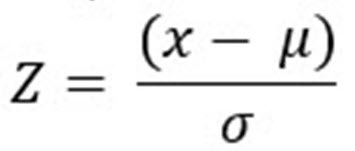

In [ ]:
df['Z-Score']=(df[user_ticker]-df[user_ticker].rolling(window=200).mean())/(df[user_ticker].rolling(window=200).std())
df['Z-Score']=df['Z-Score'].round(4)
df['% Change']=df[user_ticker].pct_change()*100
df.tail(10)

,SPY,Z-Score,% Change
Date,,,
2024-05-31,527.37,1.4631,0.910813
2024-06-03,527.80,1.4586,0.081537
2024-06-04,528.39,1.4588,0.111785
2024-06-05,534.67,1.6120,1.188516
2024-06-06,534.66,1.5928,-0.001870
2024-06-07,534.01,1.5572,-0.121573
2024-06-10,535.66,1.5830,0.308983
2024-06-11,536.95,1.5994,0.240824
2024-06-12,541.36,1.6973,0.821306


In [ ]:
df['Z-Score'].describe()

count    6204.000000
mean        0.688992
std         1.343070
min        -4.957000
25%        -0.155525
50%         1.130500
75%         1.677275
max         3.239100
Name: Z-Score, dtype: float64

## **Probability of being in a Z-score**

We will group the z-score values in subsections:


**Positive Z-Score Subsections**


---


"EXTRAORDINARILY POSITIVE": z > 3.0

"EXTREMELY POSITIVE":  3.0 >= z > 2.5

"VERY POSITIVE":  2.5 >= z > 2.0

"POSITIVE":  2.0 >= z > 1.5

"MODERATELY POSITIVE": 1.5 >= z > 1.0

"FAIRLY POSITIVE": 1.0 >= z > 0.5

"SLIGHTLY POSITIVE": 0.5 >= z >= 0


**Negative Z-Score Subsections**


---
"SLIGHTLY NEGATIVE":  0 > z >= -0.5

"FAIRLY NEGATIVE":  -0.5 > z >= -1.0

"MODERATELY NEGATIVE": - 1.0 > z >= -1.5

"NEGATIVE":  -1.5 > z >= -2.0

"VERY NEGATIVE":  -2.0 > z >= -2.5

"EXTREMELY NEGATIVE":  -2.5 > z >= -3.0

"EXTRAORDINARILY NEGATIVE":   -3.0 > z


In [ ]:
##COUNTS##

##positive counts
extraord_pos_count=0
extremely_pos_count=0
very_pos_count=0
pos_count=0
mod_pos_count=0
fairly_pos_count=0
slightly_pos_count=0

##negative counts
extraord_neg_count=0
extremely_neg_count=0
very_neg_count=0
neg_count=0
mod_neg_count=0
fairly_neg_count=0
slightly_neg_count=0


for score in df['Z-Score']:

  if score>3.0:
    extraord_pos_count+=1

  elif 3.0>=score>2.5:
    extremely_pos_count+=1

  elif 2.5>=score>2.0:
    very_pos_count+=1

  elif 2.0>=score>1.5:
    pos_count+=1

  elif 1.5>=score>1.0:
    mod_pos_count+=1

  elif 1.0>=score>0.5:
    fairly_pos_count+=1

  elif 0.5>=score>=0 :
    slightly_pos_count+=1

  elif 0>score>=-0.5 :
    slightly_neg_count+=1

  elif -0.5>score>=-1.0 :
    fairly_neg_count+=1

  elif -1.0>score>=-1.5 :
    mod_neg_count+=1

  elif -1.5>score>=-2.0 :
    neg_count+=1

  elif -2.0>score>=-2.5 :
    very_neg_count+=1

  elif -2.5>score>=-3.0 :
    extremely_neg_count+=1

  elif -3.0>score :
    extraord_neg_count+=1



##PROBABILITIES##
total_trading_days=df['Z-Score'].notnull().sum()

extraord_pos_prob = ((extraord_pos_count/total_trading_days)*100).round(2)
extremely_pos_prob = ((extremely_pos_count/total_trading_days)*100).round(2)
very_pos_prob = ((very_pos_count/total_trading_days)*100).round(2)
pos_prob=((pos_count/total_trading_days)*100).round(2)
mod_pos_prob=((mod_pos_count/total_trading_days)*100).round(2)
fairly_pos_prob=((fairly_pos_count/total_trading_days)*100).round(2)
slightly_pos_prob=((slightly_pos_count/total_trading_days)*100).round(2)

slightly_neg_prob= ((slightly_neg_count/total_trading_days)*100).round(2)
fairly_neg_prob= ((fairly_neg_count/total_trading_days)*100).round(2)
mod_neg_prob= ((mod_neg_count/total_trading_days)*100).round(2)
neg_prob=((neg_count)/total_trading_days*100).round(2)
very_neg_prob=((very_neg_count/total_trading_days)*100).round(2)
extremely_neg_prob=((extremely_neg_count/total_trading_days)*100).round(2)
extraord_neg_prob=((extraord_neg_count/total_trading_days)*100).round(2)


count    6204.00
mean        0.69
std         1.34
min        -4.96
25%        -0.16
50%         1.13
75%         1.68
max         3.24
Name: Z-Score, dtype: float64
The Mean Z-Score is: 0.69
The Median Z-Score is: 1.13
The 85% HDI is: [-1.1185  2.386 ]


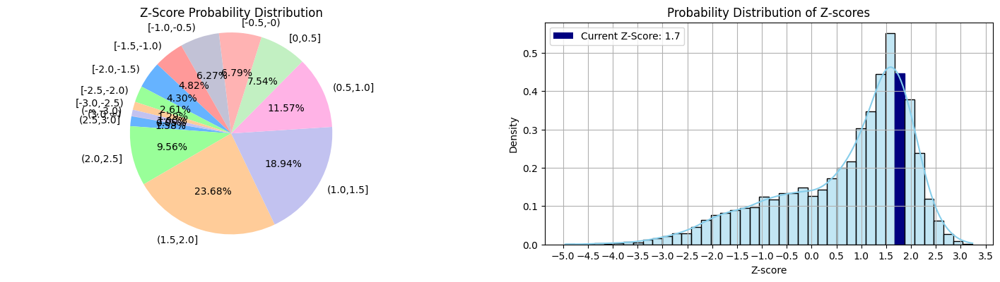

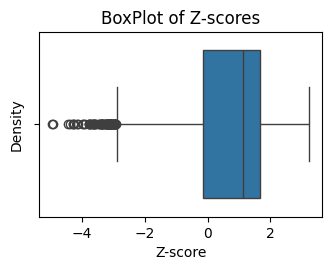

In [ ]:
labels = ['(3.0,∞)', '(2.5,3.0]', '(2.0,2.5]', '(1.5,2.0]', '(1.0,1.5]', '(0.5,1.0]', '[0,0.5]',
          '[-0.5,-0)', '[-1.0,-0.5)', '[-1.5,-1.0)', '[-2.0,-1.5)', '[-2.5,-2.0)', '[-3.0,-2.5)', '(-∞,-3.0)']
sizes = [extraord_pos_prob, extremely_pos_prob, very_pos_prob, pos_prob, mod_pos_prob, fairly_pos_prob, slightly_pos_prob,
         slightly_neg_prob, fairly_neg_prob, mod_neg_prob, neg_prob, very_neg_prob, extremely_neg_prob, extraord_neg_prob]
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#ffb3b3', '#c2c2d6', '#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0']

new_df=(df[df['Z-Score'].notnull()])
z_scores=np.array(new_df['Z-Score'])

print((new_df['Z-Score'].describe()).round(2))
print("The Mean Z-Score is:",np.mean(z_scores).round(2))
print("The Median Z-Score is:",np.median(z_scores).round(2))
hdi = az.hdi(z_scores, hdi_prob=0.85)
print("The 85% HDI is:", hdi)


plt.figure(figsize=(18,9))

plt.subplot(2,2,1)
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.2f%%', startangle=170)
plt.axis('equal')
plt.title('Z-Score Probability Distribution')



plt.subplot(2,2,2)
sns.histplot(z_scores, kde=True, color='skyblue', stat='density')
plt.xlabel('Z-score')
plt.ylabel('Density')
plt.title('Probability Distribution of Z-scores')
plt.grid(True)
plt.xticks(np.arange(np.floor(min(z_scores)), np.ceil(max(z_scores)) + 0.5, 0.5))



# Iterate over bars to highlight the one corresponding to the current z-score
for bar in plt.gca().patches:
    if bar.get_height() > 0 and bar.get_x() <= new_df['Z-Score'][-1] < bar.get_x() + bar.get_width():
        bar.set_color('navy')

plt.bar(0, 0, color='navy', label='Current Z-Score: ' + (new_df['Z-Score'][-1]).round(2).astype(str))


plt.legend()

plt.show()


plt.subplot(2,2,3)



sns.boxplot(z_scores,orient='h')
plt.xlabel('Z-score')
plt.ylabel('Density')
plt.title('BoxPlot of Z-scores')


plt.tight_layout()
plt.show()

## Risk Free Rate
10Y Treasury Yield

In [ ]:
ticker = "^TNX"

data1 = yf.download(ticker, start="2024-05-03", end=datetime.now().date().strftime('%Y-%m-%d'));

risk_free_rate = (data1['Adj Close'].iloc[-1]).round(2)
print("Current risk-free rate:", risk_free_rate.astype(str) + '%')

[*********************100%%**********************]  1 of 1 completed

Current risk-free rate: 4.24%


In [ ]:
def prorate_interest_to_annual(original_rate, number_of_days):
    return (original_rate * number_of_days) / 252

prorated_rate= prorate_interest_to_annual(risk_free_rate,time)                                      ##adjust days based on user input
print("Prorated rate for {time days on an annual basis (252 trading days):", prorated_rate)

Prorated rate for {time days on an annual basis (252 trading days): 0.5047619047619047


# **Monte Carlo Simulation**

Run seperate simulations conditioned on different z-score subsections in order to get EV of acquiring shares at this z-score user=specified days into the future.

## **Cumulative Monte Carlo Simulation**

This ticker traded for: 6174 days
E(% Return in 30 Trading days) =  1.14
Average Maximum Drawdown: -3.66
Worst Case % Return is:  -36.86
Best Case % Return is:  25.68
Average Volaitility in 30 Trading Days is:  0.33
The 90% Confidence VaR (Value at Risk):  -5.52
The 90% Confidence CVaR (Conditional Value at Risk):  -10.57
The 90% Confidence Upside Limit:  6.88
The Average 30 Trading Day Volatility is:  2.06
Sharpe Ratio (Risk Adj Returns):  0.307

EXPECTATION STATS
--------------------------------------------------------
The Mean Expectation is: 1.14
The Median Expectation is: 1.89
The 75% HDI is: [-3.4  7. ]
Skewness: -1.17
Standard deviation: 5.65
Minimum: -36.86
25th percentile (Q1): -1.43
75th percentile (Q3): 4.52
Maximum: 25.68

DRAWDOWN STATS
--------------------------------------------------------
The Mean % Maximum Drawdown is: -3.66
The Median % Maximum Drawdown is: -2.27
The 75% HDI is: [-5.5  1. ]
Skewness: -2.71
Standard deviation: 5.02
Minimum: -38.16
25th percentile (Q1)

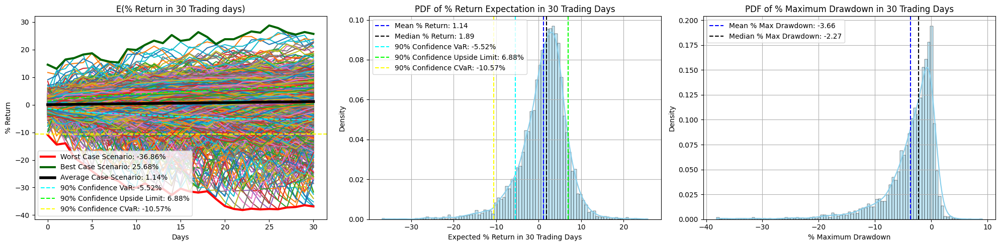

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)

cumu_case_count=0
cumu_sum_of_cases=0
full_array=[]

for i in range(0,new_df['Z-Score'].shape[0]):
    cumu_sum_pct_change= (new_df['% Change'][i:i+(time+1)]).cumsum()
    if len(cumu_sum_pct_change) ==(time + 1):
      cumu_case_count+=1
      days= np.arange(0,len(cumu_sum_pct_change))
      full_array.append(cumu_sum_pct_change)
      newfull_temp_df=pd.DataFrame({'Day': days, '% Return' : cumu_sum_pct_change})
      full_final_return= np.sum(new_df['% Change'][i:i+(time+1)])
      cumu_sum_of_cases+=full_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f"E(% Return in {time} Trading days)")
      plt.plot(newfull_temp_df['Day'],newfull_temp_df['% Return'])




full_avg_case=(cumu_sum_of_cases/cumu_case_count).round(2)
print("This ticker traded for:",cumu_case_count, "days")
print(f"E(% Return in {time} Trading days) = ", full_avg_case)






full_numpy=np.array(full_array).reshape(cumu_case_count,time+1)
full_avg_row=full_numpy.mean(axis=0)
full_mini_row=full_numpy.min(axis=0)
full_maxi_row=full_numpy.max(axis=0)

plt.plot(newfull_temp_df['Day'],full_mini_row,linewidth=3,color='red',label='Worst Case Scenario: '+ (full_numpy[:,time].min().round(2)).astype(str) + '%')
plt.plot(newfull_temp_df['Day'],full_maxi_row, linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (full_numpy[:,time].max().round(2)).astype(str) + '%')

plt.plot(newfull_temp_df['Day'],full_avg_row, linewidth=4, color='k', label= 'Average Case Scenario: '+ (full_numpy[:,time].mean().round(2).astype(str) + '%'))


tempo_array=[]

for i in range(0,full_numpy.shape[1]):
  tempo_array.append(np.percentile(full_numpy[:,i],10).round(2))

np_tempo_array=np.array(tempo_array)

plt.plot(np_tempo_array, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(full_numpy[:,time],10).round(2)).astype(str) + '%')


tempo_upside_array=[]                                                                                                                                      ##super new

for i in range(0,full_numpy.shape[1]):
  tempo_upside_array.append(np.percentile(full_numpy[:,i],90).round(2))

np_tempo_upside_array=np.array(tempo_upside_array)

plt.plot(np_tempo_upside_array, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(full_numpy[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp=[]                                                                                ##super new
counter=0

for row in full_numpy:
    if row[time]<np.percentile(full_numpy[:,time],10):
      cvar_temp.append(row[time])

cvar=np.mean(cvar_temp).round(2)                                                         ##super new


plt.axhline(y=cvar, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar).astype(str) + '%')                           ##super new

print("Average Maximum Drawdown:",((full_numpy.min(axis=1)).mean()).round(2))
print("Worst Case % Return is: ",full_numpy[:,time].min().round(2))
print('Best Case % Return is: ',full_numpy[:,time].max().round(2))
print(f'Average Volaitility in {time} Trading Days is: ', full_avg_row.std().round(2))
print("The 90% Confidence VaR (Value at Risk): ",np.percentile(full_numpy[:,time],10).round(2))  ##new
print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar)                                     ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(full_numpy[:,time],90).round(2))
print(f'The Average {time} Trading Day Volatility is: ',full_numpy.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((full_numpy[:,time].mean()-(prorated_rate))/(full_numpy.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();

plt.subplot(1,3,2)


sns.histplot(full_numpy[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(full_numpy[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((full_numpy[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(full_numpy[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(full_numpy[:,time]), 2)))

plt.axvline(np.percentile(full_numpy[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(full_numpy[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(full_numpy[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(full_numpy[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('--------------------------------------------------------')
print("The Mean Expectation is:",full_numpy[:,time].mean().round(2))
print("The Median Expectation is:", np.median(full_numpy[:,time]).round(2))
hdi = az.hdi(full_numpy[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(full_numpy[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(full_numpy[:,time]).round(2))
print("Minimum:", np.min(full_numpy[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(full_numpy[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(full_numpy[:,time], 75).round(2))
print("Maximum:", np.max(full_numpy[:,time]).round(2))

plt.subplot(1,3,3)

sns.histplot(full_numpy.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(full_numpy.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((full_numpy.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(full_numpy.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(full_numpy.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('--------------------------------------------------------')
print("The Mean % Maximum Drawdown is:",full_numpy.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(full_numpy.min(axis=1)).round(2))
hdi1 = az.hdi(full_numpy.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(full_numpy.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(full_numpy.min(axis=1)).round(2))
print("Minimum:", np.min(full_numpy.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(full_numpy.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(full_numpy.min(axis=1), 75).round(2))
print("Maximum:", np.max(full_numpy.min(axis=1)).round(2))





plt.tight_layout()

plt.show()

# **Monte Carlo Simulation**

Run seperate simulations conditioned on different z-score subsections in order to get EV of acquiring shares at this z-score user-specified days into the future.

### **Positive Z-Score Subsections**


---



"EXTRAORDINARILY POSITIVE": z > 3.0

"EXTREMELY POSITIVE":  3.0 >= z > 2.5

"VERY POSITIVE":  2.5 >= z > 2.0

"POSITIVE":  2.0 >= z > 1.5

"MODERATELY POSITIVE": 1.5 >= z > 1.0

"FAIRLY POSITIVE": 1.0 >= z > 0.5

"SLIGHTLY POSITIVE": 0.5 >= z >= 0

1
--------------------------------------------
This ticker traded over z-score > 3.0 for: 3 days
E(% Return in 30 Trading days | z >3.0) =  3.18
Average Maximum Drawdown: -0.43
Worst Case % Return is:  2.95
Best Case % Return is:  3.58
The 90% Confidence VaR (Value at Risk):  2.96
The 90% Confidence CVaR (Conditional Value at Risk):  2.95
The 90% Confidence Upside Limit:  3.47
The Average 30 Trading Day Volatility is:  1.09
Sharpe Ratio (Risk Adj Returns):  2.452

EXPECTATION STATS
-------------------------
The Mean Expectation is: 3.18
The Median Expectation is: 3.02
The 75% HDI is: [2.9 3.6]
Skewness: 0.67
Standard deviation: 0.28
Minimum: 2.95
25th percentile (Q1): 2.98
75th percentile (Q3): 3.3
Maximum: 3.58

DRAWDOWN STATS
------------------------
The Mean % Maximum Drawdown is: -0.43
The Median % Maximum Drawdown is: -0.37
The 75% HDI is: [-0.8 -0.1]
Skewness: -0.24
Standard deviation: 0.32
Minimum: -0.85
25th percentile (Q1): -0.61
75th percentile (Q3): -0.22
Maximum: -0.06

2
-

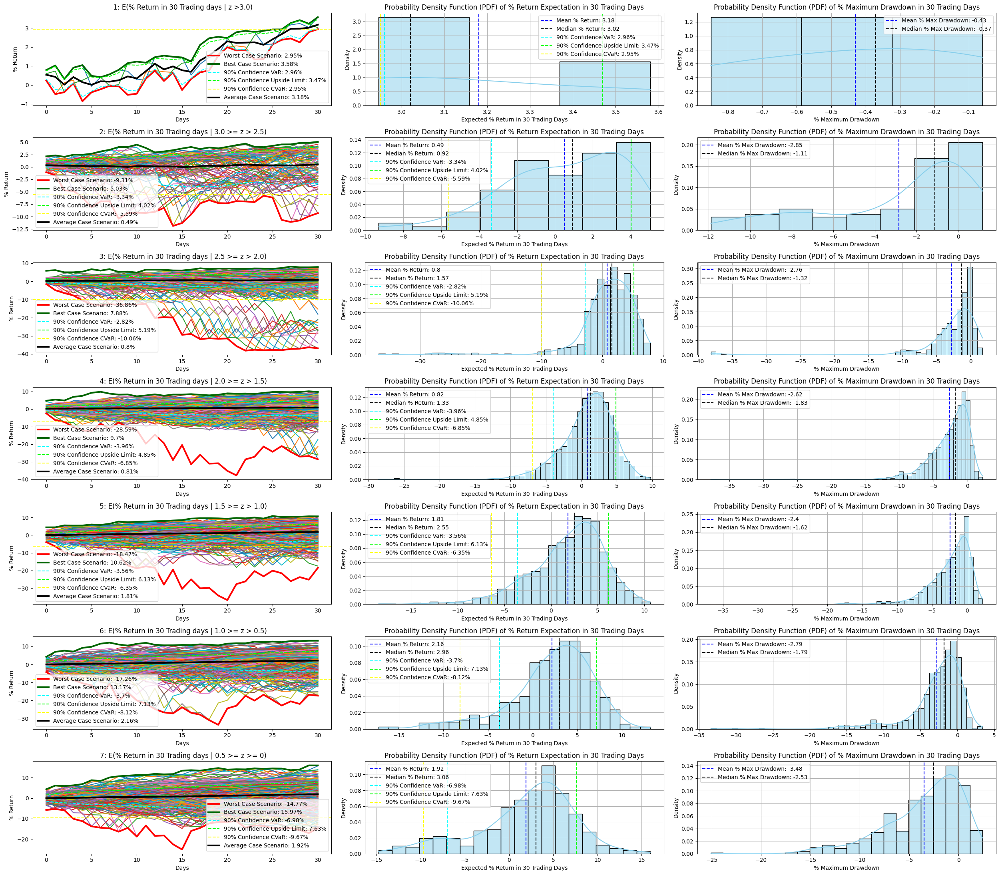

In [ ]:
extraord_sum_of_cases=0
extraord_case_count=0
array=[]
extraord_pos_index=[]
ensured62_case_count=0

plt.figure(figsize=(25,22))
plt.subplot(7, 3, 1)


for i in range(0,new_df['Z-Score'].shape[0]):
  if new_df['Z-Score'][i]>3.0:
    extraord_case_count+=1
    sum_pct_change= (new_df['% Change'][i:i+(time+1)]).cumsum()
    if len(sum_pct_change)==(time+1):
      ensured62_case_count+=1
      extraord_pos_index.append(i)
      days= np.arange(0,len(sum_pct_change))
      array.append(sum_pct_change)
      temp_df=pd.DataFrame({'Day': days, '% Return' : sum_pct_change})
      final_return= np.sum(new_df['% Change'][i:i+(time+1)])
      extraord_sum_of_cases+=final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 1: E(% Return in {time} Trading days | z >3.0)")
      plt.plot(temp_df['Day'],temp_df['% Return'])

avg_case=(extraord_sum_of_cases/ensured62_case_count).round(2)
print("1\n--------------------------------------------")
print("This ticker traded over z-score > 3.0 for:",ensured62_case_count, "days")
print(f"E(% Return in {time} Trading days | z >3.0) = ", avg_case)


x1=np.array(array).reshape(ensured62_case_count,(time+1))
worst_case_return=100000
best_case_return=0
sum_of_maxdrawdown=0
num_of_rows=0

for row in x1:
  num_of_rows+=1
  sum_of_maxdrawdown+=row.min()
  if worst_case_return> row[time]:
    stored_worst_row=row[0:(time+1)]
    worst_case_return=row[time]

  if best_case_return < row[time]:
    stored_best_row=row[0:(time + 1)]
    best_case_return=row[time]

avg_maxdrawdown=(sum_of_maxdrawdown/num_of_rows).round(2)
print("Average Maximum Drawdown:",avg_maxdrawdown)
print("Worst Case % Return is: ",worst_case_return.round(2))
print('Best Case % Return is: ',best_case_return.round(2))

plt.plot(temp_df['Day'],x1.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x1.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best_case_return.round(2)).astype(str) + '%')

tempo_array1=[]                                                                                                                                                     ##new


for i in range(0,x1.shape[1]):
  tempo_array1.append(np.percentile(x1[:,i],10).round(2))

np_tempo_array1=np.array(tempo_array1)

plt.plot(np_tempo_array1, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x1[:,time],10).round(2)).astype(str) + '%')                        ##new


tempo_upside_array1=[]                                                                                                                                      ##super new

for i in range(0,x1.shape[1]):
  tempo_upside_array1.append(np.percentile(x1[:,i],90).round(2))

np_tempo_upside_array1=np.array(tempo_upside_array1)

plt.plot(np_tempo_upside_array1, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x1[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp1=[]                                                                                ##super new
counter1=0

for row in x1:
    if row[time]<np.percentile(x1[:,time],10):
      cvar_temp1.append(row[time])

cvar1=np.mean(cvar_temp1).round(2)                                                         ##super new


plt.axhline(y=cvar1, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar1).astype(str) + '%')                           ##super new


avg_stored_row= x1.mean(axis=0)
plt.plot(temp_df['Day'],avg_stored_row, linewidth=3,color='k', label= 'Average Case Scenario: '+ (avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x1[:,time],10).round(2))  ##new
print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar1)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x1[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x1.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x1[:,time].mean()-(prorated_rate))/(x1.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();


plt.subplot(7,3,2)


sns.histplot(x1[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x1[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x1[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x1[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x1[:,time]), 2)))

plt.axvline(np.percentile(x1[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x1[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x1[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x1[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar1, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar1).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x1[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x1[:,time]).round(2))
hdi = az.hdi(x1[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x1[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(x1[:,time]).round(2))
print("Minimum:", np.min(x1[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(x1[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x1[:,time], 75).round(2))
print("Maximum:", np.max(x1[:,time]).round(2))


plt.subplot(7,3,3)

sns.histplot(x1.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x1.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x1.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x1.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x1.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x1.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x1.min(axis=1)).round(2))
hdi1 = az.hdi(x1.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x1.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x1.min(axis=1)).round(2))
print("Minimum:", np.min(x1.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x1.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x1.min(axis=1), 75).round(2))
print("Maximum:", np.max(x1.min(axis=1)).round(2))



####################################################################################################################################################################################


plt.subplot(7, 3, 4)
extreme_sum_of_cases=0
extreme_case_count=0
array1=[]
ensured91_case_count=0

extreme_pos_index=[]


for i in range(0,new_df['Z-Score'].shape[0]):
  if 3.0 >= new_df['Z-Score'][i] > 2.5 :
    extreme_case_count+=1
    extreme_sum_pct_change= (new_df['% Change'][i:i+(time+1)]).cumsum()
    if len(extreme_sum_pct_change)==(time+1):
      ensured91_case_count+=1
      extreme_pos_index.append(i)
      days= np.arange(0,len(extreme_sum_pct_change))
      array1.append(extreme_sum_pct_change)
      new_temp_df=pd.DataFrame({'Day': days, '% Return' : extreme_sum_pct_change})
      extreme_final_return= np.sum(new_df['% Change'][i:i+(time+1)])
      extreme_sum_of_cases+=extreme_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 2: E(% Return in {time} Trading days | 3.0 >= z > 2.5)")
      plt.plot(new_temp_df['Day'],new_temp_df['% Return'])

new_avg_case=(extreme_sum_of_cases/ensured91_case_count).round(2)
print("\n2\n--------------------------------------------")
print("This ticker traded between 3.0 >= z-score > 2.5 for:",ensured91_case_count, "days")
print(f"E(% Return in {time} Trading days | 3.0 >= z > 2.5) = ", new_avg_case)


x2=np.array(array1).reshape(ensured91_case_count,time+1)
worst1_case_return=100000
best1_case_return=0
sum1_of_maxdrawdown=0
num1_of_rows=0

for row in x2:
  num1_of_rows+=1
  sum1_of_maxdrawdown+=row.min()
  if worst1_case_return> row[time]:
    stored1_worst_row=row[0:(time+1)]
    worst1_case_return=row[time]

  if best1_case_return < row[time]:
    stored1_best_row=row[0:(time+1)]
    best1_case_return=row[time]

avg1_maxdrawdown=(sum1_of_maxdrawdown/num1_of_rows).round(2)
print("Average Maximum Drawdown:",avg1_maxdrawdown)
print("Worst Case % Return is: ",worst1_case_return.round(2))
print('Best Case % Return is: ',best1_case_return.round(2))

plt.plot(temp_df['Day'],x2.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst1_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x2.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best1_case_return.round(2)).astype(str) + '%')


tempo_array2=[]                                                                                                                                                     ##new


for i in range(0,x2.shape[1]):
  tempo_array2.append(np.percentile(x2[:,i],10).round(2))

np_tempo_array2=np.array(tempo_array2)

plt.plot(np_tempo_array2, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x2[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array2=[]                                                                                                                                      ##super new

for i in range(0,x2.shape[1]):
  tempo_upside_array2.append(np.percentile(x2[:,i],90).round(2))

np_tempo_upside_array2=np.array(tempo_upside_array2)

plt.plot(np_tempo_upside_array2, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x2[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp2=[]                                                                                ##super new

for row in x2:
    if row[time]<np.percentile(x2[:,time],10):
      cvar_temp2.append(row[time])

cvar2=np.mean(cvar_temp2).round(2)                                                         ##super new


plt.axhline(y=cvar2, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar2).astype(str) + '%')                           ##super new

avg1_stored_row= x2.mean(axis=0)
plt.plot(temp_df['Day'],avg1_stored_row, linewidth=3, color='k', label= 'Average Case Scenario: '+ (new_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x2[:,time],10).round(2))  ##new
print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar2)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x2[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x2.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x2[:,time].mean()-(prorated_rate))/(x2.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();

plt.subplot(7,3,5)


sns.histplot(x2[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x2[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x2[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x2[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x2[:,time]), 2)))

plt.axvline(np.percentile(x2[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x2[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x2[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x2[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar2, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar2).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x2[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x2[:,time]).round(2))
hdi = az.hdi(x2[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x2[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(x2[:,time]).round(2))
print("Minimum:", np.min(x2[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(x2[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x2[:,time], 75).round(2))
print("Maximum:", np.max(x2[:,time]).round(2))


plt.subplot(7,3,6)

sns.histplot(x2.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x2.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x2.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x2.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x2.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x2.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x2.min(axis=1)).round(2))
hdi1 = az.hdi(x2.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x2.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x2.min(axis=1)).round(2))
print("Minimum:", np.min(x2.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x2.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x2.min(axis=1), 75).round(2))
print("Maximum:", np.max(x2.min(axis=1)).round(2))

#####################################################################################################################################################################################################

plt.subplot(7, 3, 7)
verypos_sum_of_cases=0
verypos_case_count=0
array2=[]
ensured21_case_count=0

verypos_index=[]


for i in range(0,new_df['Z-Score'].shape[0]):
  if 2.5 >= new_df['Z-Score'][i] > 2.0 :
    verypos_case_count+=1
    verypos_sum_pct_change= (new_df['% Change'][i:i+(time+1)]).cumsum()
    if len(verypos_sum_pct_change)==(time+1):
      ensured21_case_count+=1
      verypos_index.append(i)
      days= np.arange(0,len(verypos_sum_pct_change))
      array2.append(verypos_sum_pct_change)
      new1_temp_df=pd.DataFrame({'Day': days, '% Return' : verypos_sum_pct_change})
      verypos_final_return= np.sum(new_df['% Change'][i:i+(time+1)])
      verypos_sum_of_cases+=verypos_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 3: E(% Return in {time} Trading days | 2.5 >= z > 2.0)")
      plt.plot(new1_temp_df['Day'],new1_temp_df['% Return'])

new1_avg_case=(verypos_sum_of_cases/ensured21_case_count).round(2)
print("\n3\n--------------------------------------------")
print("This ticker traded between 2.5 >= z-score > 2.0 for:",ensured21_case_count, "days")
print(f"E(% Return in {time} Trading days | 2.5 >= z > 2.0) = ", new1_avg_case)


x3=np.array(array2).reshape(ensured21_case_count,time+1)
worst2_case_return=100000
best2_case_return=0
sum2_of_maxdrawdown=0
num2_of_rows=0

for row in x3:
  num2_of_rows+=1
  sum2_of_maxdrawdown+=row.min()
  if worst2_case_return> row[time]:
    stored2_worst_row=row[0:(time+1)]
    worst2_case_return=row[time]

  if best2_case_return < row[time]:
    stored2_best_row=row[0:(time+1)]
    best2_case_return=row[time]

avg2_maxdrawdown=(sum2_of_maxdrawdown/num2_of_rows).round(2)
print("Average Maximum Drawdown:",avg2_maxdrawdown)
print("Worst Case % Return is: ",worst2_case_return.round(2))
print('Best Case % Return is: ',best2_case_return.round(2))

plt.plot(temp_df['Day'],x3.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst2_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x3.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best2_case_return.round(2)).astype(str) + '%')

tempo_array3=[]                                                                                                                                                     ##new


for i in range(0,x3.shape[1]):
  tempo_array3.append(np.percentile(x3[:,i],10).round(2))

np_tempo_array3=np.array(tempo_array3)

plt.plot(np_tempo_array3, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x3[:,time],10).round(2)).astype(str) + '%')                        ##new


tempo_upside_array3=[]                                                                                                                                      ##super new

for i in range(0,x3.shape[1]):
  tempo_upside_array3.append(np.percentile(x3[:,i],90).round(2))

np_tempo_upside_array3=np.array(tempo_upside_array3)

plt.plot(np_tempo_upside_array3, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x3[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp3=[]                                                                                ##super new

for row in x3:
    if row[time]<np.percentile(x3[:,time],10):
      cvar_temp3.append(row[time])

cvar3=np.mean(cvar_temp3).round(2)                                                         ##super new


plt.axhline(y=cvar3, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar3).astype(str) + '%')                           ##super new

avg2_stored_row= x3.mean(axis=0)
plt.plot(temp_df['Day'],avg2_stored_row, linewidth=3, color='k', label= 'Average Case Scenario: '+ (new1_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x3[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar3)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x3[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x3.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x3[:,time].mean()-(prorated_rate))/(x3.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();

plt.subplot(7,3,8)


sns.histplot(x3[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x3[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x3[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x3[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x3[:,time]), 2)))

plt.axvline(np.percentile(x3[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x3[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x3[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x3[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar3, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar3).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x3[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x3[:,time]).round(2))
hdi = az.hdi(x3[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x3[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(x3[:,time]).round(2))
print("Minimum:", np.min(x3[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(x3[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x3[:,time], 75).round(2))
print("Maximum:", np.max(x3[:,time]).round(2))


plt.subplot(7,3,9)

sns.histplot(x3.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x3.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x3.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x3.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x3.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x3.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x3.min(axis=1)).round(2))
hdi1 = az.hdi(x3.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x3.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x3.min(axis=1)).round(2))
print("Minimum:", np.min(x3.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x3.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x3.min(axis=1), 75).round(2))
print("Maximum:", np.max(x3.min(axis=1)).round(2))



#########################################################################################################################################################################################################

plt.subplot(7, 3, 10)
pos_sum_of_cases=0
pos_case_count=0
array3=[]
ensured_case_count=0

pos_index=[]

for i in range(0,new_df['Z-Score'].shape[0]):
  if 2.0 >= new_df['Z-Score'][i] > 1.5 :
    pos_case_count+=1
    pos_sum_pct_change= (new_df['% Change'][i:i+(time+1)]).cumsum()
    if len(pos_sum_pct_change) ==(time + 1):
      ensured_case_count+=1
      days= np.arange(0,len(pos_sum_pct_change))
      pos_index.append(i)
      array3.append(pos_sum_pct_change)
      new2_temp_df=pd.DataFrame({'Day': days, '% Return' : pos_sum_pct_change})
      pos_final_return= np.sum(new_df['% Change'][i:i+(time+1)])
      pos_sum_of_cases+=pos_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 4: E(% Return in {time} Trading days | 2.0 >= z > 1.5)")
      plt.plot(new2_temp_df['Day'],new2_temp_df['% Return'])

new2_avg_case=(pos_sum_of_cases/pos_case_count).round(2)
print("\n4\n--------------------------------------------")
print("This ticker traded between 2.0 >= z-score > 1.5 for:",ensured_case_count, "days")
print(f"E(% Return in {time} Trading days | 2.0 >= z > 1.5) = ", new2_avg_case)


x4=np.array(array3).reshape(ensured_case_count,time+1)
worst3_case_return=100000
best3_case_return=0
sum3_of_maxdrawdown=0
num3_of_rows=0

for row in x4:
  num3_of_rows+=1
  sum3_of_maxdrawdown+=row.min()
  if worst3_case_return> row[time]:
    stored3_worst_row=row[0:(time+1)]
    worst3_case_return=row[time]

  if best3_case_return < row[time]:
    stored3_best_row=row[0:(time+1)]
    best3_case_return=row[time]

avg3_maxdrawdown=(sum3_of_maxdrawdown/num3_of_rows).round(2)
print("Average Maximum Drawdown:",avg3_maxdrawdown)
print("Worst Case % Return is: ",worst3_case_return.round(2))
print('Best Case % Return is: ',best3_case_return.round(2))

plt.plot(temp_df['Day'],x4.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst3_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x4.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best3_case_return.round(2)).astype(str) + '%')

tempo_array4=[]                                                                                                                                                     ##new


for i in range(0,x4.shape[1]):
  tempo_array4.append(np.percentile(x4[:,i],10).round(2))

np_tempo_array4=np.array(tempo_array4)

plt.plot(np_tempo_array4, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x4[:,time],10).round(2)).astype(str) + '%')  #new


tempo_upside_array4=[]                                                                                                                                      ##super new

for i in range(0,x4.shape[1]):
  tempo_upside_array4.append(np.percentile(x4[:,i],90).round(2))

np_tempo_upside_array4=np.array(tempo_upside_array4)

plt.plot(np_tempo_upside_array4, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x4[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp4=[]                                                                                ##super new

for row in x4:
    if row[time]<np.percentile(x4[:,time],10):
      cvar_temp4.append(row[time])

cvar4=np.mean(cvar_temp4).round(2)                                                         ##super new


plt.axhline(y=cvar4, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar4).astype(str) + '%')                           ##super new



avg3_stored_row= x4.mean(axis=0)
plt.plot(temp_df['Day'],avg3_stored_row, linewidth=3, color='k', label= 'Average Case Scenario: '+ (new2_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x4[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar4)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x4[:,time],90).round(2))                                     ##super new

print(f'The Average {time} Trading Day Volatility is: ',x4.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x4[:,time].mean()-(prorated_rate))/(x4.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();


plt.subplot(7,3,11)


sns.histplot(x4[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x4[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x4[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x4[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x4[:,time]), 2)))

plt.axvline(np.percentile(x4[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x4[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x4[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x4[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar4, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar4).astype(str) + '%')   ##super new



plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x4[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x4[:,time]).round(2))
hdi = az.hdi(x4[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x4[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(x4[:,time]).round(2))
print("Minimum:", np.min(x4[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(x4[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x4[:,time], 75).round(2))
print("Maximum:", np.max(x4[:,time]).round(2))


plt.subplot(7,3,12)

sns.histplot(x4.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x4.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x4.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x4.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x4.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x4.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x4.min(axis=1)).round(2))
hdi1 = az.hdi(x4.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x4.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x4.min(axis=1)).round(2))
print("Minimum:", np.min(x4.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x4.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x4.min(axis=1), 75).round(2))
print("Maximum:", np.max(x4.min(axis=1)).round(2))


#################################################################################################################################################################################################


plt.subplot(7, 3, 13)
mod_pos_sum_of_cases=0
mod_pos_case_count=0
array4=[]
ensured1_case_count=0

mod_pos_index=[]

for i in range(0,new_df['Z-Score'].shape[0]):
  if 1.5 >= new_df['Z-Score'][i] > 1.0 :
    mod_pos_case_count+=1
    mod_pos_sum_pct_change= (new_df['% Change'][i:i+(time+1)]).cumsum()
    if len(mod_pos_sum_pct_change)==(time + 1):
      ensured1_case_count+=1
      days= np.arange(0,len(mod_pos_sum_pct_change))
      mod_pos_index.append(i)
      array4.append(mod_pos_sum_pct_change)
      new3_temp_df=pd.DataFrame({'Day': days, '% Return' : mod_pos_sum_pct_change})
      mod_pos_final_return= np.sum(new_df['% Change'][i:i+(time+1)])
      mod_pos_sum_of_cases+=mod_pos_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 5: E(% Return in {time} Trading days | 1.5 >= z > 1.0)")
      plt.plot(new3_temp_df['Day'],new3_temp_df['% Return'])

new3_avg_case=(mod_pos_sum_of_cases/ensured1_case_count).round(2)
print("\n5\n--------------------------------------------")
print("This ticker traded between 1.5 >= z-score > 1.0 for:",ensured1_case_count, "days")
print(f"E(% Return in {time} Trading days | 1.5 >= z > 1.0) = ", new3_avg_case)

x5=np.array(array4).reshape(ensured1_case_count,(time+1))
worst4_case_return=100000
best4_case_return=0
sum4_of_maxdrawdown=0
num4_of_rows=0

for row in x5:
  num4_of_rows+=1
  sum4_of_maxdrawdown+=row.min()
  if worst4_case_return> row[time]:
    stored4_worst_row=row[0:(time+1)]
    worst4_case_return=row[time]

  if best4_case_return < row[time]:
    stored4_best_row=row[0:(time + 1)]
    best4_case_return=row[time]

avg4_maxdrawdown=(sum4_of_maxdrawdown/num4_of_rows).round(2)
print("Average Maximum Drawdown:",avg4_maxdrawdown)
print("Worst Case % Return is: ",worst4_case_return.round(2))
print('Best Case % Return is: ',best4_case_return.round(2))

plt.plot(temp_df['Day'],x5.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst4_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x5.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best4_case_return.round(2)).astype(str) + '%')


tempo_array5=[]                                                                                                                                                     ##new


for i in range(0,x5.shape[1]):
  tempo_array5.append(np.percentile(x5[:,i],10).round(2))

np_tempo_array5=np.array(tempo_array5)

plt.plot(np_tempo_array5, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x5[:,time],10).round(2)).astype(str) + '%')                        ##new


tempo_upside_array5=[]                                                                                                                                      ##super new

for i in range(0,x5.shape[1]):
  tempo_upside_array5.append(np.percentile(x5[:,i],90).round(2))

np_tempo_upside_array5=np.array(tempo_upside_array5)

plt.plot(np_tempo_upside_array5, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x5[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp5=[]                                                                                ##super new

for row in x5:
    if row[time]<np.percentile(x5[:,time],10):
      cvar_temp5.append(row[time])

cvar5=np.mean(cvar_temp5).round(2)                                                         ##super new


plt.axhline(y=cvar5, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar5).astype(str) + '%')                           ##super new

avg4_stored_row= x5.mean(axis=0)
plt.plot(temp_df['Day'],avg4_stored_row, linewidth=3, color='k', label= 'Average Case Scenario: '+ (new3_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x5[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar5)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x5[:,time],90).round(2))                                     ##super new

print(f'The Average {time} Trading Day Volatility is: ',x5.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x5[:,time].mean()-(prorated_rate))/(x5.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();


plt.subplot(7,3,14)


sns.histplot(x5[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x5[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x5[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x5[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x5[:,time]), 2)))

plt.axvline(np.percentile(x5[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x5[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x5[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x5[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar5, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar5).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x5[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x5[:,time]).round(2))
hdi = az.hdi(x5[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x5[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(x5[:,time]).round(2))
print("Minimum:", np.min(x5[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(x5[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x5[:,time], 75).round(2))
print("Maximum:", np.max(x5[:,time]).round(2))


plt.subplot(7,3,15)

sns.histplot(x5.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x5.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x5.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x5.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x5.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x5.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x5.min(axis=1)).round(2))
hdi1 = az.hdi(x5.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x5.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x5.min(axis=1)).round(2))
print("Minimum:", np.min(x5.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x5.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x5.min(axis=1), 75).round(2))
print("Maximum:", np.max(x5.min(axis=1)).round(2))

#############################################################################################################################################################################################################


plt.subplot(7, 3, 16)
fair_pos_sum_of_cases=0
fair_pos_case_count=0
array5=[]
ensured2_case_count=0

fair_pos_index=[]

for i in range(0,new_df['Z-Score'].shape[0]):
  if 1.0 >= new_df['Z-Score'][i] > 0.5 :
    fair_pos_case_count+=1
    fair_pos_sum_pct_change= (new_df['% Change'][i:i+(time + 1)]).cumsum()
    if len(fair_pos_sum_pct_change) == (time + 1):
      ensured2_case_count+=1
      days= np.arange(0,len(fair_pos_sum_pct_change))
      fair_pos_index.append(i)
      array5.append(fair_pos_sum_pct_change)
      new4_temp_df=pd.DataFrame({'Day': days, '% Return' : fair_pos_sum_pct_change})
      fair_pos_final_return= np.sum(new_df['% Change'][i:i+(time+1)])
      fair_pos_sum_of_cases+=fair_pos_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 6: E(% Return in {time} Trading days | 1.0 >= z > 0.5)")
      plt.plot(new4_temp_df['Day'],new4_temp_df['% Return'])

new4_avg_case=(fair_pos_sum_of_cases/ensured2_case_count).round(2)
print("\n6\n--------------------------------------------")
print("This ticker traded between 1.0 >= z-score > 0.5 for:",ensured2_case_count, "days")
print(f"E(% Return in {time} Trading days | 1.0 >= z > 0.5) = ", new4_avg_case)

x6=np.array(array5).reshape(ensured2_case_count,(time+1))
worst5_case_return=100000
best5_case_return=0
sum5_of_maxdrawdown=0
num5_of_rows=0

for row in x6:
  num5_of_rows+=1
  sum5_of_maxdrawdown+=row.min()
  if worst5_case_return> row[time]:
    stored5_worst_row=row[0:(time + 1)]
    worst5_case_return=row[time]

  if best5_case_return < row[time]:
    stored5_best_row=row[0:(time + 1)]
    best5_case_return=row[time]

avg5_maxdrawdown=(sum5_of_maxdrawdown/num5_of_rows).round(2)
print("Average Maximum Drawdown:",avg5_maxdrawdown)
print("Worst Case % Return is: ",worst5_case_return.round(2))
print('Best Case % Return is: ',best5_case_return.round(2))

plt.plot(temp_df['Day'],x6.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst5_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x6.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best5_case_return.round(2)).astype(str) + '%')

tempo_array6=[]                                                                                                                                                     ##new


for i in range(0,x6.shape[1]):
  tempo_array6.append(np.percentile(x6[:,i],10).round(2))

np_tempo_array6=np.array(tempo_array6)

plt.plot(np_tempo_array6, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x6[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array6=[]                                                                                                                                      ##super new

for i in range(0,x6.shape[1]):
  tempo_upside_array6.append(np.percentile(x6[:,i],90).round(2))

np_tempo_upside_array6=np.array(tempo_upside_array6)

plt.plot(np_tempo_upside_array6, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x6[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp6=[]                                                                                ##super new

for row in x6:
    if row[time]<np.percentile(x6[:,time],10):
      cvar_temp6.append(row[time])

cvar6=np.mean(cvar_temp6).round(2)                                                         ##super new


plt.axhline(y=cvar6, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar6).astype(str) + '%')                           ##super new

avg5_stored_row= x6.mean(axis=0)
plt.plot(temp_df['Day'],avg5_stored_row, linewidth=3, color='k', label= 'Average Case Scenario: '+ (new4_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x6[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar6)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x6[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x6.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x6[:,time].mean()-(prorated_rate))/(x6.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();


plt.subplot(7,3,17)


sns.histplot(x6[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x6[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x6[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x6[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x6[:,time]), 2)))

plt.axvline(np.percentile(x6[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x6[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x6[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x6[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar6, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar6).astype(str) + '%')   ##super new


plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x6[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x6[:,time]).round(2))
hdi = az.hdi(x6[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x6[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(x6[:,time]).round(2))
print("Minimum:", np.min(x6[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(x6[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x6[:,time], 75).round(2))
print("Maximum:", np.max(x6[:,time]).round(2))


plt.subplot(7,3,18)

sns.histplot(x6.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x6.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x6.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x6.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x6.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x6.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x6.min(axis=1)).round(2))
hdi1 = az.hdi(x6.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x6.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x6.min(axis=1)).round(2))
print("Minimum:", np.min(x6.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x6.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x6.min(axis=1), 75).round(2))
print("Maximum:", np.max(x6.min(axis=1)).round(2))
#################################################################################################################################################################################################################

plt.subplot(7, 3, 19)
slight_pos_sum_of_cases=0
slight_pos_case_count=0

array6=[]
ensured3_case_count=0

slight_pos_index=[]


for i in range(0,new_df['Z-Score'].shape[0]):
  if 0.5 >= new_df['Z-Score'][i] >= 0 :
    slight_pos_case_count+=1
    slight_pos_sum_pct_change= (new_df['% Change'][i:i+(time+1)]).cumsum()
    if len(slight_pos_sum_pct_change)==(time+1):
      ensured3_case_count+=1
      days= np.arange(0,len(slight_pos_sum_pct_change))
      slight_pos_index.append(i)
      array6.append(slight_pos_sum_pct_change)
      new5_temp_df=pd.DataFrame({'Day': days, '% Return' : slight_pos_sum_pct_change})
      slight_pos_final_return= np.sum(new_df['% Change'][i:i+(time+1)])
      slight_pos_sum_of_cases+=slight_pos_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 7: E(% Return in {time} Trading days | 0.5 >= z >= 0)")
      plt.plot(new5_temp_df['Day'],new5_temp_df['% Return'])

new5_avg_case=(slight_pos_sum_of_cases/ensured3_case_count).round(2)
print("\n\n7\n--------------------------------------------")
print("This ticker traded between 0.5 >= z-score >= 0 for:",ensured3_case_count, "days")
print(f"E(% Return in {time} Trading days | 0.5 >= z >= 0) = ", new5_avg_case)

x7=np.array(array6).reshape(ensured3_case_count,time + 1)
worst6_case_return=100000
best6_case_return=0
sum6_of_maxdrawdown=0
num6_of_rows=0

for row in x7:
  num6_of_rows+=1
  sum6_of_maxdrawdown+=row.min()
  if worst6_case_return> row[time]:
    stored6_worst_row=row[0:(time + 1)]
    worst6_case_return=row[time]

  if best6_case_return < row[time]:
    stored6_best_row=row[0:(time + 1)]
    best6_case_return=row[time]

avg6_maxdrawdown=(sum6_of_maxdrawdown/num6_of_rows).round(2)
print("Average Maximum Drawdown:",avg6_maxdrawdown)
print("Worst Case % Return is: ",worst6_case_return.round(2))
print('Best Case % Return is: ',best6_case_return.round(2))

plt.plot(temp_df['Day'],x7.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst6_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x7.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best6_case_return.round(2)).astype(str) + '%')

tempo_array7=[]                                                                                                                                                     ##new


for i in range(0,x7.shape[1]):
  tempo_array7.append(np.percentile(x7[:,i],10).round(2))

np_tempo_array7=np.array(tempo_array7)

plt.plot(np_tempo_array7, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x7[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array7=[]                                                                                                                                      ##super new

for i in range(0,x7.shape[1]):
  tempo_upside_array7.append(np.percentile(x7[:,i],90).round(2))

np_tempo_upside_array7=np.array(tempo_upside_array7)

plt.plot(np_tempo_upside_array7, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x7[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp7=[]                                                                                ##super new

for row in x7:
    if row[time]<np.percentile(x7[:,time],10):
      cvar_temp7.append(row[time])

cvar7=np.mean(cvar_temp7).round(2)                                                         ##super new


plt.axhline(y=cvar7, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar7).astype(str) + '%')                           ##super new

avg6_stored_row= x7.mean(axis=0)
plt.plot(temp_df['Day'],avg6_stored_row, linewidth=3, color='k', label= 'Average Case Scenario: '+ (new5_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x7[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar7)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x7[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x7.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x7[:,time].mean()-(prorated_rate))/(x7.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();



plt.subplot(7,3,20)


sns.histplot(x7[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x7[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x7[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x7[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x7[:,time]), 2)))

plt.axvline(np.percentile(x7[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x7[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x7[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x7[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar7, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar7).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x7[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x7[:,time]).round(2))
hdi = az.hdi(x7[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x7[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(x7[:,time]).round(2))
print("Minimum:", np.min(x7[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(x7[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x7[:,time], 75).round(2))
print("Maximum:", np.max(x7[:,time]).round(2))


plt.subplot(7,3,21)

sns.histplot(x7.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x7.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x7.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x7.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x7.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x7.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x7.min(axis=1)).round(2))
hdi1 = az.hdi(x7.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x7.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x7.min(axis=1)).round(2))
print("Minimum:", np.min(x7.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x7.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x7.min(axis=1), 75).round(2))
print("Maximum:", np.max(x7.min(axis=1)).round(2))

plt.tight_layout();
plt.show()




### **Negative Z-Score Subsections**


---
"SLIGHTLY NEGATIVE":  0 > z >= -0.5

"FAIRLY NEGATIVE":  -0.5 > z >= -1.0

"MODERATELY NEGATIVE": - 1.0 > z >= -1.5

"NEGATIVE":  -1.5 > z >= -2.0

"VERY NEGATIVE":  -2.0 > z >= -2.5

"EXTREMELY NEGATIVE":  -2.5 > z >= -3.0

"EXTRAORDINARILY NEGATIVE":   -3.0 > z


1
--------------------------------------------------------
This ticker traded between 0 > z-score >= -0.5 for: 421 days
E(% Return in 30 Trading days | 0 > z >= -0.5) =  0.26
Average Maximum Drawdown: -4.75
Worst Case % Return is:  -17.0
Best Case % Return is:  12.97
The 90% Confidence VaR (Value at Risk):  -8.36
The 90% Confidence CVaR (Conditional Value at Risk):  -10.8
The 90% Confidence Upside Limit:  7.81
The Average 30 Trading Day Volatility is:  2.4
Sharpe Ratio (Risk Adj Returns):  -0.1

EXPECTATION STATS
-------------------------
The Mean Expectation is: 0.26
The Median Expectation is: 0.78
The 75% HDI is: [-5.8  8.2]
Skewness: -0.31
Standard deviation: 6.04
Minimum: -17.0
25th percentile (Q1): -3.95
75th percentile (Q3): 4.88
Maximum: 12.97

DRAWDOWN STATS
------------------------
The Mean % Maximum Drawdown is: -4.75
The Median % Maximum Drawdown is: -3.9
The 75% HDI is: [-7.9  0.5]
Skewness: -1.75
Standard deviation: 4.91
Minimum: -30.77
25th percentile (Q1): -7.03
75th pe

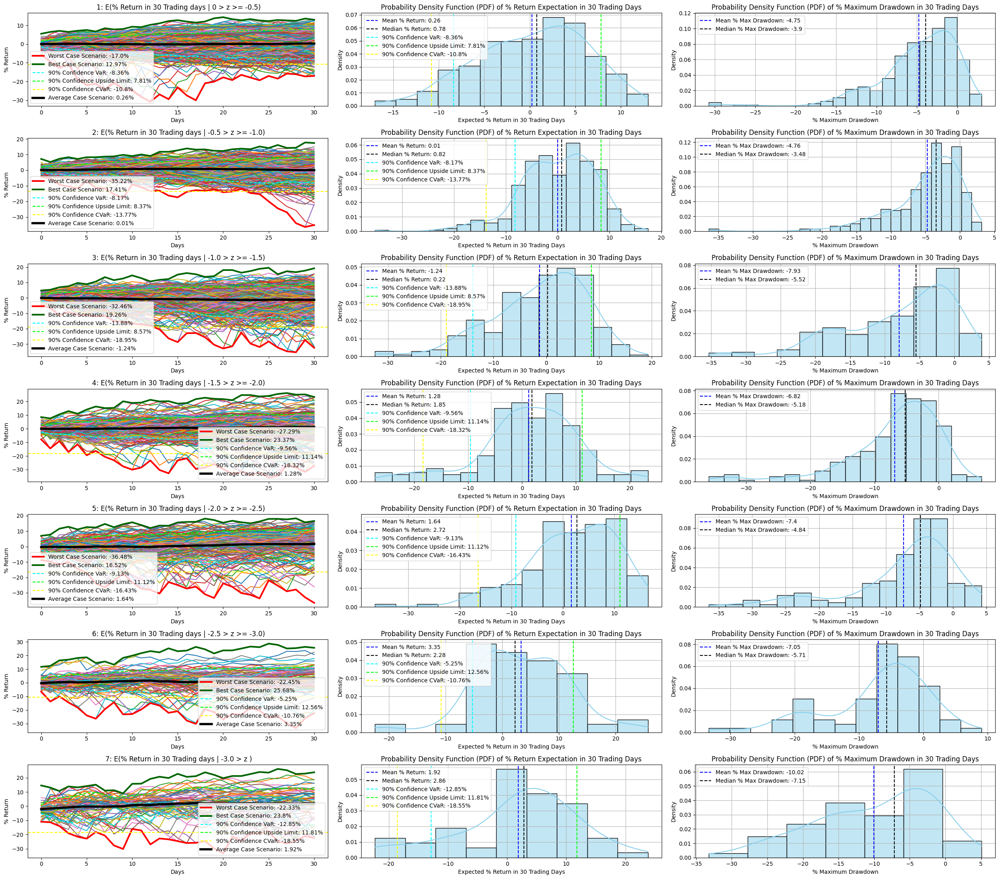

In [ ]:
plt.figure(figsize=(25,22))

plt.subplot(7, 3, 1)
slight_neg_sum_of_cases=0
slight_neg_case_count=0

array7=[]
ensured4_case_count=0

slight_neg_index=[]


for i in range(0,new_df['Z-Score'].shape[0]):
  if 0 > new_df['Z-Score'][i] >= -0.5 :
    slight_neg_case_count+=1
    slight_neg_sum_pct_change= (new_df['% Change'][i:i+(time+1)]).cumsum()
    if len(slight_neg_sum_pct_change)==(time + 1):
      ensured4_case_count+=1
      array7.append(slight_neg_sum_pct_change)
      slight_neg_index.append(i)
      days= np.arange(0,len(slight_neg_sum_pct_change))
      new6_temp_df=pd.DataFrame({'Day': days, '% Return' : slight_neg_sum_pct_change})
      slight_neg_final_return= np.sum(new_df['% Change'][i:i+(time + 1)])
      slight_neg_sum_of_cases+=slight_neg_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 1: E(% Return in {time} Trading days | 0 > z >= -0.5)")
      plt.plot(new6_temp_df['Day'],new6_temp_df['% Return'])

new6_avg_case=(slight_neg_sum_of_cases/ensured4_case_count).round(2)
print("\n1\n--------------------------------------------------------")
print("This ticker traded between 0 > z-score >= -0.5 for:",ensured4_case_count, "days")
print(f"E(% Return in {time} Trading days | 0 > z >= -0.5) = ", new6_avg_case)


x8=np.array(array7).reshape(ensured4_case_count,time + 1)
worst7_case_return=100000
best7_case_return=0
sum7_of_maxdrawdown=0
num7_of_rows=0

for row in x8:
  num7_of_rows+=1
  sum7_of_maxdrawdown+=row.min()
  if worst7_case_return> row[time]:
    stored7_worst_row=row[0:(time + 1)]
    worst7_case_return=row[time]

  if best7_case_return < row[time]:
    stored7_best_row=row[0:(time + 1)]
    best7_case_return=row[time]

avg7_maxdrawdown=(sum7_of_maxdrawdown/num7_of_rows).round(2)
print("Average Maximum Drawdown:",avg7_maxdrawdown)
print("Worst Case % Return is: ",worst7_case_return.round(2))
print('Best Case % Return is: ',best7_case_return.round(2))

plt.plot(temp_df['Day'],x8.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst7_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x8.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best7_case_return.round(2)).astype(str) + '%')

tempo_array8=[]                                                                                                                                                     ##new


for i in range(0,x8.shape[1]):
  tempo_array8.append(np.percentile(x8[:,i],10).round(2))

np_tempo_array8=np.array(tempo_array8)

plt.plot(np_tempo_array8, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x8[:,time],10).round(2)).astype(str) + '%')                        ##new


tempo_upside_array8=[]                                                                                                                                      ##super new

for i in range(0,x8.shape[1]):
  tempo_upside_array8.append(np.percentile(x8[:,i],90).round(2))

np_tempo_upside_array8=np.array(tempo_upside_array8)

plt.plot(np_tempo_upside_array8, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x8[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp8=[]                                                                                ##super new

for row in x8:
    if row[time]<np.percentile(x8[:,time],10):
      cvar_temp8.append(row[time])

cvar8=np.mean(cvar_temp8).round(2)                                                         ##super new


plt.axhline(y=cvar8, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar8).astype(str) + '%')                           ##super new

avg7_stored_row= x8.mean(axis=0)
plt.plot(temp_df['Day'],avg7_stored_row, linewidth=4, color='k', label= 'Average Case Scenario: '+ (new6_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x8[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar8)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x8[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x8.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x8[:,time].mean()-(prorated_rate))/(x8.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();



plt.subplot(7,3,2)


sns.histplot(x8[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x8[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x8[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x8[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x8[:,time]), 2)))

plt.axvline(np.percentile(x8[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x8[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x8[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x8[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar8, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar8).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x8[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x8[:,time]).round(2))
hdi = az.hdi(x8[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x8[:,time])
print("Skewness:", skewness.round(2))
plt.legend();

print("Standard deviation:", np.std(x8[:,time]).round(2))
print("Minimum:", np.min(x8[:,time]).round(2))
print("25th percentile (Q1):", np.percentile(x8[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x8[:,time], 75).round(2))
print("Maximum:", np.max(x8[:,time]).round(2))


plt.subplot(7,3,3)

sns.histplot(x8.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x8.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x8.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x8.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x8.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x8.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x8.min(axis=1)).round(2))
hdi1 = az.hdi(x8.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x8.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x8.min(axis=1)).round(2))
print("Minimum:", np.min(x8.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x8.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x8.min(axis=1), 75).round(2))
print("Maximum:", np.max(x8.min(axis=1)).round(2))




##################################################################################################################################################################################################################################################################


plt.subplot(7, 3, 4)
fair_neg_sum_of_cases=0
fair_neg_case_count=0

array8=[]
ensured5_case_count=0

fair_neg_index=[]


for i in range(0,new_df['Z-Score'].shape[0]):
  if -0.5 > new_df['Z-Score'][i] >= -1.0 :
    fair_neg_case_count+=1
    fair_neg_sum_pct_change= (new_df['% Change'][i:i+(time + 1)]).cumsum()
    if len(fair_neg_sum_pct_change) ==(time + 1):
      ensured5_case_count+=1
      days= np.arange(0,len(fair_neg_sum_pct_change))
      fair_neg_index.append(i)
      array8.append(fair_neg_sum_pct_change)
      new7_temp_df=pd.DataFrame({'Day': days, '% Return' : fair_neg_sum_pct_change})
      fair_neg_final_return= np.sum(new_df['% Change'][i:i+(time + 1)])
      fair_neg_sum_of_cases+=fair_neg_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 2: E(% Return in {time} Trading days | -0.5 > z >= -1.0)")
      plt.plot(new7_temp_df['Day'],new7_temp_df['% Return'])

new7_avg_case=(fair_neg_sum_of_cases/ensured5_case_count).round(2)
print("\n\n2\n--------------------------------------------")
print("This ticker traded between -0.5 > z-score >= -1.0 for:",ensured5_case_count, "days")
print(f"E(% Return in {time} Trading days | -0.5 > z >= -1.0) = ", new7_avg_case)

x9=np.array(array8).reshape(ensured5_case_count,time + 1)
worst8_case_return=100000
best8_case_return=0
sum8_of_maxdrawdown=0
num8_of_rows=0

for row in x9:
  num8_of_rows+=1
  sum8_of_maxdrawdown+=row.min()
  if worst8_case_return> row[time]:
    stored8_worst_row=row[0:(time + 1)]
    worst8_case_return=row[time]

  if best8_case_return < row[time]:
    stored8_best_row=row[0:(time + 1)]
    best8_case_return=row[time]

avg8_maxdrawdown=(sum8_of_maxdrawdown/num8_of_rows).round(2)
print("Average Maximum Drawdown:",avg8_maxdrawdown)
print("Worst Case % Return is: ",worst8_case_return.round(2))
print('Best Case % Return is: ',best8_case_return.round(2))

plt.plot(temp_df['Day'],x9.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst8_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x9.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best8_case_return.round(2)).astype(str) + '%')

tempo_array9=[]                                                                                                                                                     ##new


for i in range(0,x9.shape[1]):
  tempo_array9.append(np.percentile(x9[:,i],10).round(2))

np_tempo_array9=np.array(tempo_array9)

plt.plot(np_tempo_array9, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x9[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array9=[]                                                                                                                                      ##super new

for i in range(0,x9.shape[1]):
  tempo_upside_array9.append(np.percentile(x9[:,i],90).round(2))

np_tempo_upside_array9=np.array(tempo_upside_array9)

plt.plot(np_tempo_upside_array9, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x9[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp9=[]                                                                                ##super new

for row in x9:
    if row[time]<np.percentile(x9[:,time],10):
      cvar_temp9.append(row[time])

cvar9=np.mean(cvar_temp9).round(2)                                                         ##super new


plt.axhline(y=cvar9, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar9).astype(str) + '%')                           ##super new

avg8_stored_row= x9.mean(axis=0)
plt.plot(temp_df['Day'],avg8_stored_row, linewidth=4, color='k', label= 'Average Case Scenario: '+ (new7_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x9[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar9)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x9[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x9.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x9[:,time].mean()-(prorated_rate))/(x9.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();


plt.subplot(7,3,5)


sns.histplot(x9[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x9[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x9[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x9[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x9[:,time]), 2)))

plt.axvline(np.percentile(x9[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x9[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x9[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x9[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar9, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar9).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x9[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x9[:,time]).round(2))
hdi = az.hdi(x9[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x9[:,time])
print("Skewness:", skewness.round(2))
plt.legend();
print("Standard deviation: ",x9[:,time].std().round(2))
print("Minimum: ",x9[:,time].min().round(2))
print("25th percentile (Q1):", np.percentile(x9[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x9[:,time], 75).round(2))
print("Maximum:", np.max(x9[:,time]).round(2))


plt.subplot(7,3,6)

sns.histplot(x9.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x9.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x9.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x9.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x9.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x9.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x9.min(axis=1)).round(2))
hdi1 = az.hdi(x9.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x9.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x9.min(axis=1)).round(2))
print("Minimum:", np.min(x9.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x9.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x9.min(axis=1), 75).round(2))
print("Maximum:", np.max(x9.min(axis=1)).round(2))


##########################################################################################################################################################
plt.subplot(7, 3, 7)
mod_neg_sum_of_cases=0
mod_neg_case_count=0

array9=[]
ensured6_case_count=0

mod_neg_index=[]

for i in range(0,new_df['Z-Score'].shape[0]):
  if -1.0 > new_df['Z-Score'][i] >= -1.5 :
    mod_neg_case_count+=1
    mod_neg_sum_pct_change= (new_df['% Change'][i:i+(time + 1)]).cumsum()
    if len(mod_neg_sum_pct_change)==(time + 1):
      ensured6_case_count+=1
      days= np.arange(0,len(mod_neg_sum_pct_change))
      mod_neg_index.append(i)
      array9.append(mod_neg_sum_pct_change)
      new8_temp_df=pd.DataFrame({'Day': days, '% Return' : mod_neg_sum_pct_change})
      mod_neg_final_return= np.sum(new_df['% Change'][i:i+(time + 1)])
      mod_neg_sum_of_cases+=mod_neg_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 3: E(% Return in {time} Trading days | -1.0 > z >= -1.5)")
      plt.plot(new8_temp_df['Day'],new8_temp_df['% Return'])

new8_avg_case=(mod_neg_sum_of_cases/ensured6_case_count).round(2)
print("\n\n3\n--------------------------------------------")
print("This ticker traded between -1.0 > z-score >= -1.5 for:",ensured6_case_count, "days")
print(f"E(% Return in {time} Trading days | -1.0 > z >= -1.5) = ", new8_avg_case)



x10=np.array(array9).reshape(ensured6_case_count,time + 1)
worst9_case_return=100000
best9_case_return=0
sum9_of_maxdrawdown=0
num9_of_rows=0

for row in x10:
  num9_of_rows+=1
  sum9_of_maxdrawdown+=row.min()
  if worst9_case_return> row[time]:
    stored9_worst_row=row[0:(time + 1)]
    worst9_case_return=row[time]

  if best9_case_return < row[time]:
    stored9_best_row=row[0:(time + 1)]
    best9_case_return=row[time]

avg9_maxdrawdown=(sum9_of_maxdrawdown/num9_of_rows).round(2)
print("Average Maximum Drawdown:",avg9_maxdrawdown)
print("Worst Case % Return is: ",worst9_case_return.round(2))
print('Best Case % Return is: ',best9_case_return.round(2))

plt.plot(temp_df['Day'],x10.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst9_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x10.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best9_case_return.round(2)).astype(str) + '%')

tempo_array10=[]                                                                                                                                                     ##new


for i in range(0,x10.shape[1]):
  tempo_array10.append(np.percentile(x10[:,i],10).round(2))

np_tempo_array10=np.array(tempo_array10)

plt.plot(np_tempo_array10, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x10[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array10=[]                                                                                                                                      ##super new

for i in range(0,x10.shape[1]):
  tempo_upside_array10.append(np.percentile(x10[:,i],90).round(2))

np_tempo_upside_array10=np.array(tempo_upside_array10)

plt.plot(np_tempo_upside_array10, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x10[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp10=[]                                                                                ##super new

for row in x10:
    if row[time]<np.percentile(x10[:,time],10):
      cvar_temp10.append(row[time])

cvar10=np.mean(cvar_temp10).round(2)                                                         ##super new


plt.axhline(y=cvar10, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar10).astype(str) + '%')                           ##super new

avg9_stored_row= x10.mean(axis=0)
plt.plot(temp_df['Day'],avg9_stored_row, linewidth=4, color='k', label= 'Average Case Scenario: '+ (new8_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x10[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar10)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x10[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x10.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x10[:,time].mean()-(prorated_rate))/(x10.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();

plt.subplot(7,3,8)


sns.histplot(x10[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x10[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x10[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x10[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x10[:,time]), 2)))

plt.axvline(np.percentile(x10[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x10[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x10[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x10[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar10, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar10).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x10[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x10[:,time]).round(2))
hdi = az.hdi(x10[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x10[:,time])
print("Skewness:", skewness.round(2))
plt.legend();
print("Standard deviation: ",x10[:,time].std().round(2))
print("Minimum: ",x10[:,time].min().round(2))
print("25th percentile (Q1):", np.percentile(x10[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x10[:,time], 75).round(2))
print("Maximum:", np.max(x10[:,time]).round(2))


plt.subplot(7,3,9)

sns.histplot(x10.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x10.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x10.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x10.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x10.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x10.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x10.min(axis=1)).round(2))
hdi1 = az.hdi(x10.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x10.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x10.min(axis=1)).round(2))
print("Minimum:", np.min(x10.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x10.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x10.min(axis=1), 75).round(2))
print("Maximum:", np.max(x10.min(axis=1)).round(2))


#################################################################################################################################################
plt.subplot(7, 3, 10)
neg_sum_of_cases=0
neg_case_count=0

array10=[]
ensured7_case_count=0

neg_index=[]

for i in range(0,new_df['Z-Score'].shape[0]):
  if -1.5 > new_df['Z-Score'][i] >= -2.0 :
    neg_case_count+=1
    neg_sum_pct_change= (new_df['% Change'][i:i+(time + 1)]).cumsum()
    if len(neg_sum_pct_change) ==(time + 1):
      ensured7_case_count+=1
      array10.append(neg_sum_pct_change)
      neg_index.append(i)
      days= np.arange(0,len(neg_sum_pct_change))
      new9_temp_df=pd.DataFrame({'Day': days, '% Return' : neg_sum_pct_change})
      neg_final_return= np.sum(new_df['% Change'][i:i+(time + 1)])
      neg_sum_of_cases+=neg_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 4: E(% Return in {time} Trading days | -1.5 > z >= -2.0)")
      plt.plot(new9_temp_df['Day'],new9_temp_df['% Return'])

new9_avg_case=(neg_sum_of_cases/ensured7_case_count).round(2)
print("\n\n4\n--------------------------------------------")
print("This ticker traded between -1.5 > z-score >= -2.0 for:",ensured7_case_count, "days")
print(f"E(% Return in {time} Trading days | -1.5 > z >= -2.0) = ", new9_avg_case)

x11=np.array(array10).reshape(ensured7_case_count,time + 1)
worst10_case_return=100000
best10_case_return=0
sum10_of_maxdrawdown=0
num10_of_rows=0

for row in x11:
  num10_of_rows+=1
  sum10_of_maxdrawdown+=row.min()
  if worst10_case_return> row[time]:
    stored10_worst_row=row[0:(time + 1)]
    worst10_case_return=row[time]

  if best10_case_return < row[time]:
    stored10_best_row=row[0:(time + 1)]
    best10_case_return=row[time]

avg10_maxdrawdown=(sum10_of_maxdrawdown/num10_of_rows).round(2)
print("Average Maximum Drawdown:",avg10_maxdrawdown)
print("Worst Case % Return is: ",worst10_case_return.round(2))
print('Best Case % Return is: ',best10_case_return.round(2))

plt.plot(temp_df['Day'],x11.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst10_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x11.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best10_case_return.round(2)).astype(str) + '%')

tempo_array11=[]                                                                                                                                                     ##new


for i in range(0,x11.shape[1]):
  tempo_array11.append(np.percentile(x11[:,i],10).round(2))

np_tempo_array11=np.array(tempo_array11)

plt.plot(np_tempo_array11, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x11[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array11=[]                                                                                                                                      ##super new

for i in range(0,x11.shape[1]):
  tempo_upside_array11.append(np.percentile(x11[:,i],90).round(2))

np_tempo_upside_array11=np.array(tempo_upside_array11)

plt.plot(np_tempo_upside_array11, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x11[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp11=[]                                                                                ##super new

for row in x11:
    if row[time]<np.percentile(x11[:,time],10):
      cvar_temp11.append(row[time])

cvar11=np.mean(cvar_temp11).round(2)                                                         ##super new


plt.axhline(y=cvar11, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar11).astype(str) + '%')                           ##super new

avg10_stored_row= x11.mean(axis=0)
plt.plot(temp_df['Day'],avg10_stored_row, linewidth=4, color='k', label= 'Average Case Scenario: '+ (new9_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x11[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar11)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x11[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x11.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x11[:,time].mean()-(prorated_rate))/(x11.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();

plt.subplot(7,3,11)


sns.histplot(x11[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x11[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x11[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x11[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x11[:,time]), 2)))

plt.axvline(np.percentile(x11[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x11[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x11[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x11[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar11, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar11).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x11[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x11[:,time]).round(2))
hdi = az.hdi(x11[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x11[:,time])
print("Skewness:", skewness.round(2))
plt.legend();
print("Standard deviation: ",x11[:,time].std().round(2))
print("Minimum: ",x11[:,time].min().round(2))
print("25th percentile (Q1):", np.percentile(x11[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x11[:,time], 75).round(2))
print("Maximum:", np.max(x11[:,time]).round(2))


plt.subplot(7,3,12)

sns.histplot(x11.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x11.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x11.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x11.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x11.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x11.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x11.min(axis=1)).round(2))
hdi1 = az.hdi(x11.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x11.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x11.min(axis=1)).round(2))
print("Minimum:", np.min(x11.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x11.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x11.min(axis=1), 75).round(2))
print("Maximum:", np.max(x11.min(axis=1)).round(2))


#############################################################################################################################################################################


plt.subplot(7, 3, 13)
vneg_sum_of_cases=0
vneg_case_count=0

array11=[]
ensured8_case_count=0

vneg_index=[]

for i in range(0,new_df['Z-Score'].shape[0]):
  if -2.0 > new_df['Z-Score'][i] >= -2.5 :
    vneg_case_count+=1
    vneg_sum_pct_change= (new_df['% Change'][i:i+(time + 1)]).cumsum()
    if len(vneg_sum_pct_change)==(time + 1):
      ensured8_case_count+=1
      array11.append(vneg_sum_pct_change)
      vneg_index.append(i)
      days= np.arange(0,len(vneg_sum_pct_change))
      new10_temp_df=pd.DataFrame({'Day': days, '% Return' : vneg_sum_pct_change})
      vneg_final_return= np.sum(new_df['% Change'][i:i+(time + 1)])
      vneg_sum_of_cases+=vneg_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 5: E(% Return in {time} Trading days | -2.0 > z >= -2.5)")
      plt.plot(new10_temp_df['Day'],new10_temp_df['% Return'])

new10_avg_case=(vneg_sum_of_cases/ensured8_case_count).round(2)
print("\n\n5\n--------------------------------------------")
print("This ticker traded between -2.0 > z-score >= -2.5 for:",ensured8_case_count, "days")
print(f"E(% Return in {time} Trading days | -2.0 > z >= -2.5) = ", new10_avg_case)

x12=np.array(array11).reshape(ensured8_case_count,time + 1)
worst11_case_return=100000
best11_case_return=0
sum11_of_maxdrawdown=0
num11_of_rows=0

for row in x12:
  num11_of_rows+=1
  sum11_of_maxdrawdown+=row.min()
  if worst11_case_return> row[time]:
    stored11_worst_row=row[0:(time + 1)]
    worst11_case_return=row[time]

  if best11_case_return < row[time]:
    stored11_best_row=row[0:(time + 1)]
    best11_case_return=row[time]

avg11_maxdrawdown=(sum11_of_maxdrawdown/num11_of_rows).round(2)
print("Average Maximum Drawdown:",avg11_maxdrawdown)
print("Worst Case % Return is: ",worst11_case_return.round(2))
print('Best Case % Return is: ',best11_case_return.round(2))

plt.plot(temp_df['Day'],x12.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst11_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x12.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best11_case_return.round(2)).astype(str) + '%')

tempo_array12=[]                                                                                                                                                     ##new


for i in range(0,x12.shape[1]):
  tempo_array12.append(np.percentile(x12[:,i],10).round(2))

np_tempo_array12=np.array(tempo_array12)

plt.plot(np_tempo_array12, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x12[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array12=[]                                                                                                                                      ##super new

for i in range(0,x12.shape[1]):
  tempo_upside_array12.append(np.percentile(x12[:,i],90).round(2))

np_tempo_upside_array12=np.array(tempo_upside_array12)

plt.plot(np_tempo_upside_array12, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x12[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp12=[]                                                                                ##super new

for row in x12:
    if row[time]<np.percentile(x12[:,time],10):
      cvar_temp12.append(row[time])

cvar12=np.mean(cvar_temp12).round(2)                                                         ##super new


plt.axhline(y=cvar12, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar12).astype(str) + '%')                           ##super new

avg11_stored_row= x12.mean(axis=0)
plt.plot(temp_df['Day'],avg11_stored_row, linewidth=4, color='k', label= 'Average Case Scenario: '+ (new10_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x12[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar12)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x12[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x12.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x12[:,time].mean()-(prorated_rate))/(x12.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();

plt.subplot(7,3,14)


sns.histplot(x12[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x12[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x12[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x12[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x12[:,time]), 2)))

plt.axvline(np.percentile(x12[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x12[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x12[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x12[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar12, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar12).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x12[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x12[:,time]).round(2))
hdi = az.hdi(x12[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x12[:,time])
print("Skewness:", skewness.round(2))
plt.legend();
print("Standard deviation: ",x12[:,time].std().round(2))
print("Minimum: ",x12[:,time].min().round(2))
print("25th percentile (Q1):", np.percentile(x12[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x12[:,time], 75).round(2))
print("Maximum:", np.max(x12[:,time]).round(2))


plt.subplot(7,3,15)

sns.histplot(x12.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x12.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x12.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x12.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x12.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x12.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x12.min(axis=1)).round(2))
hdi1 = az.hdi(x12.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x12.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x12.min(axis=1)).round(2))
print("Minimum:", np.min(x12.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x12.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x12.min(axis=1), 75).round(2))
print("Maximum:", np.max(x12.min(axis=1)).round(2))

###################################################################################################################################################################################

plt.subplot(7, 3, 16)
extreme_neg_sum_of_cases=0
extreme_neg_case_count=0

array12=[]
ensured9_case_count=0

extreme_neg_index=[]

for i in range(0,new_df['Z-Score'].shape[0]):
  if -2.5 > new_df['Z-Score'][i] >= -3.0 :
    extreme_neg_case_count+=1
    extreme_neg_sum_pct_change= (new_df['% Change'][i:i+(time + 1)]).cumsum()
    if len(extreme_neg_sum_pct_change)==(time + 1):
      ensured9_case_count+=1
      array12.append(extreme_neg_sum_pct_change)
      extreme_neg_index.append(i)
      days= np.arange(0,len(extreme_neg_sum_pct_change))
      new11_temp_df=pd.DataFrame({'Day': days, '% Return' : extreme_neg_sum_pct_change})
      extreme_neg_final_return= np.sum(new_df['% Change'][i:i+(time + 1)])
      extreme_neg_sum_of_cases+=extreme_neg_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 6: E(% Return in {time} Trading days | -2.5 > z >= -3.0)")
      plt.plot(new11_temp_df['Day'],new11_temp_df['% Return'])

new11_avg_case=(extreme_neg_sum_of_cases/ensured9_case_count).round(2)
print("\n\n6\n--------------------------------------------")
print("This ticker traded between -2.5 > z-score >= -3.0 for:",ensured9_case_count, "days")
print(f"E(% Return in {time} Trading days | -2.5 > z >= -3.0) = ", new11_avg_case)

x13=np.array(array12).reshape(ensured9_case_count,time + 1)
worst12_case_return=100000
best12_case_return=0
sum12_of_maxdrawdown=0
num12_of_rows=0

for row in x13:
  num12_of_rows+=1
  sum12_of_maxdrawdown+=row.min()
  if worst12_case_return> row[time]:
    stored12_worst_row=row[0:(time + 1)]
    worst12_case_return=row[time]

  if best12_case_return < row[time]:
    stored12_best_row=row[0:(time + 1)]
    best12_case_return=row[time]

avg12_maxdrawdown=(sum12_of_maxdrawdown/num12_of_rows).round(2)
print("Average Maximum Drawdown:",avg12_maxdrawdown)
print("Worst Case % Return is: ",worst12_case_return.round(2))
print('Best Case % Return is: ',best12_case_return.round(2))

plt.plot(temp_df['Day'],x13.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst12_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x13.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best12_case_return.round(2)).astype(str) + '%')

tempo_array13=[]                                                                                                                                                     ##new


for i in range(0,x13.shape[1]):
  tempo_array13.append(np.percentile(x13[:,i],10).round(2))

np_tempo_array13=np.array(tempo_array13)

plt.plot(np_tempo_array13, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x13[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array13=[]                                                                                                                                      ##super new

for i in range(0,x13.shape[1]):
  tempo_upside_array13.append(np.percentile(x13[:,i],90).round(2))

np_tempo_upside_array13=np.array(tempo_upside_array13)

plt.plot(np_tempo_upside_array13, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x13[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp13=[]                                                                                ##super new

for row in x13:
    if row[time]<np.percentile(x13[:,time],10):
      cvar_temp13.append(row[time])

cvar13=np.mean(cvar_temp13).round(2)                                                         ##super new


plt.axhline(y=cvar13, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar13).astype(str) + '%')                           ##super new


avg12_stored_row= x13.mean(axis=0)
plt.plot(temp_df['Day'],avg12_stored_row, linewidth=4, color='k', label= 'Average Case Scenario: '+ (new11_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x13[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar13)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x13[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x13.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x13[:,time].mean()-(prorated_rate))/(x13.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();


plt.subplot(7,3,17)


sns.histplot(x13[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x13[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x13[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x13[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x13[:,time]), 2)))

plt.axvline(np.percentile(x13[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x13[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x13[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x13[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar13, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar13).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x13[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x13[:,time]).round(2))
hdi = az.hdi(x13[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x13[:,time])
print("Skewness:", skewness.round(2))
plt.legend();
print("Standard deviation: ",x13[:,time].std().round(2))
print("Minimum: ",x13[:,time].min().round(2))
print("25th percentile (Q1):", np.percentile(x13[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x13[:,time], 75).round(2))
print("Maximum:", np.max(x13[:,time]).round(2))


plt.subplot(7,3,18)

sns.histplot(x13.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x13.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x13.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x13.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x13.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x13.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x13.min(axis=1)).round(2))
hdi1 = az.hdi(x13.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x13.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x13.min(axis=1)).round(2))
print("Minimum:", np.min(x13.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x13.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x13.min(axis=1), 75).round(2))
print("Maximum:", np.max(x13.min(axis=1)).round(2))

########################################################################################################################################################

plt.subplot(7, 3, 19)
extraord_neg_sum_of_cases=0
extraord_neg_case_count=0

array13=[]
ensured10_case_count=0

extraord_neg_index=[]

for i in range(0,new_df['Z-Score'].shape[0]):
  if -3.0 > new_df['Z-Score'][i] :
    extraord_neg_case_count+=1
    extraord_neg_sum_pct_change= (new_df['% Change'][i:i+(time + 1)]).cumsum()
    if len(extraord_neg_sum_pct_change)==(time + 1):
      ensured10_case_count+=1
      array13.append(extraord_neg_sum_pct_change)
      extraord_neg_index.append(i)
      days= np.arange(0,len(extraord_neg_sum_pct_change))
      new12_temp_df=pd.DataFrame({'Day': days, '% Return' : extraord_neg_sum_pct_change})
      extraord_neg_final_return= np.sum(new_df['% Change'][i:i+(time + 1)])
      extraord_neg_sum_of_cases+=extraord_neg_final_return
      plt.xlabel("Days")
      plt.ylabel('% Return')
      plt.title(f" 7: E(% Return in {time} Trading days | -3.0 > z )")
      plt.plot(new12_temp_df['Day'],new12_temp_df['% Return'])

new12_avg_case=(extraord_neg_sum_of_cases/ensured10_case_count).round(2)
print("\n\n7\n--------------------------------------------")
print("This ticker traded below -3.0 > z-score for:",ensured10_case_count, "days")
print(f"E(% Return in {time} Trading days | -3.0 > z) = ", new12_avg_case)


x14=np.array(array13).reshape(ensured10_case_count,time + 1)
worst13_case_return=100000
best13_case_return=0
sum13_of_maxdrawdown=0
num13_of_rows=0

for row in x14:
  num13_of_rows+=1
  sum13_of_maxdrawdown+=row.min()
  if worst13_case_return> row[time]:
    stored13_worst_row=row[0:(time + 1)]
    worst13_case_return=row[time]

  if best13_case_return < row[time]:
    stored13_best_row=row[0:(time + 1)]
    best13_case_return=row[time]

avg13_maxdrawdown=(sum13_of_maxdrawdown/num13_of_rows).round(2)
print("Average Maximum Drawdown:",avg13_maxdrawdown)
print("Worst Case % Return is: ",worst13_case_return.round(2))
print('Best Case % Return is: ',best13_case_return.round(2))

plt.plot(temp_df['Day'],x14.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ (worst13_case_return.round(2)).astype(str) + '%')
plt.plot(temp_df['Day'],x14.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + (best13_case_return.round(2)).astype(str) + '%')

tempo_array14=[]                                                                                                                                                     ##new


for i in range(0,x14.shape[1]):
  tempo_array14.append(np.percentile(x14[:,i],10).round(2))

np_tempo_array14=np.array(tempo_array14)

plt.plot(np_tempo_array14, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x14[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array14=[]                                                                                                                                      ##super new

for i in range(0,x14.shape[1]):
  tempo_upside_array14.append(np.percentile(x14[:,i],90).round(2))

np_tempo_upside_array14=np.array(tempo_upside_array14)

plt.plot(np_tempo_upside_array14, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x14[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp14=[]                                                                                ##super new

for row in x14:
    if row[time]<np.percentile(x14[:,time],10):
      cvar_temp14.append(row[time])

cvar14=np.mean(cvar_temp14).round(2)                                                         ##super new


plt.axhline(y=cvar14, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar14).astype(str) + '%')                           ##super new

avg13_stored_row= x14.mean(axis=0)
plt.plot(temp_df['Day'],avg13_stored_row, linewidth=4, color='k', label= 'Average Case Scenario: '+ (new12_avg_case).astype(str) + '%')

print("The 90% Confidence VaR (Value at Risk): ",np.percentile(x14[:,time],10).round(2))  ##new

print("The 90% Confidence CVaR (Conditional Value at Risk): ",cvar14)                                               ##super new
print("The 90% Confidence Upside Limit: ",np.percentile(x14[:,time],90).round(2))                                     ##super new
print(f'The Average {time} Trading Day Volatility is: ',x14.std(axis=1).mean().round(2))                                                     ##NEW ADD
print('Sharpe Ratio (Risk Adj Returns): ',((x14[:,time].mean()-(prorated_rate))/(x14.std(axis=1).mean())).round(3))                 ##NEW ADD

plt.legend();

plt.subplot(7,3,20)


sns.histplot(x14[:,time], kde=True, color='skyblue', stat='density')
plt.axvline(x14[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((x14[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(x14[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(x14[:,time]), 2)))

plt.axvline(np.percentile(x14[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(x14[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(x14[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(x14[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar14, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar14).astype(str) + '%')   ##super new

plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Return Expectation in {time} Trading Days')
plt.grid(True)
print("\nEXPECTATION STATS")
print('-------------------------')
print("The Mean Expectation is:",x14[:,time].mean().round(2))
print("The Median Expectation is:", np.median(x14[:,time]).round(2))
hdi = az.hdi(x14[:,time], hdi_prob=0.75)
print("The 75% HDI is:", hdi.round(1))
skewness = skew(x14[:,time])
print("Skewness:", skewness.round(2))
plt.legend();
print("Standard deviation: ",x14[:,time].std().round(2))
print("Minimum: ",x14[:,time].min().round(2))
print("25th percentile (Q1):", np.percentile(x14[:,time], 25).round(2))
print("75th percentile (Q3):", np.percentile(x14[:,time], 75).round(2))
print("Maximum:", np.max(x14[:,time]).round(2))


plt.subplot(7,3,21)

sns.histplot(x14.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(x14.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((x14.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(x14.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(x14.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'Probability Density Function (PDF) of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
print("\nDRAWDOWN STATS")
print('------------------------')
print("The Mean % Maximum Drawdown is:",x14.min(axis=1).mean().round(2))
print("The Median % Maximum Drawdown is:", np.median(x14.min(axis=1)).round(2))
hdi1 = az.hdi(x14.min(axis=1), hdi_prob=0.75)
print("The 75% HDI is:", hdi1.round(1))
skewness1 = skew(x14.min(axis=1))
print("Skewness:", skewness1.round(2))
plt.legend();

print("Standard deviation:", np.std(x14.min(axis=1)).round(2))
print("Minimum:", np.min(x14.min(axis=1)).round(2))
print("25th percentile (Q1):", np.percentile(x14.min(axis=1), 25).round(2))
print("75th percentile (Q3):", np.percentile(x14.min(axis=1), 75).round(2))
print("Maximum:", np.max(x14.min(axis=1)).round(2))



plt.tight_layout();
plt.show()


## **Summary of Z-Score Statistics**

In [ ]:
sum_df=pd.DataFrame()
sum_df['Z-Score Subsections']=['(∞,3.0)', '[3.0,2.5)', '[2.5,2.0)', '[2.0,1.5)', '[1.5,1.0]', '[1.0,0.5)', '[0.5,0]',
          '(0,-0.5]', '(-0.5,-1.0]', '(-1.0,-1.5]', '(-1.5,-2.0]', '(-2.0,-2.5]', '(-2.5,-3.0]', '(-3.0,-∞)']
sum_df['Expectations']=[(x1[:,time].mean().round(2)),(x2[:,time].mean().round(2)),(x3[:,time].mean().round(2)),(x4[:,time].mean().round(2)),(x5[:,time].mean().round(2)),(x6[:,time].mean().round(2)),
 (x7[:,time].mean().round(2)),(x8[:,time].mean().round(2)),(x9[:,time].mean().round(2)),(x10[:,time].mean().round(2)),(x11[:,time].mean().round(2)),(x12[:,time].mean().round(2)),(x13[:,time].mean().round(2)),(x14[:,time].mean().round(2))]

sum_df['Avg Max Drawdowns']=[x1.min(axis=1).mean().round(2),x2.min(axis=1).mean().round(2),x3.min(axis=1).mean().round(2),x4.min(axis=1).mean().round(2) ,x5.min(axis=1).mean().round(2),
x6.min(axis=1).mean().round(2),x7.min(axis=1).mean().round(2),x8.min(axis=1).mean().round(2),x9.min(axis=1).mean().round(2),x10.min(axis=1).mean().round(2),x11.min(axis=1).mean().round(2),x12.min(axis=1).mean().round(2),
x13.min(axis=1).mean().round(2),x14.min(axis=1).mean().round(2)]

sum_df['90% Confidence VaRs']=[np.percentile(x1[:,time],10).round(2),np.percentile(x2[:,time],10).round(2),np.percentile(x3[:,time],10).round(2),np.percentile(x4[:,time],10).round(2),np.percentile(x5[:,time],10).round(2),
np.percentile(x6[:,time],10).round(2),np.percentile(x7[:,time],10).round(2),np.percentile(x8[:,time],10).round(2),np.percentile(x9[:,time],10).round(2),np.percentile(x10[:,time],10).round(2),np.percentile(x11[:,time],10).round(2),
np.percentile(x12[:,time],10).round(2),np.percentile(x13[:,time],10).round(2),np.percentile(x14[:,time],10).round(2)]


sum_df['90% Confidence Upside Limit']=[np.percentile(x1[:,time],90).round(2),np.percentile(x2[:,time],90).round(2),np.percentile(x3[:,time],90).round(2),np.percentile(x4[:,time],90).round(2),np.percentile(x5[:,time],90).round(2),
np.percentile(x6[:,time],90).round(2),np.percentile(x7[:,time],90).round(2),np.percentile(x8[:,time],90).round(2),np.percentile(x9[:,time],90).round(2),np.percentile(x10[:,time],90).round(2),np.percentile(x11[:,time],90).round(2),
np.percentile(x12[:,time],90).round(2),np.percentile(x13[:,time],90).round(2),np.percentile(x14[:,time],90).round(2)]


sum_df['Days Traded']=[extraord_case_count,extreme_case_count,verypos_case_count,pos_case_count,mod_pos_case_count,fair_pos_case_count,slight_pos_case_count,slight_neg_case_count,fair_neg_case_count,mod_neg_case_count,
neg_case_count,vneg_case_count,extreme_neg_case_count,extraord_neg_case_count]

sum_df['Sharpe Ratio']=[((x1[:,time].mean()-(prorated_rate))/(x1.std(axis=1).mean())).round(3),((x2[:,time].mean()-(prorated_rate))/(x2.std(axis=1).mean())).round(3),((x3[:,time].mean()-(prorated_rate))/(x3.std(axis=1).mean())).round(3),
((x4[:,time].mean()-(prorated_rate))/(x4.std(axis=1).mean())).round(3), ((x5[:,time].mean()-(prorated_rate))/(x5.std(axis=1).mean())).round(3), ((x6[:,time].mean()-(prorated_rate))/(x6.std(axis=1).mean())).round(3),
((x7[:,time].mean()-(prorated_rate))/(x7.std(axis=1).mean())).round(3),  ((x8[:,time].mean()-(prorated_rate))/(x8.std(axis=1).mean())).round(3),  ((x9[:,time].mean()-(prorated_rate))/(x9.std(axis=1).mean())).round(3),
((x10[:,time].mean()-(prorated_rate))/(x10.std(axis=1).mean())).round(3), ((x11[:,time].mean()-(prorated_rate))/(x11.std(axis=1).mean())).round(3), ((x12[:,time].mean()-(prorated_rate))/(x12.std(axis=1).mean())).round(3),
 ((x13[:,time].mean()-(prorated_rate))/(x13.std(axis=1).mean())).round(3), ((x14[:,time].mean()-(prorated_rate))/(x14.std(axis=1).mean())).round(3)]




sum_df

,Z-Score Subsections,Expectations,Avg Max Drawdowns,90% Confidence VaRs,90% Confidence Upside Limit,Days Traded,Sharpe Ratio
0,"(∞,3.0)",3.18,-0.43,2.96,3.47,3,2.452
1,"[3.0,2.5)",0.49,-2.85,-3.34,4.02,98,-0.013
2,"[2.5,2.0)",0.80,-2.76,-2.82,5.19,593,0.185
3,"[2.0,1.5)",0.82,-2.62,-3.96,4.85,1469,0.210
4,"[1.5,1.0]",1.81,-2.40,-3.56,6.13,1175,0.786
5,"[1.0,0.5)",2.16,-2.79,-3.70,7.13,718,0.864
6,"[0.5,0]",1.92,-3.48,-6.98,7.63,468,0.648
7,"(0,-0.5]",0.26,-4.75,-8.36,7.81,421,-0.100
8,"(-0.5,-1.0]",0.01,-4.76,-8.17,8.37,389,-0.191
9,"(-1.0,-1.5]",-1.24,-7.93,-13.88,8.57,299,-0.509


Barplot to summarize metrics under each z-score

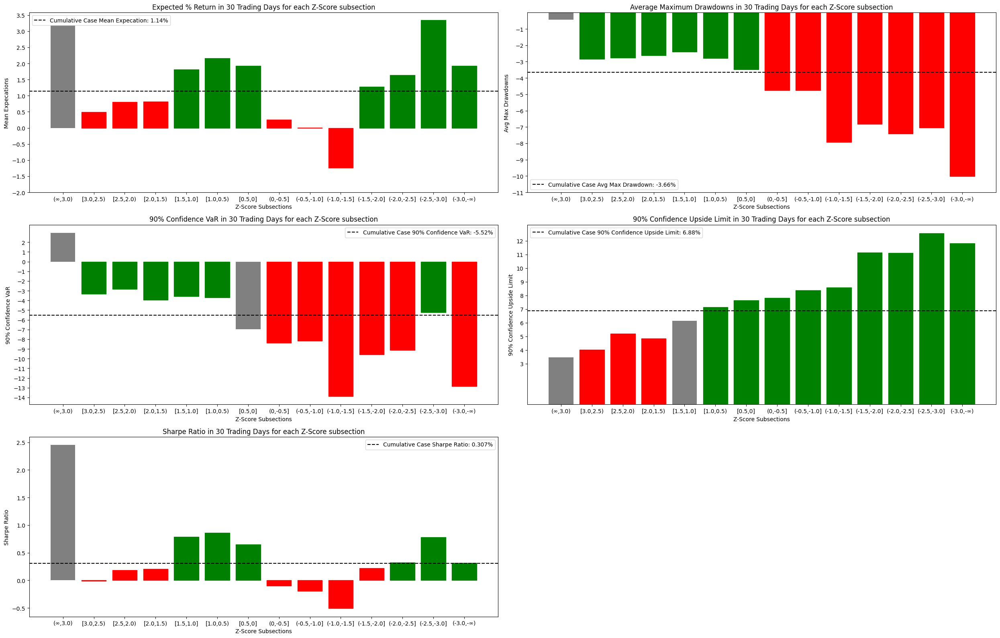

In [ ]:
plt.figure(figsize=(25,16))
#######################################################################################

plt.subplot(3,2,1)
bars1=plt.bar(sum_df['Z-Score Subsections'],sum_df['Expectations'],color='grey')

for i in range(0,len(sum_df['Expectations'])):

  if (sum_df['Expectations'][i] > full_numpy[:,time].mean()) and (sum_df['Days Traded'][i]>=25):
    bars1[i].set_color('green')

  elif (sum_df['Expectations'][i] < (full_numpy[:,time].mean())-0.2) and (sum_df['Days Traded'][i]>=25):
    bars1[i].set_color('red')


plt.axhline(y=full_numpy[:,time].mean().round(2),color='k',linestyle='--',label= 'Cumulative Case Mean Expecation: '+ (full_numpy[:,time].mean().round(2)).astype(str)+'%')
plt.xlabel('Z-Score Subsections')
plt.yticks(np.arange(math.floor(sum_df['Expectations'].min()), math.ceil(sum_df['Expectations'].max()), 0.5))
plt.ylabel('Mean Expecations')
plt.title(f'Expected % Return in {time} Trading Days for each Z-Score subsection')
plt.legend();

#######################################################################################
plt.subplot(3,2,2)
bars2=plt.bar(sum_df['Z-Score Subsections'],sum_df['Avg Max Drawdowns'],color='grey')

for i in range(0,len(sum_df['Avg Max Drawdowns'])):

  if (sum_df['Avg Max Drawdowns'][i] > full_numpy.min(axis=1).mean()) and (sum_df['Days Traded'][i]>=25):
    bars2[i].set_color('green')

  elif (sum_df['Avg Max Drawdowns'][i] < (full_numpy.min(axis=1).mean())-0.2) and (sum_df['Days Traded'][i]>=25):
    bars2[i].set_color('red')



plt.axhline(y=full_numpy.min(axis=1).mean().round(2),color='k',linestyle='--',label= 'Cumulative Case Avg Max Drawdown: '+ (full_numpy.min(axis=1).mean().round(2)).astype(str)+'%')
plt.xlabel('Z-Score Subsections')
plt.yticks(np.arange(math.floor(sum_df['Avg Max Drawdowns'].min()), math.ceil(sum_df['Avg Max Drawdowns'].max()), 1))
plt.ylabel('Avg Max Drawdowns')
plt.title(f'Average Maximum Drawdowns in {time} Trading Days for each Z-Score subsection')
plt.legend();



############################################################################################
plt.subplot(3,2,3)
bars3=plt.bar(sum_df['Z-Score Subsections'],sum_df['90% Confidence VaRs'],color='grey')

for i in range(0,len(sum_df['90% Confidence VaRs'])):

  if (sum_df['90% Confidence VaRs'][i] > np.percentile(full_numpy[:,time],10)) and (sum_df['Days Traded'][i]>=25):
    bars3[i].set_color('green')

  elif (sum_df['90% Confidence VaRs'][i] < np.percentile(full_numpy[:,time],10)-1.5) and (sum_df['Days Traded'][i]>=25):
    bars3[i].set_color('red')



plt.axhline(y=(np.percentile(full_numpy[:,time],10).round(2)),color='k',linestyle='--',label= 'Cumulative Case 90% Confidence VaR: '+ ((np.percentile(full_numpy[:,time],10).round(2))).astype(str)+'%')
plt.xlabel('Z-Score Subsections')
plt.yticks(np.arange(math.floor(sum_df['90% Confidence VaRs'].min()), math.ceil(sum_df['90% Confidence VaRs'].max()), 1))
plt.ylabel('90% Confidence VaR')
plt.title(f'90% Confidence VaR in {time} Trading Days for each Z-Score subsection')
plt.legend();

#############################################################################################

plt.subplot(3,2,4)
bars4=plt.bar(sum_df['Z-Score Subsections'],sum_df['90% Confidence Upside Limit'],color='grey')

for i in range(0,len(sum_df['90% Confidence Upside Limit'])):

  if (sum_df['90% Confidence Upside Limit'][i] > np.percentile(full_numpy[:,time],90)) and (sum_df['Days Traded'][i]>=25):
    bars4[i].set_color('green')

  elif (sum_df['90% Confidence Upside Limit'][i] < np.percentile(full_numpy[:,time],90)-1.5) and (sum_df['Days Traded'][i]>=25):
    bars4[i].set_color('red')


plt.axhline(y=(np.percentile(full_numpy[:,time],90).round(2)),color='k',linestyle='--',label= 'Cumulative Case 90% Confidence Upside Limit: '+ ((np.percentile(full_numpy[:,time],90).round(2))).astype(str)+'%')
plt.xlabel('Z-Score Subsections')
plt.yticks(np.arange(math.floor(sum_df['90% Confidence Upside Limit'].min()), math.ceil(sum_df['90% Confidence Upside Limit'].max()), 1))
plt.ylabel('90% Confidence Upside Limit')
plt.title(f'90% Confidence Upside Limit in {time} Trading Days for each Z-Score subsection')
plt.legend();

plt.subplot(3,2,5)

bars10=plt.bar(sum_df['Z-Score Subsections'],sum_df['Sharpe Ratio'],color='grey')

for i in range(0,len(sum_df['Sharpe Ratio'])):
  if (sum_df['Sharpe Ratio'][i]) > ((full_numpy[:,time].mean()-(prorated_rate))/(full_numpy.std(axis=1).mean())) and (sum_df['Days Traded'][i]>=25):
    bars10[i].set_color('green')

  elif (sum_df['Sharpe Ratio'][i]) < ((full_numpy[:,time].mean()-(prorated_rate))/(full_numpy.std(axis=1).mean())-0.05) and (sum_df['Days Traded'][i]>=25):
    bars10[i].set_color('red')

plt.axhline(((full_numpy[:,time].mean()-(prorated_rate))/(full_numpy.std(axis=1).mean())),color='k',linestyle='--',label= 'Cumulative Case Sharpe Ratio: '+ (((full_numpy[:,time].mean()-(prorated_rate))/(full_numpy.std(axis=1).mean())).round(3)).astype(str)+'%')
plt.xlabel('Z-Score Subsections')
plt.ylabel('Sharpe Ratio')
plt.title(f'Sharpe Ratio in {time} Trading Days for each Z-Score subsection')

plt.legend();

plt.tight_layout()
plt.show()

## **Algroithm's Top 4 Picks**

Algorithms top 4 picks for share acqusisitions at z-scores, optimizing for  Expectation, VaR, Maximum Drawdown and Sharpe Ratio

[ 0  5  5  5 14 15 12  1  1  1  5 10 13 10]
Sorted indices corresponding from highest to lowest scores:  [ 5  4 12  6 11 13  1  2  3 10  7  8  9  0]
Top 4 Scores:  [15 14 13 12]
Top  indices corresponding to Top 4 Highest scores:  [ 5  4 12  6]


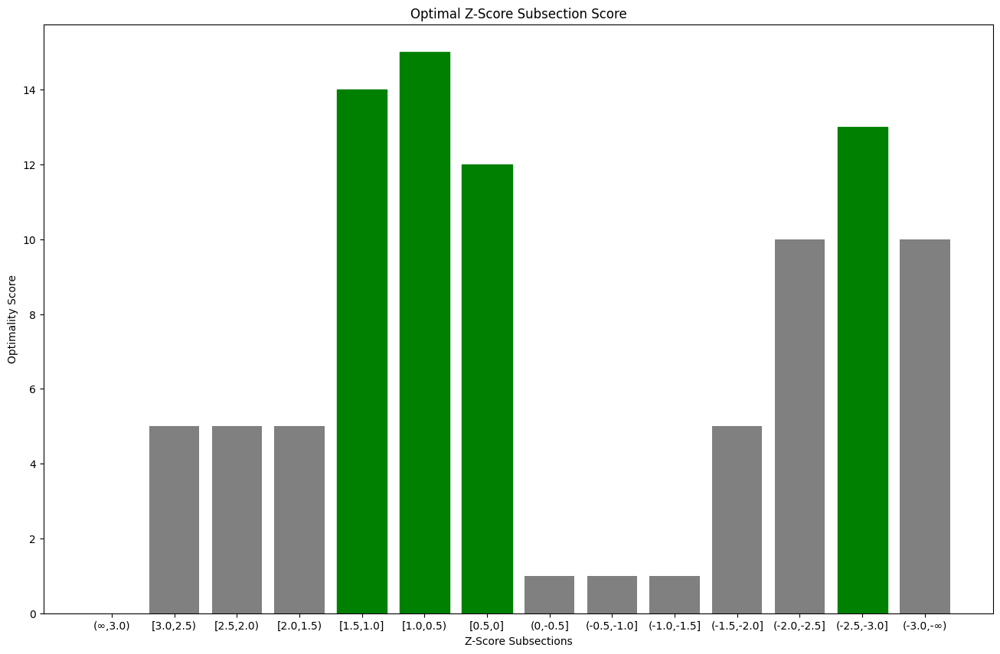

In [ ]:
extraord_pos_score=0
extreme_pos_score=0
verypos_score=0
pos_score=0
mod_pos_score=0
fairly_pos_score=0
slightly_pos_score=0

slightly_neg_score=0
fairly_neg_score=0
mod_neg_score=0
neg_score=0
very_neg_score=0
extreme_neg_score=0
extraord_neg_score=0

scores=[extraord_pos_score, extreme_pos_score,verypos_score,pos_score,mod_pos_score,fairly_pos_score,slightly_pos_score,slightly_neg_score,fairly_neg_score,mod_neg_score,
neg_score,very_neg_score,extreme_neg_score,extraord_neg_score]



for i in range(0, len(sum_df['Z-Score Subsections'])):
    if (sum_df['Expectations'][i] > full_numpy[:, time].mean().round(2)) and (sum_df['Days Traded'][i] >= 25):
        scores[i] += 4

    if (sum_df['Avg Max Drawdowns'][i] > full_numpy.min(axis=1).mean().round(2)) and (sum_df['Days Traded'][i] >= 25):
        scores[i] += 2

    if (sum_df['90% Confidence VaRs'][i] > np.percentile(full_numpy[:,time],10).round(2)) and (sum_df['Days Traded'][i] >= 25):
        scores[i] += 3

    if (sum_df['90% Confidence Upside Limit'][i] > np.percentile(full_numpy[:,time],90).round(2)) and (sum_df['Days Traded'][i] >= 25):
        scores[i] += 1

    if sum_df['Sharpe Ratio'][i]> ((full_numpy[:,time].mean()-(prorated_rate))/(full_numpy.std(axis=1).mean())) and (sum_df['Days Traded'][i] >= 25):
      scores[i]+=5


np_scores = np.array(scores)
print(np_scores)

sorted_array = np.sort(np_scores)[::-1]
sorted_indices = np.argsort(-np_scores)
print('Sorted indices corresponding from highest to lowest scores: ',sorted_indices)

top4_values=sorted_array[0:4]
top4_indices=sorted_indices[0:4]

print('Top 4 Scores: ',top4_values)
print('Top  indices corresponding to Top 4 Highest scores: ',top4_indices)

plt.figure(figsize=(16,10))

bars5=plt.bar(sum_df['Z-Score Subsections'],scores,color='grey')

for i in top4_indices:
  bars5[i].set_color('green')


plt.xlabel('Z-Score Subsections')
plt.ylabel('Optimality Score')
plt.title('Optimal Z-Score Subsection Score');



Gathering Indexes for the Optimal Cases according to the algo


In [ ]:

optimal_cases=[]

if 0 in top4_indices:
  optimal_cases.extend(extraord_pos_index)

if 1 in top4_indices:
  optimal_cases.extend(extreme_pos_index)

if 2 in top4_indices:
  optimal_cases.extend(verypos_index)

if 3 in top4_indices:
  optimal_cases.extend(pos_index)

if 4 in top4_indices:
  optimal_cases.extend(mod_pos_index)

if 5 in top4_indices:
  optimal_cases.extend(fair_pos_index)

if 6 in top4_indices:
  optimal_cases.extend(slight_pos_index)

if 7 in top4_indices:
  optimal_cases.extend(slight_neg_index)

if 8 in top4_indices:
  optimal_cases.extend(fair_neg_index)

if 9 in top4_indices:
  optimal_cases.extend(mod_neg_index)

if 10 in top4_indices:
  optimal_cases.extend(neg_index)

if 11 in top4_indices:
  optimal_cases.extend(vneg_index)

if 12 in top4_indices:
  optimal_cases.extend(extreme_neg_index)

if 13 in top4_indices:
  optimal_cases.extend(extraord_neg_index)

len(optimal_cases)

2431

# **Algorithm Result Simulation**

Run Test Case of Acquiring 700 shares with Algorithm vs Randomly to compare results **(Long Term Insights)**

   SIMULATION ( 700 ) Shares
-----------------------------------------------------

OPTIMAL SHARE ACQUSITION SIMULATION STATS
-----------------------------------------
Sharpe Ratio:  0.743
Avg Volatility:  1.91%
Expected % Return:  1.92%
Avg Maximum Drawdown:  -2.94%
90% Confidence VaR:  -4.0%


RANDOM SHARE ACQUSITION SIMULATION STATS
----------------------------------------
Sharpe Ratio:  0.352
Avg Volatility:  2.08%
Expected % Return:  1.24%
Avg Maximum Drawdown:  -3.65%
90% Confidence VaR:  -5.83%

SUMMARY STATS
---------------------------------------
P&L Optimized by:  481.05%
Expected % Return Optimized by:  0.69%
Mean Maximum Drawdown Minimzed by:  0.71%
90% Confidence VaR (Value at Risk) Minimized by:  1.83%
Sharpe Ratio Optimized by:  0.391


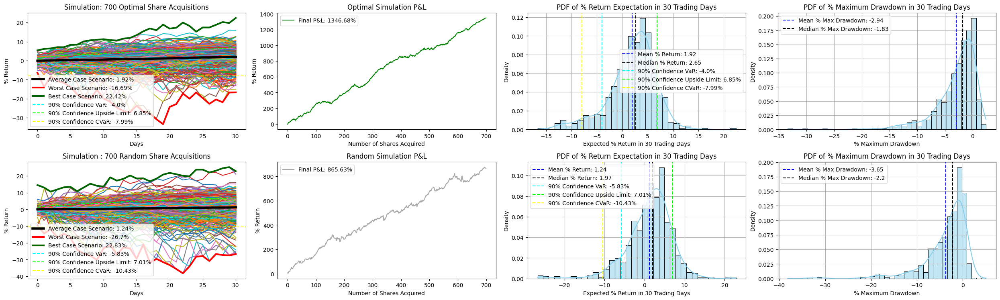

In [ ]:
plt.figure(figsize=(25,22))



if len(optimal_cases) >=700:
  num_of_optimal_samples=700
  num_of_random_samples=700
else:
  num_of_optimal_samples=int(len(optimal_cases)//1.5)
  num_of_random_samples=int(len(optimal_cases)//1.5)

plt.subplot(6,4,1)


random_optimal_index=np.random.choice(optimal_cases,num_of_optimal_samples,replace=False) ##optimal cases

total_optimal_samples=[]

for i in random_optimal_index:
  newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
  days=np.arange(0,len(newcase))
  total_optimal_samples.append(newcase)
  plt.xlabel("Days")
  plt.ylabel('% Return')
  plt.title(f"Simulation: {num_of_optimal_samples} Optimal Share Acquisitions")
  plt.plot(days,newcase)

np_optimal_samples=np.array(total_optimal_samples).reshape(num_of_optimal_samples,time + 1)

plt.plot(days,np_optimal_samples.mean(axis=0), linewidth=4, color='k', label= 'Average Case Scenario: '+ (((np_optimal_samples[:,time]).mean().round(2)).astype(str)) + '%')


plt.plot(days,np_optimal_samples.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ ((np_optimal_samples.min(axis=0)[time]).round(2)).astype(str) + '%')
plt.plot(days,np_optimal_samples.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + ((np_optimal_samples.max(axis=0)[time]).round(2)).astype(str) + '%')

tempo_array80=[]                                                                                                                                                     ##new


for i in range(0,np_optimal_samples.shape[1]):
  tempo_array80.append(np.percentile(np_optimal_samples[:,i],10).round(2))

np_tempo_array80=np.array(tempo_array80)

plt.plot(np_tempo_array80, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_optimal_samples[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array80=[]                                                                                                                                      ##super new

for i in range(0,np_optimal_samples.shape[1]):
  tempo_upside_array80.append(np.percentile(np_optimal_samples[:,i],90).round(2))

np_tempo_upside_array80=np.array(tempo_upside_array80)

plt.plot(np_tempo_upside_array80, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_optimal_samples[:,time],90).round(2)).astype(str) + '%')       ##super neww


cvar_temp80=[]                                                                                ##super new

for row in np_optimal_samples:
    if row[time]<np.percentile(np_optimal_samples[:,time],10):
      cvar_temp80.append(row[time])

cvar80=np.mean(cvar_temp80).round(2)                                                         ##super new


plt.axhline(y=cvar80, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar80).astype(str) + '%')                           ##super new

plt.legend();

plt.subplot(6,4,2)

plt.plot(np_optimal_samples[:,time].cumsum(),color='green',label='Final P&L: '+(((np_optimal_samples[:,time].cumsum())[-1].round(2)).astype(str)) + '%')
plt.xlabel("Number of Shares Acquired")
plt.ylabel('% Return')
plt.title("Optimal Simulation P&L")
plt.legend();

plt.subplot(6,4,3)

sns.histplot(np_optimal_samples[:,time], kde=True, color='skyblue', stat='density')

plt.axvline(np_optimal_samples[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((np_optimal_samples[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(np_optimal_samples[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(np_optimal_samples[:,time]), 2)))

plt.axvline(np.percentile(np_optimal_samples[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_optimal_samples[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(np_optimal_samples[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_optimal_samples[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar80, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar80).astype(str) + '%')   ##super new
plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)
plt.legend();

plt.subplot(6,4,4)

sns.histplot(np_optimal_samples.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(np_optimal_samples.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((np_optimal_samples.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(np_optimal_samples.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(np_optimal_samples.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
plt.legend();



###########################################################################################################################################################################################

plt.subplot(6, 4, 5)


cumu_avg_case_index= np.arange(0,len(new_df['Z-Score'])-(time + 1))


random_cumu_index=np.random.choice(cumu_avg_case_index,num_of_random_samples,replace=False) #100 random samples from cumu_indexes

all_random_samples=[]

for i in random_cumu_index:
  newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
  days=np.arange(0,len(newcase))
  all_random_samples.append(newcase)
  plt.xlabel("Days")
  plt.ylabel('% Return')
  plt.title(f"Simulation : {num_of_random_samples} Random Share Acquisitions")
  plt.plot(days,newcase)

np_rand_samples=np.array(all_random_samples).reshape(num_of_random_samples,time + 1)

plt.plot(days,np_rand_samples.mean(axis=0), linewidth=4, color='k', label= 'Average Case Scenario: '+ (((np_rand_samples[:,time]).mean().round(2)).astype(str)) + '%')


plt.plot(days,np_rand_samples.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ ((np_rand_samples.min(axis=0)[time]).round(2)).astype(str) + '%')
plt.plot(days,np_rand_samples.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + ((np_rand_samples.max(axis=0)[time]).round(2)).astype(str) + '%')

tempo_array85=[]                                                                                                                                                     ##new


for i in range(0,np_rand_samples.shape[1]):
  tempo_array85.append(np.percentile(np_rand_samples[:,i],10).round(2))

np_tempo_array85=np.array(tempo_array85)

plt.plot(np_tempo_array85, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_rand_samples[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array85=[]                                                                                                                                      ##super new

for i in range(0,np_rand_samples.shape[1]):
  tempo_upside_array85.append(np.percentile(np_rand_samples[:,i],90).round(2))

np_tempo_upside_array85=np.array(tempo_upside_array85)

plt.plot(np_tempo_upside_array85, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_rand_samples[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp85=[]                                                                                ##super new

for row in np_rand_samples:
    if row[time]<np.percentile(np_rand_samples[:,time],10):
      cvar_temp85.append(row[time])

cvar85=np.mean(cvar_temp85).round(2)                                                         ##super new


plt.axhline(y=cvar85, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar85).astype(str) + '%')                           ##super new

plt.legend();

plt.subplot(6,4,6)

plt.plot(np_rand_samples[:,time].cumsum(),color='darkgrey',label='Final P&L: '+(((np_rand_samples[:,time].cumsum())[-1].round(2)).astype(str)) + '%')
plt.xlabel("Number of Shares Acquired")
plt.ylabel('% Return')
plt.title("Random Simulation P&L")
plt.legend();

plt.subplot(6,4,7)

sns.histplot(np_rand_samples[:,time], kde=True, color='skyblue', stat='density')

plt.axvline(np_rand_samples[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((np_rand_samples[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(np_rand_samples[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(np_rand_samples[:,time]), 2)))

plt.axvline(np.percentile(np_rand_samples[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_rand_samples[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(np_rand_samples[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_rand_samples[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar85, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar85).astype(str) + '%')   ##super new
plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)
plt.legend();

plt.subplot(6,4,8)

sns.histplot(np_rand_samples.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(np_rand_samples.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((np_rand_samples.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(np_rand_samples.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(np_rand_samples.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
plt.legend();

optimal_pnl_total=np_optimal_samples[:,time].cumsum()[-1]
random_pnl_total=np_rand_samples[:,time].cumsum()[-1]

print('   SIMULATION (',num_of_optimal_samples,') Shares')
print('-----------------------------------------------------\n')
print('OPTIMAL SHARE ACQUSITION SIMULATION STATS')
print('-----------------------------------------')
print('Sharpe Ratio: ',(((np_optimal_samples[:,time].mean())-prorated_rate)/(np_optimal_samples.std(axis=1).mean())).round(3))
print('Avg Volatility: ',((np_optimal_samples.std(axis=1).mean().round(2))).astype(str) + '%')
print('Expected % Return: ',np_optimal_samples[:,time].mean().round(2).astype(str) + '%')
print('Avg Maximum Drawdown: ',np_optimal_samples.min(axis=1).mean().round(2).astype(str) + '%')
print('90% Confidence VaR: ', np.percentile(np_optimal_samples[:,time],10).round(2).astype(str) + '%')


print('\n\nRANDOM SHARE ACQUSITION SIMULATION STATS')
print('----------------------------------------')
print('Sharpe Ratio: ',(((np_rand_samples[:,time].mean())-prorated_rate)/(np_rand_samples.std(axis=1).mean())).round(3))
print('Avg Volatility: ',(np_rand_samples.std(axis=1).mean().round(2)).astype(str)+'%')
print('Expected % Return: ', np_rand_samples[:,time].mean().round(2).astype(str) + '%')
print('Avg Maximum Drawdown: ',np_rand_samples.min(axis=1).mean().round(2).astype(str) + '%')
print('90% Confidence VaR: ', np.percentile(np_rand_samples[:,time],10).round(2).astype(str) + '%')



print('\nSUMMARY STATS')
print('---------------------------------------')



if optimal_pnl_total >= random_pnl_total:                                                                  ##pnl difference
  print('P&L Optimized by: ',(optimal_pnl_total - random_pnl_total).round(2).astype(str) +'%')
else:
  print('P&L UnOptimal by: ',(optimal_pnl_total - random_pnl_total).round(2).astype(str) +'%')

if (np_optimal_samples[:,time].mean()) >= (np_rand_samples[:,time].mean()):                                                                         ##expectation difference
  print('Expected % Return Optimized by: ', (((np_optimal_samples[:,time].mean())-(np_rand_samples[:,time].mean())).round(2)).astype(str) + '%')

else:
  print('Expected % Return is UnOptimal by :' ,((np_optimal_samples[:,time].mean())-(np_rand_samples[:,time].mean())).round(2).astype(str) + '%')

if (np_optimal_samples.min(axis=1).mean()) >= (np_rand_samples.min(axis=1).mean()):                                                                             ##max draw difference
  print('Mean Maximum Drawdown Minimzed by: ', ((np_optimal_samples.min(axis=1).mean())-(np_rand_samples.min(axis=1).mean())).round(2).astype(str) + '%')

else:
  print('Mean Maximum Drawdown UnOptimal by: ',((np_optimal_samples.min(axis=1).mean())-(np_rand_samples.min(axis=1).mean())).round(2).astype(str) + '%')

if (np.percentile(np_optimal_samples[:,time],10)) >= (np.percentile(np_rand_samples[:,time],10)):                                                                            ##var difference
  print('90% Confidence VaR (Value at Risk) Minimized by: ', ((np.percentile(np_optimal_samples[:,time],10))-(np.percentile(np_rand_samples[:,time],10))).round(2).astype(str) + '%')

else:
  print('90% Confidence VaR (Value at Risk) UnOptimal by: ', ((np.percentile(np_optimal_samples[:,time],10))-(np.percentile(np_rand_samples[:,time],10))).round(2).astype(str) + '%')

if (((np_optimal_samples[:,time].mean())-prorated_rate)/(np_optimal_samples.std(axis=1).mean())) >= (((np_rand_samples[:,time].mean())-prorated_rate)/(np_rand_samples.std(axis=1).mean())) :     ##sharpe difference
  print('Sharpe Ratio Optimized by: ', ((((np_optimal_samples[:,time].mean())-prorated_rate)/(np_optimal_samples.std(axis=1).mean()))-(((np_rand_samples[:,time].mean())-prorated_rate)/(np_rand_samples.std(axis=1).mean()))).round(3))

else:
  print('Sharpe Ratio UnOptimal by: ',((((np_optimal_samples[:,time].mean())-prorated_rate)/(np_optimal_samples.std(axis=1).mean()))-(((np_rand_samples[:,time].mean())-prorated_rate)/(np_rand_samples.std(axis=1).mean()))).round(3))

plt.tight_layout()
plt.show()



 **PDF of Optimization Metrics for Algorithm**

PDF for all 5 optimization metrics (PnL, Expectation, Maximum Drawdown, VaR, Sharpe Ratio), 75 share acqusitions ran 1000 times (**Long Term Insights)**

1: P&L Optimization
----------------------------------------------------------------
The Mean Algorithm PnL Optimization is: 67.24%
The Median Algorithm PnL Optimization is: 66.31%
The 80% HDI for Algortithm PnL Optimization is : ['-14.0%', '143.33%']

2: EXPECTATION Optimization
----------------------------------------------------------------
The Mean Algorithm E(% Return) Optimization is: 0.9%
The Median Algorithm E(% Return) Optimization is: 0.88%
The 80% HDI for Algortithm E(% Return) Optimization is : ['-0.2%', '1.9%']

3: VaR (Value at Risk) Optimization
----------------------------------------------------------------
The Mean Algorithm VaR Optimization is: 1.38%
The Median Algorithm VaR Optimization is: 1.4%
The 80% HDI for Algortithm VaR Optimization is : ['-1.14%', '3.81%']

4: MAXIMUM DRAWDOWN Optimization
----------------------------------------------------------------
The Mean Algorithm Maximum Drawdown Optimization is: 0.8%
The Median Algorithm Maximum Drawdown Optimizatio

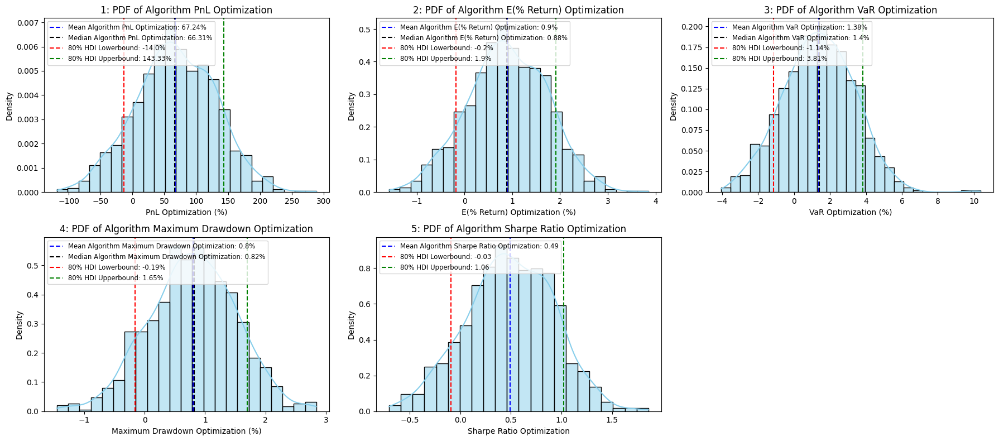

In [ ]:
full_PnL_diff_results=[]

full_expectation_diff_results=[]

full_maxdraw_diff_results=[]

full_var_diff_results=[]

full_sharpe_diff_results=[]

if len(optimal_cases) >=1000:
  loops=1000
else:
  loops=len(optimal_cases)

number=0
while number < loops:
  number+=1

  num_of_random_samples1=75

  random_optimal_index=np.random.choice(optimal_cases,num_of_random_samples1,replace=False)

  all_optimal_samples1=[]

  for i in random_optimal_index:
    newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
    days=np.arange(0,len(newcase))
    all_optimal_samples1.append(newcase)

  np_optimal_samples1=np.array(all_optimal_samples1).reshape(num_of_random_samples1,time + 1)

##########################################################################################################################################################################################


  cumu_avg_case_index= np.arange(0,len(new_df['Z-Score'])-(time + 1))

  num_of_random_samples1=75

  random_cumu_index=np.random.choice(cumu_avg_case_index,num_of_random_samples1,replace=False) #100 random samples from cumu_indexes

  all_random_samples1=[]

  for i in random_cumu_index:
    newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
    days=np.arange(0,len(newcase))
    all_random_samples1.append(newcase)

  np_rand_samples1=np.array(all_random_samples1).reshape(num_of_random_samples1,time + 1)


  optimal_pnl=np_optimal_samples1[:,time].cumsum()[-1]
  random_pnl=np_rand_samples1[:,time].cumsum()[-1]

  full_PnL_diff_results.append((optimal_pnl - random_pnl).round(2))
  full_expectation_diff_results.append(((np_optimal_samples1[:,time].mean())-(np_rand_samples1[:,time].mean())).round(2))
  full_maxdraw_diff_results.append(((np_optimal_samples1.min(axis=1).mean())-(np_rand_samples1.min(axis=1).mean())).round(2))
  full_var_diff_results.append(((np.percentile(np_optimal_samples1[:,time],10))-(np.percentile(np_rand_samples1[:,time],10))).round(2))
  full_sharpe_diff_results.append(((((np_optimal_samples1[:,time].mean())-prorated_rate)/(np_optimal_samples1.std(axis=1).mean()))-(((np_rand_samples1[:,time].mean())-prorated_rate)/(np_rand_samples1.std(axis=1).mean()))).round(3))

plt.figure(figsize=(18,8))
plt.subplot(2,3,1)
array50=[]

print('1: P&L Optimization')
print('----------------------------------------------------------------')
sns.histplot(full_PnL_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm PnL Optimization is:",np.mean(full_PnL_diff_results).round(2).astype(str) + '%')
print("The Median Algorithm PnL Optimization is:", np.median(full_PnL_diff_results).round(2).astype(str) + '%')
hdi = az.hdi(np.array(full_PnL_diff_results), hdi_prob=0.8)
for value in hdi:
  value=value.astype(str)+'%'
  array50.append(value)
print('The 80% HDI for Algortithm PnL Optimization is :',array50)

plt.axvline(np.mean(full_PnL_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm PnL Optimization: '+ (np.mean(full_PnL_diff_results).round(2)).astype(str) + '%')
plt.axvline(np.median(full_PnL_diff_results).round(2), color='k', linestyle='--', label='Median Algorithm PnL Optimization: ' + (np.round(np.median(full_PnL_diff_results), 2)).astype(str) + '%')
plt.axvline(np.percentile(full_PnL_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (array50[0]))
plt.axvline(np.percentile(full_PnL_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (array50[1]))

plt.title('1: PDF of Algorithm PnL Optimization')
plt.xlabel('PnL Optimization (%)')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');
############################################################################################################################################################################################################
plt.subplot(2,3,2)

array51=[]

print('\n2: EXPECTATION Optimization')
print('----------------------------------------------------------------')

sns.histplot(full_expectation_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm E(% Return) Optimization is:",np.mean(full_expectation_diff_results).round(2).astype(str) + '%')
print("The Median Algorithm E(% Return) Optimization is:", np.median(full_expectation_diff_results).round(2).astype(str) + '%')
hdi = az.hdi(np.array(full_expectation_diff_results), hdi_prob=0.8)
for value in hdi:
  value=value.astype(str)+'%'
  array51.append(value)
print('The 80% HDI for Algortithm E(% Return) Optimization is :',array51)

plt.axvline(np.mean(full_expectation_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm E(% Return) Optimization: '+ (np.mean(full_expectation_diff_results).round(2)).astype(str) + '%')
plt.axvline(np.median(full_expectation_diff_results).round(2), color='k', linestyle='--', label='Median Algorithm E(% Return) Optimization: ' + (np.round(np.median(full_expectation_diff_results), 2)).astype(str) + '%')
plt.axvline(np.percentile(full_expectation_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (array51[0]))
plt.axvline(np.percentile(full_expectation_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (array51[1]))

plt.title('2: PDF of Algorithm E(% Return) Optimization')
plt.xlabel('E(% Return) Optimization (%)')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');

############################################################################################################################################################

plt.subplot(2,3,3)

array53=[]

print('\n3: VaR (Value at Risk) Optimization')
print('----------------------------------------------------------------')

sns.histplot(full_var_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm VaR Optimization is:",np.mean(full_var_diff_results).round(2).astype(str) + '%')
print("The Median Algorithm VaR Optimization is:", np.median(full_var_diff_results).round(2).astype(str) + '%')
hdi = az.hdi(np.array(full_var_diff_results), hdi_prob=0.8)
for value in hdi:
  value=value.astype(str)+'%'
  array53.append(value)
print('The 80% HDI for Algortithm VaR Optimization is :',array53)

plt.axvline(np.mean(full_var_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm VaR Optimization: '+ (np.mean(full_var_diff_results).round(2)).astype(str) + '%')
plt.axvline(np.median(full_var_diff_results).round(2), color='k', linestyle='--', label='Median Algorithm VaR Optimization: ' + (np.round(np.median(full_var_diff_results), 2)).astype(str) + '%')
plt.axvline(np.percentile(full_var_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (array53[0]))
plt.axvline(np.percentile(full_var_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (array53[1]))

plt.title('3: PDF of Algorithm VaR Optimization')
plt.xlabel('VaR Optimization (%)')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');

###################################################################################################################################################################

plt.subplot(2,3,4)

array52=[]

print('\n4: MAXIMUM DRAWDOWN Optimization')
print('----------------------------------------------------------------')

sns.histplot(full_maxdraw_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm Maximum Drawdown Optimization is:",np.mean(full_maxdraw_diff_results).round(2).astype(str) + '%')
print("The Median Algorithm Maximum Drawdown Optimization is:", np.median(full_maxdraw_diff_results).round(2).astype(str) + '%')
hdi = az.hdi(np.array(full_maxdraw_diff_results), hdi_prob=0.8)
for value in hdi:
  value=value.astype(str)+'%'
  array52.append(value)
print('The 80% HDI for Algortithm Maximum Drawdown Optimization is :',array52)

plt.axvline(np.mean(full_maxdraw_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm Maximum Drawdown Optimization: '+ (np.mean(full_maxdraw_diff_results).round(2)).astype(str) + '%')
plt.axvline(np.median(full_maxdraw_diff_results).round(2), color='k', linestyle='--', label='Median Algorithm Maximum Drawdown Optimization: ' + (np.round(np.median(full_maxdraw_diff_results), 2)).astype(str) + '%')
plt.axvline(np.percentile(full_maxdraw_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (array52[0]))
plt.axvline(np.percentile(full_maxdraw_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (array52[1]))

plt.title('4: PDF of Algorithm Maximum Drawdown Optimization')
plt.xlabel('Maximum Drawdown Optimization (%)')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');

#################################################################################################################################################################################

plt.subplot(2,3,5)


print('\n5: Sharpe Ratio Optimization')
print('----------------------------------------------------------------')

sns.histplot(full_sharpe_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm Sharpe Ratio Optimization is:",np.mean(full_sharpe_diff_results).round(2))
print("The Median Algorithm Sharpe Ratio Optimization is:", np.median(full_sharpe_diff_results).round(2))
hdi = az.hdi(np.array(full_sharpe_diff_results), hdi_prob=0.8)
print('The 80% HDI for Algorithm Sharpe Ratio Optimization is :', hdi)
plt.axvline(np.mean(full_sharpe_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm Sharpe Ratio Optimization: ' + str(np.mean(full_sharpe_diff_results).round(2)))
plt.axvline(np.percentile(full_sharpe_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (str(hdi[0].round(2))))
plt.axvline(np.percentile(full_sharpe_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (str(hdi[1].round(2))))

plt.title('5: PDF of Algorithm Sharpe Ratio Optimization')
plt.xlabel('Sharpe Ratio Optimization')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');



plt.tight_layout()
plt.show()





# **Test Cases**

Run Test Cases with Algortithmic Share Acqusition vs. Random Share Acqusition at various share amounts(75,150,300) to compare results. Display PDF and all relevant comparison statistics (PnL, Expectation, VaR, Max Drawdown, Sharpe Ratio) (**Short Term Insights**)




Storage Array's

Using the following array's to store all the test case results we run

In [ ]:
##
PnL_diff_results=[]

expectation_diff_results=[]

maxdraw_diff_results=[]

var_diff_results=[]

sharpe_diff_results=[]



Randomly sample 75, 150, 350 shares (3 unique cases) using the algorithm and randomly to compare the results


   SIMULATION 1 (75 Shares)
-----------------------------------------------------

OPTIMAL SHARE ACQUSITION SIMULATION STATS
-----------------------------------------
Sharpe Ratio:  0.501
Avg Volatility:  1.83%
Expected % Return:  1.42%
Avg Maximum Drawdown:  -3.19%
90% Confidence VaR:  -7.1%


RANDOM SHARE ACQUSITION SIMULATION STATS
----------------------------------------
Sharpe Ratio:  0.244
Avg Volatility:  1.93%
Expected % Return:  0.98%
Avg Maximum Drawdown:  -3.44%
90% Confidence VaR:  -6.21%

SUMMARY STATS
---------------------------------------
P&L Optimized by:  33.67%
Expected % Return Optimized by:  0.45%
Mean Maximum Drawdown Minimzed by:  0.25%
90% Confidence VaR (Value at Risk) UnOptimal by:  -0.89%
Sharpe Ratio Optimized by:  0.257

   SIMULATION 2 (150 Shares)
-----------------------------------------------------

OPTIMAL SHARE ACQUSITION SIMULATION STATS
-----------------------------------------
Sharpe Ratio:  0.798
Avg Volatility:  1.91%
Expected % Return:  2.03%
Av

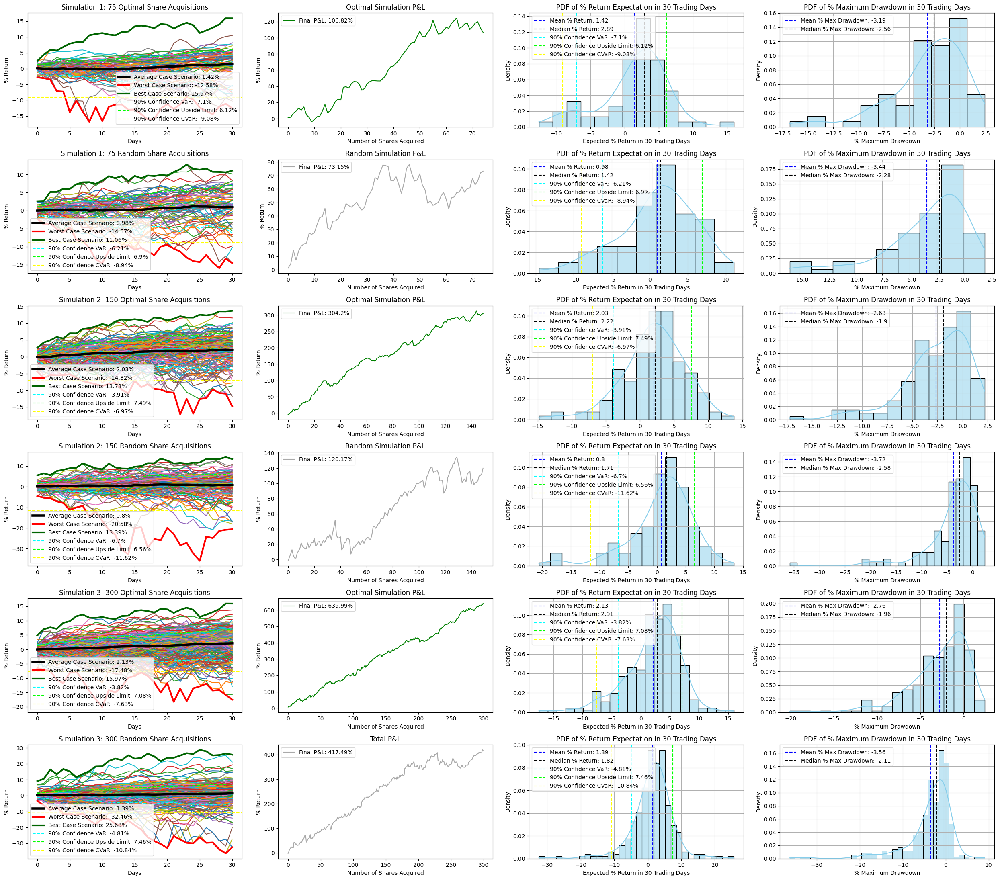

In [ ]:
plt.figure(figsize=(25,22))


#################################################################################################### SIMULATION 1 #######################################################################################

plt.subplot(6,4,1)

num_of_random_samples1=75

random_optimal_index=np.random.choice(optimal_cases,num_of_random_samples1,replace=False)

all_optimal_samples1=[]

for i in random_optimal_index:
  newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
  days=np.arange(0,len(newcase))
  all_optimal_samples1.append(newcase)
  plt.xlabel("Days")
  plt.ylabel('% Return')
  plt.title(f"Simulation 1: {num_of_random_samples1} Optimal Share Acquisitions")
  plt.plot(days,newcase)

np_optimal_samples1=np.array(all_optimal_samples1).reshape(num_of_random_samples1,time + 1)

plt.plot(days,np_optimal_samples1.mean(axis=0), linewidth=4, color='k', label= 'Average Case Scenario: '+ (((np_optimal_samples1[:,time]).mean().round(2)).astype(str)) + '%')


plt.plot(days,np_optimal_samples1.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ ((np_optimal_samples1.min(axis=0)[time]).round(2)).astype(str) + '%')
plt.plot(days,np_optimal_samples1.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + ((np_optimal_samples1.max(axis=0)[time]).round(2)).astype(str) + '%')

tempo_array30=[]                                                                                                                                                     ##new


for i in range(0,np_optimal_samples1.shape[1]):
  tempo_array30.append(np.percentile(np_optimal_samples1[:,i],10).round(2))

np_tempo_array30=np.array(tempo_array30)

plt.plot(np_tempo_array30, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_optimal_samples1[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array30=[]                                                                                                                                      ##super new

for i in range(0,np_optimal_samples1.shape[1]):
  tempo_upside_array30.append(np.percentile(np_optimal_samples1[:,i],90).round(2))

np_tempo_upside_array30=np.array(tempo_upside_array30)

plt.plot(np_tempo_upside_array30, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_optimal_samples1[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp30=[]                                                                                ##super new

for row in np_optimal_samples1:
    if row[time]<np.percentile(np_optimal_samples1[:,time],10):
      cvar_temp30.append(row[time])

cvar30=np.mean(cvar_temp30).round(2)                                                         ##super new


plt.axhline(y=cvar30, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar30).astype(str) + '%')                           ##super new

plt.legend();

plt.subplot(6,4,2)

plt.plot(np_optimal_samples1[:,time].cumsum(),color='green',label='Final P&L: '+(((np_optimal_samples1[:,time].cumsum())[-1].round(2)).astype(str)) + '%')
plt.xlabel("Number of Shares Acquired")
plt.ylabel('% Return')
plt.title("Optimal Simulation P&L")
plt.legend();

plt.subplot(6,4,3)

sns.histplot(np_optimal_samples1[:,time], kde=True, color='skyblue', stat='density')

plt.axvline(np_optimal_samples1[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((np_optimal_samples1[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(np_optimal_samples1[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(np_optimal_samples1[:,time]), 2)))

plt.axvline(np.percentile(np_optimal_samples1[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_optimal_samples1[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(np_optimal_samples1[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_optimal_samples1[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar30, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar30).astype(str) + '%')   ##super new
plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)
plt.legend();

plt.subplot(6,4,4)

sns.histplot(np_optimal_samples1.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(np_optimal_samples1.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((np_optimal_samples1.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(np_optimal_samples1.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(np_optimal_samples1.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
plt.legend();

#################################################################################################### HALFWAY SIMULATION 1 #######################################################################################

plt.subplot(6, 4, 5)


cumu_avg_case_index= np.arange(0,len(new_df['Z-Score'])-(time + 1))

num_of_random_samples1=75

random_cumu_index=np.random.choice(cumu_avg_case_index,num_of_random_samples1,replace=False) #100 random samples from cumu_indexes

all_random_samples1=[]

for i in random_cumu_index:
  newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
  days=np.arange(0,len(newcase))
  all_random_samples1.append(newcase)
  plt.xlabel("Days")
  plt.ylabel('% Return')
  plt.title(f"Simulation 1: {num_of_random_samples1} Random Share Acquisitions")
  plt.plot(days,newcase)

np_rand_samples1=np.array(all_random_samples1).reshape(num_of_random_samples1,time + 1)

plt.plot(days,np_rand_samples1.mean(axis=0), linewidth=4, color='k', label= 'Average Case Scenario: '+ (((np_rand_samples1[:,time]).mean().round(2)).astype(str)) + '%')


plt.plot(days,np_rand_samples1.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ ((np_rand_samples1.min(axis=0)[time]).round(2)).astype(str) + '%')
plt.plot(days,np_rand_samples1.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + ((np_rand_samples1.max(axis=0)[time]).round(2)).astype(str) + '%')

tempo_array15=[]                                                                                                                                                     ##new


for i in range(0,np_rand_samples1.shape[1]):
  tempo_array15.append(np.percentile(np_rand_samples1[:,i],10).round(2))

np_tempo_array15=np.array(tempo_array15)

plt.plot(np_tempo_array15, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_rand_samples1[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array15=[]                                                                                                                                      ##super new

for i in range(0,np_rand_samples1.shape[1]):
  tempo_upside_array15.append(np.percentile(np_rand_samples1[:,i],90).round(2))

np_tempo_upside_array15=np.array(tempo_upside_array15)

plt.plot(np_tempo_upside_array15, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_rand_samples1[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp15=[]                                                                                ##super new

for row in np_rand_samples1:
    if row[time]<np.percentile(np_rand_samples1[:,time],10):
      cvar_temp15.append(row[time])

cvar15=np.mean(cvar_temp15).round(2)                                                         ##super new


plt.axhline(y=cvar15, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar15).astype(str) + '%')                           ##super new

plt.legend();

plt.subplot(6,4,6)

plt.plot(np_rand_samples1[:,time].cumsum(),color='darkgrey',label='Final P&L: '+(((np_rand_samples1[:,time].cumsum())[-1].round(2)).astype(str)) + '%')
plt.xlabel("Number of Shares Acquired")
plt.ylabel('% Return')
plt.title("Random Simulation P&L")
plt.legend();

plt.subplot(6,4,7)

sns.histplot(np_rand_samples1[:,time], kde=True, color='skyblue', stat='density')

plt.axvline(np_rand_samples1[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((np_rand_samples1[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(np_rand_samples1[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(np_rand_samples1[:,time]), 2)))

plt.axvline(np.percentile(np_rand_samples1[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_rand_samples1[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(np_rand_samples1[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_rand_samples1[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar15, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar15).astype(str) + '%')   ##super new
plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)
plt.legend();

plt.subplot(6,4,8)

sns.histplot(np_rand_samples1.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(np_rand_samples1.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((np_rand_samples1.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(np_rand_samples1.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(np_rand_samples1.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
plt.legend();

optimal_pnl=np_optimal_samples1[:,time].cumsum()[-1]
random_pnl=np_rand_samples1[:,time].cumsum()[-1]

print('   SIMULATION 1 (75 Shares)')
print('-----------------------------------------------------\n')
print('OPTIMAL SHARE ACQUSITION SIMULATION STATS')
print('-----------------------------------------')
print('Sharpe Ratio: ',(((np_optimal_samples1[:,time].mean())-prorated_rate)/(np_optimal_samples1.std(axis=1).mean())).round(3))
print('Avg Volatility: ',((np_optimal_samples1.std(axis=1).mean().round(2))).astype(str) + '%')
print('Expected % Return: ',np_optimal_samples1[:,time].mean().round(2).astype(str) + '%')
print('Avg Maximum Drawdown: ',np_optimal_samples1.min(axis=1).mean().round(2).astype(str) + '%')
print('90% Confidence VaR: ', np.percentile(np_optimal_samples1[:,time],10).round(2).astype(str) + '%')


print('\n\nRANDOM SHARE ACQUSITION SIMULATION STATS')
print('----------------------------------------')
print('Sharpe Ratio: ',(((np_rand_samples1[:,time].mean())-prorated_rate)/(np_rand_samples1.std(axis=1).mean())).round(3))
print('Avg Volatility: ',(np_rand_samples1.std(axis=1).mean().round(2)).astype(str)+'%')
print('Expected % Return: ', np_rand_samples1[:,time].mean().round(2).astype(str) + '%')
print('Avg Maximum Drawdown: ',np_rand_samples1.min(axis=1).mean().round(2).astype(str) + '%')
print('90% Confidence VaR: ', np.percentile(np_rand_samples1[:,time],10).round(2).astype(str) + '%')



print('\nSUMMARY STATS')
print('---------------------------------------')



if optimal_pnl >= random_pnl:                                                                  ##pnl difference
  print('P&L Optimized by: ',(optimal_pnl - random_pnl).round(2).astype(str) +'%')
  PnL_diff_results.append((optimal_pnl - random_pnl).round(2))

else:
  print('P&L UnOptimal by: ',(optimal_pnl - random_pnl).round(2).astype(str) +'%')
  PnL_diff_results.append((optimal_pnl - random_pnl).round(2))

if (np_optimal_samples1[:,time].mean()) >= (np_rand_samples1[:,time].mean()):                                                                         ##expectation difference
  print('Expected % Return Optimized by: ', (((np_optimal_samples1[:,time].mean())-(np_rand_samples1[:,time].mean())).round(2)).astype(str) + '%')
  expectation_diff_results.append(((np_optimal_samples1[:,time].mean())-(np_rand_samples1[:,time].mean())).round(2))

else:
  print('Expected % Return is UnOptimal by :' ,((np_optimal_samples1[:,time].mean())-(np_rand_samples1[:,time].mean())).round(2).astype(str) + '%')
  expectation_diff_results.append(((np_optimal_samples1[:,time].mean())-(np_rand_samples1[:,time].mean())).round(2))

if (np_optimal_samples1.min(axis=1).mean()) >= (np_rand_samples1.min(axis=1).mean()):                                                                             ##max draw difference
  print('Mean Maximum Drawdown Minimzed by: ', ((np_optimal_samples1.min(axis=1).mean())-(np_rand_samples1.min(axis=1).mean())).round(2).astype(str) + '%')
  maxdraw_diff_results.append(((np_optimal_samples1.min(axis=1).mean())-(np_rand_samples1.min(axis=1).mean())).round(2))

else:
  print('Mean Maximum Drawdown UnOptimal by: ',((np_optimal_samples1.min(axis=1).mean())-(np_rand_samples1.min(axis=1).mean())).round(2).astype(str) + '%')
  maxdraw_diff_results.append(((np_optimal_samples1.min(axis=1).mean())-(np_rand_samples1.min(axis=1).mean())).round(2))

if (np.percentile(np_optimal_samples1[:,time],10)) >= (np.percentile(np_rand_samples1[:,time],10)):                                                                            ##var difference
  print('90% Confidence VaR (Value at Risk) Minimized by: ', ((np.percentile(np_optimal_samples1[:,time],10))-(np.percentile(np_rand_samples1[:,time],10))).round(2).astype(str) + '%')
  var_diff_results.append(((np.percentile(np_optimal_samples1[:,time],10))-(np.percentile(np_rand_samples1[:,time],10))).round(2))

else:
  print('90% Confidence VaR (Value at Risk) UnOptimal by: ', ((np.percentile(np_optimal_samples1[:,time],10))-(np.percentile(np_rand_samples1[:,time],10))).round(2).astype(str) + '%')
  var_diff_results.append(((np.percentile(np_optimal_samples1[:,time],10))-(np.percentile(np_rand_samples1[:,time],10))).round(2))

if (((np_optimal_samples1[:,time].mean())-prorated_rate)/(np_optimal_samples1.std(axis=1).mean())) >= (((np_rand_samples1[:,time].mean())-prorated_rate)/(np_rand_samples1.std(axis=1).mean())) :     ##sharpe difference
  print('Sharpe Ratio Optimized by: ', ((((np_optimal_samples1[:,time].mean())-prorated_rate)/(np_optimal_samples1.std(axis=1).mean()))-(((np_rand_samples1[:,time].mean())-prorated_rate)/(np_rand_samples1.std(axis=1).mean()))).round(3))
  sharpe_diff_results.append(((((np_optimal_samples1[:,time].mean())-prorated_rate)/(np_optimal_samples1.std(axis=1).mean()))-(((np_rand_samples1[:,time].mean())-prorated_rate)/(np_rand_samples1.std(axis=1).mean()))).round(3))

else:
  print('Sharpe Ratio UnOptimal by: ',((((np_optimal_samples1[:,time].mean())-prorated_rate)/(np_optimal_samples1.std(axis=1).mean()))-(((np_rand_samples1[:,time].mean())-prorated_rate)/(np_rand_samples1.std(axis=1).mean()))).round(3))
  sharpe_diff_results.append(((((np_optimal_samples1[:,time].mean())-prorated_rate)/(np_optimal_samples1.std(axis=1).mean()))-(((np_rand_samples1[:,time].mean())-prorated_rate)/(np_rand_samples1.std(axis=1).mean()))).round(3))

############################################################################################### SIMULATION 2 ##############################################################################

plt.subplot(6,4,9)

num_of_random_samples2=150

random_optimal_index=np.random.choice(optimal_cases,num_of_random_samples2,replace=False)

all_optimal_samples2=[]

for i in random_optimal_index:
  newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
  days=np.arange(0,len(newcase))
  all_optimal_samples2.append(newcase)
  plt.xlabel("Days")
  plt.ylabel('% Return')
  plt.title(f"Simulation 2: {num_of_random_samples2} Optimal Share Acquisitions")
  plt.plot(days,newcase)

np_optimal_samples2=np.array(all_optimal_samples2).reshape(num_of_random_samples2,time + 1)

plt.plot(days,np_optimal_samples2.mean(axis=0), linewidth=4, color='k', label= 'Average Case Scenario: '+ (((np_optimal_samples2[:,time]).mean().round(2)).astype(str)) + '%')


plt.plot(days,np_optimal_samples2.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ ((np_optimal_samples2.min(axis=0)[time]).round(2)).astype(str) + '%')
plt.plot(days,np_optimal_samples2.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + ((np_optimal_samples2.max(axis=0)[time]).round(2)).astype(str) + '%')

tempo_array31=[]                                                                                                                                                     ##new


for i in range(0,np_optimal_samples2.shape[1]):
  tempo_array31.append(np.percentile(np_optimal_samples2[:,i],10).round(2))

np_tempo_array31=np.array(tempo_array31)

plt.plot(np_tempo_array31, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_optimal_samples2[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array31=[]                                                                                                                                      ##super new

for i in range(0,np_optimal_samples2.shape[1]):
  tempo_upside_array31.append(np.percentile(np_optimal_samples2[:,i],90).round(2))

np_tempo_upside_array31=np.array(tempo_upside_array31)

plt.plot(np_tempo_upside_array31, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_optimal_samples2[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp31=[]                                                                                ##super new

for row in np_optimal_samples2:
    if row[time]<np.percentile(np_optimal_samples2[:,time],10):
      cvar_temp31.append(row[time])

cvar31=np.mean(cvar_temp31).round(2)                                                         ##super new


plt.axhline(y=cvar31, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar31).astype(str) + '%')                           ##super new

plt.legend();

plt.subplot(6,4,10)

plt.plot(np_optimal_samples2[:,time].cumsum(),color='green',label='Final P&L: '+(((np_optimal_samples2[:,time].cumsum())[-1].round(2)).astype(str)) + '%')
plt.xlabel("Number of Shares Acquired")
plt.ylabel('% Return')
plt.title("Optimal Simulation P&L")
plt.legend();

plt.subplot(6,4,11)

sns.histplot(np_optimal_samples2[:,time], kde=True, color='skyblue', stat='density')

plt.axvline(np_optimal_samples2[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((np_optimal_samples2[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(np_optimal_samples2[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(np_optimal_samples2[:,time]), 2)))

plt.axvline(np.percentile(np_optimal_samples2[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_optimal_samples2[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(np_optimal_samples2[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_optimal_samples2[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar31, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar31).astype(str) + '%')   ##super new
plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)
plt.legend();

plt.subplot(6,4,12)

sns.histplot(np_optimal_samples2.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(np_optimal_samples2.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((np_optimal_samples2.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(np_optimal_samples2.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(np_optimal_samples2.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
plt.legend();

#################################################################################################### HALFWAY SIMULATION 2 #######################################################################################

plt.subplot(6, 4, 13)


cumu_avg_case_index= np.arange(0,len(new_df['Z-Score'])-(time + 1))

num_of_random_samples2=150

random_cumu_index=np.random.choice(cumu_avg_case_index,num_of_random_samples2,replace=False) #150 random samples from cumu_indexes

all_random_samples2=[]

for i in random_cumu_index:
  newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
  days=np.arange(0,len(newcase))
  all_random_samples2.append(newcase)
  plt.xlabel("Days")
  plt.ylabel('% Return')
  plt.title(f"Simulation 2: {num_of_random_samples2} Random Share Acquisitions")
  plt.plot(days,newcase)

np_rand_samples2=np.array(all_random_samples2).reshape(num_of_random_samples2,time + 1)

plt.plot(days,np_rand_samples2.mean(axis=0), linewidth=4, color='k', label= 'Average Case Scenario: '+ (((np_rand_samples2[:,time]).mean().round(2)).astype(str)) + '%')

plt.plot(days,np_rand_samples2.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ ((np_rand_samples2.min(axis=0)[time]).round(2)).astype(str) + '%')
plt.plot(days,np_rand_samples2.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + ((np_rand_samples2.max(axis=0)[time]).round(2)).astype(str) + '%')

tempo_array16=[]                                                                                                                                                     ##new


for i in range(0,np_rand_samples2.shape[1]):
  tempo_array16.append(np.percentile(np_rand_samples2[:,i],10).round(2))

np_tempo_array16=np.array(tempo_array16)

plt.plot(np_tempo_array16, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_rand_samples2[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array16=[]                                                                                                                                      ##super new

for i in range(0,np_rand_samples2.shape[1]):
  tempo_upside_array16.append(np.percentile(np_rand_samples2[:,i],90).round(2))

np_tempo_upside_array16=np.array(tempo_upside_array16)

plt.plot(np_tempo_upside_array16, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_rand_samples2[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp16=[]                                                                                ##super new

for row in np_rand_samples2:
    if row[time]<np.percentile(np_rand_samples2[:,time],10):
      cvar_temp16.append(row[time])

cvar16=np.mean(cvar_temp16).round(2)                                                         ##super new


plt.axhline(y=cvar16, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar16).astype(str) + '%')                           ##super new

plt.legend();

plt.subplot(6,4,14)

plt.plot(np_rand_samples2[:,time].cumsum(),color='darkgrey',label='Final P&L: '+(((np_rand_samples2[:,time].cumsum())[-1].round(2)).astype(str)) + '%')
plt.xlabel("Number of Shares Acquired")
plt.ylabel('% Return')
plt.title("Random Simulation P&L")
plt.legend();

plt.subplot(6,4,15)

sns.histplot(np_rand_samples2[:,time], kde=True, color='skyblue', stat='density')

plt.axvline(np_rand_samples2[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((np_rand_samples2[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(np_rand_samples2[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(np_rand_samples2[:,time]), 2)))

plt.axvline(np.percentile(np_rand_samples2[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_rand_samples2[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(np_rand_samples2[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_rand_samples2[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar16, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar16).astype(str) + '%')   ##super new
plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)

plt.legend();

plt.subplot(6,4,16)

sns.histplot(np_rand_samples2.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(np_rand_samples2.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((np_rand_samples2.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(np_rand_samples2.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(np_rand_samples2.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
plt.legend();


optimal_pnl2=np_optimal_samples2[:,time].cumsum()[-1]
random_pnl2=np_rand_samples2[:,time].cumsum()[-1]

print('\n   SIMULATION 2 (150 Shares)')
print('-----------------------------------------------------\n')
print('OPTIMAL SHARE ACQUSITION SIMULATION STATS')
print('-----------------------------------------')
print('Sharpe Ratio: ',(((np_optimal_samples2[:,time].mean())-prorated_rate)/(np_optimal_samples2.std(axis=1).mean())).round(3))
print('Avg Volatility: ',((np_optimal_samples2.std(axis=1).mean().round(2))).astype(str) + '%')
print('Expected % Return: ',np_optimal_samples2[:,time].mean().round(2).astype(str) + '%')
print('Avg Maximum Drawdown: ',np_optimal_samples2.min(axis=1).mean().round(2).astype(str) + '%')
print('90% Confidence VaR: ', np.percentile(np_optimal_samples2[:,time],10).round(2).astype(str) + '%')


print('\n\nRANDOM SHARE ACQUSITION SIMULATION STATS')
print('----------------------------------------')
print('Sharpe Ratio: ',(((np_rand_samples2[:,time].mean())-prorated_rate)/(np_rand_samples2.std(axis=1).mean())).round(3))
print('Avg Volatility: ',(np_rand_samples2.std(axis=1).mean().round(2)).astype(str)+'%')
print('Expected % Return: ', np_rand_samples2[:,time].mean().round(2).astype(str) + '%')
print('Avg Maximum Drawdown: ',np_rand_samples2.min(axis=1).mean().round(2).astype(str) + '%')
print('90% Confidence VaR: ', np.percentile(np_rand_samples2[:,time],10).round(2).astype(str) + '%')



print('\nSUMMARY STATS')
print('---------------------------------------')



if optimal_pnl2 >= random_pnl2:                                                                  ##pnl difference
  print('P&L Optimized by: ',(optimal_pnl2 - random_pnl2).round(2).astype(str) +'%')
  PnL_diff_results.append((optimal_pnl2 - random_pnl2).round(2))

else:
  print('P&L UnOptimal by: ',(optimal_pnl2 - random_pnl2).round(2).astype(str) +'%')
  PnL_diff_results.append((optimal_pnl2 - random_pnl2).round(2))

if (np_optimal_samples2[:,time].mean()) >= (np_rand_samples2[:,time].mean()):                                                                         ##expectation difference
  print('Expected % Return Optimized by: ', (((np_optimal_samples2[:,time].mean())-(np_rand_samples2[:,time].mean())).round(2)).astype(str) + '%')
  expectation_diff_results.append(((np_optimal_samples2[:,time].mean())-(np_rand_samples2[:,time].mean())).round(2))

else:
  print('Expected % Return is UnOptimal by :' ,((np_optimal_samples2[:,time].mean())-(np_rand_samples2[:,time].mean())).round(2).astype(str) + '%')
  expectation_diff_results.append(((np_optimal_samples2[:,time].mean())-(np_rand_samples2[:,time].mean())).round(2))

if (np_optimal_samples2.min(axis=1).mean()) >= (np_rand_samples2.min(axis=1).mean()):                                                                             ##max draw difference
  print('Mean Maximum Drawdown Minimzed by: ', ((np_optimal_samples2.min(axis=1).mean())-(np_rand_samples2.min(axis=1).mean())).round(2).astype(str) + '%')
  maxdraw_diff_results.append(((np_optimal_samples2.min(axis=1).mean())-(np_rand_samples2.min(axis=1).mean())).round(2))

else:
  print('Mean Maximum Drawdown UnOptimal by: ',((np_optimal_samples2.min(axis=1).mean())-(np_rand_samples2.min(axis=1).mean())).round(2).astype(str) + '%')
  maxdraw_diff_results.append(((np_optimal_samples2.min(axis=1).mean())-(np_rand_samples2.min(axis=1).mean())).round(2))

if (np.percentile(np_optimal_samples2[:,time],10)) >= (np.percentile(np_rand_samples2[:,time],10)):                                                                            ##var difference
  print('90% Confidence VaR (Value at Risk) Minimized by: ', ((np.percentile(np_optimal_samples2[:,time],10))-(np.percentile(np_rand_samples2[:,time],10))).round(2).astype(str) + '%')
  var_diff_results.append(((np.percentile(np_optimal_samples2[:,time],10))-(np.percentile(np_rand_samples2[:,time],10))).round(2))

else:
  print('90% Confidence VaR (Value at Risk) UnOptimal by: ', ((np.percentile(np_optimal_samples2[:,time],10))-(np.percentile(np_rand_samples2[:,time],10))).round(2).astype(str) + '%')
  var_diff_results.append(((np.percentile(np_optimal_samples2[:,time],10))-(np.percentile(np_rand_samples2[:,time],10))).round(2))

if (((np_optimal_samples2[:,time].mean())-prorated_rate)/(np_optimal_samples2.std(axis=1).mean())) >= (((np_rand_samples2[:,time].mean())-prorated_rate)/(np_rand_samples2.std(axis=1).mean())) :     ##sharpe difference
  print('Sharpe Ratio Optimized by: ', ((((np_optimal_samples2[:,time].mean())-prorated_rate)/(np_optimal_samples2.std(axis=1).mean()))-(((np_rand_samples2[:,time].mean())-prorated_rate)/(np_rand_samples2.std(axis=1).mean()))).round(3))
  sharpe_diff_results.append(((((np_optimal_samples2[:,time].mean())-prorated_rate)/(np_optimal_samples2.std(axis=1).mean()))-(((np_rand_samples2[:,time].mean())-prorated_rate)/(np_rand_samples2.std(axis=1).mean()))).round(3))

else:
  print('Sharpe Ratio UnOptimal by: ',((((np_optimal_samples2[:,time].mean())-prorated_rate)/(np_optimal_samples2.std(axis=1).mean()))-(((np_rand_samples2[:,time].mean())-prorated_rate)/(np_rand_samples2.std(axis=1).mean()))).round(3))
  sharpe_diff_results.append(((((np_optimal_samples2[:,time].mean())-prorated_rate)/(np_optimal_samples2.std(axis=1).mean()))-(((np_rand_samples2[:,time].mean())-prorated_rate)/(np_rand_samples2.std(axis=1).mean()))).round(3))

######################################################################################### SIMULATION 3  ###########################################################################################################################

plt.subplot(6,4,17)

num_of_random_samples3=300

random_optimal_index=np.random.choice(optimal_cases,num_of_random_samples3,replace=False)

all_optimal_samples3=[]

for i in random_optimal_index:
  newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
  days=np.arange(0,len(newcase))
  all_optimal_samples3.append(newcase)
  plt.xlabel("Days")
  plt.ylabel('% Return')
  plt.title(f"Simulation 3: {num_of_random_samples3} Optimal Share Acquisitions")
  plt.plot(days,newcase)

np_optimal_samples3=np.array(all_optimal_samples3).reshape(num_of_random_samples3,time + 1)

plt.plot(days,np_optimal_samples3.mean(axis=0), linewidth=4, color='k', label= 'Average Case Scenario: '+ (((np_optimal_samples3[:,time]).mean().round(2)).astype(str)) + '%')


plt.plot(days,np_optimal_samples3.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ ((np_optimal_samples3.min(axis=0)[time]).round(2)).astype(str) + '%')
plt.plot(days,np_optimal_samples3.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + ((np_optimal_samples3.max(axis=0)[time]).round(2)).astype(str) + '%')

tempo_array45=[]                                                                                                                                                     ##new


for i in range(0,np_optimal_samples3.shape[1]):
  tempo_array45.append(np.percentile(np_optimal_samples3[:,i],10).round(2))

np_tempo_array45=np.array(tempo_array45)

plt.plot(np_tempo_array45, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_optimal_samples3[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array45=[]                                                                                                                                      ##super new

for i in range(0,np_optimal_samples3.shape[1]):
  tempo_upside_array45.append(np.percentile(np_optimal_samples3[:,i],90).round(2))

np_tempo_upside_array45=np.array(tempo_upside_array45)

plt.plot(np_tempo_upside_array45, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_optimal_samples3[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp45=[]                                                                                ##super new

for row in np_optimal_samples3:
    if row[time]<np.percentile(np_optimal_samples3[:,time],10):
      cvar_temp45.append(row[time])

cvar45=np.mean(cvar_temp45).round(2)                                                         ##super new


plt.axhline(y=cvar45, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar45).astype(str) + '%')                           ##super new

plt.legend();

plt.subplot(6,4,18)

plt.plot(np_optimal_samples3[:,time].cumsum(),color='green',label='Final P&L: '+(((np_optimal_samples3[:,time].cumsum())[-1].round(2)).astype(str)) + '%')
plt.xlabel("Number of Shares Acquired")
plt.ylabel('% Return')
plt.title("Optimal Simulation P&L")
plt.legend();

plt.subplot(6,4,19)

sns.histplot(np_optimal_samples3[:,time], kde=True, color='skyblue', stat='density')

plt.axvline(np_optimal_samples3[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((np_optimal_samples3[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(np_optimal_samples3[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(np_optimal_samples3[:,time]), 2)))

plt.axvline(np.percentile(np_optimal_samples3[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_optimal_samples3[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(np_optimal_samples3[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_optimal_samples3[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar45, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar45).astype(str) + '%')   ##super new
plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)
plt.legend();

plt.subplot(6,4,20)

sns.histplot(np_optimal_samples3.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(np_optimal_samples3.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((np_optimal_samples3.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(np_optimal_samples3.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(np_optimal_samples3.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
plt.legend();

#################################################################################################### HALFWAY SIMULATION 3 #######################################################################################





plt.subplot(6, 4, 21)


cumu_avg_case_index= np.arange(0,len(new_df['Z-Score'])-(time + 1))

num_of_random_samples3=300

random_cumu_index=np.random.choice(cumu_avg_case_index,num_of_random_samples3,replace=False) #100 random samples from cumu_indexes

all_random_samples3=[]

for i in random_cumu_index:
  newcase=(new_df['% Change'][i:i+(time + 1)]).cumsum()
  days=np.arange(0,len(newcase))
  all_random_samples3.append(newcase)
  plt.xlabel("Days")
  plt.ylabel('% Return')
  plt.title(f"Simulation 3: {num_of_random_samples3} Random Share Acquisitions")
  plt.plot(days,newcase)

np_rand_samples3=np.array(all_random_samples3).reshape(num_of_random_samples3,time + 1)

plt.plot(days,np_rand_samples3.mean(axis=0), linewidth=4, color='k', label= 'Average Case Scenario: '+ (((np_rand_samples3[:,time]).mean().round(2)).astype(str)) + '%')


plt.plot(days,np_rand_samples3.min(axis=0),linewidth=3,color='red',label='Worst Case Scenario: '+ ((np_rand_samples3.min(axis=0)[time]).round(2)).astype(str) + '%')
plt.plot(days,np_rand_samples3.max(axis=0), linewidth=3,color='darkgreen',label='Best Case Scenario: ' + ((np_rand_samples3.max(axis=0)[time]).round(2)).astype(str) + '%')

tempo_array17=[]                                                                                                                                                     ##new


for i in range(0,np_rand_samples3.shape[1]):
  tempo_array17.append(np.percentile(np_rand_samples3[:,i],10).round(2))

np_tempo_array17=np.array(tempo_array17)

plt.plot(np_tempo_array17, color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_rand_samples3[:,time],10).round(2)).astype(str) + '%')                        ##new

tempo_upside_array17=[]                                                                                                                                      ##super new

for i in range(0,np_rand_samples3.shape[1]):
  tempo_upside_array17.append(np.percentile(np_rand_samples3[:,i],90).round(2))

np_tempo_upside_array17=np.array(tempo_upside_array17)

plt.plot(np_tempo_upside_array17, color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_rand_samples3[:,time],90).round(2)).astype(str) + '%')       ##super neww



cvar_temp17=[]                                                                                ##super new

for row in np_rand_samples3:
    if row[time]<np.percentile(np_rand_samples3[:,time],10):
      cvar_temp17.append(row[time])

cvar17=np.mean(cvar_temp17).round(2)                                                         ##super new


plt.axhline(y=cvar17, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar17).astype(str) + '%')                           ##super new

plt.legend();




plt.subplot(6,4,22)

plt.plot(np_rand_samples3[:,time].cumsum(),color='darkgrey',label='Final P&L: '+(((np_rand_samples3[:,time].cumsum())[-1].round(2)).astype(str)) + '%')
plt.xlabel("Number of Shares Acquired")
plt.ylabel('% Return')
plt.title("Total P&L")
plt.legend();


plt.subplot(6,4,23)

sns.histplot(np_rand_samples3[:,time], kde=True, color='skyblue', stat='density')

plt.axvline(np_rand_samples3[:,time].mean().round(2),color='blue',linestyle='--',label= 'Mean % Return: ' + ((np_rand_samples3[:,time].mean().round(2)).astype(str)))
plt.axvline(np.median(np_rand_samples3[:,time]).round(2), color='k', linestyle='--', label='Median % Return: ' + str(np.round(np.median(np_rand_samples3[:,time]), 2)))

plt.axvline(np.percentile(np_rand_samples3[:,time],10).round(2), color='cyan', linestyle='--',label='90% Confidence VaR: '+ (np.percentile(np_rand_samples3[:,time],10).round(2)).astype(str) + '%')  ##new

plt.axvline(np.percentile(np_rand_samples3[:,time],90).round(2), color='#00FF00', linestyle='--',label='90% Confidence Upside Limit: '+ (np.percentile(np_rand_samples3[:,time],90).round(2)).astype(str) + '%')  ##super neww

plt.axvline(cvar17, color='#FFFF00', linestyle='--',label='90% Confidence CVaR: '+ (cvar17).astype(str) + '%')   ##super new


plt.xlabel(f'Expected % Return in {time} Trading Days')
plt.ylabel('Density')
plt.title(f'PDF of % Return Expectation in {time} Trading Days')
plt.grid(True)
plt.legend();

plt.subplot(6,4,24)

sns.histplot(np_rand_samples3.min(axis=1), kde=True, color='skyblue', stat='density')
plt.axvline(np_rand_samples3.min(axis=1).mean().round(2),color='blue',linestyle='--',label= 'Mean % Max Drawdown: ' + ((np_rand_samples3.min(axis=1).mean().round(2)).astype(str)))
plt.axvline(np.median(np_rand_samples3.min(axis=1)).round(2), color='k', linestyle='--', label='Median % Max Drawdown: ' + str(np.round(np.median(np_rand_samples3.min(axis=1)), 2)))
plt.xlabel('% Maximum Drawdown')
plt.ylabel('Density')
plt.title(f'PDF of % Maximum Drawdown in {time} Trading Days')
plt.grid(True)
plt.legend();



optimal_pnl3=np_optimal_samples3[:,time].cumsum()[-1]
random_pnl3=np_rand_samples3[:,time].cumsum()[-1]

print('\n   SIMULATION 3 (300 Shares)')
print('-----------------------------------------------------\n')
print('OPTIMAL SHARE ACQUSITION SIMULATION STATS')
print('-----------------------------------------')
print('Sharpe Ratio: ',(((np_optimal_samples3[:,time].mean())-prorated_rate)/(np_optimal_samples3.std(axis=1).mean())).round(3))
print('Avg Volatility: ',((np_optimal_samples3.std(axis=1).mean().round(2))).astype(str) + '%')
print('Expected % Return: ',np_optimal_samples3[:,time].mean().round(2).astype(str) + '%')
print('Avg Maximum Drawdown: ',np_optimal_samples3.min(axis=1).mean().round(2).astype(str) + '%')
print('90% Confidence VaR: ', np.percentile(np_optimal_samples3[:,time],10).round(2).astype(str) + '%')


print('\n\nRANDOM SHARE ACQUSITION SIMULATION STATS')
print('----------------------------------------')
print('Sharpe Ratio: ',(((np_rand_samples3[:,time].mean())-prorated_rate)/(np_rand_samples3.std(axis=1).mean())).round(3))
print('Avg Volatility: ',(np_rand_samples3.std(axis=1).mean().round(2)).astype(str)+'%')
print('Expected % Return: ', np_rand_samples3[:,time].mean().round(2).astype(str) + '%')
print('Avg Maximum Drawdown: ',np_rand_samples3.min(axis=1).mean().round(2).astype(str) + '%')
print('90% Confidence VaR: ', np.percentile(np_rand_samples3[:,time],10).round(2).astype(str) + '%')



print('\nSUMMARY STATS')
print('---------------------------------------')



if optimal_pnl3 >= random_pnl3:                                                                  ##pnl difference
  print('P&L Optimized by: ',(optimal_pnl3 - random_pnl3).round(2).astype(str) +'%')
  PnL_diff_results.append((optimal_pnl3 - random_pnl3).round(2))

else:
  print('P&L UnOptimal by: ',(optimal_pnl3 - random_pnl3).round(2).astype(str) +'%')
  PnL_diff_results.append((optimal_pnl3 - random_pnl3).round(2))

if (np_optimal_samples3[:,time].mean()) >= (np_rand_samples3[:,time].mean()):                                                                         ##expectation difference
  print('Expected % Return Optimized by: ', (((np_optimal_samples3[:,time].mean())-(np_rand_samples3[:,time].mean())).round(2)).astype(str) + '%')
  expectation_diff_results.append(((np_optimal_samples3[:,time].mean())-(np_rand_samples3[:,time].mean())).round(2))

else:
  print('Expected % Return is UnOptimal by :' ,((np_optimal_samples3[:,time].mean())-(np_rand_samples3[:,time].mean())).round(2).astype(str) + '%')
  expectation_diff_results.append(((np_optimal_samples3[:,time].mean())-(np_rand_samples3[:,time].mean())).round(2))

if (np_optimal_samples3.min(axis=1).mean()) >= (np_rand_samples3.min(axis=1).mean()):                                                                             ##max draw difference
  print('Mean Maximum Drawdown Minimzed by: ', ((np_optimal_samples3.min(axis=1).mean())-(np_rand_samples3.min(axis=1).mean())).round(2).astype(str) + '%')
  maxdraw_diff_results.append(((np_optimal_samples3.min(axis=1).mean())-(np_rand_samples3.min(axis=1).mean())).round(2))

else:
  print('Mean Maximum Drawdown UnOptimal by: ',((np_optimal_samples3.min(axis=1).mean())-(np_rand_samples3.min(axis=1).mean())).round(2).astype(str) + '%')
  maxdraw_diff_results.append(((np_optimal_samples3.min(axis=1).mean())-(np_rand_samples3.min(axis=1).mean())).round(2))

if (np.percentile(np_optimal_samples3[:,time],10)) >= (np.percentile(np_rand_samples3[:,time],10)):                                                                            ##var difference
  print('90% Confidence VaR (Value at Risk) Minimized by: ', ((np.percentile(np_optimal_samples3[:,time],10))-(np.percentile(np_rand_samples3[:,time],10))).round(2).astype(str) + '%')
  var_diff_results.append(((np.percentile(np_optimal_samples3[:,time],10))-(np.percentile(np_rand_samples3[:,time],10))).round(2))

else:
  print('90% Confidence VaR (Value at Risk) UnOptimal by: ', ((np.percentile(np_optimal_samples3[:,time],10))-(np.percentile(np_rand_samples3[:,time],10))).round(2).astype(str) + '%')
  var_diff_results.append(((np.percentile(np_optimal_samples3[:,time],10))-(np.percentile(np_rand_samples3[:,time],10))).round(2))

if (((np_optimal_samples3[:,time].mean())-prorated_rate)/(np_optimal_samples3.std(axis=1).mean())) >= (((np_rand_samples3[:,time].mean())-prorated_rate)/(np_rand_samples3.std(axis=1).mean())) :     ##sharpe difference
  print('Sharpe Ratio Optimized by: ', ((((np_optimal_samples3[:,time].mean())-prorated_rate)/(np_optimal_samples3.std(axis=1).mean()))-(((np_rand_samples3[:,time].mean())-prorated_rate)/(np_rand_samples3.std(axis=1).mean()))).round(3))
  sharpe_diff_results.append(((((np_optimal_samples3[:,time].mean())-prorated_rate)/(np_optimal_samples3.std(axis=1).mean()))-(((np_rand_samples3[:,time].mean())-prorated_rate)/(np_rand_samples3.std(axis=1).mean()))).round(3))

else:
  print('Sharpe Ratio UnOptimal by: ',((((np_optimal_samples3[:,time].mean())-prorated_rate)/(np_optimal_samples3.std(axis=1).mean()))-(((np_rand_samples3[:,time].mean())-prorated_rate)/(np_rand_samples3.std(axis=1).mean()))).round(3))
  sharpe_diff_results.append(((((np_optimal_samples3[:,time].mean())-prorated_rate)/(np_optimal_samples3.std(axis=1).mean()))-(((np_rand_samples3[:,time].mean())-prorated_rate)/(np_rand_samples3.std(axis=1).mean()))).round(3))



#####################################################################################################################################################################################
plt.tight_layout()
plt.show()

## **PDF of Optimization Metrics for All Test Cases Runned**

PDF of All 5 Stats (PnL, Expectation, VaR, Max Drawdown, Sharpe Ratio) to quantify the amount our algorithm optimizes each metric. Each test case above will append to the results, the more test cases we run, the more accuarate our PDF's will be (**Short Term Insights**, updatea after each test case)

1: P&L Optimization
----------------------------------------------------------------
The Mean Algorithm PnL Optimization is: 146.73%
The Median Algorithm PnL Optimization is: 184.02%
The 80% HDI for Algortithm PnL Optimization is : ['33.67%', '222.5%']

2: EXPECTATION Optimization
----------------------------------------------------------------
The Mean Algorithm E(% Return) Optimization is: 0.81%
The Median Algorithm E(% Return) Optimization is: 0.74%
The 80% HDI for Algortithm E(% Return) Optimization is : ['0.45%', '1.23%']

3: VaR (Value at Risk) Optimization
----------------------------------------------------------------
The Mean Algorithm VaR Optimization is: 0.96%
The Median Algorithm VaR Optimization is: 0.99%
The 80% HDI for Algortithm VaR Optimization is : ['-0.89%', '2.79%']

4: MAXIMUM DRAWDOWN Optimization
----------------------------------------------------------------
The Mean Algorithm Maximum Drawdown Optimization is: 0.71%
The Median Algorithm Maximum Drawdown Optimi

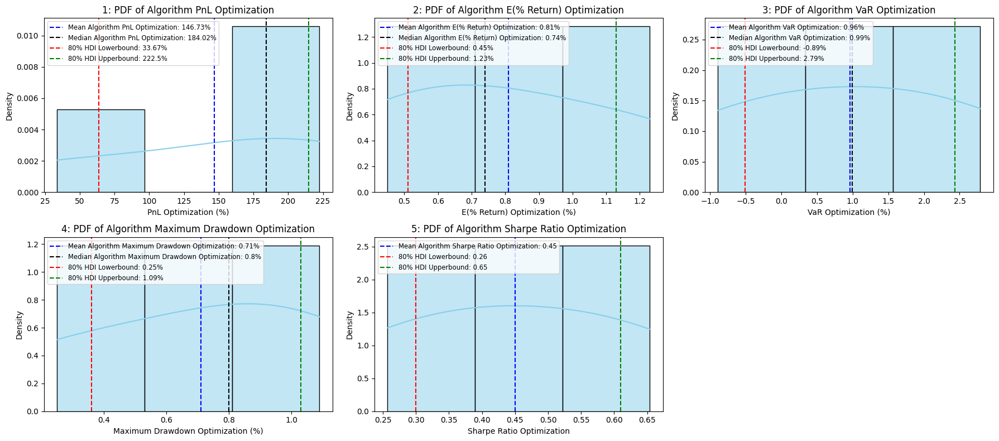

In [ ]:

plt.figure(figsize=(18,8))
plt.subplot(2,3,1)
array50=[]

print('1: P&L Optimization')
print('----------------------------------------------------------------')
sns.histplot(PnL_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm PnL Optimization is:",np.mean(PnL_diff_results).round(2).astype(str) + '%')
print("The Median Algorithm PnL Optimization is:", np.median(PnL_diff_results).round(2).astype(str) + '%')
hdi = az.hdi(np.array(PnL_diff_results), hdi_prob=0.8)
for value in hdi:
  value=value.astype(str)+'%'
  array50.append(value)
print('The 80% HDI for Algortithm PnL Optimization is :',array50)

plt.axvline(np.mean(PnL_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm PnL Optimization: '+ (np.mean(PnL_diff_results).round(2)).astype(str) + '%')
plt.axvline(np.median(PnL_diff_results).round(2), color='k', linestyle='--', label='Median Algorithm PnL Optimization: ' + (np.round(np.median(PnL_diff_results), 2)).astype(str) + '%')
plt.axvline(np.percentile(PnL_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (array50[0]))
plt.axvline(np.percentile(PnL_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (array50[1]))

plt.title('1: PDF of Algorithm PnL Optimization')
plt.xlabel('PnL Optimization (%)')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');
############################################################################################################################################################################################################
plt.subplot(2,3,2)

array51=[]

print('\n2: EXPECTATION Optimization')
print('----------------------------------------------------------------')

sns.histplot(expectation_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm E(% Return) Optimization is:",np.mean(expectation_diff_results).round(2).astype(str) + '%')
print("The Median Algorithm E(% Return) Optimization is:", np.median(expectation_diff_results).round(2).astype(str) + '%')
hdi = az.hdi(np.array(expectation_diff_results), hdi_prob=0.8)
for value in hdi:
  value=value.astype(str)+'%'
  array51.append(value)
print('The 80% HDI for Algortithm E(% Return) Optimization is :',array51)

plt.axvline(np.mean(expectation_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm E(% Return) Optimization: '+ (np.mean(expectation_diff_results).round(2)).astype(str) + '%')
plt.axvline(np.median(expectation_diff_results).round(2), color='k', linestyle='--', label='Median Algorithm E(% Return) Optimization: ' + (np.round(np.median(expectation_diff_results), 2)).astype(str) + '%')
plt.axvline(np.percentile(expectation_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (array51[0]))
plt.axvline(np.percentile(expectation_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (array51[1]))

plt.title('2: PDF of Algorithm E(% Return) Optimization')
plt.xlabel('E(% Return) Optimization (%)')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');

############################################################################################################################################################

plt.subplot(2,3,3)

array53=[]

print('\n3: VaR (Value at Risk) Optimization')
print('----------------------------------------------------------------')

sns.histplot(var_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm VaR Optimization is:",np.mean(var_diff_results).round(2).astype(str) + '%')
print("The Median Algorithm VaR Optimization is:", np.median(var_diff_results).round(2).astype(str) + '%')
hdi = az.hdi(np.array(var_diff_results), hdi_prob=0.8)
for value in hdi:
  value=value.astype(str)+'%'
  array53.append(value)
print('The 80% HDI for Algortithm VaR Optimization is :',array53)

plt.axvline(np.mean(var_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm VaR Optimization: '+ (np.mean(var_diff_results).round(2)).astype(str) + '%')
plt.axvline(np.median(var_diff_results).round(2), color='k', linestyle='--', label='Median Algorithm VaR Optimization: ' + (np.round(np.median(var_diff_results), 2)).astype(str) + '%')
plt.axvline(np.percentile(var_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (array53[0]))
plt.axvline(np.percentile(var_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (array53[1]))

plt.title('3: PDF of Algorithm VaR Optimization')
plt.xlabel('VaR Optimization (%)')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');

###################################################################################################################################################################

plt.subplot(2,3,4)

array52=[]

print('\n4: MAXIMUM DRAWDOWN Optimization')
print('----------------------------------------------------------------')

sns.histplot(maxdraw_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm Maximum Drawdown Optimization is:",np.mean(maxdraw_diff_results).round(2).astype(str) + '%')
print("The Median Algorithm Maximum Drawdown Optimization is:", np.median(maxdraw_diff_results).round(2).astype(str) + '%')
hdi = az.hdi(np.array(maxdraw_diff_results), hdi_prob=0.8)
for value in hdi:
  value=value.astype(str)+'%'
  array52.append(value)
print('The 80% HDI for Algortithm Maximum Drawdown Optimization is :',array52)

plt.axvline(np.mean(maxdraw_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm Maximum Drawdown Optimization: '+ (np.mean(maxdraw_diff_results).round(2)).astype(str) + '%')
plt.axvline(np.median(maxdraw_diff_results).round(2), color='k', linestyle='--', label='Median Algorithm Maximum Drawdown Optimization: ' + (np.round(np.median(maxdraw_diff_results), 2)).astype(str) + '%')
plt.axvline(np.percentile(maxdraw_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (array52[0]))
plt.axvline(np.percentile(maxdraw_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (array52[1]))

plt.title('4: PDF of Algorithm Maximum Drawdown Optimization')
plt.xlabel('Maximum Drawdown Optimization (%)')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');

#################################################################################################################################################################################

plt.subplot(2,3,5)


print('\n5: Sharpe Ratio Optimization')
print('----------------------------------------------------------------')

sns.histplot(sharpe_diff_results, kde=True, color='skyblue', stat='density')
print("The Mean Algorithm Sharpe Ratio Optimization is:",np.mean(sharpe_diff_results).round(2))
print("The Median Algorithm Sharpe Ratio Optimization is:", np.median(sharpe_diff_results).round(2))
hdi = az.hdi(np.array(sharpe_diff_results), hdi_prob=0.8)
print('The 80% HDI for Algorithm Sharpe Ratio Optimization is :', hdi)
plt.axvline(np.mean(sharpe_diff_results).round(2), color='blue', linestyle='--',label='Mean Algorithm Sharpe Ratio Optimization: ' + str(np.mean(sharpe_diff_results).round(2)))
plt.axvline(np.percentile(sharpe_diff_results,10).round(2), color='red', linestyle='--',label='80% HDI Lowerbound: '+ (str(hdi[0].round(2))))
plt.axvline(np.percentile(sharpe_diff_results,90).round(2), color='green', linestyle='--',label='80% HDI Upperbound: '+ (str(hdi[1].round(2))))

plt.title('5: PDF of Algorithm Sharpe Ratio Optimization')
plt.xlabel('Sharpe Ratio Optimization')
plt.ylabel('Density')
plt.legend(fontsize='small',loc='upper left');













plt.tight_layout()
plt.show()
